#### SARIMA

/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3

/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3

/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2023.09-0/lib/python3

MSE: 59155871.3418
MAE: 4112.1054
SMAPE: 6.9174%


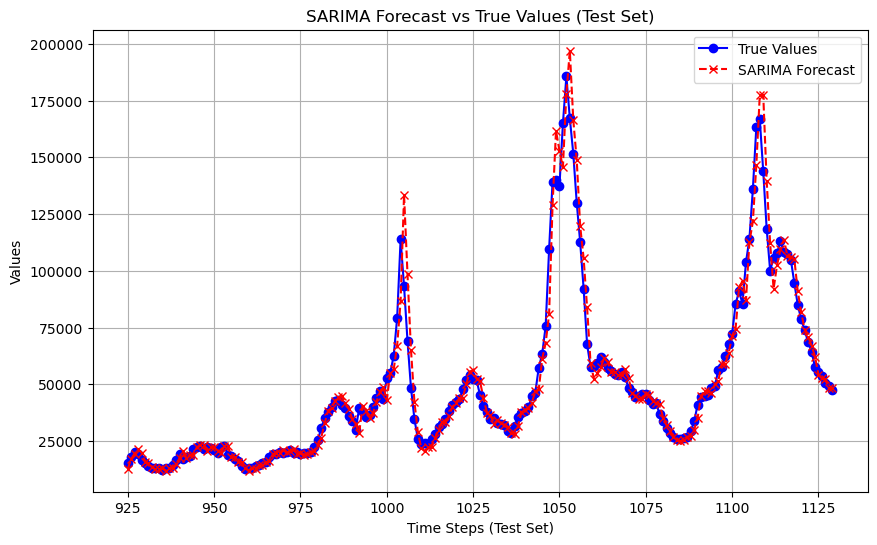

MSE: 214935736.1793
MAE: 7588.9835
SMAPE: 12.6028%


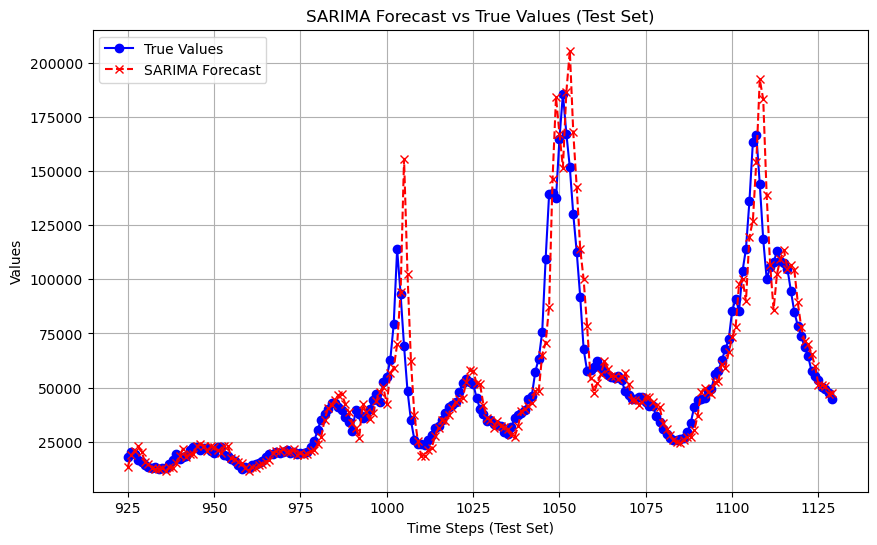

MSE: 423820244.4355
MAE: 10866.0862
SMAPE: 17.9439%


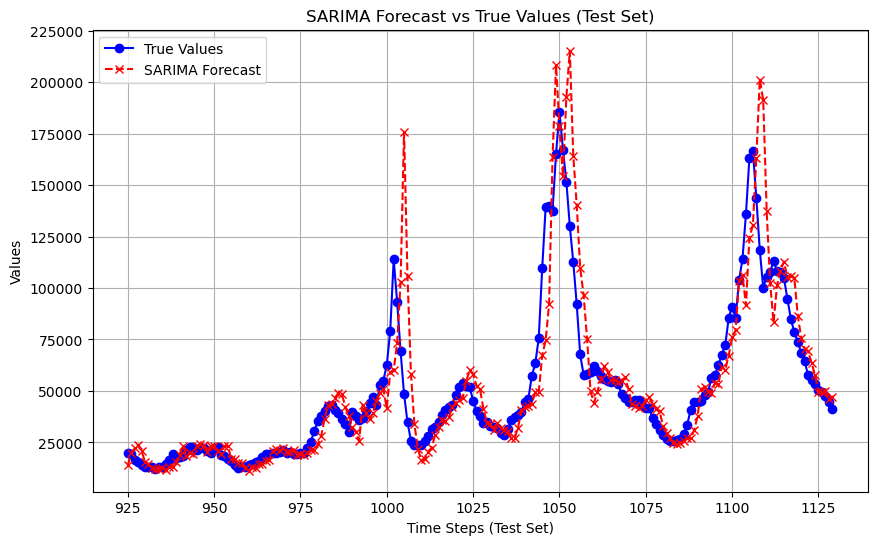

MSE: 659883771.0223
MAE: 13886.5282
SMAPE: 23.0717%


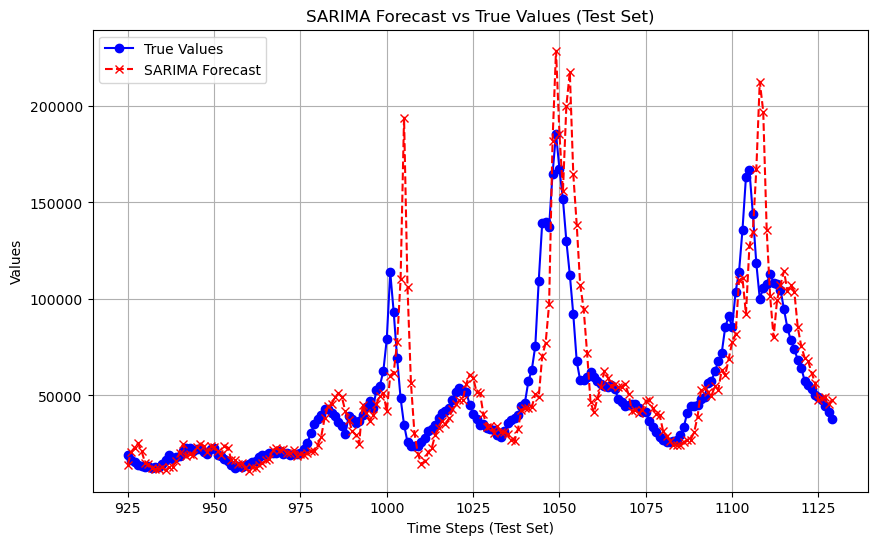

MSE: 932271071.2516
MAE: 17058.1346
SMAPE: 28.0049%


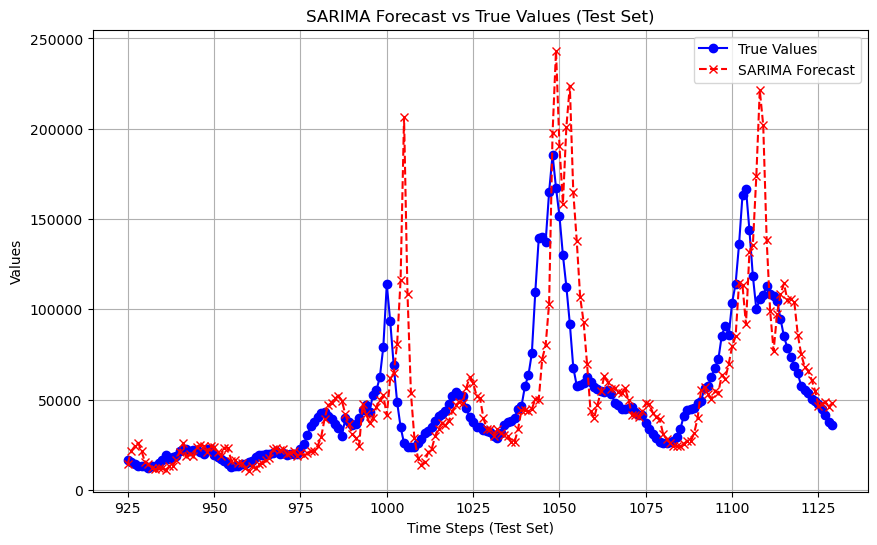

MSE: 1234899089.8520
MAE: 20319.6510
SMAPE: 32.8595%


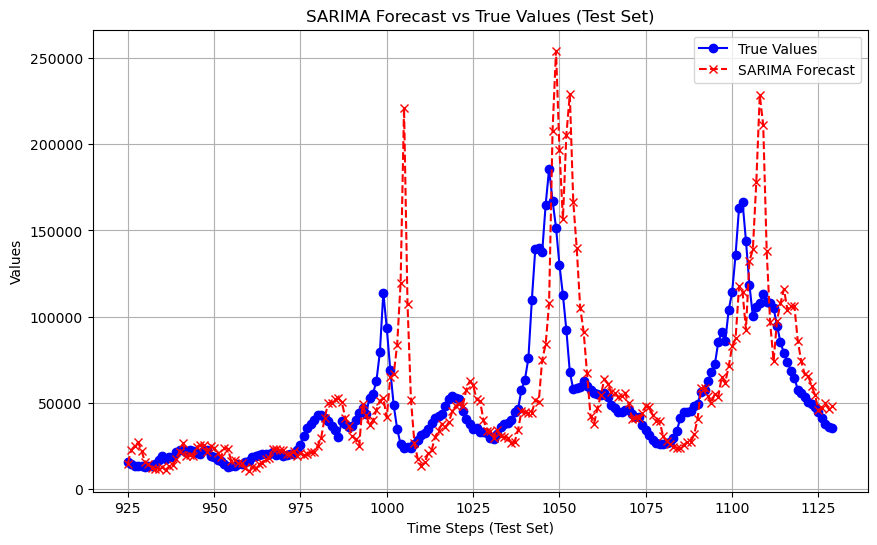

MSE: 1541114293.1463
MAE: 23432.7535
SMAPE: 37.8214%


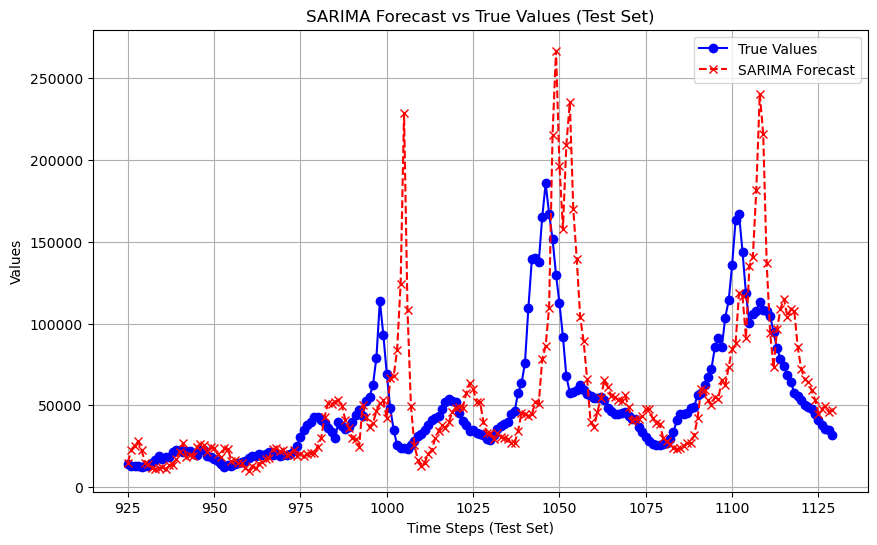

MSE: 1840251307.4045
MAE: 25757.0314
SMAPE: 41.6048%


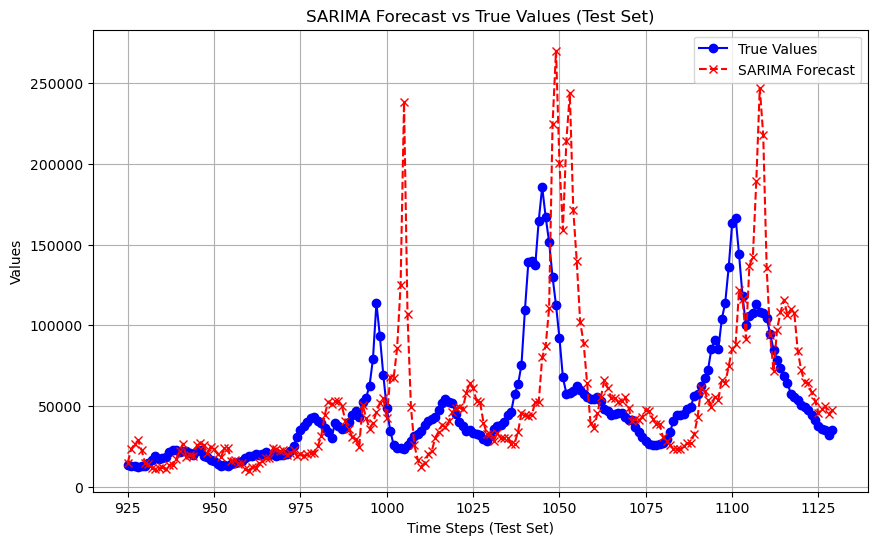

MSE: 2134405159.0819
MAE: 28197.3331
SMAPE: 45.4015%


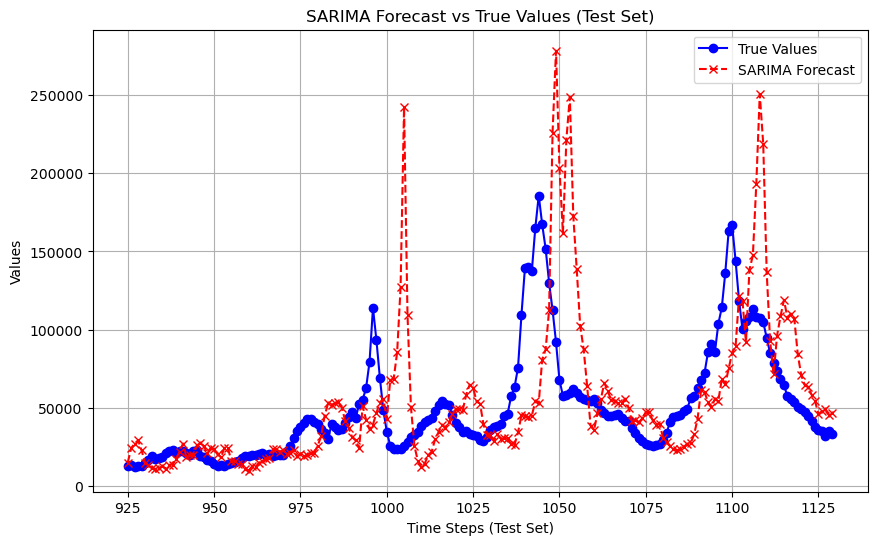

MSE: 2421862542.1615
MAE: 30392.0007
SMAPE: 48.7712%


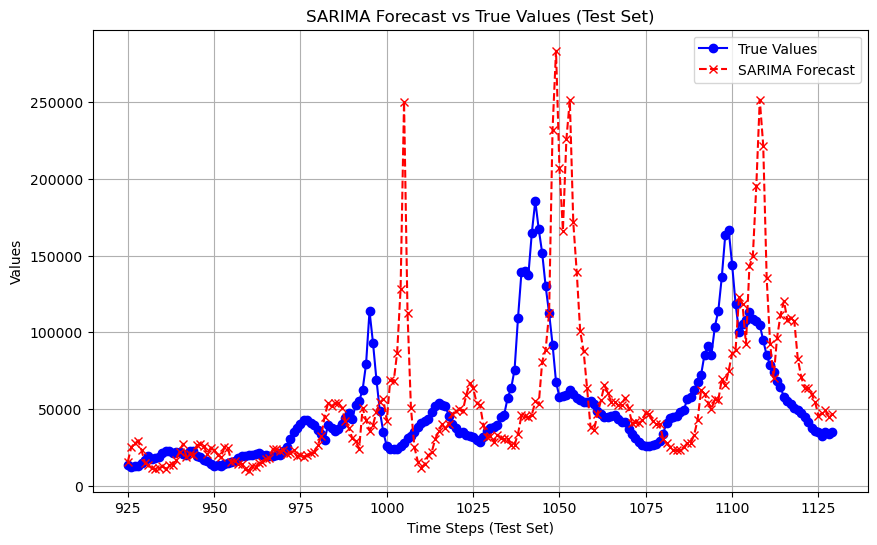

MSE: 2688617112.6335
MAE: 32119.7752
SMAPE: 51.1451%


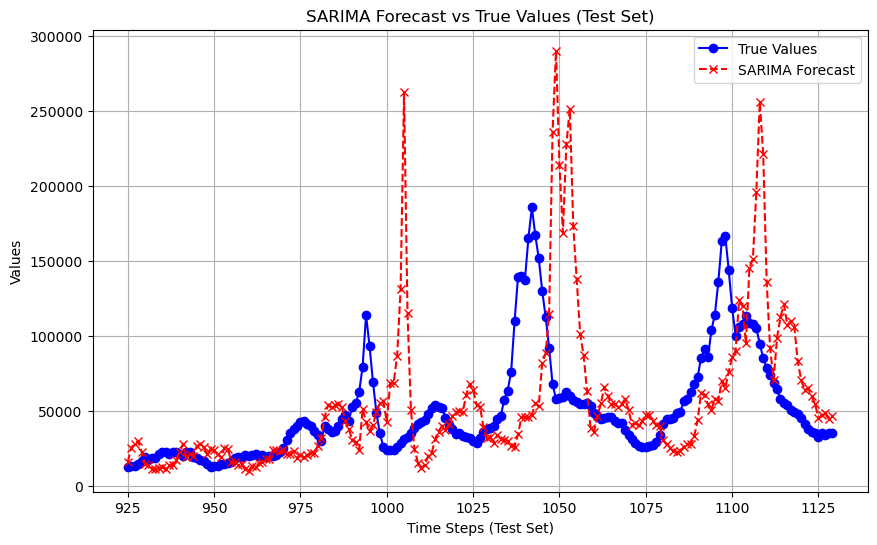

MSE: 2920014164.4084
MAE: 33544.2207
SMAPE: 52.9264%


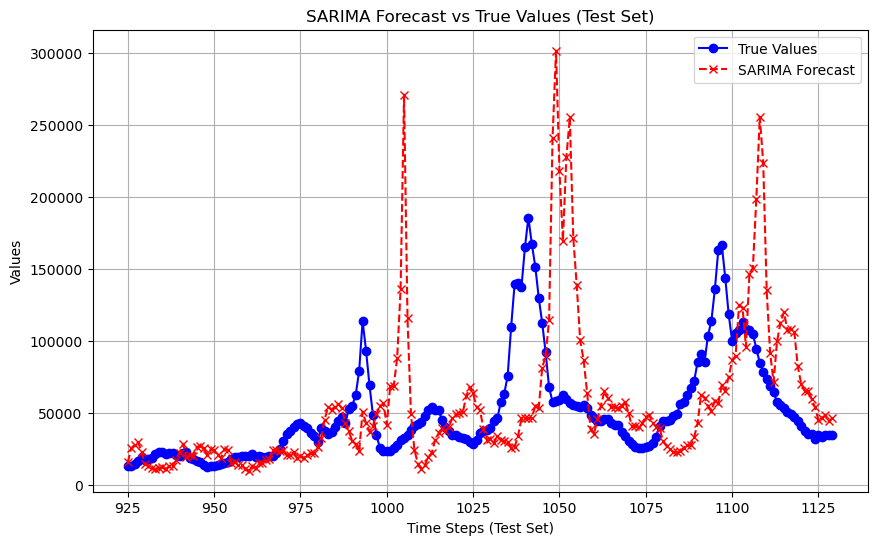

SMAPE Value: 52.9264 | Horizon: 12


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define SARIMA forecasting function
def sarima_forecast(train_series, horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
        model (SARIMAXResults): The fitted SARIMA model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = model.get_forecast(steps=horizon)
    # forecast = sarima_fit.get_prediction(start=len(train), end=len(train) + forecast_steps - 1, dynamic=True)
    return forecast.predicted_mean

# Define function to evaluate SARIMA model with rolling window
def evaluate_sarima(time_series, order, seasonal_order, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        order (tuple): ARIMA (p, d, q) order.
        seasonal_order (tuple): Seasonal (P, D, Q, s) order.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    predictions = np.zeros((len(test_series) - horizon,horizon))
    true_values = np.zeros((len(test_series) - horizon,horizon))

    for i in range(len(test_series) - horizon):
        # Fit SARIMA on rolling window
        # print(i)
        model = SARIMAX(time_series[:split_idx + i], order=order, seasonal_order=seasonal_order)
        model_fitted = model.fit(disp=False)
        forecast = sarima_forecast(time_series[:split_idx + i], horizon, model_fitted)
        predictions[i,:] = (forecast)  # Take the final step forecast
        true_values[i,:] = (test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    for h in range(horizon):
        trues = true_values[horizon:,h]
        preds = predictions[horizon:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        # print("true_values.shape:", true_values.shape)
        # print(np.zeros((len(true_values),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),2)) ))
        preds = np.hstack((preds,np.zeros((len(preds),2)) ))

        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        smape_value = smape(trues, preds)

        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx + horizon, len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx + horizon, len(time_series) - horizon), preds, label='SARIMA Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'SARIMA Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()

    return smape_value

# Example usage
if __name__ == "__main__":
    
    parser = argparse.ArgumentParser(description="Process some files.")
    parser.add_argument('-p', '--p', type=int, required=True, help="p")
    parser.add_argument('-q', '--q', type=int, required=True, help="q")
    parser.add_argument('-P', '--P', type=int, required=True, help="P")
    parser.add_argument('-Q', '--Q', type=int, required=True, help="Q")

    args = parser.parse_args()
    
    # Load your dataset
    df = pd.read_csv('national_illness_24.csv')

    time_series = np.log1p(df['ILITOTAL'].values).reshape(-1,1)  # Log-transform for stabilization
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)

    # Define SARIMA parameters (p, d, q) and seasonal (P, D, Q, s)
    
    p=1
    d=0
    q=1
    P=0
    D=0
    Q=0
    S=9
    
    
    for p in range(1,5):
        for q in range(1,5)
    
        order = (p,d,q)
        seasonal_order = (P,D,Q,S)  # seasonality (s=12)

        # Evaluate SARIMA model for different horizons
        for horizon in range(12, 13):
            smape_value = evaluate_sarima(time_series, order, seasonal_order, horizon)
            print(f"SMAPE Value: {smape_value:.4f} | Horizon: {horizon}")


In [ ]:
bbb

In [4]:
!pwd

/scratch/fs47816/workdir/sample_scripts/time_series_dl/stats_models


#### SARIMA

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define SARIMA forecasting function
def sarima_forecast(train_series, horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
        model (SARIMAXResults): The fitted SARIMA model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = model.get_forecast(steps=horizon)
    # forecast = sarima_fit.get_prediction(start=len(train), end=len(train) + forecast_steps - 1, dynamic=True)
    return forecast.predicted_mean

# Define function to evaluate SARIMA model with rolling window
def evaluate_sarima(time_series, order, seasonal_order, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        order (tuple): ARIMA (p, d, q) order.
        seasonal_order (tuple): Seasonal (P, D, Q, s) order.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    predictions = np.zeros((len(test_series) - horizon,horizon))
    true_values = np.zeros((len(test_series) - horizon,horizon))

    for i in range(len(test_series) - horizon):
        # Fit SARIMA on rolling window
        # print(i)
        model = SARIMAX(time_series[:split_idx + i], order=order, seasonal_order=seasonal_order)
        model_fitted = model.fit(disp=False)
        forecast = sarima_forecast(time_series[:split_idx + i], horizon, model_fitted)
        predictions[i,:] = (forecast)  # Take the final step forecast
        true_values[i,:] = (test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    for h in range(horizon):
        trues = true_values[horizon:,h]
        preds = predictions[horizon:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        # print("true_values.shape:", true_values.shape)
        # print(np.zeros((len(true_values),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),2)) ))
        preds = np.hstack((preds,np.zeros((len(preds),2)) ))

        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        smape_value = smape(trues, preds)

        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx + horizon, len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx + horizon, len(time_series) - horizon), preds, label='SARIMA Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'SARIMA Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()

    return smape_value

# Example usage
if __name__ == "__main__":
    
    parser = argparse.ArgumentParser(description="Process some files.")
    parser.add_argument('-p', '--p', type=int, required=True, help="p")
    parser.add_argument('-q', '--q', type=int, required=True, help="q")
    parser.add_argument('-P', '--P', type=int, required=True, help="P")
    parser.add_argument('-Q', '--Q', type=int, required=True, help="Q")

    args = parser.parse_args()
    
    # Load your dataset
    df = pd.read_csv('national_illness_24.csv')

    time_series = np.log1p(df['ILITOTAL'].values).reshape(-1,1)  # Log-transform for stabilization
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)

    # Define SARIMA parameters (p, d, q) and seasonal (P, D, Q, s)
    
    p=args.p
    d=0
    q=args.q
    P=args.P
    D=0
    Q=args.Q
    S=9
    
    
    order = (p,d,q)
    seasonal_order = (P,D,Q,S)  # seasonality (s=12)

    # Evaluate SARIMA model for different horizons
    for horizon in range(12, 13):
        smape_value = evaluate_sarima(time_series, order, seasonal_order, horizon)
        print(f"SMAPE Value: {smape_value:.4f} | Horizon: {horizon}")


#### Random walk

209 209.60000000000002
(53, 12)
(53, 12)
Horizon: 1
MSE: 99675305.5854
MAE: 7113.6341
SMAPE: 7.9883%


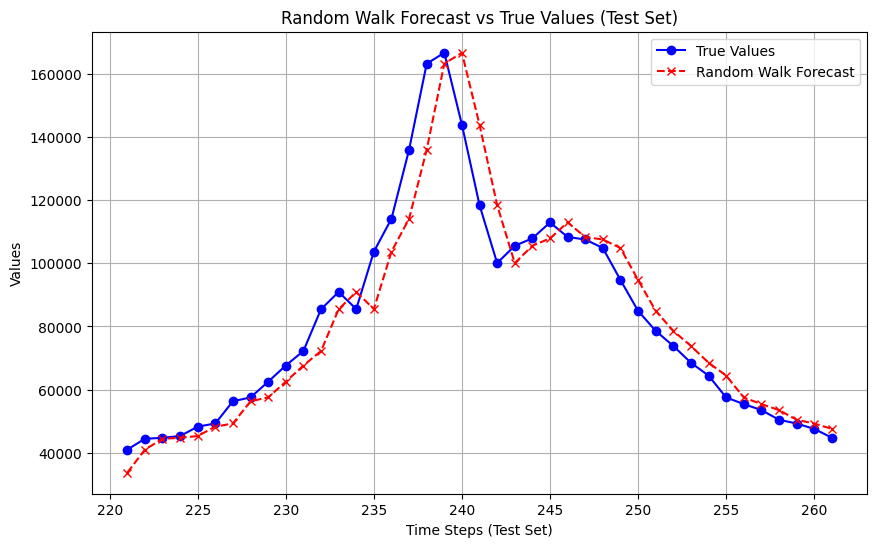

Horizon: 2
MSE: 316908030.4390
MAE: 12944.0000
SMAPE: 14.4948%


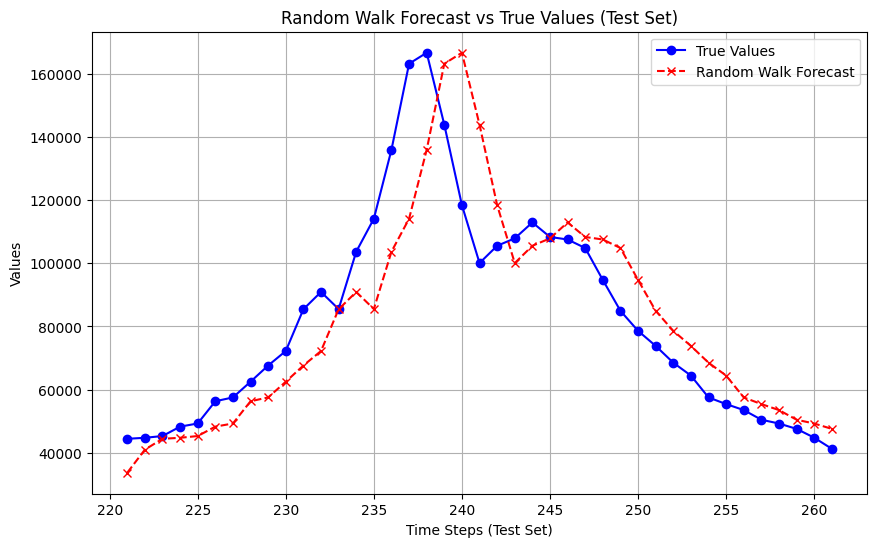

Horizon: 3
MSE: 570403946.6585
MAE: 17962.1707
SMAPE: 20.5429%


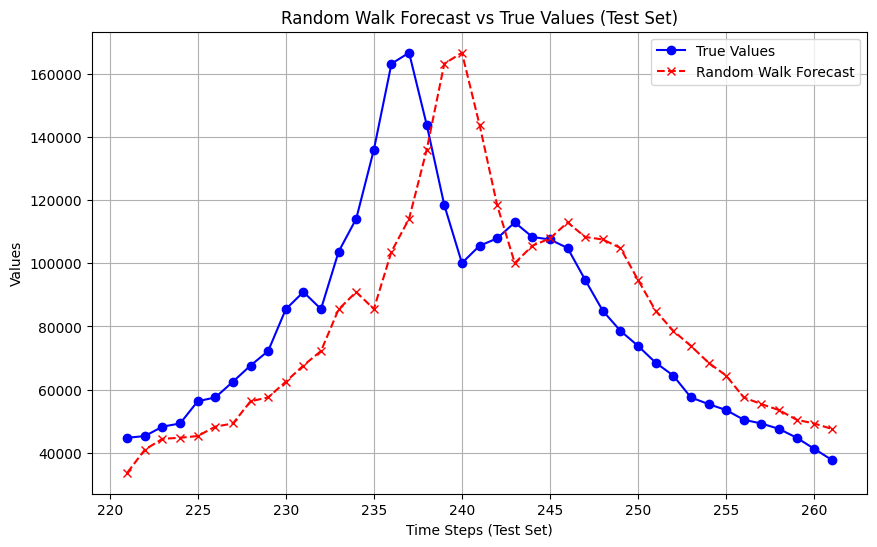

Horizon: 4
MSE: 803750834.8293
MAE: 22368.9268
SMAPE: 26.1570%


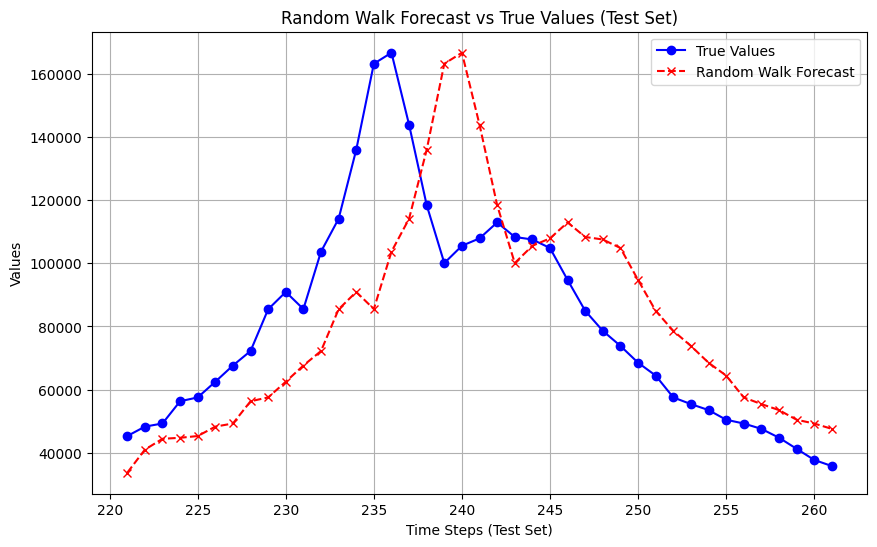

Horizon: 5
MSE: 997418304.4634
MAE: 26047.7805
SMAPE: 31.2026%


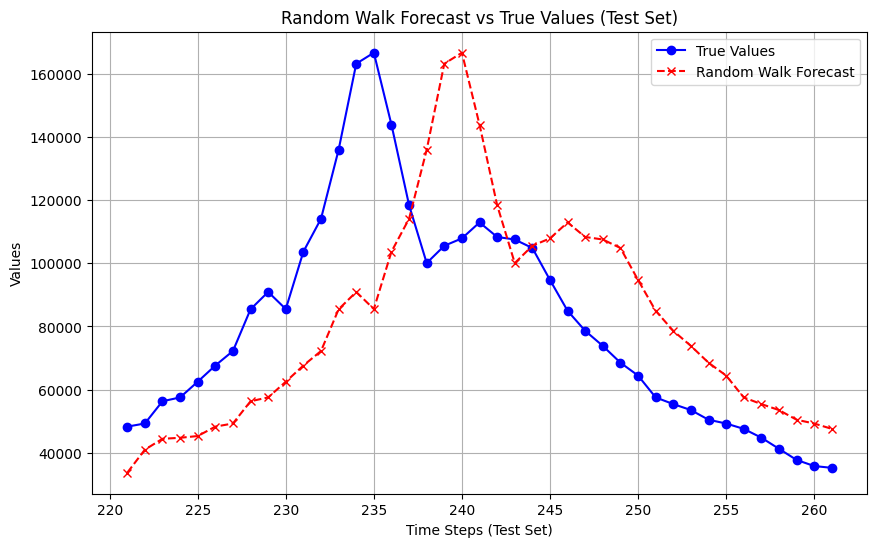

Horizon: 6
MSE: 1187944317.1463
MAE: 29523.8780
SMAPE: 36.0949%


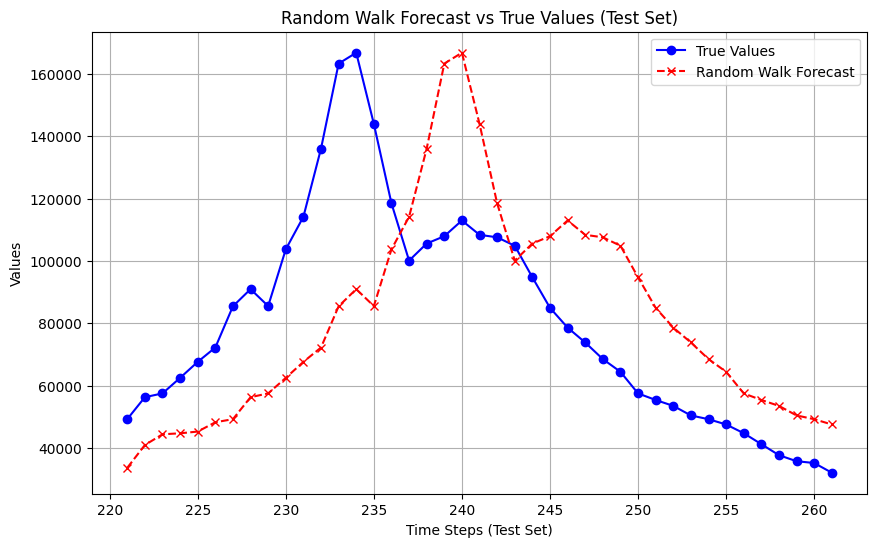

Horizon: 7
MSE: 1409487126.0000
MAE: 32295.6098
SMAPE: 40.0852%


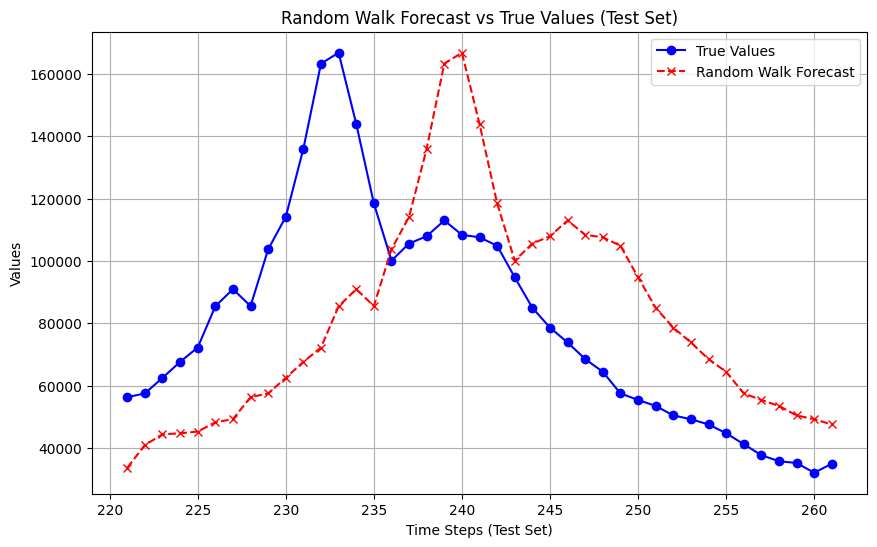

Horizon: 8
MSE: 1657238156.9268
MAE: 35079.2195
SMAPE: 43.9556%


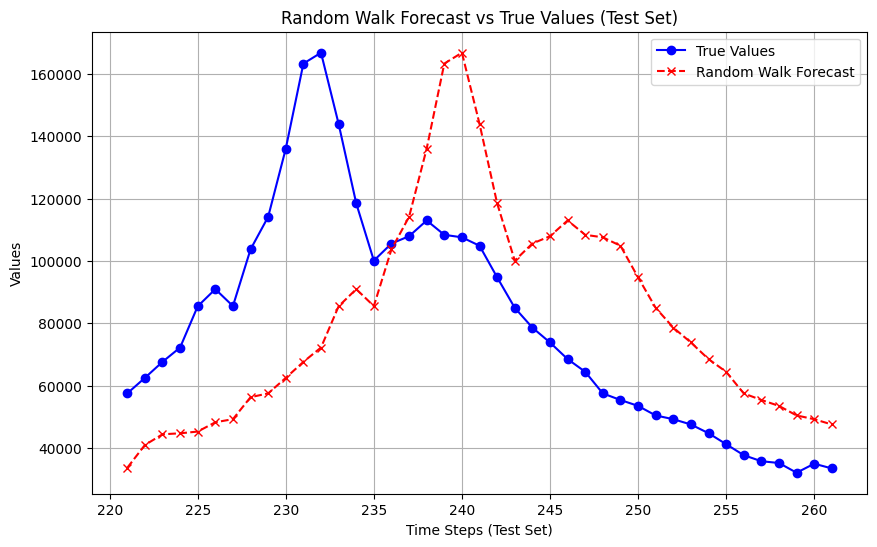

Horizon: 9
MSE: 1943357464.5122
MAE: 38093.1463
SMAPE: 47.9003%


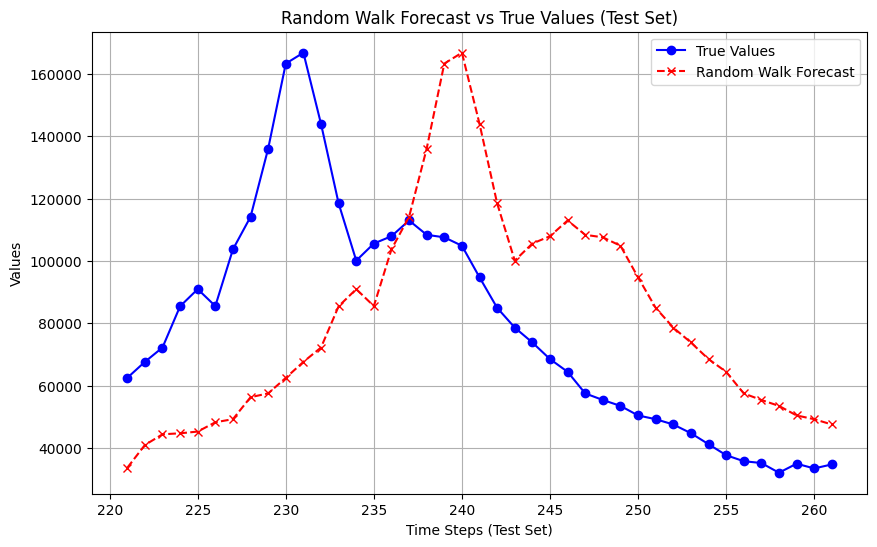

Horizon: 10
MSE: 2242223592.9512
MAE: 41227.2439
SMAPE: 51.8179%


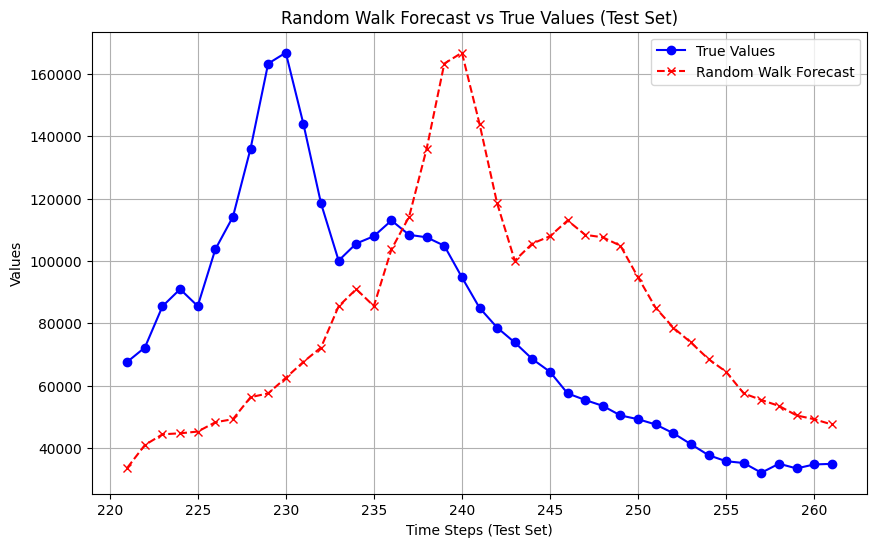

Horizon: 11
MSE: 2548867969.0732
MAE: 44012.2439
SMAPE: 55.3019%


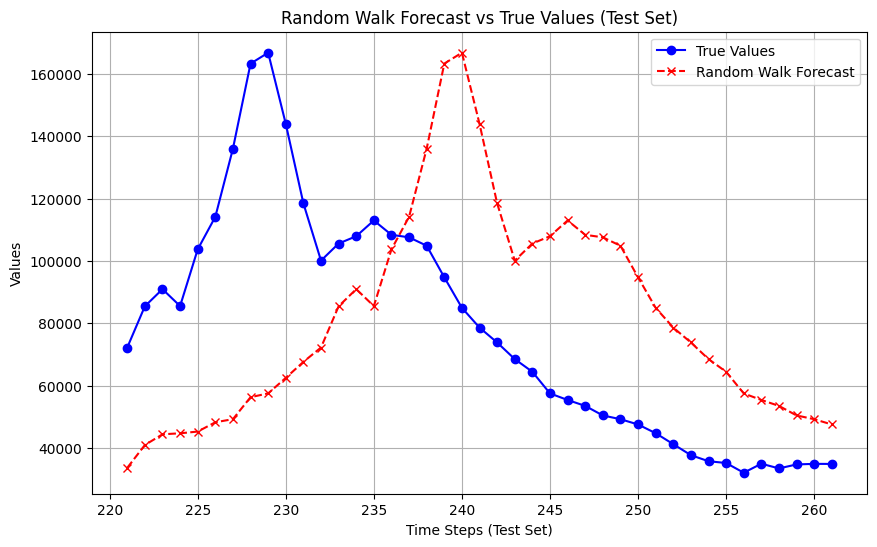

Horizon: 12
MSE: 2851065118.1463
MAE: 46635.5122
SMAPE: 58.5140%


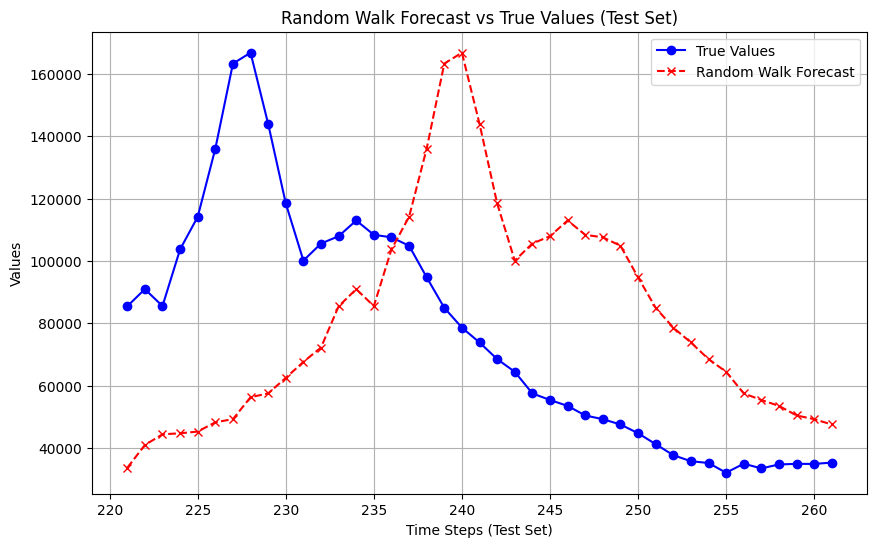

smape_value 58.514032259434536 horizon: 12


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define random walk forecasting function
def random_walk_forecast(train_series, horizon):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = np.full(horizon, train_series[-1])  # Forecast future values as the last observed value
    return forecast

# Define function to evaluate random walk model with rolling window
def evaluate_random_walk(time_series, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets (20%)
    split_idx = int(0.8 * len(time_series))
    print(split_idx,0.8 * len(time_series))

    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    # To cover the entire test set, we start rolling from part of the training set
    rolling_start_idx = max(0, split_idx - horizon)

    # Rolling window predictions: for each step in test, forecast based on the last training value
    predictions = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))
    true_values = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))

    # Rolling window loop: start from `rolling_start_idx` to include all test points
    for i in range(rolling_start_idx, len(time_series) - horizon):
        current_train_series = time_series[:i+1]  # Take the series up to the current point
        forecast = random_walk_forecast(current_train_series, horizon)  # Forecast for the given horizon
        predictions[i-rolling_start_idx,:] = np.array(forecast)
        true_values[i-rolling_start_idx,:] = np.array(time_series[i+1:i + horizon+1])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)
    print(predictions.shape)
    print(true_values.shape)

    for h in range(horizon):
        trues = true_values[horizon:,h]
        preds = predictions[horizon:,h]

        # Compute metrics
        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        smape_value = smape(trues, preds)

        print(f"Horizon: {h+1}")
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx+horizon, len(time_series)), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx+horizon, len(time_series)), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'Random Walk Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (synthetic data)
    # np.random.seed(0)
    # time_series = np.cumsum(np.abs(np.random.randn(100)))  # Simulating a random walk

    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
    time_series = np.array(df['ILITOTAL'])
    horizon = 12  # Forecast horizon (steps ahead)
    for horizon in range(12,13):
        smape_value = evaluate_random_walk(time_series, horizon)
        print("smape_value", smape_value, "horizon:",horizon)


#### Different way random walk

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define random walk forecasting function
def random_walk_forecast(train_series, horizon):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = np.full(horizon, train_series[-1])  # Forecast future values as the last observed value
    return forecast

# Define function to evaluate random walk model with rolling window
def evaluate_random_walk(time_series, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets (20%)
    split_idx = int(0.8 * len(time_series))
    print(split_idx,0.8 * len(time_series))

    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    # To cover the entire test set, we start rolling from part of the training set
    rolling_start_idx = max(0, split_idx ) #"- horizon)""

    # Rolling window predictions: for each step in test, forecast based on the last training value
    predictions = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))
    true_values = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))

    # Rolling window loop: start from `rolling_start_idx` to include all test points
    for i in range(rolling_start_idx, len(time_series) - horizon):
        current_train_series = time_series[:i+1]  # Take the series up to the current point
        forecast = random_walk_forecast(current_train_series, horizon)  # Forecast for the given horizon
        predictions[i-rolling_start_idx,:] = np.array(forecast)
        true_values[i-rolling_start_idx,:] = np.array(time_series[i+1:i + horizon+1])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)
    print(predictions.shape)
    print(true_values.shape)

    
    scalar = StandardScaler()
    scalar.fit(np.log1p(train_series.reshape(-1,1)))
    for h in range(horizon):
        trues = true_values[:,h] #[horizon:,h]
        preds = predictions[:,h] #[horizon:,h]

        # Compute metrics
        trues_norm = scalar.transform(np.log1p(trues.reshape(-1,1)))
        preds_norm = scalar.transform(np.log1p(preds.reshape(-1,1)))
        mse = mean_squared_error(trues_norm, preds_norm)
        mae = mean_absolute_error(trues_norm, preds_norm)
        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
        
#         print(f"Horizon: {h+1}")
#         # Print evaluation metrics
#         print(f"MSE: {mse:.4f}")
#         print(f"MAE: {mae:.4f}")
#         print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
#         plt.figure(figsize=(10, 6))
#         plt.plot(range(split_idx, len(time_series)), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
#         plt.title(f'Random Walk Forecast vs True Values (Test Set)')
#         plt.xlabel('Time Steps (Test Set)')
#         plt.ylabel('Values')
#         plt.legend()
#         plt.grid(True)
#         plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (synthetic data)
    # np.random.seed(0)
    # time_series = np.cumsum(np.abs(np.random.randn(100)))  # Simulating a random walk

    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
    time_series = np.array(df['ILITOTAL'])
    horizon_tot = 48  # Forecast horizon (steps ahead)
    for horizon in range(horizon_tot,horizon_tot+1):
        smape_value = evaluate_random_walk(time_series, horizon)
        print("smape_value", smape_value, "horizon:",horizon)
        
    for horizon in range(horizon_tot):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
        
#     print(f'mean 6, mse: {np.mean(mse_global[:6])}, mse: {np.mean(mae_global[:6])}, smape: {np.mean(smape_global[:6])}')

    print(f'mean, mse: {np.mean(mse_global)}, mse: {np.mean(mae_global)}, smape: {np.mean(smape_global)}')


209 209.60000000000002
(5, 48)
(5, 48)
smape_value 18.044132872556236 horizon: 48
horizon: 0, mse: 0.022207138720367454, mse: 0.10803306249108342, smape: 7.192218709406302
horizon: 1, mse: 0.043925933656147484, mse: 0.16327357005829693, smape: 10.852804898060693
horizon: 2, mse: 0.06947736860798272, mse: 0.2344610887125842, smape: 15.5799771544778
horizon: 3, mse: 0.1059622579319244, mse: 0.3098607261096892, smape: 20.573474477510576
horizon: 4, mse: 0.17404077786486377, mse: 0.4064667878952606, smape: 26.921485969836624
horizon: 5, mse: 0.2633263240183491, mse: 0.5076378291341874, smape: 33.52093439071017
horizon: 6, mse: 0.3979778494088868, mse: 0.6223482295491441, smape: 40.879492125445694
horizon: 7, mse: 0.5731531819477851, mse: 0.7474197857986203, smape: 48.77121039126299
horizon: 8, mse: 0.7982244207258432, mse: 0.8847718030625551, smape: 57.271742494494546
horizon: 9, mse: 0.9638525199959155, mse: 0.9787961292392673, smape: 63.02767600313965
horizon: 10, mse: 1.2332172685766456

#### different way covid

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define random walk forecasting function
def random_walk_forecast(train_series, horizon):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = np.full(horizon, train_series[-1])  # Forecast future values as the last observed value
    return forecast

# Define function to evaluate random walk model with rolling window
def evaluate_random_walk(time_series, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets (20%)
    split_idx = int(0.8 * len(time_series))
    print(split_idx,0.8 * len(time_series))

    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    # To cover the entire test set, we start rolling from part of the training set
    rolling_start_idx = max(0, split_idx ) #"- horizon)""

    # Rolling window predictions: for each step in test, forecast based on the last training value
    predictions = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))
    true_values = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))

    # Rolling window loop: start from `rolling_start_idx` to include all test points
    for i in range(rolling_start_idx, len(time_series) - horizon):
        current_train_series = time_series[:i+1]  # Take the series up to the current point
        forecast = random_walk_forecast(current_train_series, horizon)  # Forecast for the given horizon
        predictions[i-rolling_start_idx,:] = np.array(forecast)
        true_values[i-rolling_start_idx,:] = np.array(time_series[i+1:i + horizon+1])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)
    print(predictions.shape)
    print(true_values.shape)

    
    scalar = StandardScaler()
    scalar.fit(np.log1p(train_series.reshape(-1,1)))
    for h in range(horizon):
        trues = true_values[:,h] #[horizon:,h]
        preds = predictions[:,h] #[horizon:,h]

        # Compute metrics
        trues_norm = scalar.transform(np.log1p(trues.reshape(-1,1)))
        preds_norm = scalar.transform(np.log1p(preds.reshape(-1,1)))
        mse = mean_squared_error(trues_norm, preds_norm)
        mae = mean_absolute_error(trues_norm, preds_norm)
        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
        
#         print(f"Horizon: {h+1}")
#         # Print evaluation metrics
#         print(f"MSE: {mse:.4f}")
#         print(f"MAE: {mae:.4f}")
#         print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
#         plt.figure(figsize=(10, 6))
#         plt.plot(range(split_idx, len(time_series)), trues, label='True Values', color='blue', marker='o', linestyle='-')
#         plt.plot(range(split_idx, len(time_series)), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
#         plt.title(f'Random Walk Forecast vs True Values (Test Set)')
#         plt.xlabel('Time Steps (Test Set)')
#         plt.ylabel('Values')
#         plt.legend()
#         plt.grid(True)
#         plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (synthetic data)
    # np.random.seed(0)
    # time_series = np.cumsum(np.abs(np.random.randn(100)))  # Simulating a random walk

    df = pd.read_csv('./../dataset/rag_data/data/covid_till14May22.csv')
    time_series = np.array(df['new_deaths'])
    horizon_tot = 6  # Forecast horizon (steps ahead)
    for horizon in range(horizon_tot,horizon_tot+1):
        smape_value = evaluate_random_walk(time_series, horizon)
        print("smape_value", smape_value, "horizon:",horizon)
        
    for horizon in range(horizon_tot):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
        
#     print(f'mean 6, mse: {np.mean(mse_global[:6])}, mse: {np.mean(mae_global[:6])}, smape: {np.mean(smape_global[:6])}')

    print(f'mean, mse: {np.mean(mse_global)}, mse: {np.mean(mae_global)}, smape: {np.mean(smape_global)}')


92 92.80000000000001
(18, 6)
(18, 6)
smape_value 75.30147379432267 horizon: 6
horizon: 0, mse: 0.02062140348355414, mse: 0.1292783296921655, smape: 17.798802028688606
horizon: 1, mse: 0.05969523946479768, mse: 0.21777178568765104, smape: 29.73195663114565
horizon: 2, mse: 0.12246353325243968, mse: 0.315251412869576, smape: 42.48890427793774
horizon: 3, mse: 0.2078314261373012, mse: 0.4094153189671655, smape: 54.2161473144391
horizon: 4, mse: 0.3016179387691003, mse: 0.5015607186105627, smape: 65.33876807582233
horizon: 5, mse: 0.4145737048911615, mse: 0.5896182780405451, smape: 75.30147379432267
mean, mse: 0.18780054099972576, mse: 0.36048264064461094, smape: 47.479342020392686


209 209.60000000000002
(53, 12)
(53, 12)
Horizon: 1
MSE: 0.0769
MAE: 0.1862
SMAPE: 7.5843%


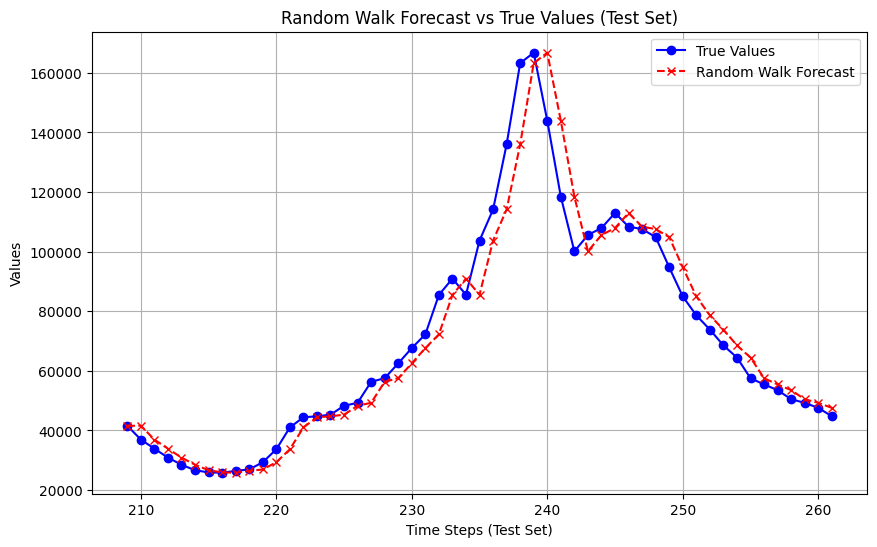

Horizon: 2
MSE: 0.2467
MAE: 0.3454
SMAPE: 14.3592%


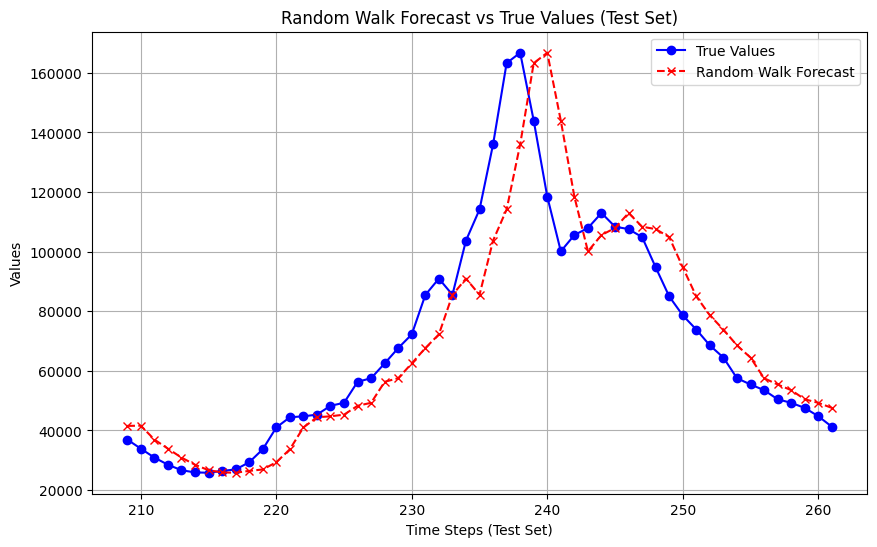

Horizon: 3
MSE: 0.4471
MAE: 0.4837
SMAPE: 20.6259%


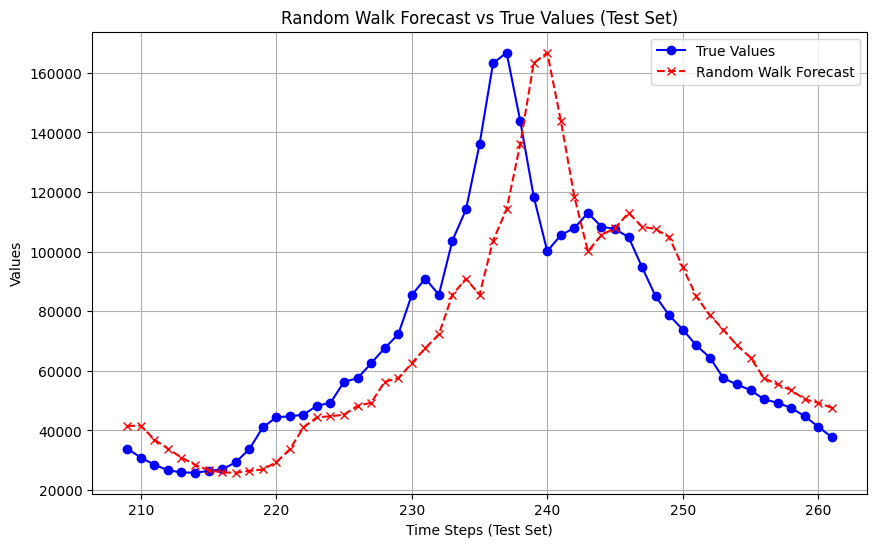

Horizon: 4
MSE: 0.6330
MAE: 0.6053
SMAPE: 26.3667%


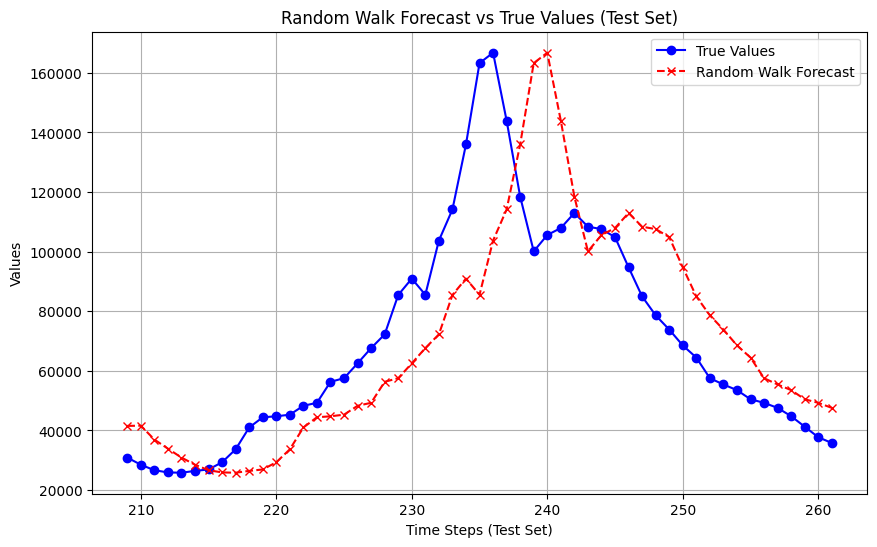

Horizon: 5
MSE: 0.7886
MAE: 0.7075
SMAPE: 31.4782%


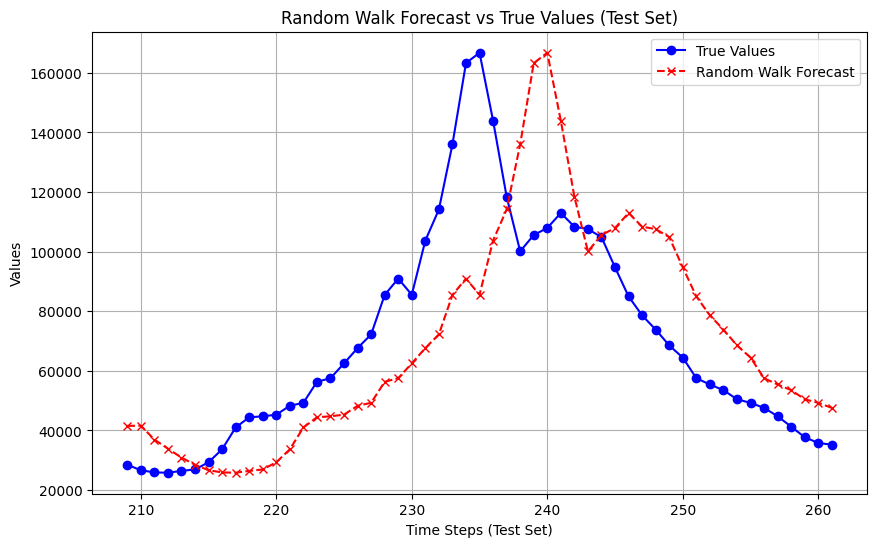

Horizon: 6
MSE: 0.9425
MAE: 0.8034
SMAPE: 36.2187%


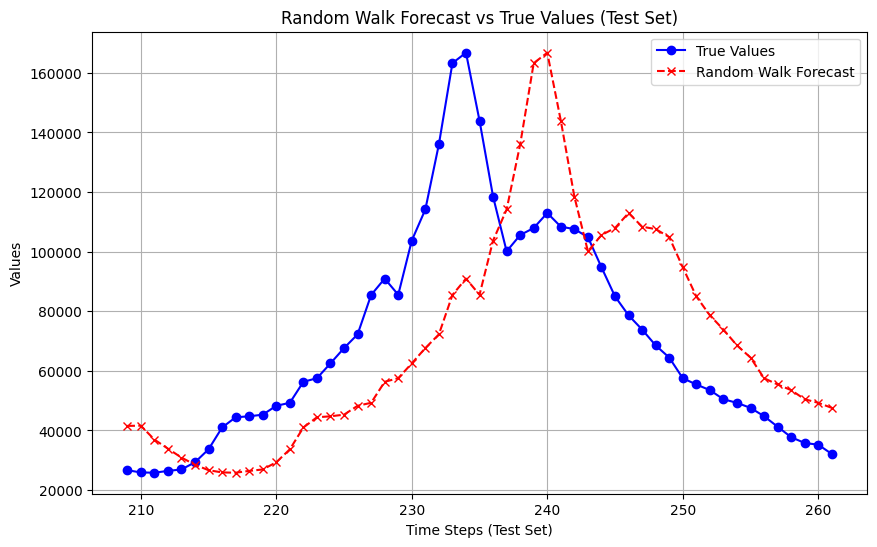

Horizon: 7
MSE: 1.1191
MAE: 0.8806
SMAPE: 40.0707%


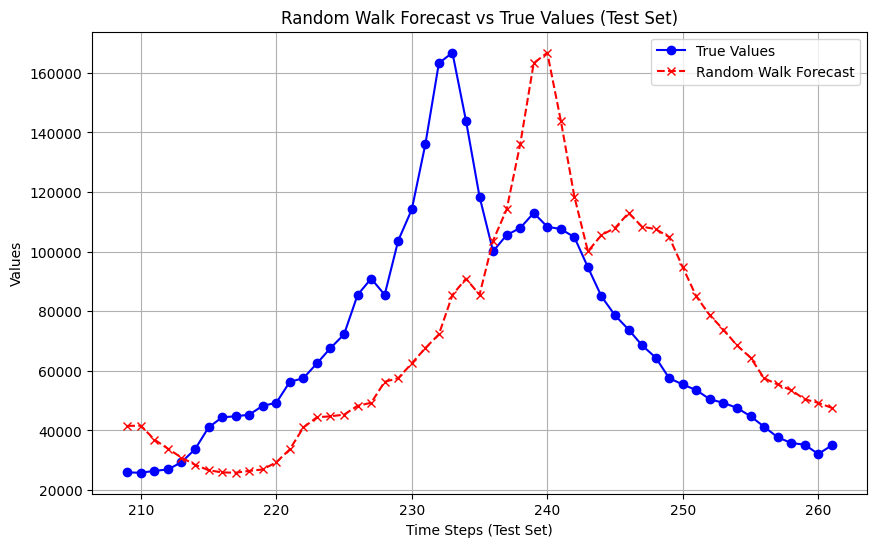

Horizon: 8
MSE: 1.3200
MAE: 0.9601
SMAPE: 43.8193%


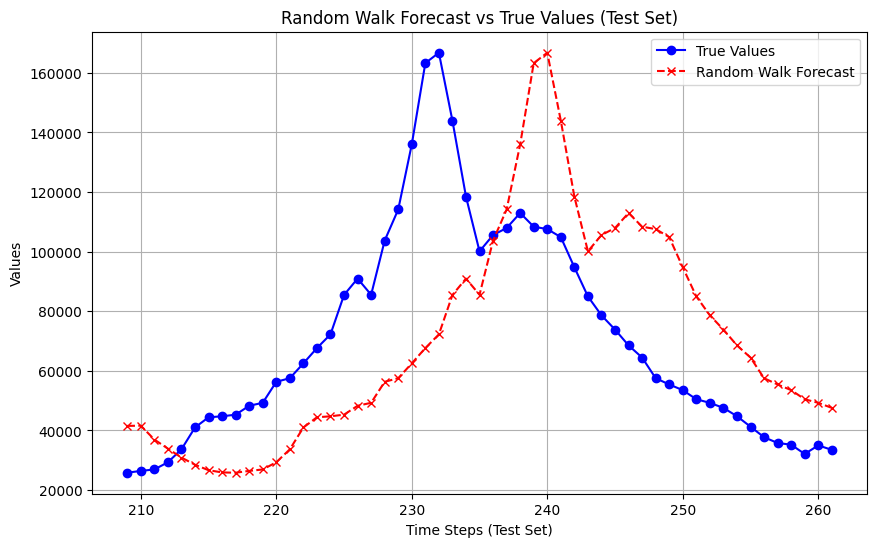

Horizon: 9
MSE: 1.5502
MAE: 1.0425
SMAPE: 47.3313%


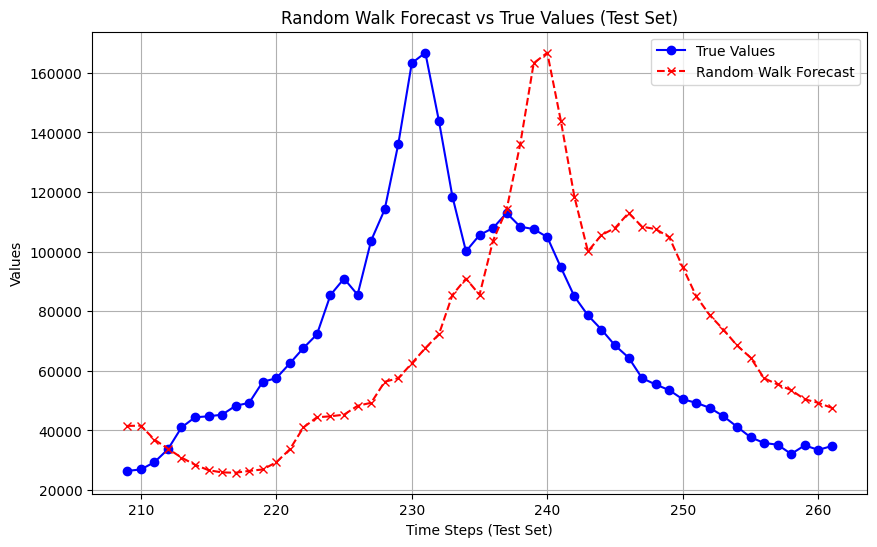

Horizon: 10
MSE: 1.7942
MAE: 1.1308
SMAPE: 50.9853%


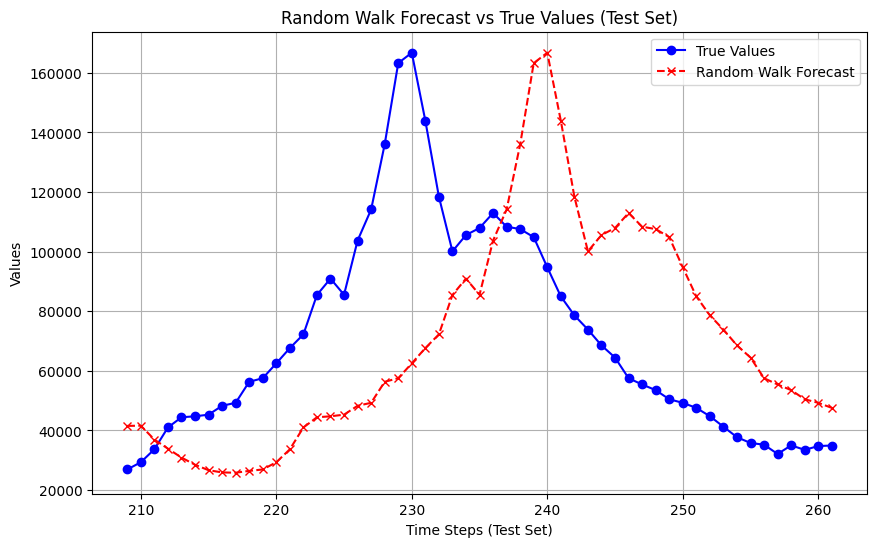

Horizon: 11
MSE: 2.0496
MAE: 1.2104
SMAPE: 54.1388%


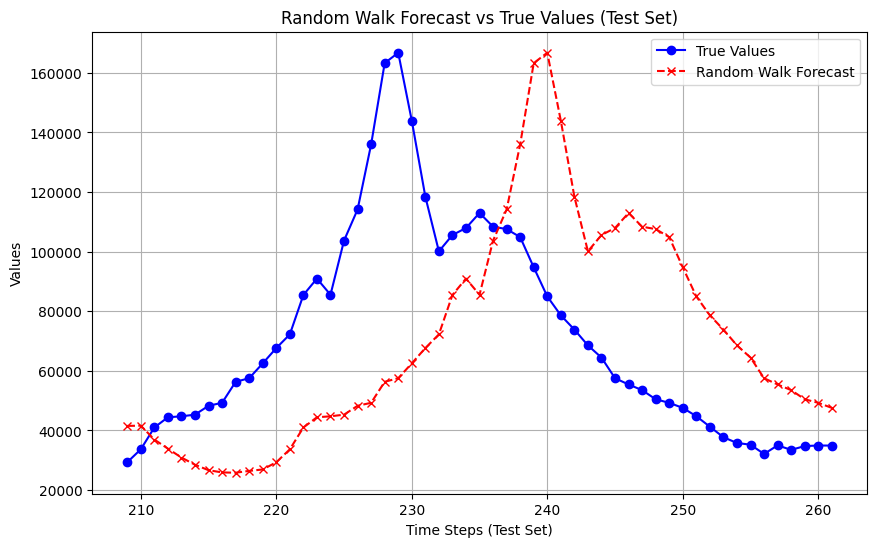

Horizon: 12
MSE: 2.3084
MAE: 1.2855
SMAPE: 56.9503%


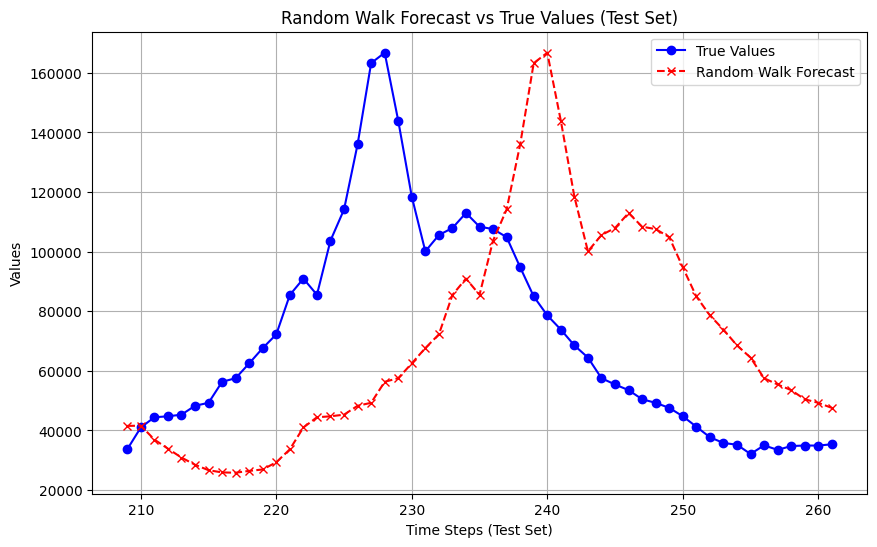

smape_value 56.950302559624625 horizon: 12
horizon: 0, mse: 0.07687084203538859, mse: 0.18618349818830668, smape: 7.584281800610125
horizon: 1, mse: 0.2467060586640788, mse: 0.3453769419861284, smape: 14.359206915749297
horizon: 2, mse: 0.4471331315109556, mse: 0.48367211754922973, smape: 20.62592105438146
horizon: 3, mse: 0.6329676284018206, mse: 0.6052805572388112, smape: 26.366691234344014
horizon: 4, mse: 0.7885547257407037, mse: 0.7075386173747867, smape: 31.478177484155452
horizon: 5, mse: 0.9424797850671558, mse: 0.8033512737653757, smape: 36.21870328477797
horizon: 6, mse: 1.1191204603896359, mse: 0.880646529598946, smape: 40.07073684460637
horizon: 7, mse: 1.3200471014000768, mse: 0.9600865144860963, smape: 43.81929803109394
horizon: 8, mse: 1.5501944074049452, mse: 1.0424817742541226, smape: 47.33129887183119
horizon: 9, mse: 1.7941807870236945, mse: 1.1308318597759237, smape: 50.985265327220375
horizon: 10, mse: 2.04962690982037, mse: 1.2104330092740365, smape: 54.1388312040

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define random walk forecasting function
def random_walk_forecast(train_series, horizon):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = np.full(horizon, train_series[-1])  # Forecast future values as the last observed value
    return forecast

# Define function to evaluate random walk model with rolling window
def evaluate_random_walk(time_series, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets (20%)
    split_idx = int(0.8 * len(time_series))
    print(split_idx,0.8 * len(time_series))

    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    # To cover the entire test set, we start rolling from part of the training set
    rolling_start_idx = max(0, split_idx - horizon)

    # Rolling window predictions: for each step in test, forecast based on the last training value
    predictions = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))
    true_values = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))

    # Rolling window loop: start from `rolling_start_idx` to include all test points
    for i in range(rolling_start_idx, len(time_series) - horizon):
        current_train_series = time_series[:i+1]  # Take the series up to the current point
        forecast = random_walk_forecast(current_train_series, horizon)  # Forecast for the given horizon
        predictions[i-rolling_start_idx,:] = np.array(forecast)
        true_values[i-rolling_start_idx,:] = np.array(time_series[i+1:i + horizon+1])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)
    print(predictions.shape)
    print(true_values.shape)

    
    scalar = StandardScaler()
    scalar.fit(train_series.reshape(-1,1))
    for h in range(horizon):
        trues = true_values[:,h] #[horizon:,h]
        preds = predictions[:,h] #[horizon:,h]

        # Compute metrics
        trues_norm = scalar.transform(trues.reshape(-1,1))
        preds_norm = scalar.transform(preds.reshape(-1,1))
        mse = mean_squared_error(trues_norm, preds_norm)
        mae = mean_absolute_error(trues_norm, preds_norm)
        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
        
        print(f"Horizon: {h+1}")
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx, len(time_series)), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx, len(time_series)), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'Random Walk Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (synthetic data)
    # np.random.seed(0)
    # time_series = np.cumsum(np.abs(np.random.randn(100)))  # Simulating a random walk

    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
    time_series = np.array(df['ILITOTAL'])
    horizon = 12  # Forecast horizon (steps ahead)
    for horizon in range(12,13):
        smape_value = evaluate_random_walk(time_series, horizon)
        print("smape_value", smape_value, "horizon:",horizon)
        
    for horizon in range(12):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')


#### Covid random walk

92 92.80000000000001
(24, 6)
(24, 6)
Horizon: 1
MSE: 0.1326
MAE: 0.3176
SMAPE: 63.5610%


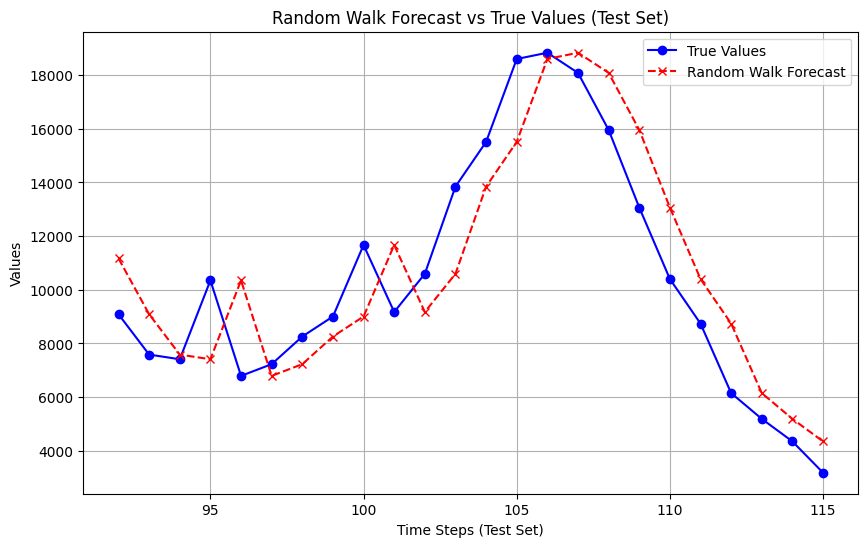

Horizon: 2
MSE: 0.3324
MAE: 0.5037
SMAPE: 63.5610%


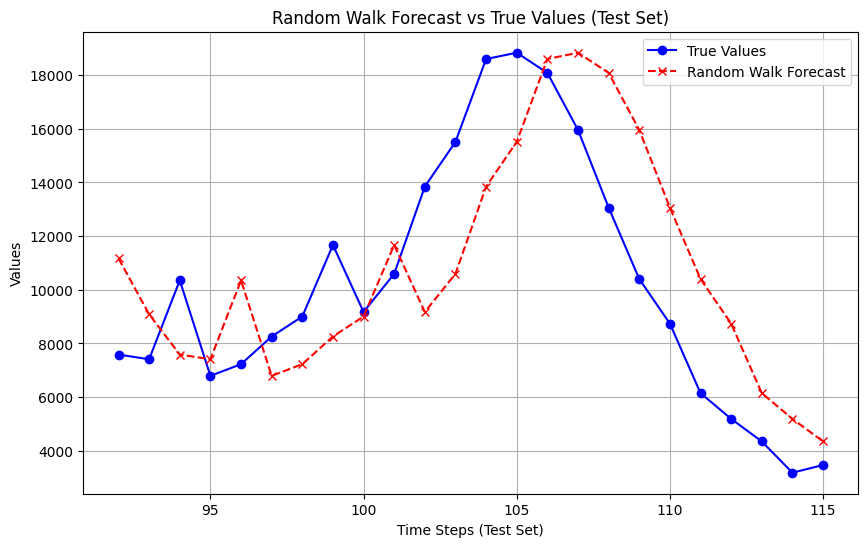

Horizon: 3
MSE: 0.5902
MAE: 0.6475
SMAPE: 63.5610%


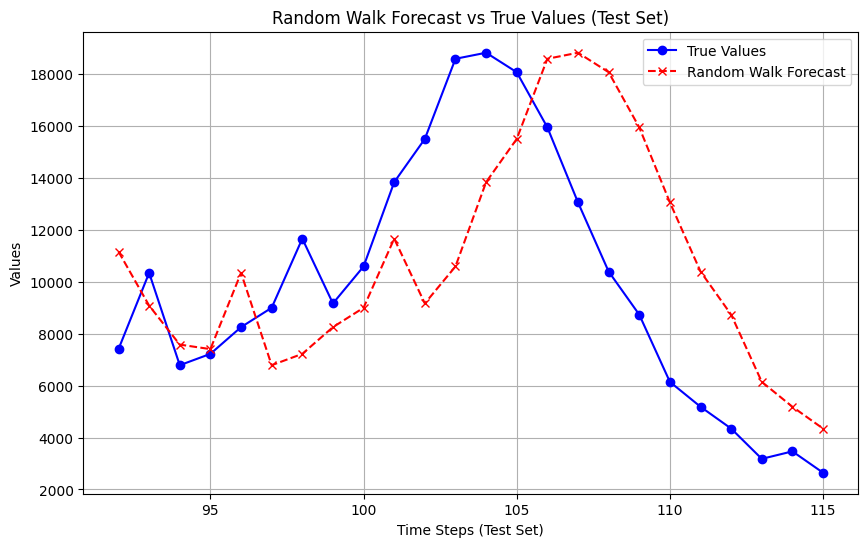

Horizon: 4
MSE: 0.9036
MAE: 0.7835
SMAPE: 63.5610%


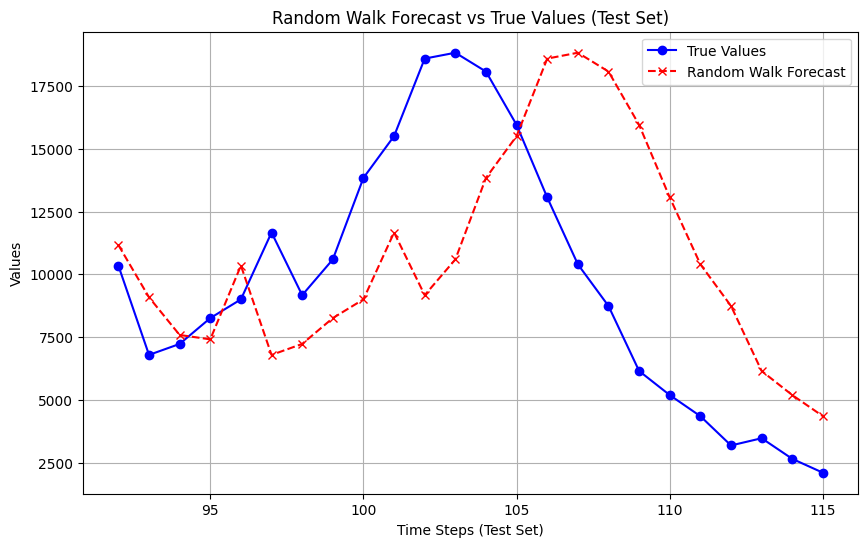

Horizon: 5
MSE: 1.2261
MAE: 0.9378
SMAPE: 63.5610%


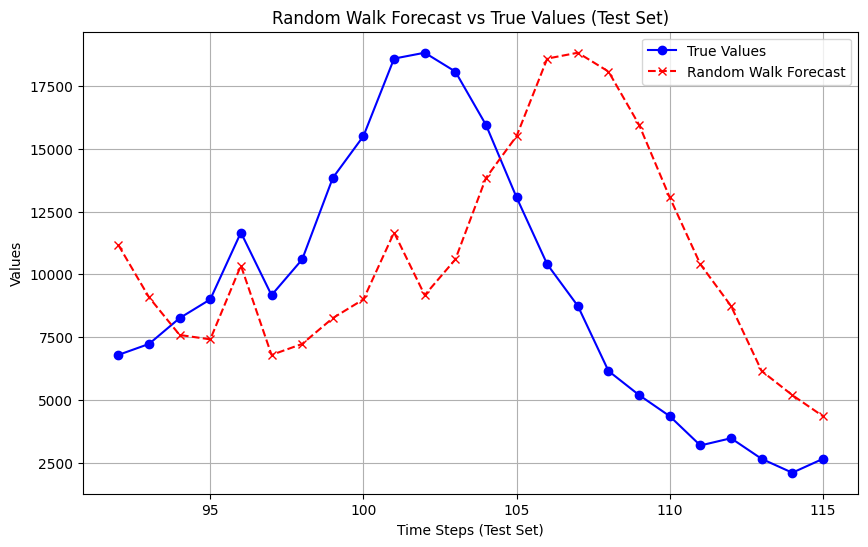

trues_save.shape (24,)
preds_save.shape (24,)
63.56100466320189
Horizon: 6
MSE: 1.5717
MAE: 1.0732
SMAPE: 63.5610%


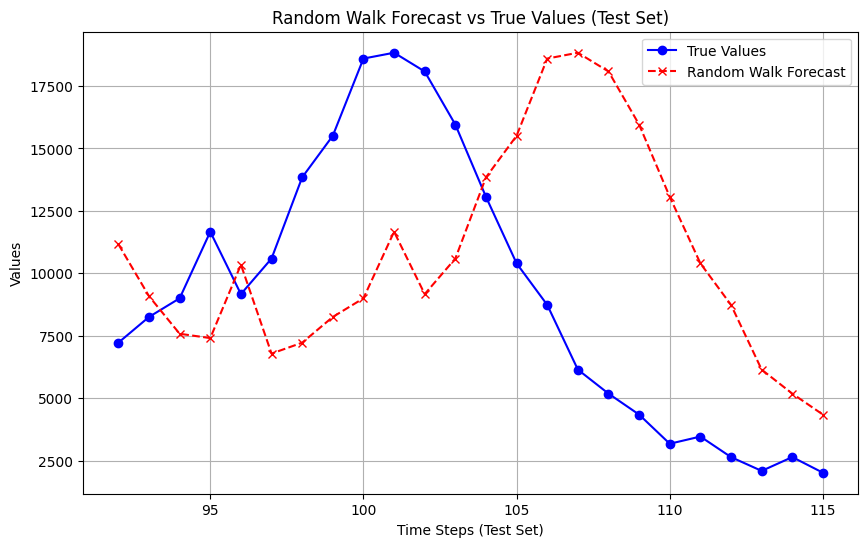

smape_value 63.56100466320189 horizon: 6
horizon: 0, mse: 0.13263108576596053, mse: 0.31761655797883137, smape: 63.56100466320189
horizon: 1, mse: 0.33244920181204357, mse: 0.503743351571344, smape: 63.56100466320189
horizon: 2, mse: 0.5901621674678716, mse: 0.6474946474173092, smape: 63.56100466320189
horizon: 3, mse: 0.9035771754736999, mse: 0.7835251719461028, smape: 63.56100466320189
horizon: 4, mse: 1.2260681241876499, mse: 0.9378222722923434, smape: 63.56100466320189
horizon: 5, mse: 1.5717378134804765, mse: 1.0731650269624233, smape: 63.56100466320189


In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define random walk forecasting function
def random_walk_forecast(train_series, horizon):
    """
    Inputs:
        train_series (array-like): The training part of the time series data.
        horizon (int): The number of steps to forecast.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    forecast = np.full(horizon, train_series[-1])  # Forecast future values as the last observed value
    return forecast

# Define function to evaluate random walk model with rolling window
def evaluate_random_walk(time_series, horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets (20%)
    split_idx = int(0.8 * len(time_series))
    print(split_idx,0.8 * len(time_series))

    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]

    # To cover the entire test set, we start rolling from part of the training set
    rolling_start_idx = max(0, split_idx - horizon)

    # Rolling window predictions: for each step in test, forecast based on the last training value
    predictions = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))
    true_values = np.zeros(( (len(time_series) - horizon)-rolling_start_idx ,horizon))

    # Rolling window loop: start from `rolling_start_idx` to include all test points
    for i in range(rolling_start_idx, len(time_series) - horizon):
        current_train_series = time_series[:i+1]  # Take the series up to the current point
        forecast = random_walk_forecast(current_train_series, horizon)  # Forecast for the given horizon
        predictions[i-rolling_start_idx,:] = np.array(forecast)
        true_values[i-rolling_start_idx,:] = np.array(time_series[i+1:i + horizon+1])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)
    print(predictions.shape)
    print(true_values.shape)

    
    scalar = StandardScaler()
    scalar.fit(train_series.reshape(-1,1))
    for h in range(horizon):
        trues = true_values[:,h] #[horizon:,h]
        preds = predictions[:,h] #[horizon:,h]

        # Compute metrics
        trues_norm = scalar.transform(trues.reshape(-1,1))
        preds_norm = scalar.transform(preds.reshape(-1,1))
        mse = mean_squared_error(trues_norm, preds_norm)
        mae = mean_absolute_error(trues_norm, preds_norm)
#         print("trues",trues)
#         print("preds",preds)
        if h == 5:
            trues_save = trues
            preds_save = preds
            print("trues_save.shape",trues_save.shape)
            print("preds_save.shape",preds_save.shape)
            print( smape(trues_save, preds_save) )

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
        
        print(f"Horizon: {h+1}")
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx, len(time_series)), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx, len(time_series)), preds, label='Random Walk Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'Random Walk Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (synthetic data)
    # np.random.seed(0)
    # time_series = np.cumsum(np.abs(np.random.randn(100)))  # Simulating a random walk

    df = pd.read_csv('./../dataset/rag_data/data/covid_till14May22.csv')
    time_series = np.array(df['new_deaths'])
    horizon = 12  # Forecast horizon (steps ahead)
    for horizon in range(6,7):
        smape_value = evaluate_random_walk(time_series, horizon)
        print("smape_value", smape_value, "horizon:",horizon)
        
    for horizon in range(6):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')


In [35]:
trues_save

NameError: name 'trues_save' is not defined

In [ ]:
horizon:1 mse:0.016598381102085114, mae:0.11062561720609665, smape:15.236619114875793, dtw:not calculated
horizon:2 mse:0.0223512165248394, mae:0.1193031370639801, smape:16.393019258975983, dtw:not calculated
horizon:3 mse:0.04952087253332138, mae:0.17110705375671387, smape:23.27709197998047, dtw:not calculated
horizon:4 mse:0.08671562373638153, mae:0.2253861129283905, smape:30.39494752883911, dtw:not calculated


#### VARMA

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.40800D-01    |proj g|=  2.05734D+00

At iterate    5    f= -9.03018D-01    |proj g|=  4.15431D-01

At iterate   10    f= -9.14193D-01    |proj g|=  1.07715D-01

At iterate   15    f= -9.20856D-01    |proj g|=  3.82926D-01

At iterate   20    f= -9.22928D-01    |proj g|=  4.12678D-01

At iterate   25    f= -9.25830D-01    |proj g|=  1.61528D-01

At iterate   30    f= -9.27334D-01    |proj g|=  2.28153D-01

At iterate   35    f= -9.30506D-01    |proj g|=  1.84321D-01

At iterate   40    f= -9.32380D-01    |proj g|=  1.30583D-01

At iterate   45    f= -9.35411D-01    |proj g|=  7.18737D-02

At iterate   50    f= -9.37416D-01    |proj g|=  3.78482D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.07458D-01    |proj g|=  3.56380D-01

At iterate   10    f= -9.17985D-01    |proj g|=  8.16118D-02

At iterate   15    f= -9.25816D-01    |proj g|=  8.79538D-02

At iterate   20    f= -9.27868D-01    |proj g|=  1.60795D-01

At iterate   25    f= -9.30333D-01    |proj g|=  3.97614D-02

At iterate   30    f= -9.32713D-01    |proj g|=  6.06646D-02

At iterate   35    f= -9.35960D-01    |proj g|=  4.58074D-02

At iterate   40    f= -9.38581D-01    |proj g|=  6.24456D-02

At iterate   45    f= -9.40691D-01    |proj g|=  8.80837D-02

At iterate   50    f= -9.42977D-01    |proj g|=  9.85738D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.11922D-01    |proj g|=  3.91007D-01

At iterate   10    f= -9.22800D-01    |proj g|=  1.15382D-01

At iterate   15    f= -9.30038D-01    |proj g|=  8.59407D-02

At iterate   20    f= -9.32631D-01    |proj g|=  1.53856D-01

At iterate   25    f= -9.34987D-01    |proj g|=  3.56851D-02

At iterate   30    f= -9.36712D-01    |proj g|=  8.98937D-02

At iterate   35    f= -9.40224D-01    |proj g|=  6.17059D-02

At iterate   40    f= -9.42710D-01    |proj g|=  2.93987D-01

At iterate   45    f= -9.45810D-01    |proj g|=  1.32579D-01

At iterate   50    f= -9.47786D-01    |proj g|=  6.30006D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.22324D-01    |proj g|=  3.12012D-01

At iterate   10    f= -9.33028D-01    |proj g|=  9.21600D-02

At iterate   15    f= -9.40700D-01    |proj g|=  5.77060D-02

At iterate   20    f= -9.42885D-01    |proj g|=  6.08972D-02

At iterate   25    f= -9.45531D-01    |proj g|=  9.50908D-02

At iterate   30    f= -9.47866D-01    |proj g|=  1.46614D-01

At iterate   35    f= -9.51188D-01    |proj g|=  5.68770D-02

At iterate   40    f= -9.54249D-01    |proj g|=  2.09005D-01

At iterate   45    f= -9.56202D-01    |proj g|=  2.25633D-01

At iterate   50    f= -9.58454D-01    |proj g|=  5.31867D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.32331D-01    |proj g|=  2.84103D-01

At iterate   10    f= -9.43199D-01    |proj g|=  1.08532D-01

At iterate   15    f= -9.50350D-01    |proj g|=  3.14403D-01

At iterate   20    f= -9.52371D-01    |proj g|=  2.18148D-01

At iterate   25    f= -9.54837D-01    |proj g|=  8.02421D-02

At iterate   30    f= -9.56693D-01    |proj g|=  6.83414D-02

At iterate   35    f= -9.60068D-01    |proj g|=  5.81920D-02

At iterate   40    f= -9.62261D-01    |proj g|=  6.40769D-02

At iterate   45    f= -9.65021D-01    |proj g|=  1.01823D-01

At iterate   50    f= -9.67129D-01    |proj g|=  1.89544D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.41765D-01    |proj g|=  2.86878D-01

At iterate   10    f= -9.52565D-01    |proj g|=  1.03692D-01

At iterate   15    f= -9.59684D-01    |proj g|=  3.03906D-01

At iterate   20    f= -9.61562D-01    |proj g|=  2.24744D-01

At iterate   25    f= -9.64100D-01    |proj g|=  9.92659D-02

At iterate   30    f= -9.65689D-01    |proj g|=  7.34198D-02

At iterate   35    f= -9.69285D-01    |proj g|=  5.59885D-02

At iterate   40    f= -9.71866D-01    |proj g|=  8.99048D-02

At iterate   45    f= -9.74639D-01    |proj g|=  1.73535D-01

At iterate   50    f= -9.77087D-01    |proj g|=  4.56707D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.49705D-01    |proj g|=  2.84412D-01

At iterate   10    f= -9.60270D-01    |proj g|=  1.00349D-01

At iterate   15    f= -9.67515D-01    |proj g|=  9.74372D-02

At iterate   20    f= -9.69499D-01    |proj g|=  4.69870D-02

At iterate   25    f= -9.72131D-01    |proj g|=  5.69268D-02

At iterate   30    f= -9.74577D-01    |proj g|=  8.06735D-02

At iterate   35    f= -9.77915D-01    |proj g|=  3.60529D-02

At iterate   40    f= -9.81151D-01    |proj g|=  1.17852D-01

At iterate   45    f= -9.83662D-01    |proj g|=  1.37939D-01

At iterate   50    f= -9.85551D-01    |proj g|=  1.50365D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.59153D-01    |proj g|=  2.67811D-01

At iterate   10    f= -9.69995D-01    |proj g|=  8.20991D-02

At iterate   15    f= -9.77047D-01    |proj g|=  4.13397D-02

At iterate   20    f= -9.78995D-01    |proj g|=  6.59470D-02

At iterate   25    f= -9.81368D-01    |proj g|=  5.72554D-02

At iterate   30    f= -9.83078D-01    |proj g|=  4.98837D-02

At iterate   35    f= -9.86002D-01    |proj g|=  5.75536D-02

At iterate   40    f= -9.88643D-01    |proj g|=  1.32264D-01

At iterate   45    f= -9.91654D-01    |proj g|=  7.06203D-02

At iterate   50    f= -9.93599D-01    |proj g|=  5.07043D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -8.63969D-01    |proj g|=  3.12673D-01

At iterate   10    f= -8.75592D-01    |proj g|=  1.37737D-01

At iterate   15    f= -8.83456D-01    |proj g|=  2.30365D-01

At iterate   20    f= -8.85788D-01    |proj g|=  1.16541D-01

At iterate   25    f= -8.88565D-01    |proj g|=  3.29838D-02

At iterate   30    f= -8.90389D-01    |proj g|=  7.41582D-02

At iterate   35    f= -8.94112D-01    |proj g|=  6.53372D-02

At iterate   40    f= -8.96381D-01    |proj g|=  9.91360D-02

At iterate   45    f= -8.99163D-01    |proj g|=  7.21646D-02

At iterate   50    f= -9.01098D-01    |proj g|=  6.07816D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -8.69525D-01    |proj g|=  2.83209D-01

At iterate   10    f= -8.80745D-01    |proj g|=  1.46685D-01

At iterate   15    f= -8.88000D-01    |proj g|=  2.78690D-01

At iterate   20    f= -8.90081D-01    |proj g|=  2.77648D-01

At iterate   25    f= -8.92659D-01    |proj g|=  2.35483D-01

At iterate   30    f= -8.94685D-01    |proj g|=  8.33407D-02

At iterate   35    f= -8.98149D-01    |proj g|=  5.76649D-02

At iterate   40    f= -9.00304D-01    |proj g|=  3.61733D-01

At iterate   45    f= -9.02792D-01    |proj g|=  3.07576D-01

At iterate   50    f= -9.05155D-01    |proj g|=  1.88342D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -8.79208D-01    |proj g|=  2.81156D-01

At iterate   10    f= -8.89191D-01    |proj g|=  1.43278D-01

At iterate   15    f= -8.97200D-01    |proj g|=  1.71055D-01

At iterate   20    f= -8.99588D-01    |proj g|=  4.33718D-02

At iterate   25    f= -9.01842D-01    |proj g|=  9.78179D-02

At iterate   30    f= -9.03504D-01    |proj g|=  1.13818D-01

At iterate   35    f= -9.07148D-01    |proj g|=  1.38945D-01

At iterate   40    f= -9.09748D-01    |proj g|=  9.33158D-02

At iterate   45    f= -9.12693D-01    |proj g|=  4.36203D-02

At iterate   50    f= -9.15071D-01    |proj g|=  7.52995D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -8.89633D-01    |proj g|=  3.27800D-01

At iterate   10    f= -9.00195D-01    |proj g|=  1.15089D-01

At iterate   15    f= -9.07960D-01    |proj g|=  3.50717D-01

At iterate   20    f= -9.09872D-01    |proj g|=  1.47630D-01

At iterate   25    f= -9.12539D-01    |proj g|=  6.09004D-02

At iterate   30    f= -9.13765D-01    |proj g|=  5.35169D-02

At iterate   35    f= -9.17185D-01    |proj g|=  3.50302D-02

At iterate   40    f= -9.19184D-01    |proj g|=  8.93447D-02

At iterate   45    f= -9.22612D-01    |proj g|=  4.80502D-02

At iterate   50    f= -9.25328D-01    |proj g|=  3.53605D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -8.98741D-01    |proj g|=  3.22639D-01

At iterate   10    f= -9.09047D-01    |proj g|=  1.24209D-01

At iterate   15    f= -9.16806D-01    |proj g|=  2.95277D-01

At iterate   20    f= -9.18766D-01    |proj g|=  2.43456D-01

At iterate   25    f= -9.21348D-01    |proj g|=  1.59149D-01

At iterate   30    f= -9.22707D-01    |proj g|=  4.74077D-02

At iterate   35    f= -9.25949D-01    |proj g|=  1.15472D-01

At iterate   40    f= -9.28004D-01    |proj g|=  7.52889D-02

At iterate   45    f= -9.31786D-01    |proj g|=  9.10087D-02

At iterate   50    f= -9.33917D-01    |proj g|=  1.63522D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.05292D-01    |proj g|=  3.17019D-01

At iterate   10    f= -9.15440D-01    |proj g|=  1.30984D-01

At iterate   15    f= -9.23129D-01    |proj g|=  2.98259D-01

At iterate   20    f= -9.25251D-01    |proj g|=  1.31147D-01

At iterate   25    f= -9.28085D-01    |proj g|=  6.10815D-02

At iterate   30    f= -9.29190D-01    |proj g|=  2.95689D-02

At iterate   35    f= -9.31795D-01    |proj g|=  4.07306D-02

At iterate   40    f= -9.34180D-01    |proj g|=  4.37675D-02

At iterate   45    f= -9.37001D-01    |proj g|=  4.88214D-02

At iterate   50    f= -9.40345D-01    |proj g|=  3.99415D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.16360D-01    |proj g|=  3.47254D-01

At iterate   10    f= -9.26754D-01    |proj g|=  1.31680D-01

At iterate   15    f= -9.34410D-01    |proj g|=  2.33317D-01

At iterate   20    f= -9.36692D-01    |proj g|=  1.32137D-01

At iterate   25    f= -9.39408D-01    |proj g|=  4.66286D-02

At iterate   30    f= -9.40616D-01    |proj g|=  9.91545D-02

At iterate   35    f= -9.44239D-01    |proj g|=  7.29655D-02

At iterate   40    f= -9.46674D-01    |proj g|=  2.33387D-01

At iterate   45    f= -9.50038D-01    |proj g|=  7.74339D-02

At iterate   50    f= -9.52133D-01    |proj g|=  5.58754D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.11923D-01    |proj g|=  3.84436D-01

At iterate   10    f= -9.21785D-01    |proj g|=  1.28437D-01

At iterate   15    f= -9.28690D-01    |proj g|=  5.55904D-01

At iterate   20    f= -9.31906D-01    |proj g|=  1.46154D-01

At iterate   25    f= -9.34484D-01    |proj g|=  8.16251D-02

At iterate   30    f= -9.35822D-01    |proj g|=  4.13851D-02

At iterate   35    f= -9.39030D-01    |proj g|=  5.35377D-02

At iterate   40    f= -9.40776D-01    |proj g|=  6.50575D-02

At iterate   45    f= -9.44185D-01    |proj g|=  1.04205D-01

At iterate   50    f= -9.46602D-01    |proj g|=  9.12331D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -8.95992D-01    |proj g|=  3.38401D-01

At iterate   10    f= -9.06219D-01    |proj g|=  1.38116D-01

At iterate   15    f= -9.13827D-01    |proj g|=  3.23306D-01

At iterate   20    f= -9.16098D-01    |proj g|=  9.14758D-02

At iterate   25    f= -9.18583D-01    |proj g|=  1.36596D-01

At iterate   30    f= -9.19940D-01    |proj g|=  6.20071D-02

At iterate   35    f= -9.23487D-01    |proj g|=  1.18894D-01

At iterate   40    f= -9.25796D-01    |proj g|=  1.35093D-01

At iterate   45    f= -9.28639D-01    |proj g|=  1.21994D-01

At iterate   50    f= -9.30752D-01    |proj g|=  9.01842D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.05726D-01    |proj g|=  3.38173D-01

At iterate   10    f= -9.15992D-01    |proj g|=  1.47926D-01

At iterate   15    f= -9.23642D-01    |proj g|=  1.11406D-01

At iterate   20    f= -9.25694D-01    |proj g|=  1.28266D-01

At iterate   25    f= -9.28157D-01    |proj g|=  4.99162D-02

At iterate   30    f= -9.29562D-01    |proj g|=  5.72812D-02

At iterate   35    f= -9.33382D-01    |proj g|=  7.75006D-02

At iterate   40    f= -9.34947D-01    |proj g|=  5.16709D-01

At iterate   45    f= -9.38503D-01    |proj g|=  8.58695D-02

At iterate   50    f= -9.40595D-01    |proj g|=  9.60547D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.10294D-01    |proj g|=  3.48423D-01

At iterate   10    f= -9.20475D-01    |proj g|=  1.49398D-01

At iterate   15    f= -9.28308D-01    |proj g|=  1.75045D-01

At iterate   20    f= -9.30569D-01    |proj g|=  8.83736D-02

At iterate   25    f= -9.33082D-01    |proj g|=  1.50002D-01

At iterate   30    f= -9.34333D-01    |proj g|=  6.03036D-02

At iterate   35    f= -9.37515D-01    |proj g|=  5.21989D-02

At iterate   40    f= -9.39440D-01    |proj g|=  1.03597D-01

At iterate   45    f= -9.42751D-01    |proj g|=  4.46970D-02

At iterate   50    f= -9.45454D-01    |proj g|=  8.75460D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.16129D-01    |proj g|=  3.67249D-01

At iterate   10    f= -9.26284D-01    |proj g|=  1.49780D-01

At iterate   15    f= -9.34114D-01    |proj g|=  1.47521D-01

At iterate   20    f= -9.36622D-01    |proj g|=  7.99712D-02

At iterate   25    f= -9.39144D-01    |proj g|=  1.47483D-01

At iterate   30    f= -9.40314D-01    |proj g|=  4.66886D-02

At iterate   35    f= -9.43279D-01    |proj g|=  7.81867D-02

At iterate   40    f= -9.45022D-01    |proj g|=  2.67505D-01

At iterate   45    f= -9.48341D-01    |proj g|=  2.06591D-01

At iterate   50    f= -9.51012D-01    |proj g|=  5.79073D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.23511D-01    |proj g|=  3.99943D-01

At iterate   10    f= -9.33324D-01    |proj g|=  1.31975D-01

At iterate   15    f= -9.40592D-01    |proj g|=  3.85222D-01

At iterate   20    f= -9.43526D-01    |proj g|=  1.54717D-01

At iterate   25    f= -9.45920D-01    |proj g|=  1.01313D-01

At iterate   30    f= -9.47401D-01    |proj g|=  4.15943D-02

At iterate   35    f= -9.50376D-01    |proj g|=  6.28680D-02

At iterate   40    f= -9.52207D-01    |proj g|=  6.49818D-02

At iterate   45    f= -9.55091D-01    |proj g|=  6.08237D-02

At iterate   50    f= -9.57778D-01    |proj g|=  4.47644D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.23178D-01    |proj g|=  3.76755D-01

At iterate   10    f= -9.32452D-01    |proj g|=  1.42276D-01

At iterate   15    f= -9.39161D-01    |proj g|=  3.45382D-01

At iterate   20    f= -9.41863D-01    |proj g|=  1.24457D-01

At iterate   25    f= -9.44284D-01    |proj g|=  9.23098D-02

At iterate   30    f= -9.45965D-01    |proj g|=  4.65944D-02

At iterate   35    f= -9.49143D-01    |proj g|=  5.19356D-02

At iterate   40    f= -9.51263D-01    |proj g|=  6.80370D-02

At iterate   45    f= -9.54229D-01    |proj g|=  7.54869D-02

At iterate   50    f= -9.56618D-01    |proj g|=  5.31322D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.30571D-01    |proj g|=  3.57005D-01

At iterate   10    f= -9.39937D-01    |proj g|=  1.55416D-01

At iterate   15    f= -9.46984D-01    |proj g|=  1.85263D-01

At iterate   20    f= -9.49191D-01    |proj g|=  9.22236D-02

At iterate   25    f= -9.51711D-01    |proj g|=  8.02779D-02

At iterate   30    f= -9.52864D-01    |proj g|=  3.49330D-02

At iterate   35    f= -9.55735D-01    |proj g|=  6.97968D-02

At iterate   40    f= -9.57451D-01    |proj g|=  3.23719D-01

At iterate   45    f= -9.59854D-01    |proj g|=  3.33565D-01

At iterate   50    f= -9.62484D-01    |proj g|=  1.66428D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.36646D-01    |proj g|=  3.63446D-01

At iterate   10    f= -9.45879D-01    |proj g|=  1.55918D-01

At iterate   15    f= -9.52824D-01    |proj g|=  2.31085D-01

At iterate   20    f= -9.55118D-01    |proj g|=  1.13306D-01

At iterate   25    f= -9.57223D-01    |proj g|=  2.83589D-01

At iterate   30    f= -9.58415D-01    |proj g|=  5.65784D-02

At iterate   35    f= -9.61218D-01    |proj g|=  6.58638D-02

At iterate   40    f= -9.63168D-01    |proj g|=  4.52194D-02

At iterate   45    f= -9.65918D-01    |proj g|=  1.04247D-01

At iterate   50    f= -9.68749D-01    |proj g|=  2.04124D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.39656D-01    |proj g|=  3.37222D-01

At iterate   10    f= -9.48620D-01    |proj g|=  1.53008D-01

At iterate   15    f= -9.55066D-01    |proj g|=  4.49824D-01

At iterate   20    f= -9.57442D-01    |proj g|=  1.36016D-01

At iterate   25    f= -9.59367D-01    |proj g|=  2.28465D-01

At iterate   30    f= -9.60639D-01    |proj g|=  5.58153D-02

At iterate   35    f= -9.63144D-01    |proj g|=  6.84197D-02

At iterate   40    f= -9.65260D-01    |proj g|=  4.60978D-02

At iterate   45    f= -9.68098D-01    |proj g|=  6.60202D-02

At iterate   50    f= -9.71030D-01    |proj g|=  2.61019D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.49842D-01    |proj g|=  3.40656D-01

At iterate   10    f= -9.58801D-01    |proj g|=  1.53313D-01

At iterate   15    f= -9.66105D-01    |proj g|=  2.38058D-01

At iterate   20    f= -9.67710D-01    |proj g|=  7.02145D-02

At iterate   25    f= -9.70028D-01    |proj g|=  8.17654D-02

At iterate   30    f= -9.71433D-01    |proj g|=  6.05538D-02

At iterate   35    f= -9.74050D-01    |proj g|=  4.54370D-02

At iterate   40    f= -9.76078D-01    |proj g|=  5.52022D-02

At iterate   45    f= -9.78749D-01    |proj g|=  1.32857D-01

At iterate   50    f= -9.80813D-01    |proj g|=  1.22364D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.59725D-01    |proj g|=  3.39315D-01

At iterate   10    f= -9.68603D-01    |proj g|=  1.47800D-01

At iterate   15    f= -9.75613D-01    |proj g|=  2.26324D-01

At iterate   20    f= -9.77445D-01    |proj g|=  1.05127D-01

At iterate   25    f= -9.79741D-01    |proj g|=  6.76821D-02

At iterate   30    f= -9.81143D-01    |proj g|=  4.89565D-02

At iterate   35    f= -9.84447D-01    |proj g|=  4.15593D-02

At iterate   40    f= -9.86614D-01    |proj g|=  5.36707D-02

At iterate   45    f= -9.88698D-01    |proj g|=  5.69641D-02

At iterate   50    f= -9.90618D-01    |proj g|=  5.45239D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.69745D-01    |proj g|=  3.42864D-01

At iterate   10    f= -9.78601D-01    |proj g|=  1.53976D-01

At iterate   15    f= -9.85899D-01    |proj g|=  1.66052D-01

At iterate   20    f= -9.87774D-01    |proj g|=  1.14217D-01

At iterate   25    f= -9.89890D-01    |proj g|=  8.70241D-02

At iterate   30    f= -9.91455D-01    |proj g|=  5.75563D-02

At iterate   35    f= -9.94508D-01    |proj g|=  3.11378D-02

At iterate   40    f= -9.96390D-01    |proj g|=  6.73256D-02

At iterate   45    f= -9.99391D-01    |proj g|=  8.98892D-02

At iterate   50    f= -1.00125D+00    |proj g|=  1.10010D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.80268D-01    |proj g|=  3.33909D-01

At iterate   10    f= -9.88964D-01    |proj g|=  1.38758D-01

At iterate   15    f= -9.95829D-01    |proj g|=  1.35626D-01

At iterate   20    f= -9.97561D-01    |proj g|=  5.69353D-02

At iterate   25    f= -1.00006D+00    |proj g|=  1.14244D-01

At iterate   30    f= -1.00130D+00    |proj g|=  4.87326D-02

At iterate   35    f= -1.00437D+00    |proj g|=  5.13559D-02

At iterate   40    f= -1.00614D+00    |proj g|=  2.07035D-01

At iterate   45    f= -1.00851D+00    |proj g|=  5.36764D-01

At iterate   50    f= -1.01115D+00    |proj g|=  1.52096D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.87992D-01    |proj g|=  3.25343D-01

At iterate   10    f= -9.96656D-01    |proj g|=  1.25308D-01

At iterate   15    f= -1.00374D+00    |proj g|=  1.53121D-01

At iterate   20    f= -1.00566D+00    |proj g|=  8.82104D-02

At iterate   25    f= -1.00792D+00    |proj g|=  1.30505D-01

At iterate   30    f= -1.00919D+00    |proj g|=  5.29299D-02

At iterate   35    f= -1.01271D+00    |proj g|=  6.22592D-02

At iterate   40    f= -1.01459D+00    |proj g|=  1.46769D-01

At iterate   45    f= -1.01741D+00    |proj g|=  8.96010D-02

At iterate   50    f= -1.01921D+00    |proj g|=  6.14004D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -9.97193D-01    |proj g|=  3.12525D-01

At iterate   10    f= -1.00571D+00    |proj g|=  1.12492D-01

At iterate   15    f= -1.01283D+00    |proj g|=  2.36180D-01

At iterate   20    f= -1.01480D+00    |proj g|=  3.44371D-01

At iterate   25    f= -1.01705D+00    |proj g|=  7.51570D-02

At iterate   30    f= -1.01802D+00    |proj g|=  1.23829D-01

At iterate   35    f= -1.02077D+00    |proj g|=  4.40309D-02

At iterate   40    f= -1.02256D+00    |proj g|=  6.10486D-02

At iterate   45    f= -1.02525D+00    |proj g|=  1.09956D-01

At iterate   50    f= -1.02733D+00    |proj g|=  1.24608D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -1.00584D+00    |proj g|=  2.93223D-01

At iterate   10    f= -1.01436D+00    |proj g|=  1.19285D-01

At iterate   15    f= -1.02156D+00    |proj g|=  2.69744D-01

At iterate   20    f= -1.02341D+00    |proj g|=  2.57873D-01

At iterate   25    f= -1.02573D+00    |proj g|=  6.11133D-02

At iterate   30    f= -1.02711D+00    |proj g|=  9.31519D-02

At iterate   35    f= -1.02952D+00    |proj g|=  4.36341D-02

At iterate   40    f= -1.03149D+00    |proj g|=  5.47830D-02

At iterate   45    f= -1.03470D+00    |proj g|=  9.06547D-02

At iterate   50    f= -1.03653D+00    |proj g|=  2.58228D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -1.01434D+00    |proj g|=  2.90925D-01

At iterate   10    f= -1.02274D+00    |proj g|=  1.20850D-01

At iterate   15    f= -1.02997D+00    |proj g|=  2.46430D-01

At iterate   20    f= -1.03170D+00    |proj g|=  1.53851D-01

At iterate   25    f= -1.03386D+00    |proj g|=  8.01038D-02

At iterate   30    f= -1.03494D+00    |proj g|=  5.34790D-02

At iterate   35    f= -1.03804D+00    |proj g|=  8.64694D-02

At iterate   40    f= -1.03966D+00    |proj g|=  8.37676D-02

At iterate   45    f= -1.04262D+00    |proj g|=  6.71819D-02

At iterate   50    f= -1.04466D+00    |proj g|=  4.79347D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -1.02416D+00    |proj g|=  2.83186D-01

At iterate   10    f= -1.03247D+00    |proj g|=  1.22904D-01

At iterate   15    f= -1.03966D+00    |proj g|=  1.96456D-01

At iterate   20    f= -1.04092D+00    |proj g|=  7.64577D-02

At iterate   25    f= -1.04260D+00    |proj g|=  8.57120D-02

At iterate   30    f= -1.04438D+00    |proj g|=  6.42527D-02

At iterate   35    f= -1.04633D+00    |proj g|=  1.05636D-01

At iterate   40    f= -1.04890D+00    |proj g|=  4.15637D-02

At iterate   45    f= -1.05102D+00    |proj g|=  7.51432D-02

At iterate   50    f= -1.05339D+00    |proj g|=  1.01659D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -1.03306D+00    |proj g|=  2.68490D-01

At iterate   10    f= -1.04152D+00    |proj g|=  1.26581D-01

At iterate   15    f= -1.04859D+00    |proj g|=  1.16188D-01

At iterate   20    f= -1.05025D+00    |proj g|=  1.24392D-01

At iterate   25    f= -1.05213D+00    |proj g|=  1.73288D-01

At iterate   30    f= -1.05332D+00    |proj g|=  1.20467D-01

At iterate   35    f= -1.05598D+00    |proj g|=  9.03944D-02

At iterate   40    f= -1.05822D+00    |proj g|=  4.84545D-02

At iterate   45    f= -1.06017D+00    |proj g|=  9.25017D-02

At iterate   50    f= -1.06263D+00    |proj g|=  7.46194D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -1.04124D+00    |proj g|=  2.56592D-01

At iterate   10    f= -1.05002D+00    |proj g|=  1.21920D-01

At iterate   15    f= -1.05663D+00    |proj g|=  2.56100D-01

At iterate   20    f= -1.05813D+00    |proj g|=  2.28929D-01

At iterate   25    f= -1.05986D+00    |proj g|=  1.91712D-01

At iterate   30    f= -1.06102D+00    |proj g|=  4.39685D-02

At iterate   35    f= -1.06303D+00    |proj g|=  7.62924D-02

At iterate   40    f= -1.06530D+00    |proj g|=  4.91329D-02

At iterate   45    f= -1.06697D+00    |proj g|=  6.50351D-02

At iterate   50    f= -1.07014D+00    |proj g|=  5.56356D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -1.04766D+00    |proj g|=  2.34322D-01

At iterate   10    f= -1.05696D+00    |proj g|=  1.97748D-01

At iterate   15    f= -1.06345D+00    |proj g|=  9.81587D-02

At iterate   20    f= -1.06513D+00    |proj g|=  3.95701D-02

At iterate   25    f= -1.06718D+00    |proj g|=  2.38483D-02

At iterate   30    f= -1.06858D+00    |proj g|=  1.04607D-01

At iterate   35    f= -1.07124D+00    |proj g|=  4.94617D-02

At iterate   40    f= -1.07326D+00    |proj g|=  1.80652D-01

At iterate   45    f= -1.07618D+00    |proj g|=  1.25829D-01

At iterate   50    f= -1.07741D+00    |proj g|=  1.98056D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -1.05820D+00    |proj g|=  2.16553D-01

At iterate   10    f= -1.06593D+00    |proj g|=  1.39337D-01

At iterate   15    f= -1.07345D+00    |proj g|=  1.69851D-01

At iterate   20    f= -1.07509D+00    |proj g|=  1.86153D-01

At iterate   25    f= -1.07701D+00    |proj g|=  1.06595D-01

At iterate   30    f= -1.07825D+00    |proj g|=  8.87012D-02

At iterate   35    f= -1.08061D+00    |proj g|=  4.13905D-02

At iterate   40    f= -1.08307D+00    |proj g|=  2.47457D-01

At iterate   45    f= -1.08597D+00    |proj g|=  9.18524D-02

At iterate   50    f= -1.08720D+00    |proj g|=  6.79015D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -1.06641D+00    |proj g|=  2.04392D-01

At iterate   10    f= -1.07423D+00    |proj g|=  1.31163D-01

At iterate   15    f= -1.08150D+00    |proj g|=  7.34846D-02

At iterate   20    f= -1.08295D+00    |proj g|=  9.38624D-02

At iterate   25    f= -1.08489D+00    |proj g|=  1.22703D-01

At iterate   30    f= -1.08619D+00    |proj g|=  1.19705D-01

At iterate   35    f= -1.08887D+00    |proj g|=  4.91374D-02

At iterate   40    f= -1.09054D+00    |proj g|=  8.09560D-02

At iterate   45    f= -1.09323D+00    |proj g|=  9.08544D-02

At iterate   50    f= -1.09488D+00    |proj g|=  1.16110D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -1.07491D+00    |proj g|=  1.98895D-01

At iterate   10    f= -1.08295D+00    |proj g|=  1.14782D-01

At iterate   15    f= -1.08987D+00    |proj g|=  7.41789D-02

At iterate   20    f= -1.09163D+00    |proj g|=  9.04877D-02

At iterate   25    f= -1.09353D+00    |proj g|=  5.23227D-02

At iterate   30    f= -1.09470D+00    |proj g|=  5.08489D-02

At iterate   35    f= -1.09719D+00    |proj g|=  6.96825D-02

At iterate   40    f= -1.09929D+00    |proj g|=  2.07171D-01

At iterate   45    f= -1.10159D+00    |proj g|=  1.95232D-01

At iterate   50    f= -1.10337D+00    |proj g|=  8.94875D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f= -1.08493D+00    |proj g|=  1.89095D-01

At iterate   10    f= -1.09344D+00    |proj g|=  1.02197D-01

At iterate   15    f= -1.09982D+00    |proj g|=  1.26594D-01

At iterate   20    f= -1.10153D+00    |proj g|=  1.31069D-01

At iterate   25    f= -1.10337D+00    |proj g|=  5.05228D-02

At iterate   30    f= -1.10467D+00    |proj g|=  6.58283D-02

At iterate   35    f= -1.10699D+00    |proj g|=  6.31726D-02

At iterate   40    f= -1.10859D+00    |proj g|=  7.76422D-02

At iterate   45    f= -1.11100D+00    |proj g|=  9.02624D-02

At iterate   50    f= -1.11294D+00    |proj g|=  8.41989D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


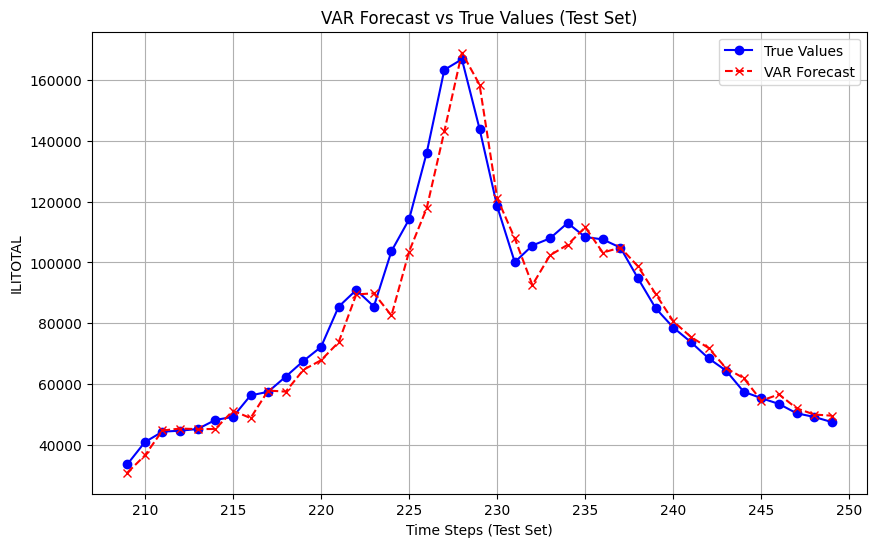

MSE: 0.0509
MAE: 0.1856
SMAPE: 12.6841%


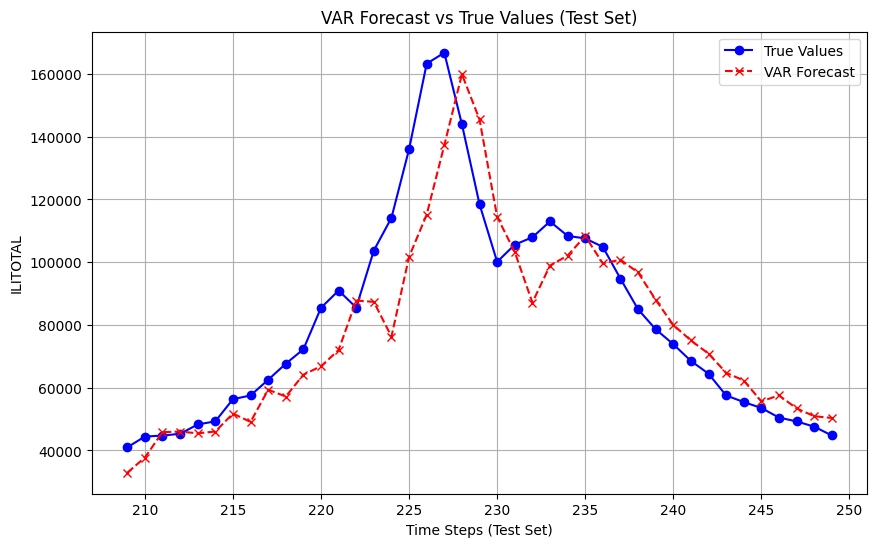

MSE: 0.1068
MAE: 0.2694
SMAPE: 18.3356%


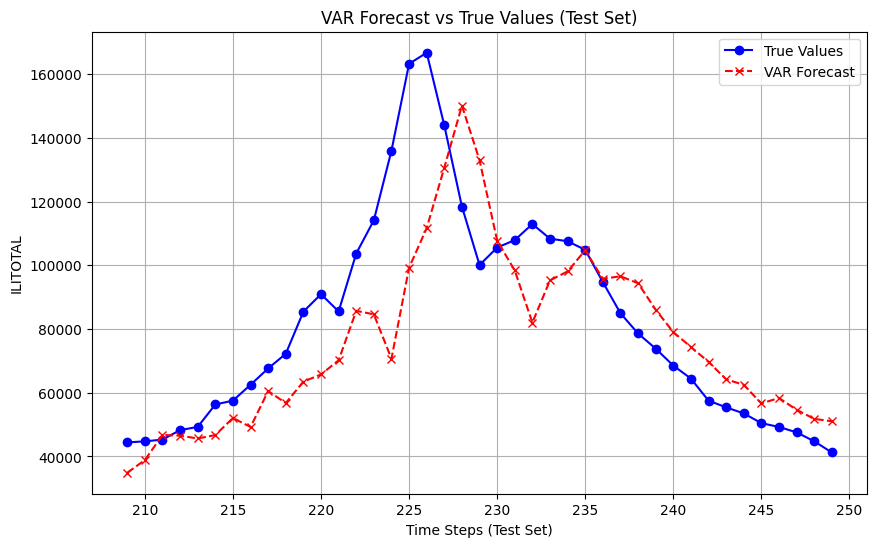

MSE: 0.1749
MAE: 0.3478
SMAPE: 23.5479%


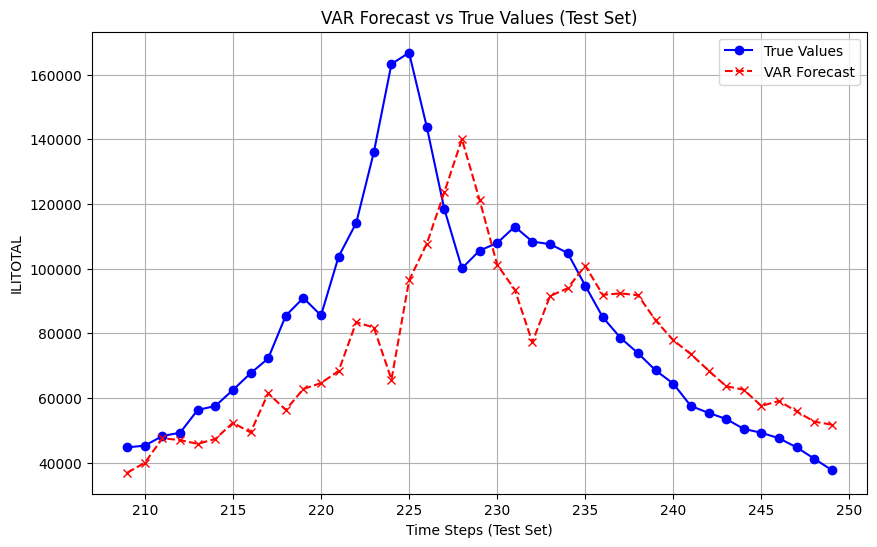

MSE: 0.2440
MAE: 0.4157
SMAPE: 28.0311%


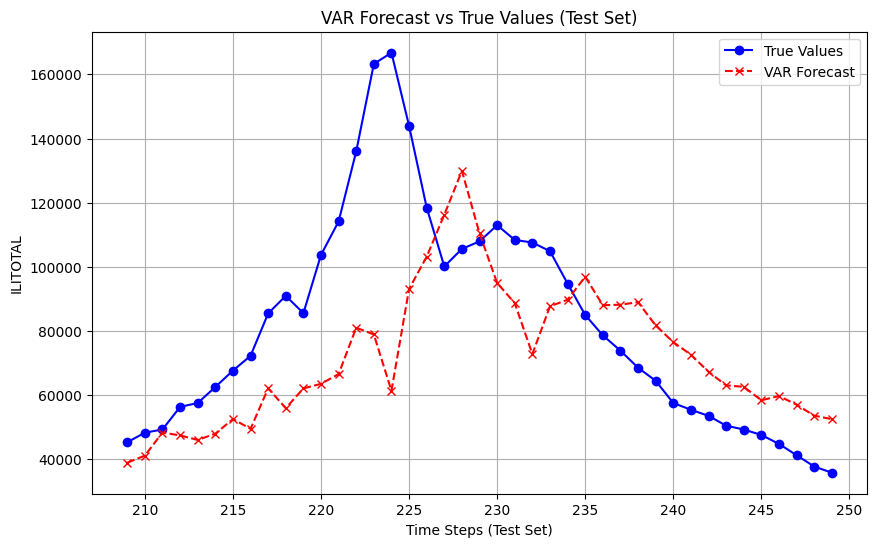

MSE: 0.3121
MAE: 0.4695
SMAPE: 31.5459%


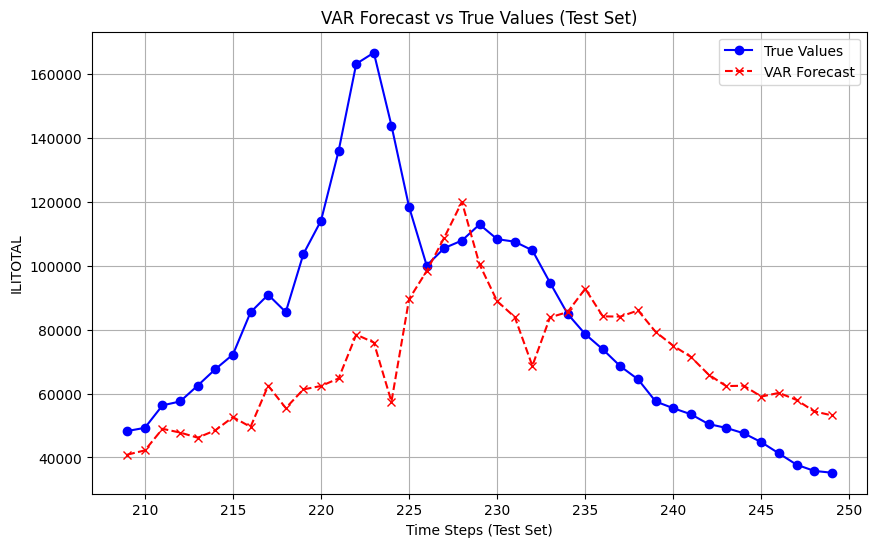

MSE: 0.3866
MAE: 0.5281
SMAPE: 35.3527%


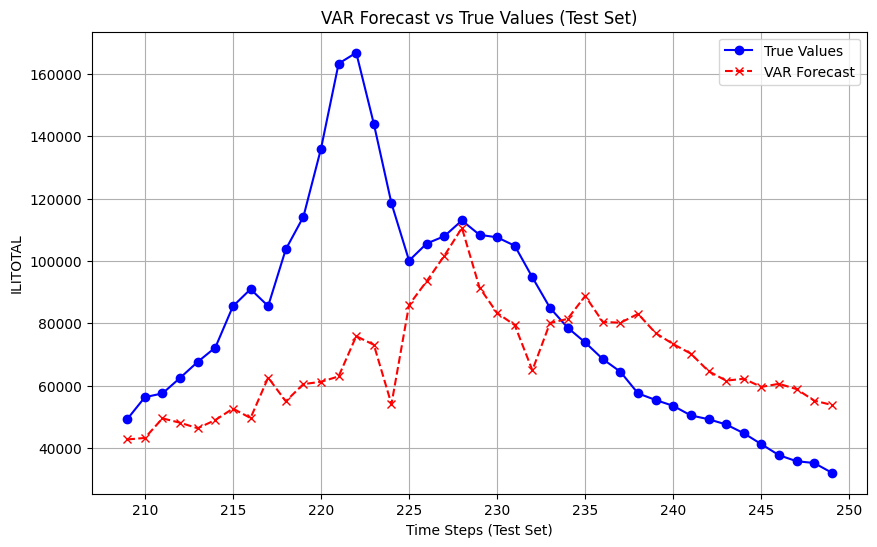

MSE: 0.4529
MAE: 0.5870
SMAPE: 39.2039%


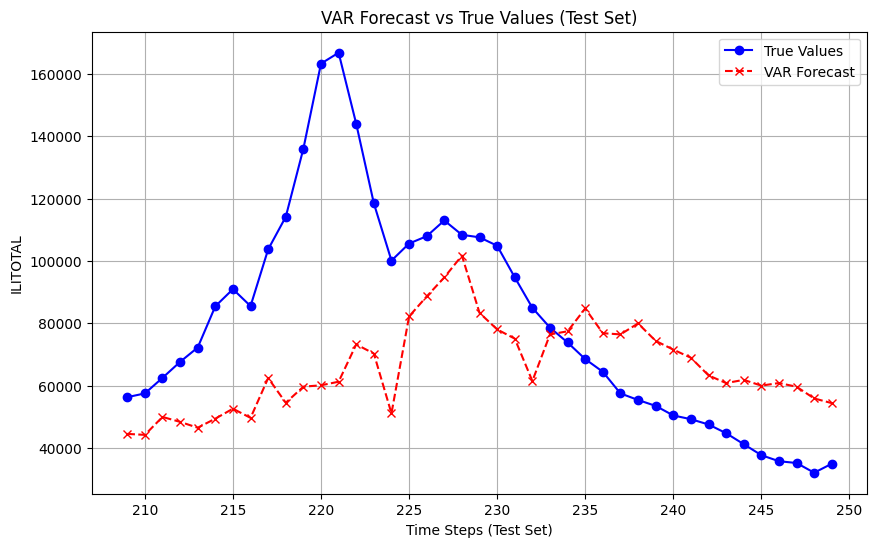

MSE: 0.5293
MAE: 0.6382
SMAPE: 42.4530%


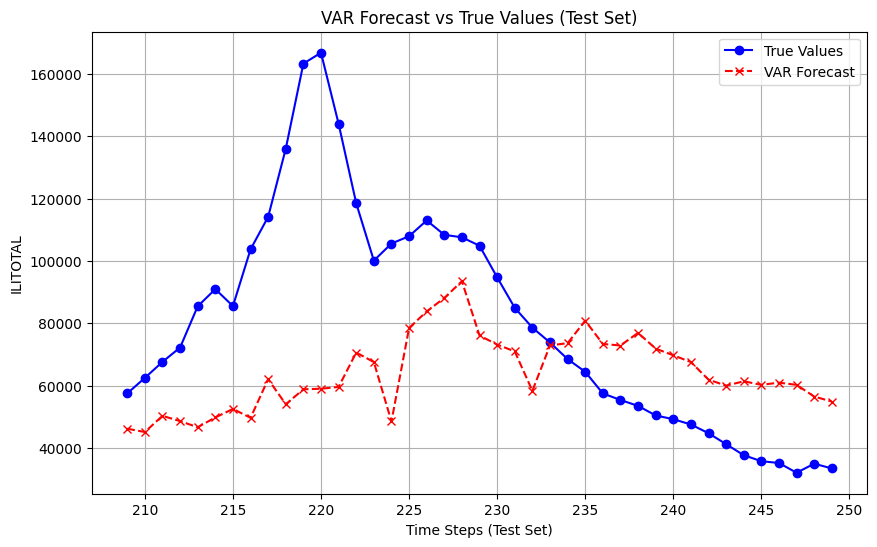

MSE: 0.5959
MAE: 0.6828
SMAPE: 45.2894%


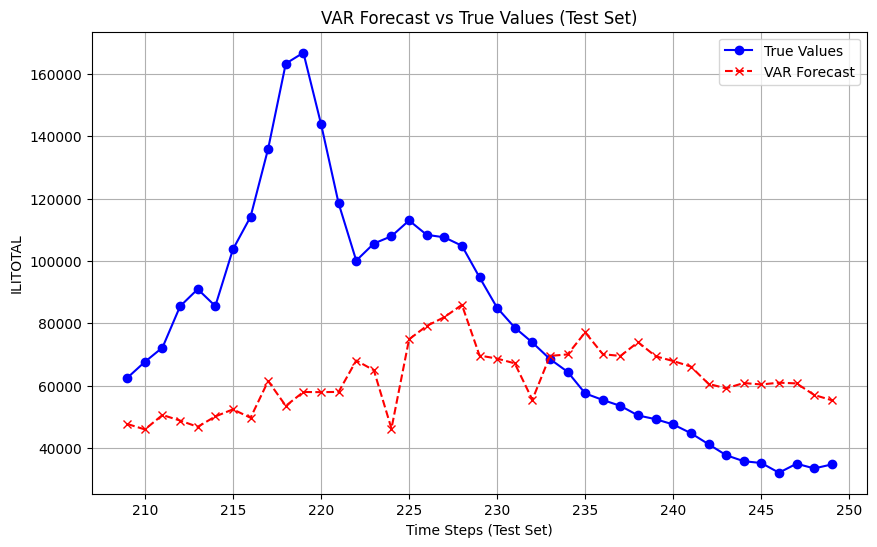

MSE: 0.6537
MAE: 0.7194
SMAPE: 47.6063%


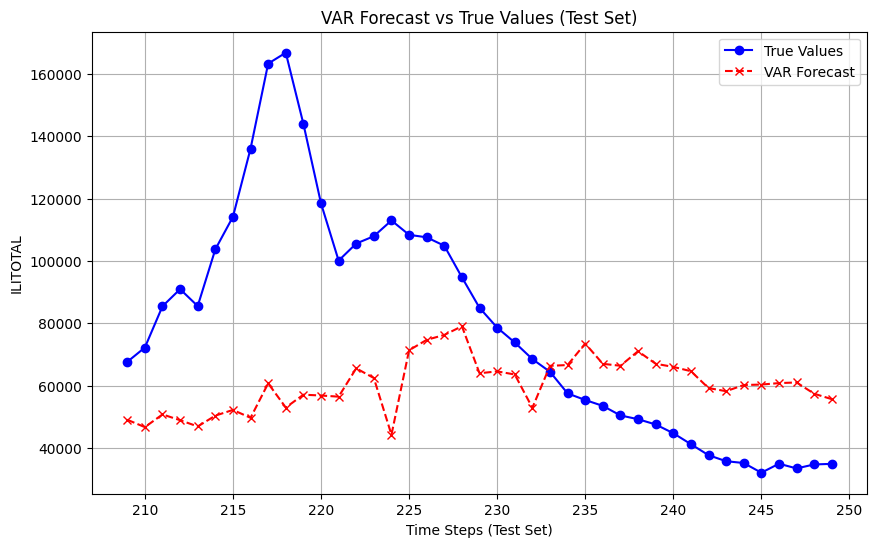

MSE: 0.7056
MAE: 0.7486
SMAPE: 49.4146%


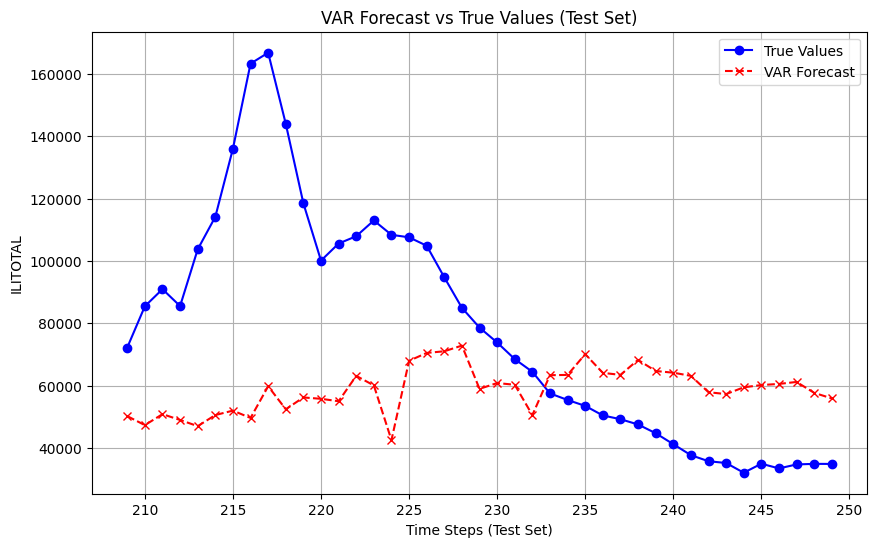

smape_value:  49.41459804617169 horizon: 12
horizon: 0, mse: 0.012709211689102416, mse: 0.0869232341758527, smape: 5.957386274614439
horizon: 1, mse: 0.05093654078270393, mse: 0.18556557383797884, smape: 12.68410802756608
horizon: 2, mse: 0.10683449753577079, mse: 0.26940852527787484, smape: 18.335589016740805
horizon: 3, mse: 0.17486339696244058, mse: 0.3477977665824965, smape: 23.54794369564718
horizon: 4, mse: 0.24397770081946446, mse: 0.41572657330038776, smape: 28.031125492774216
horizon: 5, mse: 0.3120874810292285, mse: 0.4694903905268992, smape: 31.54588704291091
horizon: 6, mse: 0.3866176495573806, mse: 0.5280614748787484, smape: 35.3527108057025
horizon: 7, mse: 0.4528572227817236, mse: 0.5870364911576601, smape: 39.2038512120013
horizon: 8, mse: 0.5292980828492816, mse: 0.6382104754131399, smape: 42.45295017200866
horizon: 9, mse: 0.5959210212533513, mse: 0.6827566106707833, smape: 45.289379165038845
horizon: 10, mse: 0.6537104158494507, mse: 0.7194179823679053, smape: 47.606

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
    forecast = model.forecast( steps=horizon) #, exog=exogenous_series[-horizon:])
    return forecast[:, 0]  # Only return the forecast for ILITOTAL (endogenous variable)

    


# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series) - horizon, horizon))
    true_values = np.zeros((len(test_series) - horizon, horizon))

    for i in range(len(test_series) - horizon):

        model = VARMAX(endog=time_series[:split_idx + i], order=(1, 1))
        model_fitted = model.fit(maxlags=1)


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
    time_series = np.array(df[['ILITOTAL','NUM. OF PROVIDERS','OT','h','c']])

    time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 12  # Forecast horizon (steps ahead)

    for horizon in range(12,13):
        smape_value = evaluate_var(time_series,  horizon)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(12):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
        

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.40800D-01    |proj g|=  2.05734D+00

At iterate    5    f= -9.03018D-01    |proj g|=  4.15431D-01

At iterate   10    f= -9.14193D-01    |proj g|=  1.07715D-01

At iterate   15    f= -9.20856D-01    |proj g|=  3.82926D-01

At iterate   20    f= -9.22928D-01    |proj g|=  4.12678D-01

At iterate   25    f= -9.25830D-01    |proj g|=  1.61528D-01

At iterate   30    f= -9.27334D-01    |proj g|=  2.28153D-01

At iterate   35    f= -9.30506D-01    |proj g|=  1.84321D-01

At iterate   40    f= -9.32380D-01    |proj g|=  1.30583D-01

At iterate   45    f= -9.35411D-01    |proj g|=  7.18737D-02

At iterate   50    f= -9.37416D-01    |proj g|=  3.78482D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.45859D-01    |proj g|=  2.05038D+00


 This problem is unconstrained.



At iterate    5    f= -9.07458D-01    |proj g|=  3.56380D-01

At iterate   10    f= -9.17985D-01    |proj g|=  8.16118D-02

At iterate   15    f= -9.25816D-01    |proj g|=  8.79538D-02

At iterate   20    f= -9.27868D-01    |proj g|=  1.60795D-01

At iterate   25    f= -9.30333D-01    |proj g|=  3.97614D-02

At iterate   30    f= -9.32713D-01    |proj g|=  6.06646D-02

At iterate   35    f= -9.35960D-01    |proj g|=  4.58074D-02

At iterate   40    f= -9.38581D-01    |proj g|=  6.24456D-02

At iterate   45    f= -9.40691D-01    |proj g|=  8.80837D-02

At iterate   50    f= -9.42977D-01    |proj g|=  9.85738D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.48669D-01    |proj g|=  2.05826D+00


 This problem is unconstrained.



At iterate    5    f= -9.11922D-01    |proj g|=  3.91007D-01

At iterate   10    f= -9.22800D-01    |proj g|=  1.15382D-01

At iterate   15    f= -9.30038D-01    |proj g|=  8.59407D-02

At iterate   20    f= -9.32631D-01    |proj g|=  1.53856D-01

At iterate   25    f= -9.34987D-01    |proj g|=  3.56851D-02

At iterate   30    f= -9.36712D-01    |proj g|=  8.98937D-02

At iterate   35    f= -9.40224D-01    |proj g|=  6.17059D-02

At iterate   40    f= -9.42710D-01    |proj g|=  2.93987D-01

At iterate   45    f= -9.45810D-01    |proj g|=  1.32579D-01

At iterate   50    f= -9.47786D-01    |proj g|=  6.30006D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.59383D-01    |proj g|=  2.08466D+00


 This problem is unconstrained.



At iterate    5    f= -9.22324D-01    |proj g|=  3.12012D-01

At iterate   10    f= -9.33028D-01    |proj g|=  9.21600D-02

At iterate   15    f= -9.40700D-01    |proj g|=  5.77060D-02

At iterate   20    f= -9.42885D-01    |proj g|=  6.08972D-02

At iterate   25    f= -9.45531D-01    |proj g|=  9.50908D-02

At iterate   30    f= -9.47866D-01    |proj g|=  1.46614D-01

At iterate   35    f= -9.51188D-01    |proj g|=  5.68770D-02

At iterate   40    f= -9.54249D-01    |proj g|=  2.09005D-01

At iterate   45    f= -9.56202D-01    |proj g|=  2.25633D-01

At iterate   50    f= -9.58454D-01    |proj g|=  5.31867D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.69724D-01    |proj g|=  2.09134D+00


 This problem is unconstrained.



At iterate    5    f= -9.32331D-01    |proj g|=  2.84103D-01

At iterate   10    f= -9.43199D-01    |proj g|=  1.08532D-01

At iterate   15    f= -9.50350D-01    |proj g|=  3.14403D-01

At iterate   20    f= -9.52371D-01    |proj g|=  2.18148D-01

At iterate   25    f= -9.54837D-01    |proj g|=  8.02421D-02

At iterate   30    f= -9.56693D-01    |proj g|=  6.83414D-02

At iterate   35    f= -9.60068D-01    |proj g|=  5.81920D-02

At iterate   40    f= -9.62261D-01    |proj g|=  6.40769D-02

At iterate   45    f= -9.65021D-01    |proj g|=  1.01823D-01

At iterate   50    f= -9.67129D-01    |proj g|=  1.89544D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.78983D-01    |proj g|=  2.09920D+00


 This problem is unconstrained.



At iterate    5    f= -9.41765D-01    |proj g|=  2.86878D-01

At iterate   10    f= -9.52565D-01    |proj g|=  1.03692D-01

At iterate   15    f= -9.59684D-01    |proj g|=  3.03906D-01

At iterate   20    f= -9.61562D-01    |proj g|=  2.24744D-01

At iterate   25    f= -9.64100D-01    |proj g|=  9.92659D-02

At iterate   30    f= -9.65689D-01    |proj g|=  7.34198D-02

At iterate   35    f= -9.69285D-01    |proj g|=  5.59885D-02

At iterate   40    f= -9.71866D-01    |proj g|=  8.99048D-02

At iterate   45    f= -9.74639D-01    |proj g|=  1.73535D-01

At iterate   50    f= -9.77087D-01    |proj g|=  4.56707D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.87286D-01    |proj g|=  2.09495D+00


 This problem is unconstrained.



At iterate    5    f= -9.49705D-01    |proj g|=  2.84412D-01

At iterate   10    f= -9.60270D-01    |proj g|=  1.00349D-01

At iterate   15    f= -9.67515D-01    |proj g|=  9.74372D-02

At iterate   20    f= -9.69499D-01    |proj g|=  4.69870D-02

At iterate   25    f= -9.72131D-01    |proj g|=  5.69268D-02

At iterate   30    f= -9.74577D-01    |proj g|=  8.06735D-02

At iterate   35    f= -9.77915D-01    |proj g|=  3.60529D-02

At iterate   40    f= -9.81151D-01    |proj g|=  1.17852D-01

At iterate   45    f= -9.83662D-01    |proj g|=  1.37939D-01

At iterate   50    f= -9.85551D-01    |proj g|=  1.50365D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.96890D-01    |proj g|=  2.10403D+00


 This problem is unconstrained.



At iterate    5    f= -9.59153D-01    |proj g|=  2.67811D-01

At iterate   10    f= -9.69995D-01    |proj g|=  8.20991D-02

At iterate   15    f= -9.77047D-01    |proj g|=  4.13397D-02

At iterate   20    f= -9.78995D-01    |proj g|=  6.59470D-02

At iterate   25    f= -9.81368D-01    |proj g|=  5.72554D-02

At iterate   30    f= -9.83078D-01    |proj g|=  4.98837D-02

At iterate   35    f= -9.86002D-01    |proj g|=  5.75536D-02

At iterate   40    f= -9.88643D-01    |proj g|=  1.32264D-01

At iterate   45    f= -9.91654D-01    |proj g|=  7.06203D-02

At iterate   50    f= -9.93599D-01    |proj g|=  5.07043D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.05375D-01    |proj g|=  2.09071D+00


 This problem is unconstrained.



At iterate    5    f= -8.63969D-01    |proj g|=  3.12673D-01

At iterate   10    f= -8.75592D-01    |proj g|=  1.37737D-01

At iterate   15    f= -8.83456D-01    |proj g|=  2.30365D-01

At iterate   20    f= -8.85788D-01    |proj g|=  1.16541D-01

At iterate   25    f= -8.88565D-01    |proj g|=  3.29838D-02

At iterate   30    f= -8.90389D-01    |proj g|=  7.41582D-02

At iterate   35    f= -8.94112D-01    |proj g|=  6.53372D-02

At iterate   40    f= -8.96381D-01    |proj g|=  9.91360D-02

At iterate   45    f= -8.99163D-01    |proj g|=  7.21646D-02

At iterate   50    f= -9.01098D-01    |proj g|=  6.07816D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.11444D-01    |proj g|=  2.07981D+00


 This problem is unconstrained.



At iterate    5    f= -8.69525D-01    |proj g|=  2.83209D-01

At iterate   10    f= -8.80745D-01    |proj g|=  1.46685D-01

At iterate   15    f= -8.88000D-01    |proj g|=  2.78690D-01

At iterate   20    f= -8.90081D-01    |proj g|=  2.77648D-01

At iterate   25    f= -8.92659D-01    |proj g|=  2.35483D-01

At iterate   30    f= -8.94685D-01    |proj g|=  8.33407D-02

At iterate   35    f= -8.98149D-01    |proj g|=  5.76649D-02

At iterate   40    f= -9.00304D-01    |proj g|=  3.61733D-01

At iterate   45    f= -9.02792D-01    |proj g|=  3.07576D-01

At iterate   50    f= -9.05155D-01    |proj g|=  1.88342D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.20151D-01    |proj g|=  2.06284D+00


 This problem is unconstrained.



At iterate    5    f= -8.79208D-01    |proj g|=  2.81156D-01

At iterate   10    f= -8.89191D-01    |proj g|=  1.43278D-01

At iterate   15    f= -8.97200D-01    |proj g|=  1.71055D-01

At iterate   20    f= -8.99588D-01    |proj g|=  4.33718D-02

At iterate   25    f= -9.01842D-01    |proj g|=  9.78179D-02

At iterate   30    f= -9.03504D-01    |proj g|=  1.13818D-01

At iterate   35    f= -9.07148D-01    |proj g|=  1.38945D-01

At iterate   40    f= -9.09748D-01    |proj g|=  9.33158D-02

At iterate   45    f= -9.12693D-01    |proj g|=  4.36203D-02

At iterate   50    f= -9.15071D-01    |proj g|=  7.52995D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.31398D-01    |proj g|=  2.08918D+00


 This problem is unconstrained.



At iterate    5    f= -8.89633D-01    |proj g|=  3.27800D-01

At iterate   10    f= -9.00195D-01    |proj g|=  1.15089D-01

At iterate   15    f= -9.07960D-01    |proj g|=  3.50717D-01

At iterate   20    f= -9.09872D-01    |proj g|=  1.47630D-01

At iterate   25    f= -9.12539D-01    |proj g|=  6.09004D-02

At iterate   30    f= -9.13765D-01    |proj g|=  5.35169D-02

At iterate   35    f= -9.17185D-01    |proj g|=  3.50302D-02

At iterate   40    f= -9.19184D-01    |proj g|=  8.93447D-02

At iterate   45    f= -9.22612D-01    |proj g|=  4.80502D-02

At iterate   50    f= -9.25328D-01    |proj g|=  3.53605D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.39921D-01    |proj g|=  2.08077D+00


 This problem is unconstrained.



At iterate    5    f= -8.98741D-01    |proj g|=  3.22639D-01

At iterate   10    f= -9.09047D-01    |proj g|=  1.24209D-01

At iterate   15    f= -9.16806D-01    |proj g|=  2.95277D-01

At iterate   20    f= -9.18766D-01    |proj g|=  2.43456D-01

At iterate   25    f= -9.21348D-01    |proj g|=  1.59149D-01

At iterate   30    f= -9.22707D-01    |proj g|=  4.74077D-02

At iterate   35    f= -9.25949D-01    |proj g|=  1.15472D-01

At iterate   40    f= -9.28004D-01    |proj g|=  7.52889D-02

At iterate   45    f= -9.31786D-01    |proj g|=  9.10087D-02

At iterate   50    f= -9.33917D-01    |proj g|=  1.63522D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.45607D-01    |proj g|=  2.08507D+00


 This problem is unconstrained.



At iterate    5    f= -9.05292D-01    |proj g|=  3.17019D-01

At iterate   10    f= -9.15440D-01    |proj g|=  1.30984D-01

At iterate   15    f= -9.23129D-01    |proj g|=  2.98259D-01

At iterate   20    f= -9.25251D-01    |proj g|=  1.31147D-01

At iterate   25    f= -9.28085D-01    |proj g|=  6.10815D-02

At iterate   30    f= -9.29190D-01    |proj g|=  2.95689D-02

At iterate   35    f= -9.31795D-01    |proj g|=  4.07306D-02

At iterate   40    f= -9.34180D-01    |proj g|=  4.37675D-02

At iterate   45    f= -9.37001D-01    |proj g|=  4.88214D-02

At iterate   50    f= -9.40345D-01    |proj g|=  3.99415D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.57149D-01    |proj g|=  2.10991D+00


 This problem is unconstrained.



At iterate    5    f= -9.16360D-01    |proj g|=  3.47254D-01

At iterate   10    f= -9.26754D-01    |proj g|=  1.31680D-01

At iterate   15    f= -9.34410D-01    |proj g|=  2.33317D-01

At iterate   20    f= -9.36692D-01    |proj g|=  1.32137D-01

At iterate   25    f= -9.39408D-01    |proj g|=  4.66286D-02

At iterate   30    f= -9.40616D-01    |proj g|=  9.91545D-02

At iterate   35    f= -9.44239D-01    |proj g|=  7.29655D-02

At iterate   40    f= -9.46674D-01    |proj g|=  2.33387D-01

At iterate   45    f= -9.50038D-01    |proj g|=  7.74339D-02

At iterate   50    f= -9.52133D-01    |proj g|=  5.58754D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.54271D-01    |proj g|=  2.11284D+00


 This problem is unconstrained.



At iterate    5    f= -9.11923D-01    |proj g|=  3.84436D-01

At iterate   10    f= -9.21785D-01    |proj g|=  1.28437D-01

At iterate   15    f= -9.28690D-01    |proj g|=  5.55904D-01

At iterate   20    f= -9.31906D-01    |proj g|=  1.46154D-01

At iterate   25    f= -9.34484D-01    |proj g|=  8.16251D-02

At iterate   30    f= -9.35822D-01    |proj g|=  4.13851D-02

At iterate   35    f= -9.39030D-01    |proj g|=  5.35377D-02

At iterate   40    f= -9.40776D-01    |proj g|=  6.50575D-02

At iterate   45    f= -9.44185D-01    |proj g|=  1.04205D-01

At iterate   50    f= -9.46602D-01    |proj g|=  9.12331D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.35956D-01    |proj g|=  2.09416D+00


 This problem is unconstrained.



At iterate    5    f= -8.95992D-01    |proj g|=  3.38401D-01

At iterate   10    f= -9.06219D-01    |proj g|=  1.38116D-01

At iterate   15    f= -9.13827D-01    |proj g|=  3.23306D-01

At iterate   20    f= -9.16098D-01    |proj g|=  9.14758D-02

At iterate   25    f= -9.18583D-01    |proj g|=  1.36596D-01

At iterate   30    f= -9.19940D-01    |proj g|=  6.20071D-02

At iterate   35    f= -9.23487D-01    |proj g|=  1.18894D-01

At iterate   40    f= -9.25796D-01    |proj g|=  1.35093D-01

At iterate   45    f= -9.28639D-01    |proj g|=  1.21994D-01

At iterate   50    f= -9.30752D-01    |proj g|=  9.01842D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.45274D-01    |proj g|=  2.09887D+00


 This problem is unconstrained.



At iterate    5    f= -9.05726D-01    |proj g|=  3.38173D-01

At iterate   10    f= -9.15992D-01    |proj g|=  1.47926D-01

At iterate   15    f= -9.23642D-01    |proj g|=  1.11406D-01

At iterate   20    f= -9.25694D-01    |proj g|=  1.28266D-01

At iterate   25    f= -9.28157D-01    |proj g|=  4.99162D-02

At iterate   30    f= -9.29562D-01    |proj g|=  5.72812D-02

At iterate   35    f= -9.33382D-01    |proj g|=  7.75006D-02

At iterate   40    f= -9.34947D-01    |proj g|=  5.16709D-01

At iterate   45    f= -9.38503D-01    |proj g|=  8.58695D-02

At iterate   50    f= -9.40595D-01    |proj g|=  9.60547D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.49171D-01    |proj g|=  2.09441D+00


 This problem is unconstrained.



At iterate    5    f= -9.10294D-01    |proj g|=  3.48423D-01

At iterate   10    f= -9.20475D-01    |proj g|=  1.49398D-01

At iterate   15    f= -9.28308D-01    |proj g|=  1.75045D-01

At iterate   20    f= -9.30569D-01    |proj g|=  8.83736D-02

At iterate   25    f= -9.33082D-01    |proj g|=  1.50002D-01

At iterate   30    f= -9.34333D-01    |proj g|=  6.03036D-02

At iterate   35    f= -9.37515D-01    |proj g|=  5.21989D-02

At iterate   40    f= -9.39440D-01    |proj g|=  1.03597D-01

At iterate   45    f= -9.42751D-01    |proj g|=  4.46970D-02

At iterate   50    f= -9.45454D-01    |proj g|=  8.75460D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.53809D-01    |proj g|=  2.11204D+00


 This problem is unconstrained.



At iterate    5    f= -9.16129D-01    |proj g|=  3.67249D-01

At iterate   10    f= -9.26284D-01    |proj g|=  1.49780D-01

At iterate   15    f= -9.34114D-01    |proj g|=  1.47521D-01

At iterate   20    f= -9.36622D-01    |proj g|=  7.99712D-02

At iterate   25    f= -9.39144D-01    |proj g|=  1.47483D-01

At iterate   30    f= -9.40314D-01    |proj g|=  4.66886D-02

At iterate   35    f= -9.43279D-01    |proj g|=  7.81867D-02

At iterate   40    f= -9.45022D-01    |proj g|=  2.67505D-01

At iterate   45    f= -9.48341D-01    |proj g|=  2.06591D-01

At iterate   50    f= -9.51012D-01    |proj g|=  5.79073D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.61962D-01    |proj g|=  2.14061D+00


 This problem is unconstrained.



At iterate    5    f= -9.23511D-01    |proj g|=  3.99943D-01

At iterate   10    f= -9.33324D-01    |proj g|=  1.31975D-01

At iterate   15    f= -9.40592D-01    |proj g|=  3.85222D-01

At iterate   20    f= -9.43526D-01    |proj g|=  1.54717D-01

At iterate   25    f= -9.45920D-01    |proj g|=  1.01313D-01

At iterate   30    f= -9.47401D-01    |proj g|=  4.15943D-02

At iterate   35    f= -9.50376D-01    |proj g|=  6.28680D-02

At iterate   40    f= -9.52207D-01    |proj g|=  6.49818D-02

At iterate   45    f= -9.55091D-01    |proj g|=  6.08237D-02

At iterate   50    f= -9.57778D-01    |proj g|=  4.47644D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.63171D-01    |proj g|=  2.14317D+00


 This problem is unconstrained.



At iterate    5    f= -9.23178D-01    |proj g|=  3.76755D-01

At iterate   10    f= -9.32452D-01    |proj g|=  1.42276D-01

At iterate   15    f= -9.39161D-01    |proj g|=  3.45382D-01

At iterate   20    f= -9.41863D-01    |proj g|=  1.24457D-01

At iterate   25    f= -9.44284D-01    |proj g|=  9.23098D-02

At iterate   30    f= -9.45965D-01    |proj g|=  4.65944D-02

At iterate   35    f= -9.49143D-01    |proj g|=  5.19356D-02

At iterate   40    f= -9.51263D-01    |proj g|=  6.80370D-02

At iterate   45    f= -9.54229D-01    |proj g|=  7.54869D-02

At iterate   50    f= -9.56618D-01    |proj g|=  5.31322D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.69372D-01    |proj g|=  2.15282D+00


 This problem is unconstrained.



At iterate    5    f= -9.30571D-01    |proj g|=  3.57005D-01

At iterate   10    f= -9.39937D-01    |proj g|=  1.55416D-01

At iterate   15    f= -9.46984D-01    |proj g|=  1.85263D-01

At iterate   20    f= -9.49191D-01    |proj g|=  9.22236D-02

At iterate   25    f= -9.51711D-01    |proj g|=  8.02779D-02

At iterate   30    f= -9.52864D-01    |proj g|=  3.49330D-02

At iterate   35    f= -9.55735D-01    |proj g|=  6.97968D-02

At iterate   40    f= -9.57451D-01    |proj g|=  3.23719D-01

At iterate   45    f= -9.59854D-01    |proj g|=  3.33565D-01

At iterate   50    f= -9.62484D-01    |proj g|=  1.66428D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.75948D-01    |proj g|=  2.15956D+00


 This problem is unconstrained.



At iterate    5    f= -9.36646D-01    |proj g|=  3.63446D-01

At iterate   10    f= -9.45879D-01    |proj g|=  1.55918D-01

At iterate   15    f= -9.52824D-01    |proj g|=  2.31085D-01

At iterate   20    f= -9.55118D-01    |proj g|=  1.13306D-01

At iterate   25    f= -9.57223D-01    |proj g|=  2.83589D-01

At iterate   30    f= -9.58415D-01    |proj g|=  5.65784D-02

At iterate   35    f= -9.61218D-01    |proj g|=  6.58638D-02

At iterate   40    f= -9.63168D-01    |proj g|=  4.52194D-02

At iterate   45    f= -9.65918D-01    |proj g|=  1.04247D-01

At iterate   50    f= -9.68749D-01    |proj g|=  2.04124D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.78814D-01    |proj g|=  2.14249D+00


 This problem is unconstrained.



At iterate    5    f= -9.39656D-01    |proj g|=  3.37222D-01

At iterate   10    f= -9.48620D-01    |proj g|=  1.53008D-01

At iterate   15    f= -9.55066D-01    |proj g|=  4.49824D-01

At iterate   20    f= -9.57442D-01    |proj g|=  1.36016D-01

At iterate   25    f= -9.59367D-01    |proj g|=  2.28465D-01

At iterate   30    f= -9.60639D-01    |proj g|=  5.58153D-02

At iterate   35    f= -9.63144D-01    |proj g|=  6.84197D-02

At iterate   40    f= -9.65260D-01    |proj g|=  4.60978D-02

At iterate   45    f= -9.68098D-01    |proj g|=  6.60202D-02

At iterate   50    f= -9.71030D-01    |proj g|=  2.61019D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.89034D-01    |proj g|=  2.15186D+00


 This problem is unconstrained.



At iterate    5    f= -9.49842D-01    |proj g|=  3.40656D-01

At iterate   10    f= -9.58801D-01    |proj g|=  1.53313D-01

At iterate   15    f= -9.66105D-01    |proj g|=  2.38058D-01

At iterate   20    f= -9.67710D-01    |proj g|=  7.02145D-02

At iterate   25    f= -9.70028D-01    |proj g|=  8.17654D-02

At iterate   30    f= -9.71433D-01    |proj g|=  6.05538D-02

At iterate   35    f= -9.74050D-01    |proj g|=  4.54370D-02

At iterate   40    f= -9.76078D-01    |proj g|=  5.52022D-02

At iterate   45    f= -9.78749D-01    |proj g|=  1.32857D-01

At iterate   50    f= -9.80813D-01    |proj g|=  1.22364D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.98795D-01    |proj g|=  2.15460D+00


 This problem is unconstrained.



At iterate    5    f= -9.59725D-01    |proj g|=  3.39315D-01

At iterate   10    f= -9.68603D-01    |proj g|=  1.47800D-01

At iterate   15    f= -9.75613D-01    |proj g|=  2.26324D-01

At iterate   20    f= -9.77445D-01    |proj g|=  1.05127D-01

At iterate   25    f= -9.79741D-01    |proj g|=  6.76821D-02

At iterate   30    f= -9.81143D-01    |proj g|=  4.89565D-02

At iterate   35    f= -9.84447D-01    |proj g|=  4.15593D-02

At iterate   40    f= -9.86614D-01    |proj g|=  5.36707D-02

At iterate   45    f= -9.88698D-01    |proj g|=  5.69641D-02

At iterate   50    f= -9.90618D-01    |proj g|=  5.45239D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.09402D-01    |proj g|=  2.16093D+00


 This problem is unconstrained.



At iterate    5    f= -9.69745D-01    |proj g|=  3.42864D-01

At iterate   10    f= -9.78601D-01    |proj g|=  1.53976D-01

At iterate   15    f= -9.85899D-01    |proj g|=  1.66052D-01

At iterate   20    f= -9.87774D-01    |proj g|=  1.14217D-01

At iterate   25    f= -9.89890D-01    |proj g|=  8.70241D-02

At iterate   30    f= -9.91455D-01    |proj g|=  5.75563D-02

At iterate   35    f= -9.94508D-01    |proj g|=  3.11378D-02

At iterate   40    f= -9.96390D-01    |proj g|=  6.73256D-02

At iterate   45    f= -9.99391D-01    |proj g|=  8.98892D-02

At iterate   50    f= -1.00125D+00    |proj g|=  1.10010D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.19925D-01    |proj g|=  2.15799D+00


 This problem is unconstrained.



At iterate    5    f= -9.80268D-01    |proj g|=  3.33909D-01

At iterate   10    f= -9.88964D-01    |proj g|=  1.38758D-01

At iterate   15    f= -9.95829D-01    |proj g|=  1.35626D-01

At iterate   20    f= -9.97561D-01    |proj g|=  5.69353D-02

At iterate   25    f= -1.00006D+00    |proj g|=  1.14244D-01

At iterate   30    f= -1.00130D+00    |proj g|=  4.87326D-02

At iterate   35    f= -1.00437D+00    |proj g|=  5.13559D-02

At iterate   40    f= -1.00614D+00    |proj g|=  2.07035D-01

At iterate   45    f= -1.00851D+00    |proj g|=  5.36764D-01

At iterate   50    f= -1.01115D+00    |proj g|=  1.52096D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


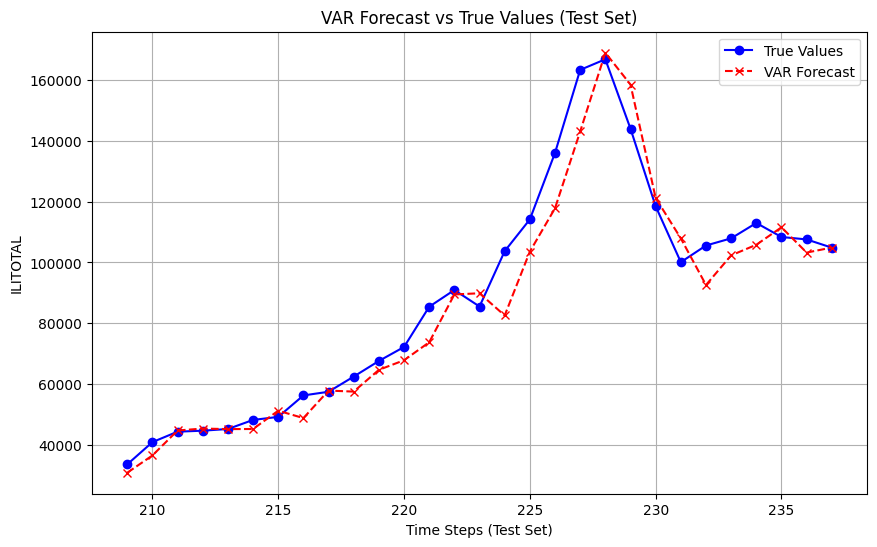

MSE: 0.0629
MAE: 0.2031
SMAPE: 13.8732%


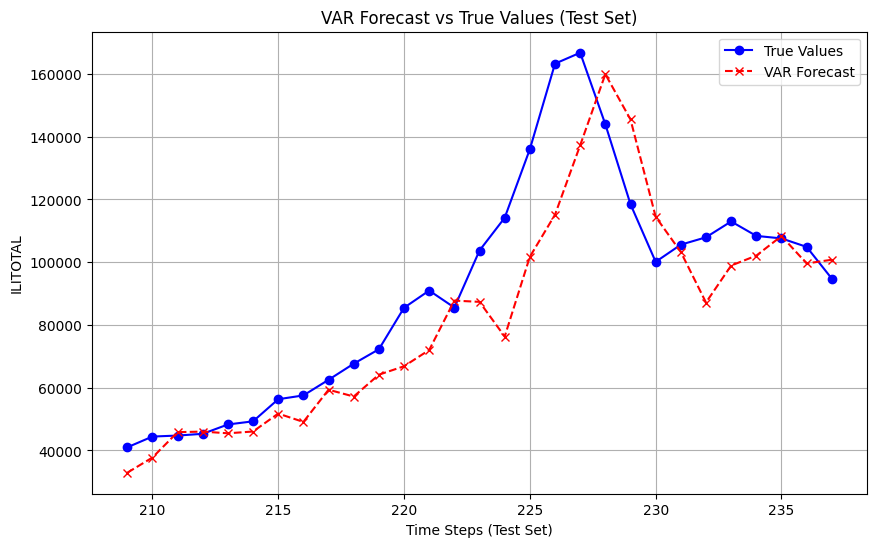

MSE: 0.1284
MAE: 0.2854
SMAPE: 19.3872%


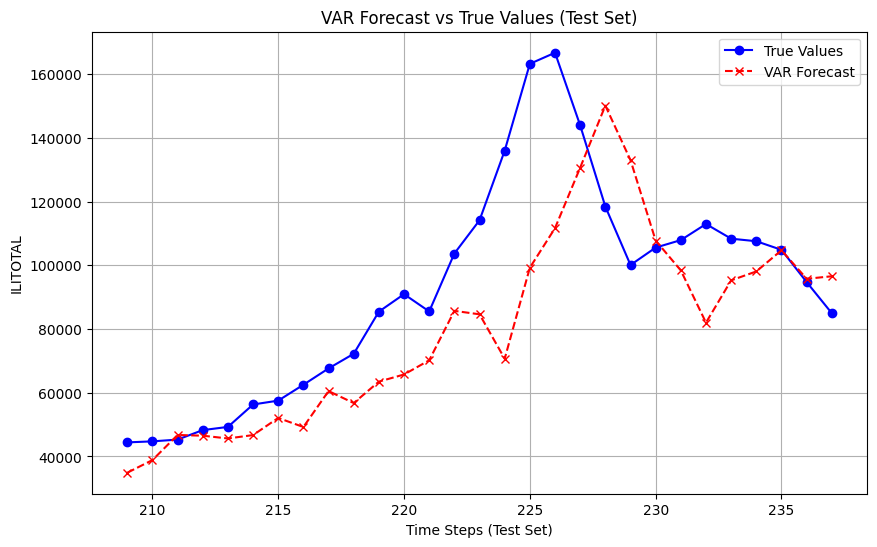

MSE: 0.2042
MAE: 0.3604
SMAPE: 24.3233%


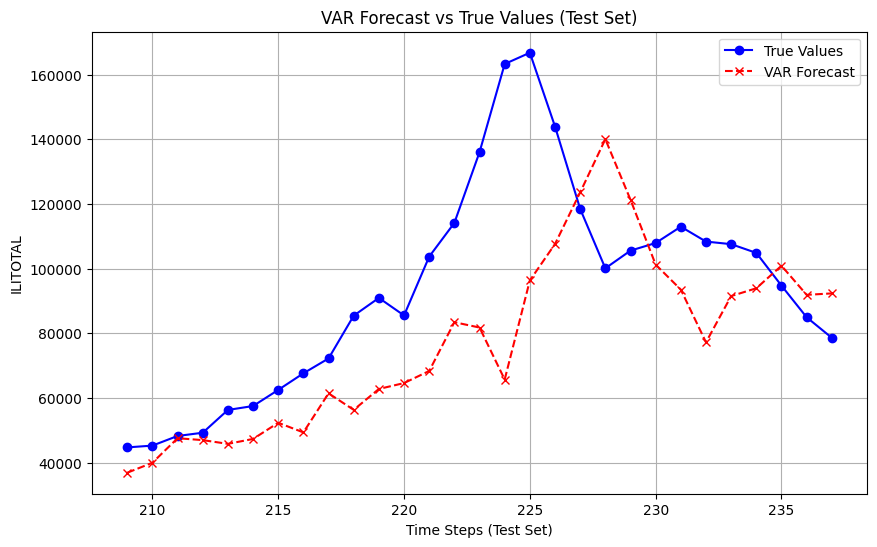

MSE: 0.2763
MAE: 0.4222
SMAPE: 28.3510%


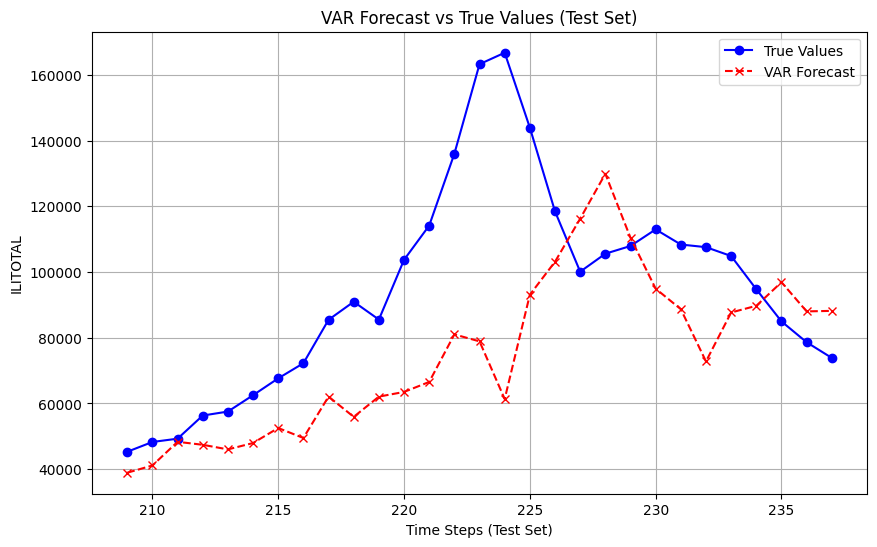

MSE: 0.3450
MAE: 0.4680
SMAPE: 31.2976%


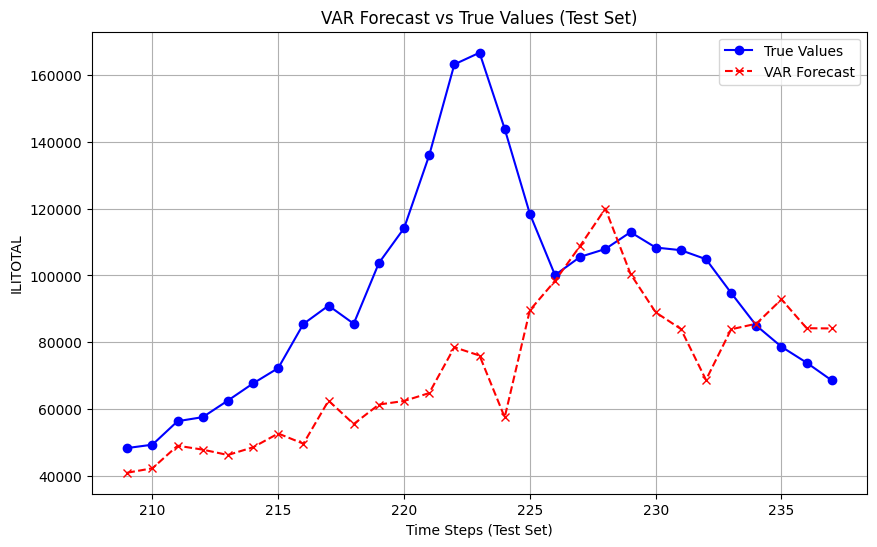

MSE: 0.4164
MAE: 0.5200
SMAPE: 34.6463%


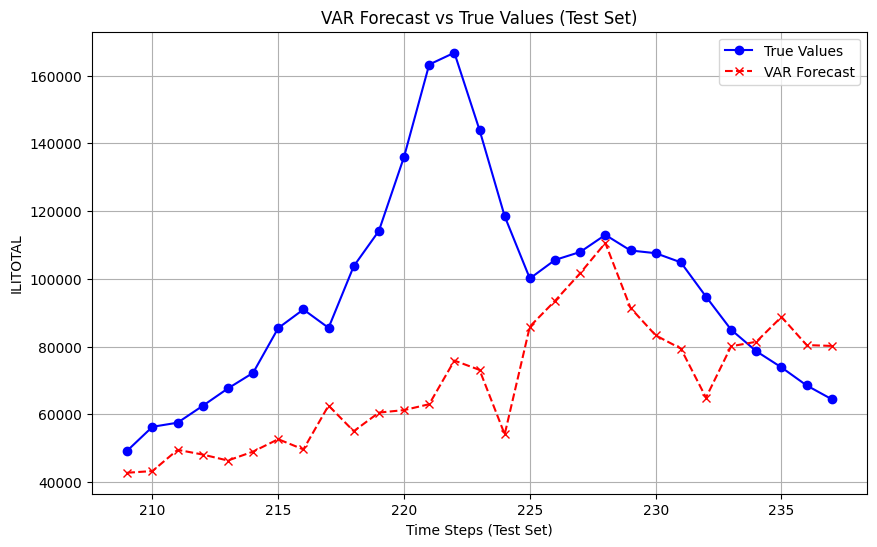

MSE: 0.4867
MAE: 0.5837
SMAPE: 38.7971%


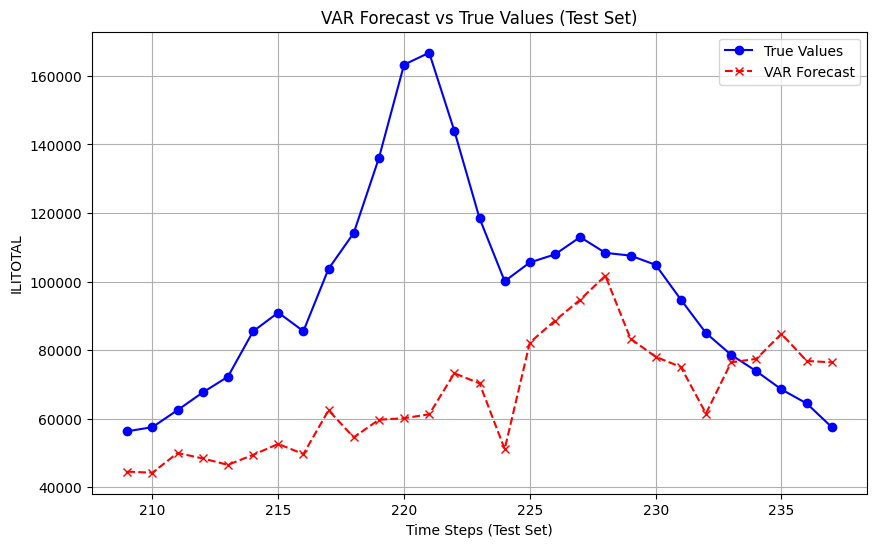

MSE: 0.5703
MAE: 0.6370
SMAPE: 42.1471%


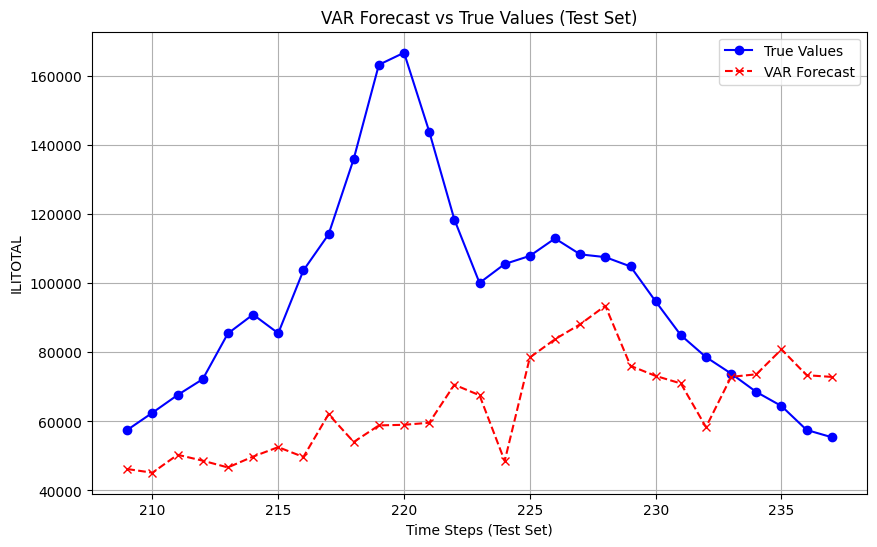

MSE: 0.6461
MAE: 0.6855
SMAPE: 45.2071%


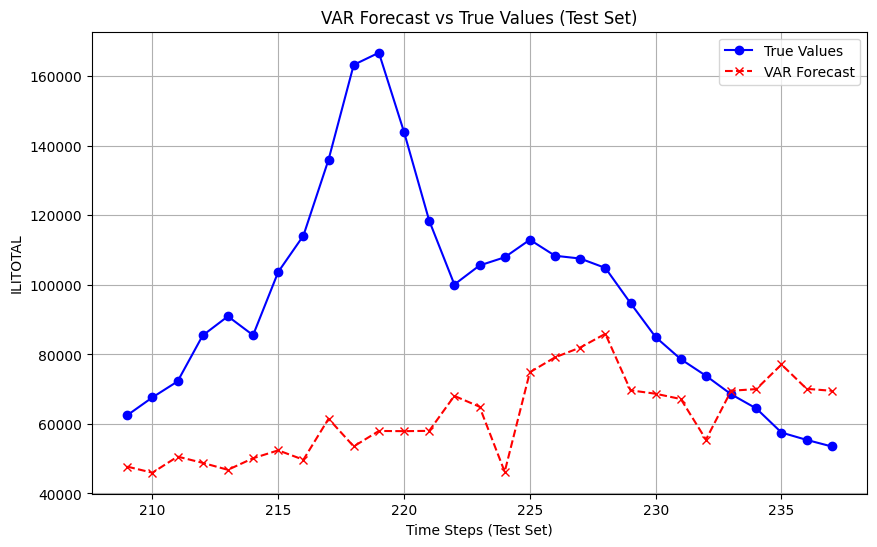

MSE: 0.7141
MAE: 0.7268
SMAPE: 47.7985%


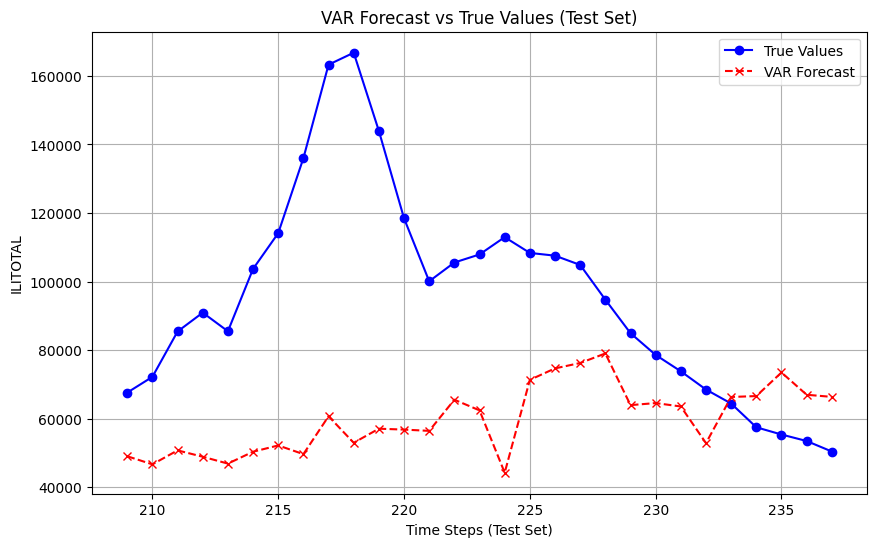

MSE: 0.7765
MAE: 0.7594
SMAPE: 49.7931%


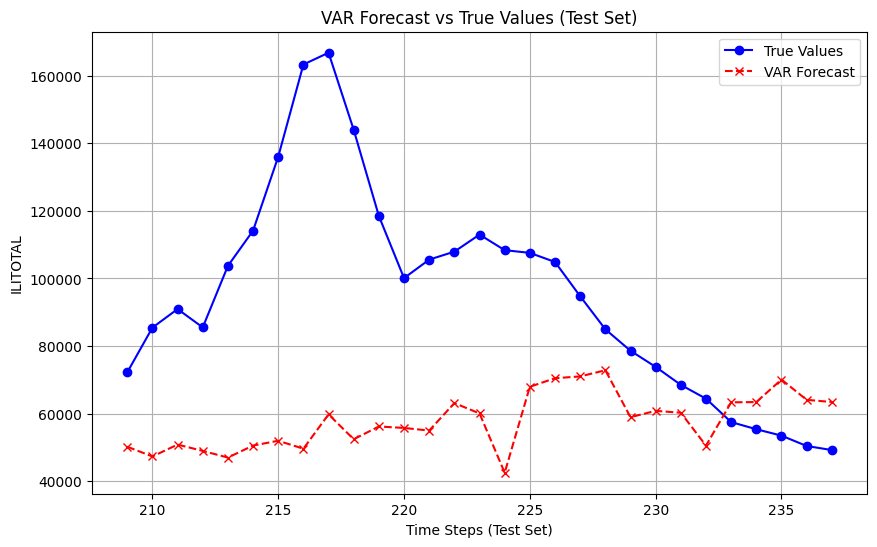

MSE: 0.8302
MAE: 0.7791
SMAPE: 50.9082%


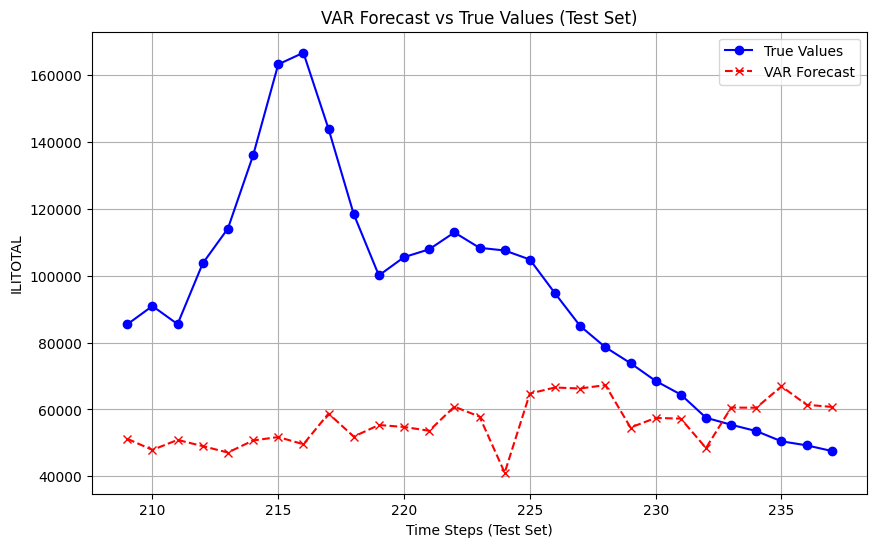

MSE: 0.8664
MAE: 0.7896
SMAPE: 51.4534%


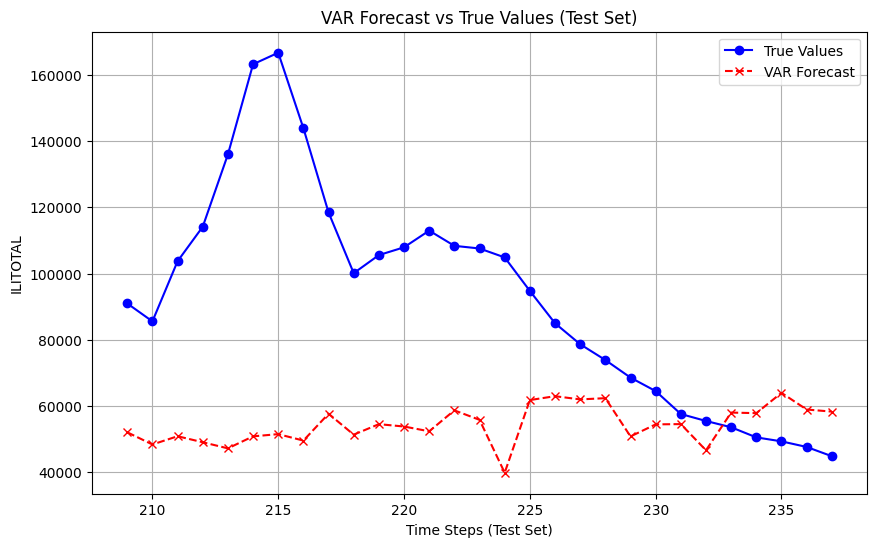

MSE: 0.8904
MAE: 0.7973
SMAPE: 51.8734%


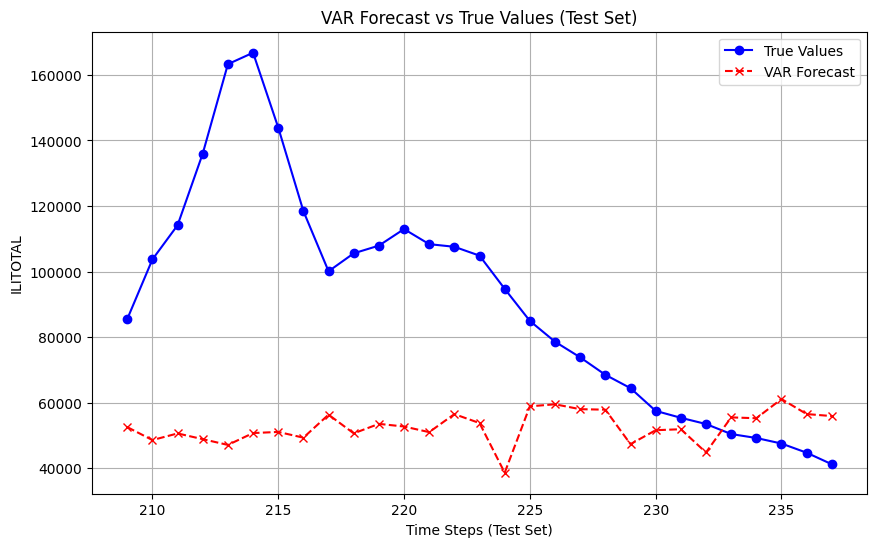

MSE: 0.9067
MAE: 0.8064
SMAPE: 52.4423%


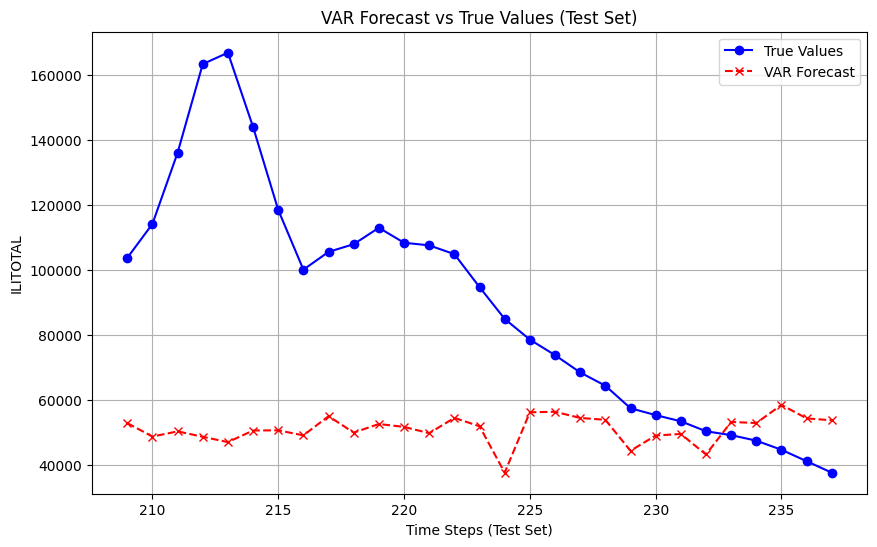

MSE: 0.9049
MAE: 0.8057
SMAPE: 52.4008%


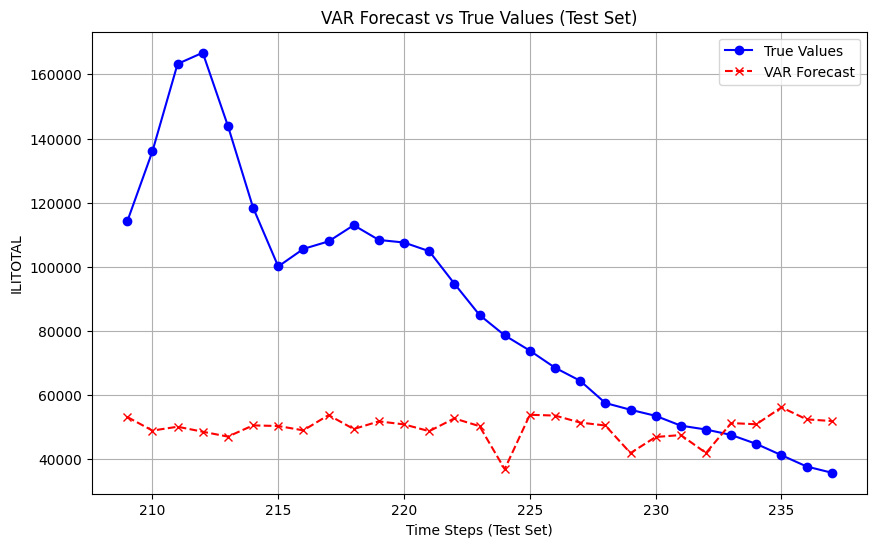

MSE: 0.8823
MAE: 0.7970
SMAPE: 51.9004%


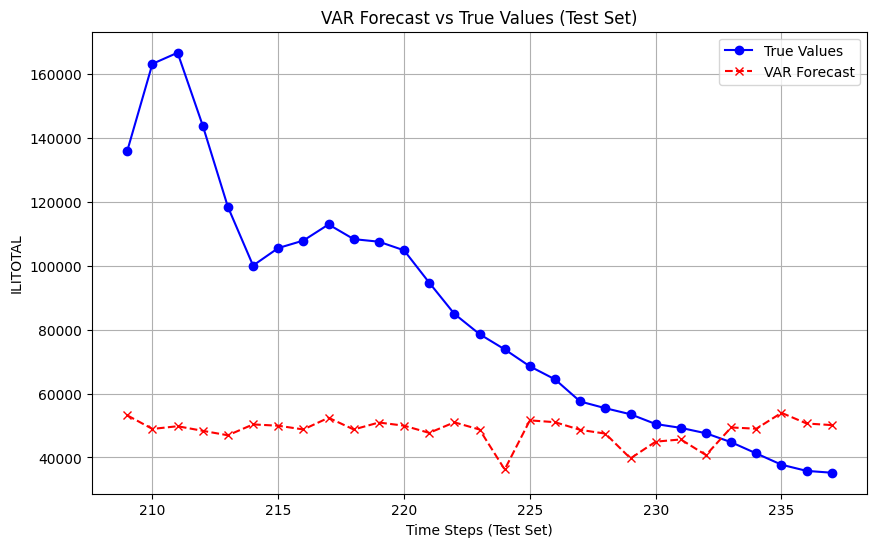

MSE: 0.8319
MAE: 0.7776
SMAPE: 50.7903%


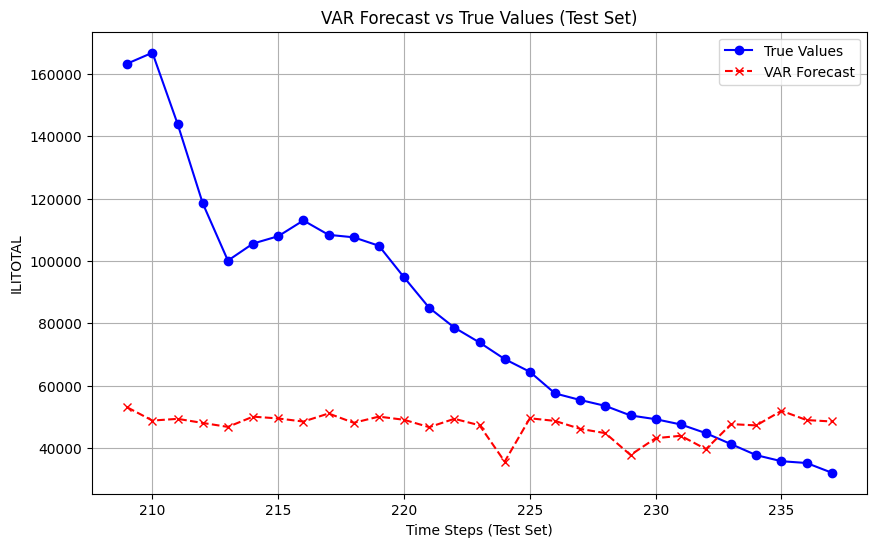

MSE: 0.7437
MAE: 0.7358
SMAPE: 48.3086%


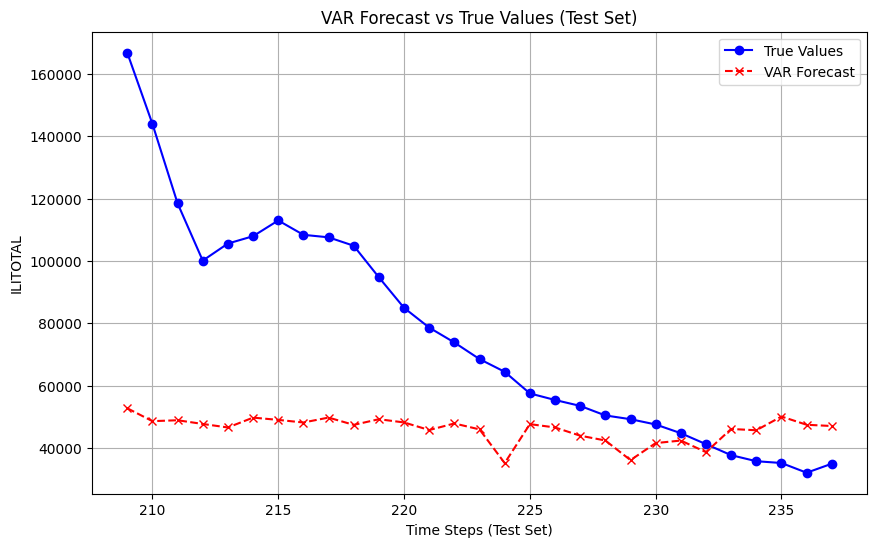

MSE: 0.6474
MAE: 0.6859
SMAPE: 45.2954%


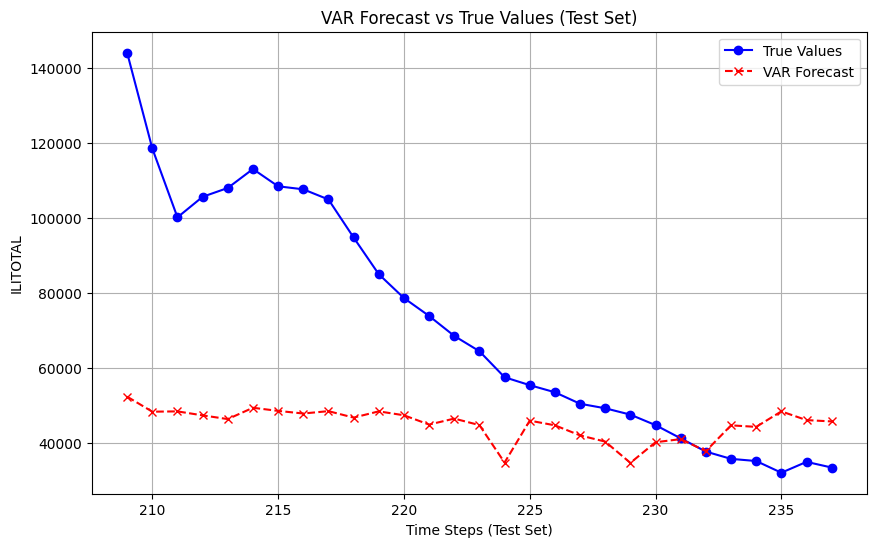

MSE: 0.5705
MAE: 0.6440
SMAPE: 42.6993%


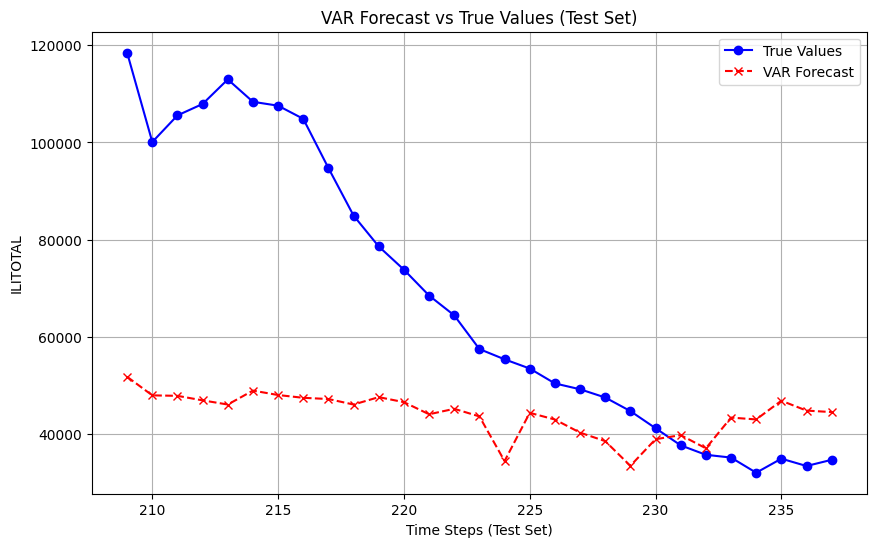

MSE: 0.5183
MAE: 0.6034
SMAPE: 40.0671%


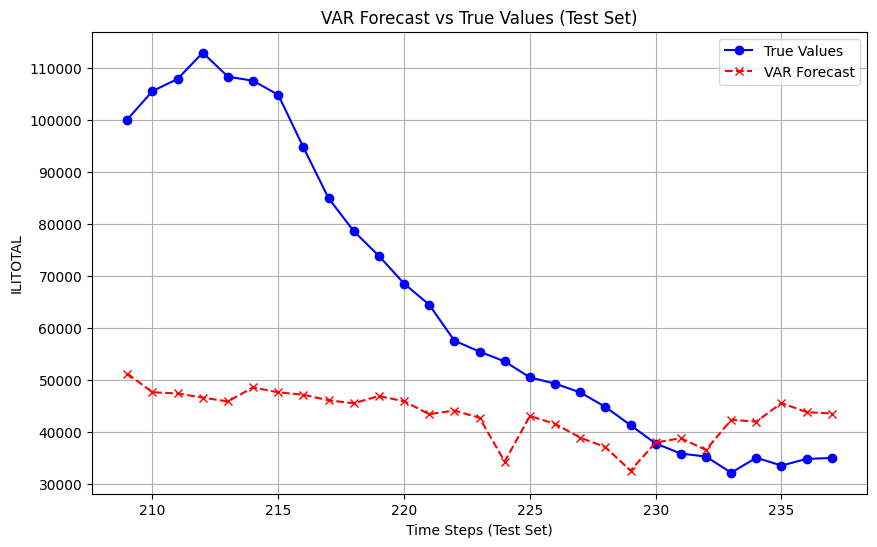

MSE: 0.4772
MAE: 0.5679
SMAPE: 37.7350%


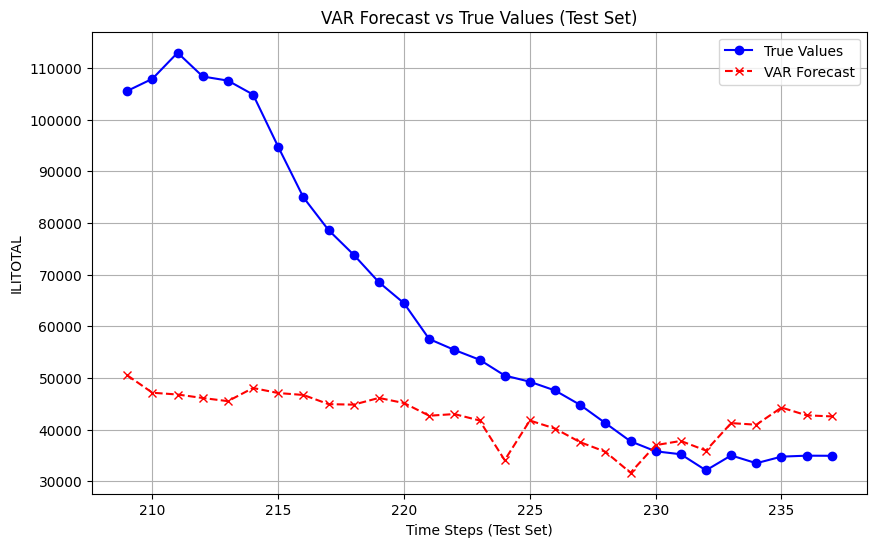

smape_value:  37.735039239987614 horizon: 24
horizon: 0, mse: 0.01647164229891519, mse: 0.10071460805694384, smape: 6.901217450730629
horizon: 1, mse: 0.06291239229891317, mse: 0.2031287893856714, smape: 13.873239216575486
horizon: 2, mse: 0.1284434356078607, mse: 0.28542050009046294, smape: 19.387208882287982
horizon: 3, mse: 0.20423615416731533, mse: 0.3604327433239829, smape: 24.323315991621293
horizon: 4, mse: 0.2763041597120894, mse: 0.4222152858141264, smape: 28.351019328637022
horizon: 5, mse: 0.3449507200544578, mse: 0.46799088677254547, smape: 31.297577781224394
horizon: 6, mse: 0.4163671038637655, mse: 0.5200482954465409, smape: 34.646275124597
horizon: 7, mse: 0.4866501229963642, mse: 0.5837440437444354, smape: 38.79711626768829
horizon: 8, mse: 0.570301642730952, mse: 0.6370389575603709, smape: 42.14713478567849
horizon: 9, mse: 0.6460677537458712, mse: 0.6854858168785782, smape: 45.20713942747655
horizon: 10, mse: 0.7140872797630028, mse: 0.7268296669183755, smape: 47.7985

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
    forecast = model.forecast( steps=horizon) #, exog=exogenous_series[-horizon:])
    return forecast[:, 0]  # Only return the forecast for ILITOTAL (endogenous variable)

    


# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series) - horizon, horizon))
    true_values = np.zeros((len(test_series) - horizon, horizon))

    for i in range(len(test_series) - horizon):

        model = VARMAX(endog=time_series[:split_idx + i], order=(1, 1))
        model_fitted = model.fit(maxlags=1)


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
    time_series = np.array(df[['ILITOTAL','NUM. OF PROVIDERS','OT','h','c']])

    time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 12  # Forecast horizon (steps ahead)

    for horizon in range(24,25):
        smape_value = evaluate_var(time_series,  horizon)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(24):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
    print(f'horizon: avg, mse: {np.mean(mse_global)}, mse: {np.mean(mae_global)}, smape: {np.mean(smape_global)}')


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
    forecast = model.forecast( steps=horizon) #, exog=exogenous_series[-horizon:])
    return forecast[:, 0]  # Only return the forecast for ILITOTAL (endogenous variable)

    


# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series) - horizon, horizon))
    true_values = np.zeros((len(test_series) - horizon, horizon))

    for i in range(len(test_series) - horizon):

        model = VARMAX(endog=time_series[:split_idx + i], order=(1, 1))
        model_fitted = model.fit(maxlags=1)


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
    time_series = np.array(df[['ILITOTAL','NUM. OF PROVIDERS','OT','h','c']])

    time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 12  # Forecast horizon (steps ahead)

    for horizon in range(36,37):
        smape_value = evaluate_var(time_series,  horizon)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(36):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
    print(f'horizon: avg, mse: {np.mean(mse_global)}, mse: {np.mean(mae_global)}, smape: {np.mean(smape_global)}')


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.40800D-01    |proj g|=  2.05734D+00

At iterate    5    f= -9.03018D-01    |proj g|=  4.15431D-01

At iterate   10    f= -9.14193D-01    |proj g|=  1.07715D-01

At iterate   15    f= -9.20856D-01    |proj g|=  3.82926D-01

At iterate   20    f= -9.22928D-01    |proj g|=  4.12678D-01

At iterate   25    f= -9.25830D-01    |proj g|=  1.61528D-01

At iterate   30    f= -9.27334D-01    |proj g|=  2.28153D-01

At iterate   35    f= -9.30506D-01    |proj g|=  1.84321D-01

At iterate   40    f= -9.32380D-01    |proj g|=  1.30583D-01

At iterate   45    f= -9.35411D-01    |proj g|=  7.18737D-02

At iterate   50    f= -9.37416D-01    |proj g|=  3.78482D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.45859D-01    |proj g|=  2.05038D+00


 This problem is unconstrained.



At iterate    5    f= -9.07458D-01    |proj g|=  3.56380D-01

At iterate   10    f= -9.17985D-01    |proj g|=  8.16118D-02

At iterate   15    f= -9.25816D-01    |proj g|=  8.79538D-02

At iterate   20    f= -9.27868D-01    |proj g|=  1.60795D-01

At iterate   25    f= -9.30333D-01    |proj g|=  3.97614D-02

At iterate   30    f= -9.32713D-01    |proj g|=  6.06646D-02

At iterate   35    f= -9.35960D-01    |proj g|=  4.58074D-02

At iterate   40    f= -9.38581D-01    |proj g|=  6.24456D-02

At iterate   45    f= -9.40691D-01    |proj g|=  8.80837D-02

At iterate   50    f= -9.42977D-01    |proj g|=  9.85738D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.48669D-01    |proj g|=  2.05826D+00


 This problem is unconstrained.



At iterate    5    f= -9.11922D-01    |proj g|=  3.91007D-01

At iterate   10    f= -9.22800D-01    |proj g|=  1.15382D-01

At iterate   15    f= -9.30038D-01    |proj g|=  8.59407D-02

At iterate   20    f= -9.32631D-01    |proj g|=  1.53856D-01

At iterate   25    f= -9.34987D-01    |proj g|=  3.56851D-02


KeyboardInterrupt: 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.40800D-01    |proj g|=  2.05734D+00

At iterate    5    f= -9.03018D-01    |proj g|=  4.15431D-01

At iterate   10    f= -9.14193D-01    |proj g|=  1.07715D-01

At iterate   15    f= -9.20856D-01    |proj g|=  3.82926D-01

At iterate   20    f= -9.22928D-01    |proj g|=  4.12678D-01

At iterate   25    f= -9.25830D-01    |proj g|=  1.61528D-01

At iterate   30    f= -9.27334D-01    |proj g|=  2.28153D-01

At iterate   35    f= -9.30506D-01    |proj g|=  1.84321D-01

At iterate   40    f= -9.32380D-01    |proj g|=  1.30583D-01

At iterate   45    f= -9.35411D-01    |proj g|=  7.18737D-02

At iterate   50    f= -9.37416D-01    |proj g|=  3.78482D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.45859D-01    |proj g|=  2.05038D+00


 This problem is unconstrained.



At iterate    5    f= -9.07458D-01    |proj g|=  3.56380D-01

At iterate   10    f= -9.17985D-01    |proj g|=  8.16118D-02

At iterate   15    f= -9.25816D-01    |proj g|=  8.79538D-02

At iterate   20    f= -9.27868D-01    |proj g|=  1.60795D-01

At iterate   25    f= -9.30333D-01    |proj g|=  3.97614D-02

At iterate   30    f= -9.32713D-01    |proj g|=  6.06646D-02

At iterate   35    f= -9.35960D-01    |proj g|=  4.58074D-02

At iterate   40    f= -9.38581D-01    |proj g|=  6.24456D-02

At iterate   45    f= -9.40691D-01    |proj g|=  8.80837D-02

At iterate   50    f= -9.42977D-01    |proj g|=  9.85738D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.48669D-01    |proj g|=  2.05826D+00


 This problem is unconstrained.



At iterate    5    f= -9.11922D-01    |proj g|=  3.91007D-01

At iterate   10    f= -9.22800D-01    |proj g|=  1.15382D-01

At iterate   15    f= -9.30038D-01    |proj g|=  8.59407D-02

At iterate   20    f= -9.32631D-01    |proj g|=  1.53856D-01

At iterate   25    f= -9.34987D-01    |proj g|=  3.56851D-02

At iterate   30    f= -9.36712D-01    |proj g|=  8.98937D-02

At iterate   35    f= -9.40224D-01    |proj g|=  6.17059D-02

At iterate   40    f= -9.42710D-01    |proj g|=  2.93987D-01

At iterate   45    f= -9.45810D-01    |proj g|=  1.32579D-01

At iterate   50    f= -9.47786D-01    |proj g|=  6.30006D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.59383D-01    |proj g|=  2.08466D+00


 This problem is unconstrained.



At iterate    5    f= -9.22324D-01    |proj g|=  3.12012D-01

At iterate   10    f= -9.33028D-01    |proj g|=  9.21600D-02

At iterate   15    f= -9.40700D-01    |proj g|=  5.77060D-02

At iterate   20    f= -9.42885D-01    |proj g|=  6.08972D-02

At iterate   25    f= -9.45531D-01    |proj g|=  9.50908D-02

At iterate   30    f= -9.47866D-01    |proj g|=  1.46614D-01

At iterate   35    f= -9.51188D-01    |proj g|=  5.68770D-02

At iterate   40    f= -9.54249D-01    |proj g|=  2.09005D-01

At iterate   45    f= -9.56202D-01    |proj g|=  2.25633D-01

At iterate   50    f= -9.58454D-01    |proj g|=  5.31867D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           70     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.69724D-01    |proj g|=  2.09134D+00


 This problem is unconstrained.



At iterate    5    f= -9.32331D-01    |proj g|=  2.84103D-01

At iterate   10    f= -9.43199D-01    |proj g|=  1.08532D-01

At iterate   15    f= -9.50350D-01    |proj g|=  3.14403D-01

At iterate   20    f= -9.52371D-01    |proj g|=  2.18148D-01

At iterate   25    f= -9.54837D-01    |proj g|=  8.02421D-02

At iterate   30    f= -9.56693D-01    |proj g|=  6.83414D-02

At iterate   35    f= -9.60068D-01    |proj g|=  5.81920D-02

At iterate   40    f= -9.62261D-01    |proj g|=  6.40769D-02

At iterate   45    f= -9.65021D-01    |proj g|=  1.01823D-01

At iterate   50    f= -9.67129D-01    |proj g|=  1.89544D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


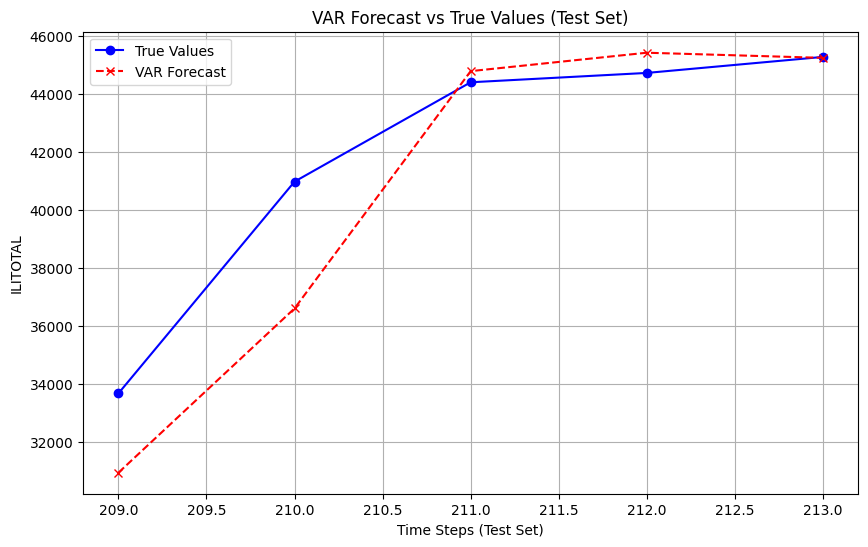

MSE: 0.0338
MAE: 0.1407
SMAPE: 9.6272%


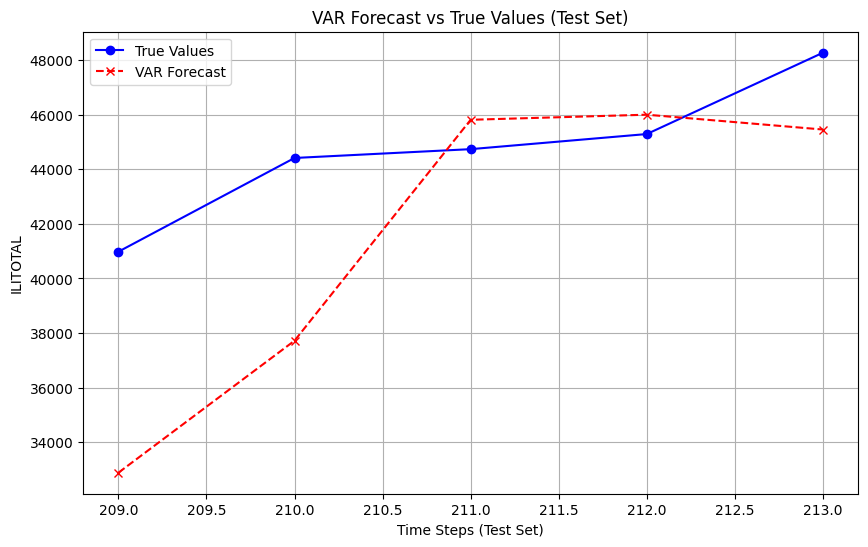

MSE: 0.0367
MAE: 0.1537
SMAPE: 10.5148%


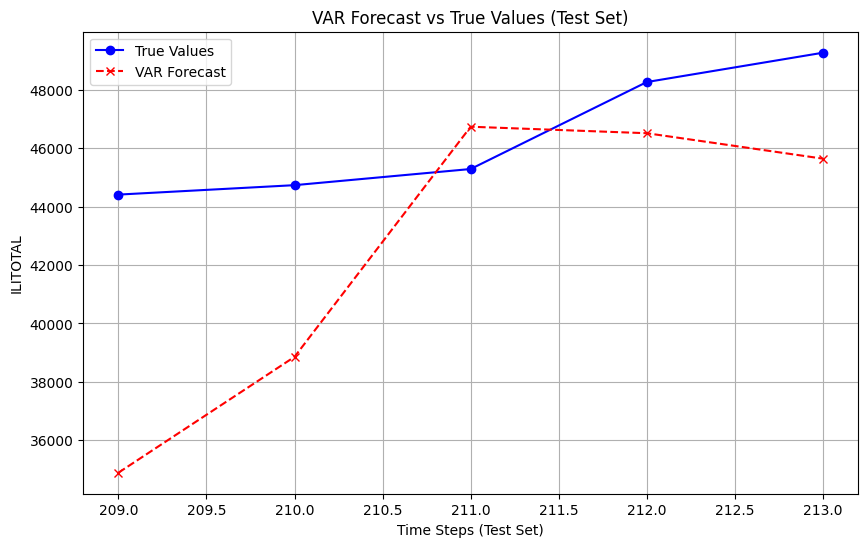

MSE: 0.0414
MAE: 0.1705
SMAPE: 11.6683%


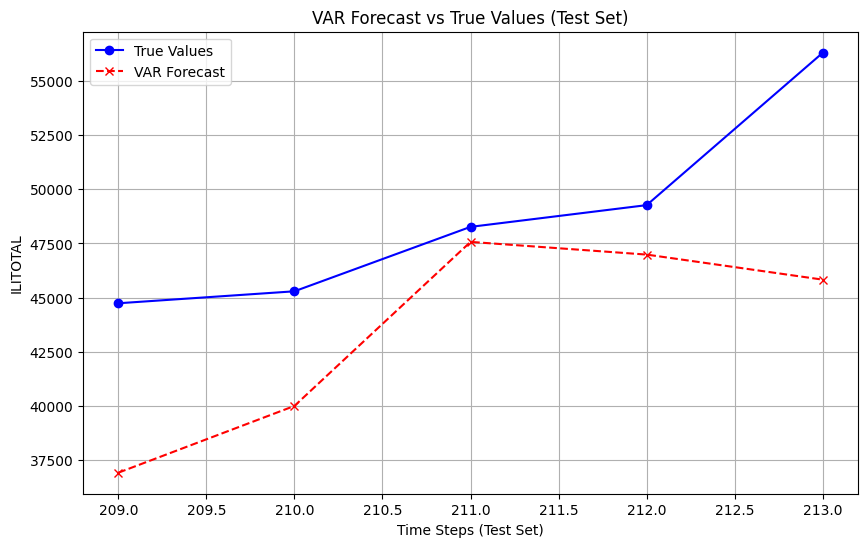

MSE: 0.0547
MAE: 0.2121
SMAPE: 14.5108%


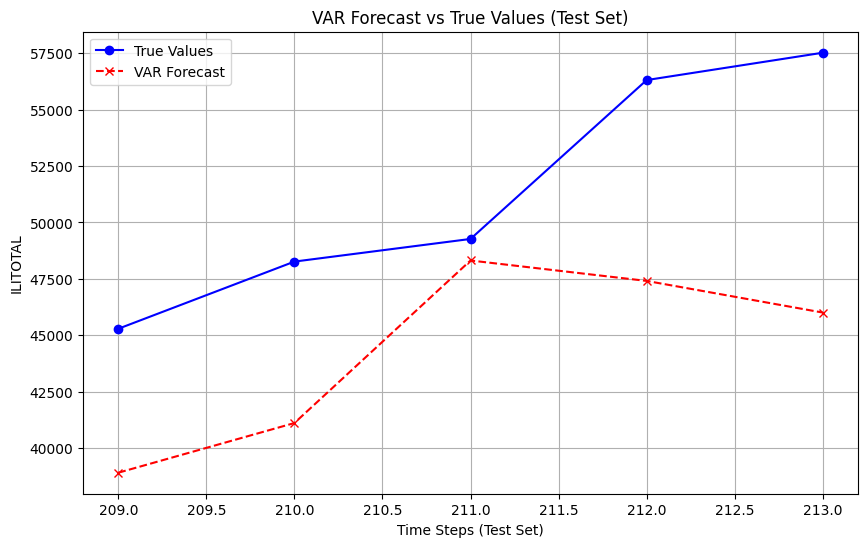

MSE: 0.0838
MAE: 0.2767
SMAPE: 18.9118%


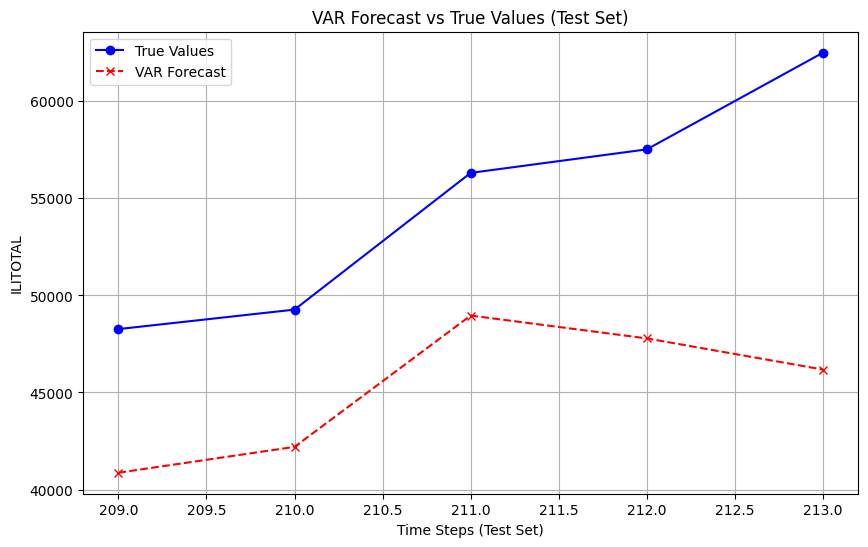

MSE: 0.1375
MAE: 0.3484
SMAPE: 23.7468%


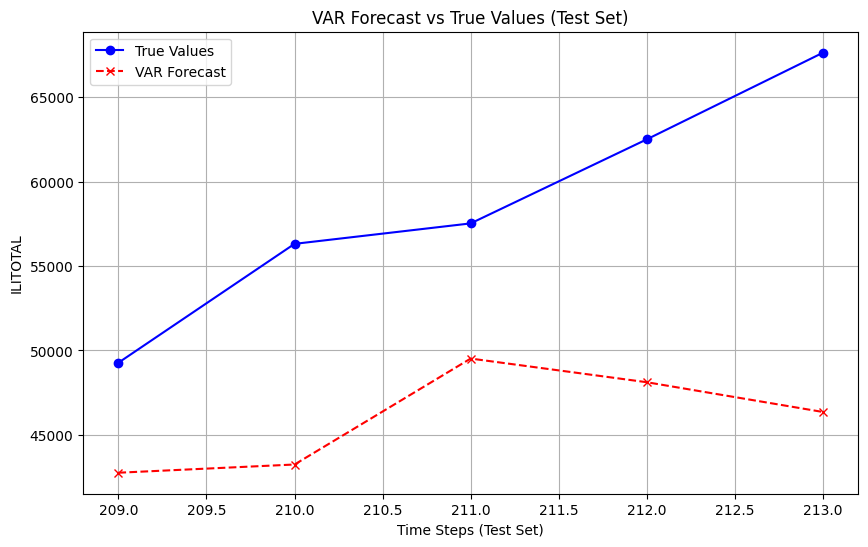

MSE: 0.2038
MAE: 0.4360
SMAPE: 29.6443%


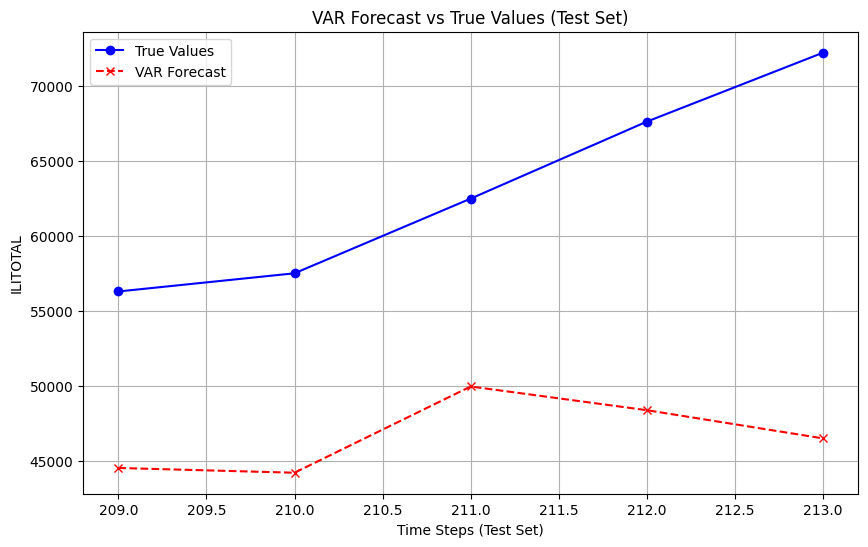

MSE: 0.3244
MAE: 0.5365
SMAPE: 36.2351%


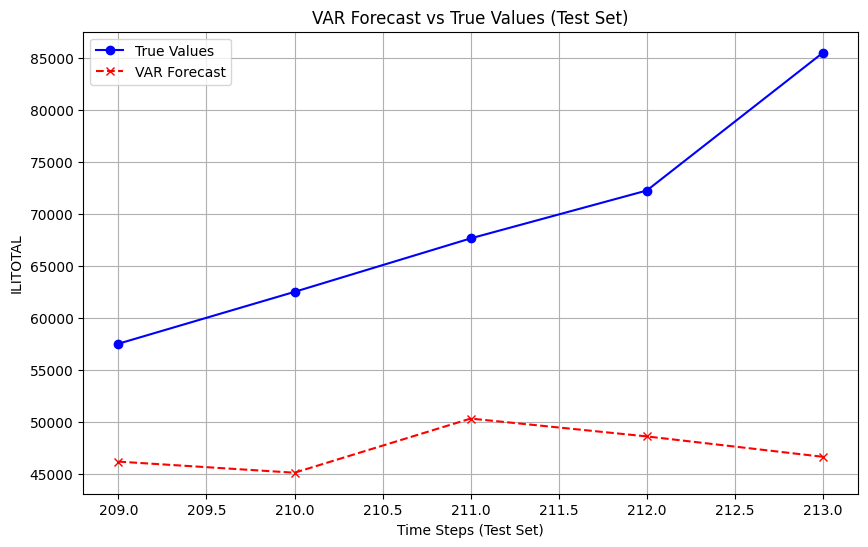

MSE: 0.4688
MAE: 0.6518
SMAPE: 43.7681%


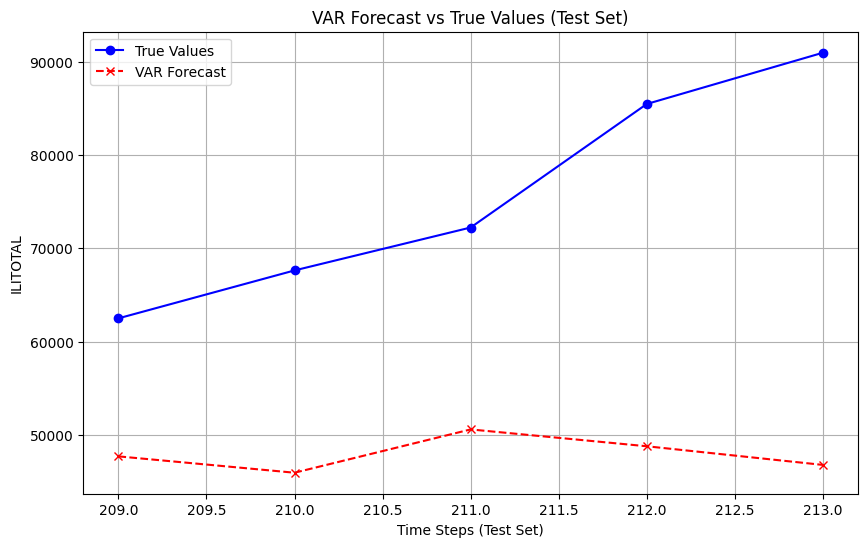

MSE: 0.5558
MAE: 0.7279
SMAPE: 48.7947%


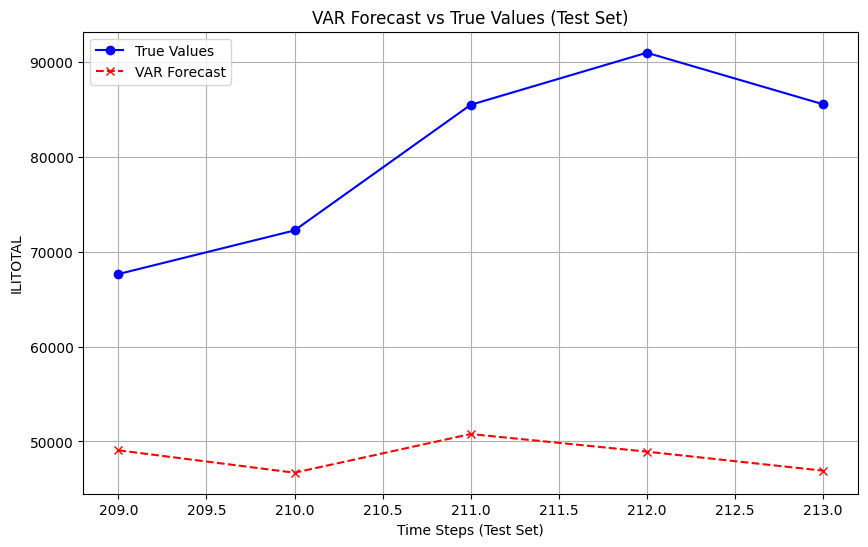

MSE: 0.7450
MAE: 0.8402
SMAPE: 55.8641%


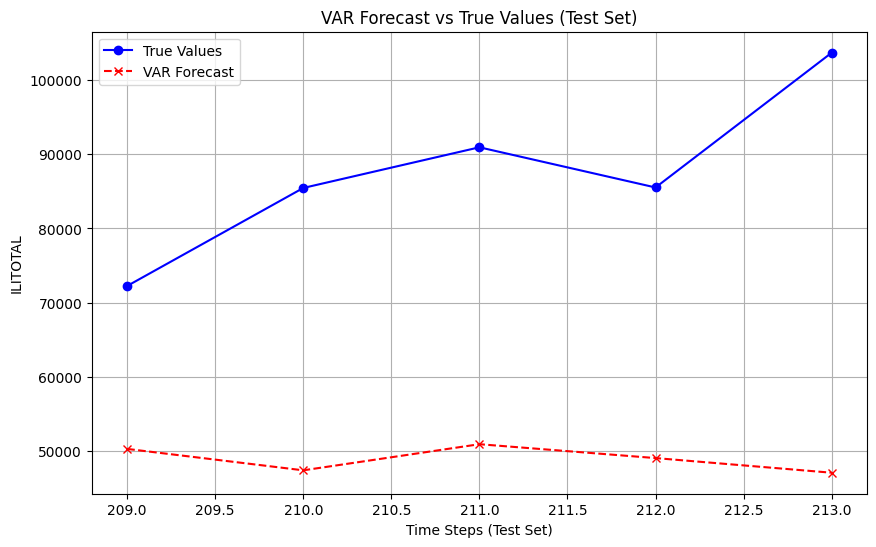

MSE: 0.9723
MAE: 0.9641
SMAPE: 63.5457%


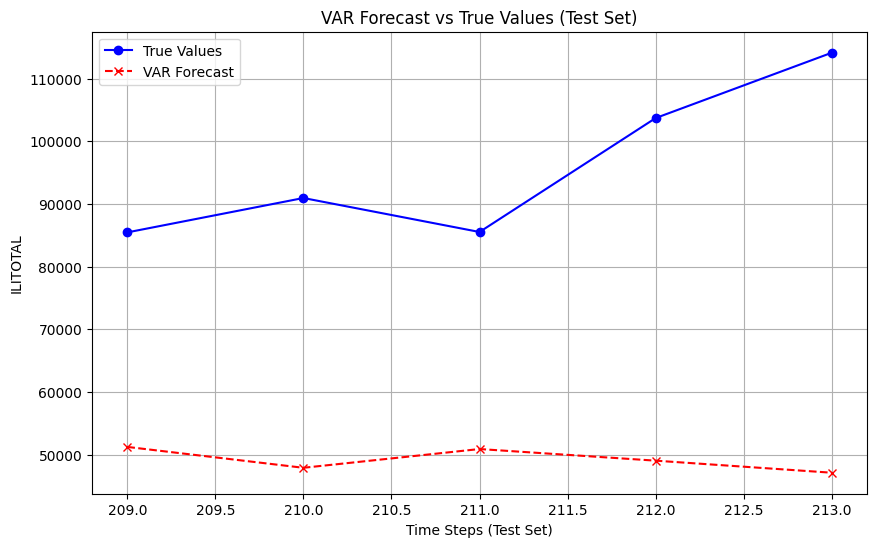

MSE: 1.2689
MAE: 1.0930
SMAPE: 71.1083%


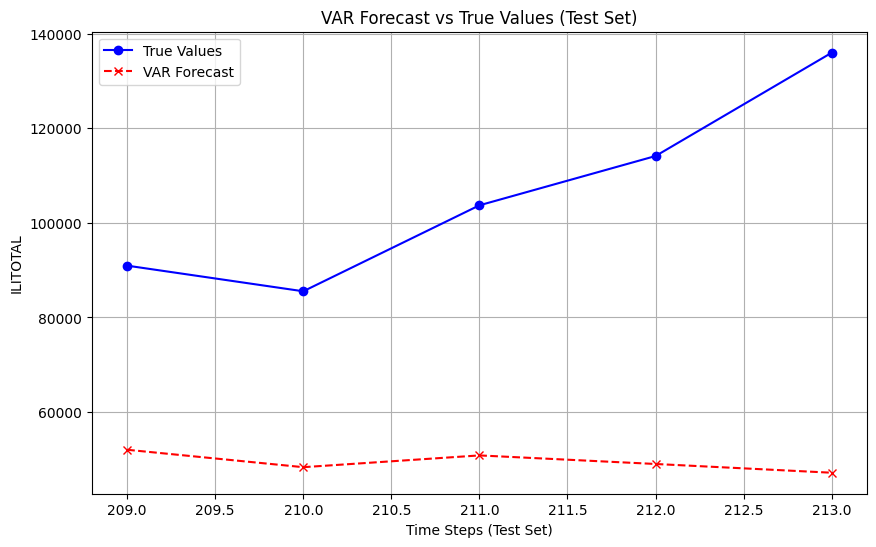

MSE: 1.7251
MAE: 1.2598
SMAPE: 80.3424%


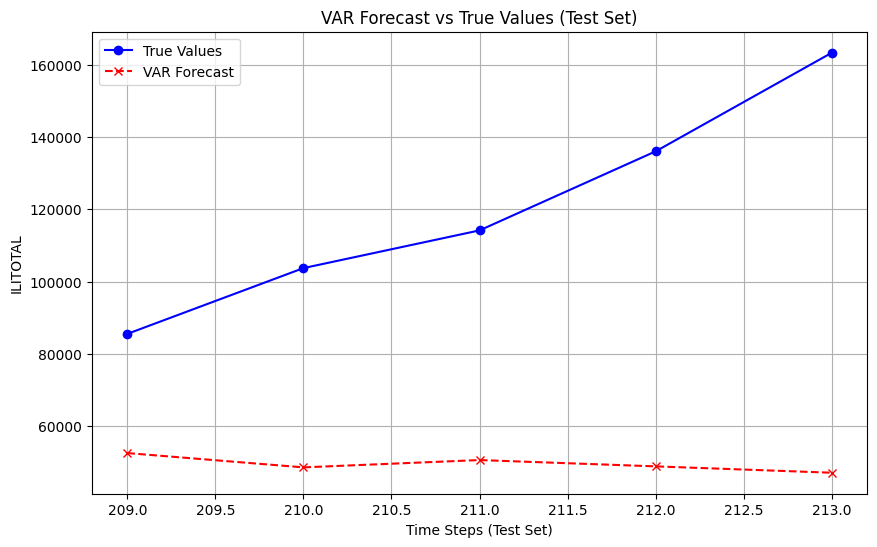

MSE: 2.2158
MAE: 1.4534
SMAPE: 91.3324%


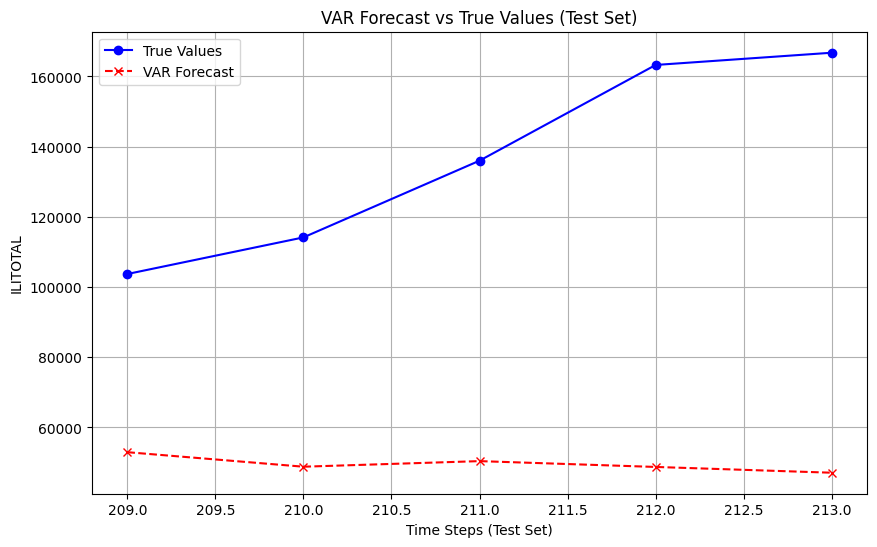

MSE: 2.4624
MAE: 1.5505
SMAPE: 96.8725%


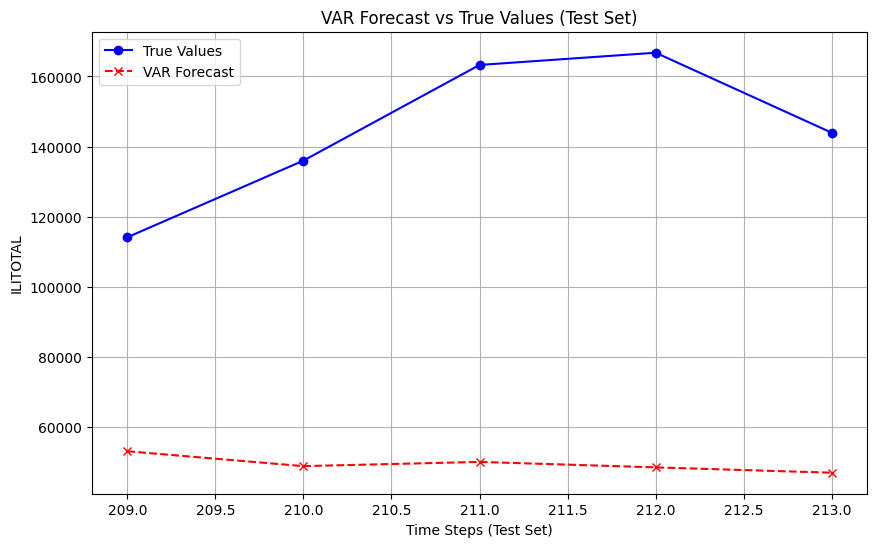

MSE: 2.4828
MAE: 1.5654
SMAPE: 97.8646%


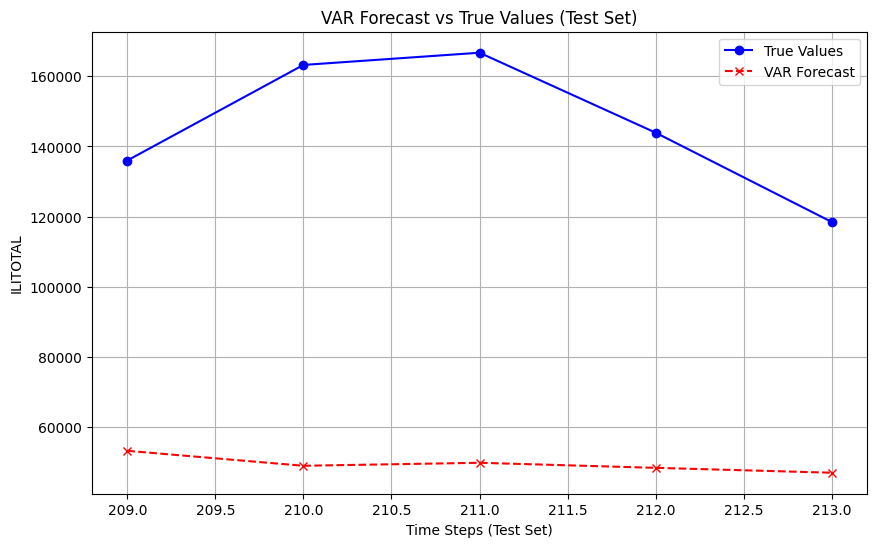

MSE: 2.2562
MAE: 1.4824
SMAPE: 93.2663%


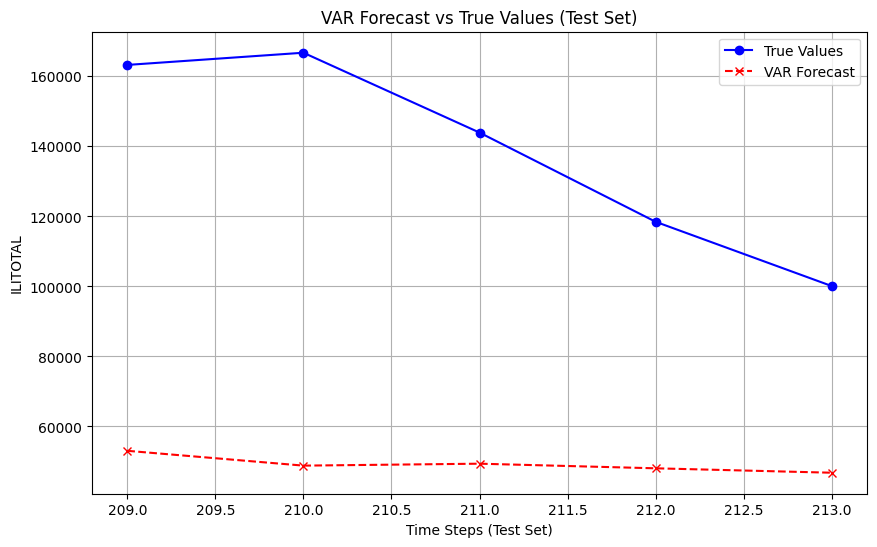

MSE: 1.9124
MAE: 1.3639
SMAPE: 86.8621%


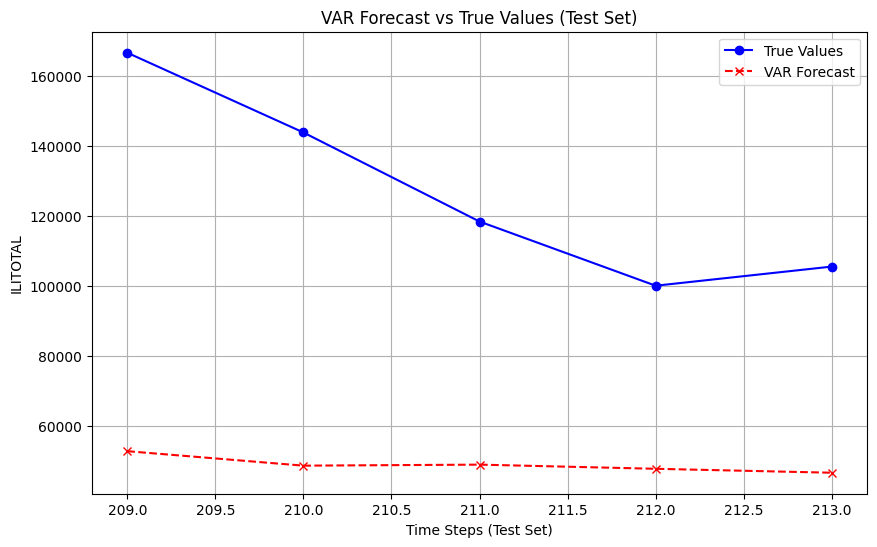

MSE: 1.5758
MAE: 1.2475
SMAPE: 80.5711%


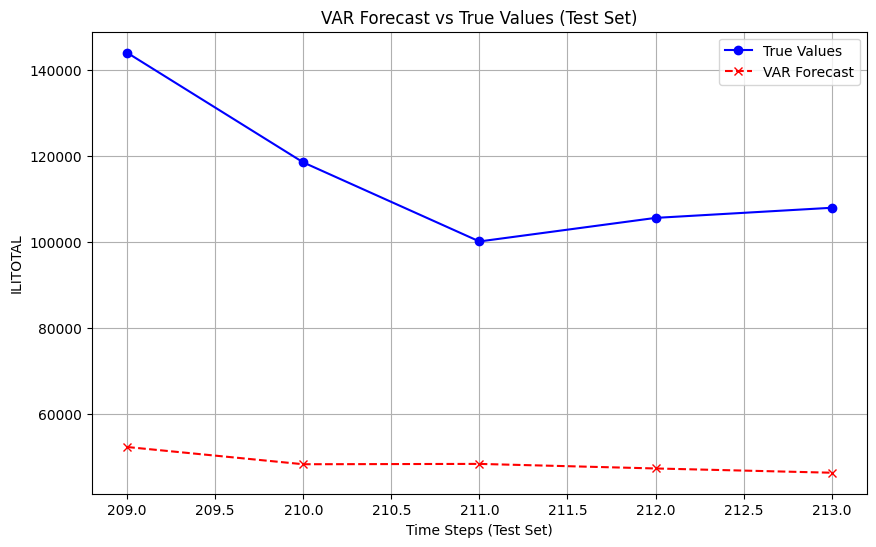

MSE: 1.4202
MAE: 1.1892
SMAPE: 77.3041%


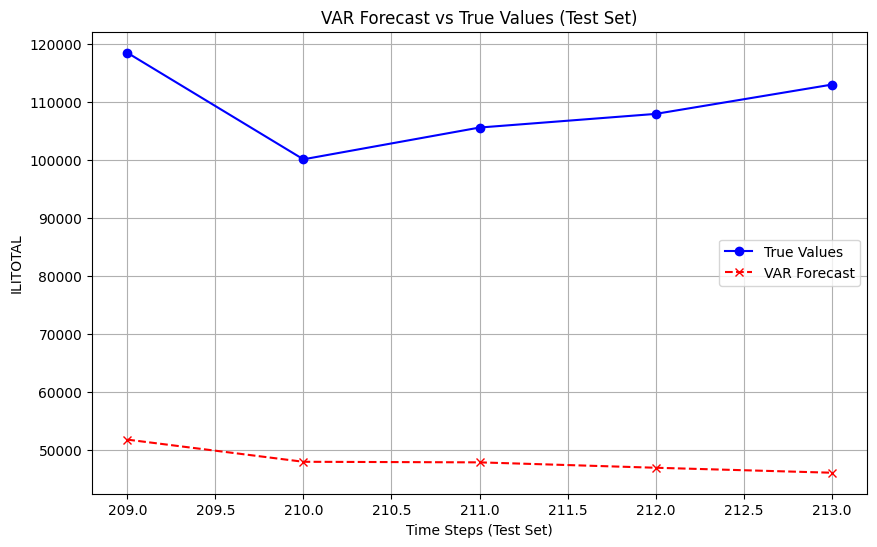

MSE: 1.3977
MAE: 1.1772
SMAPE: 76.5556%


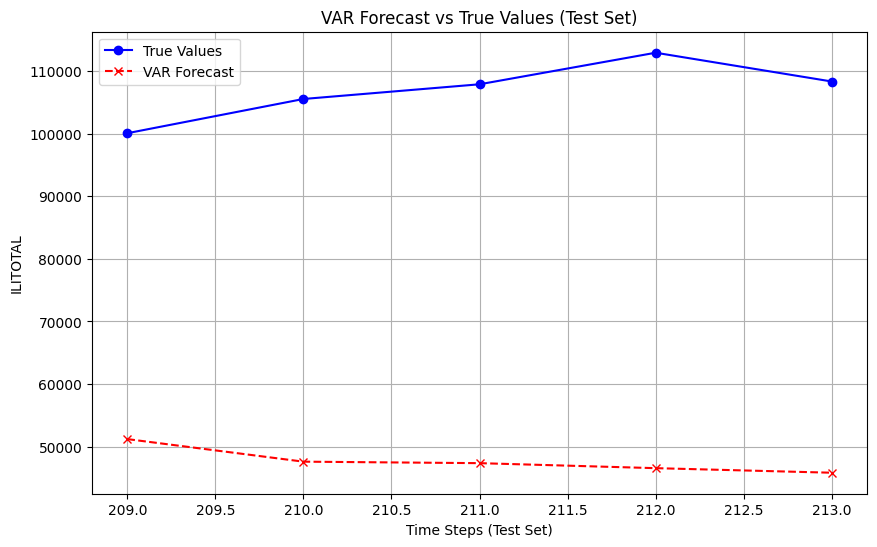

MSE: 1.4780
MAE: 1.2135
SMAPE: 78.7198%


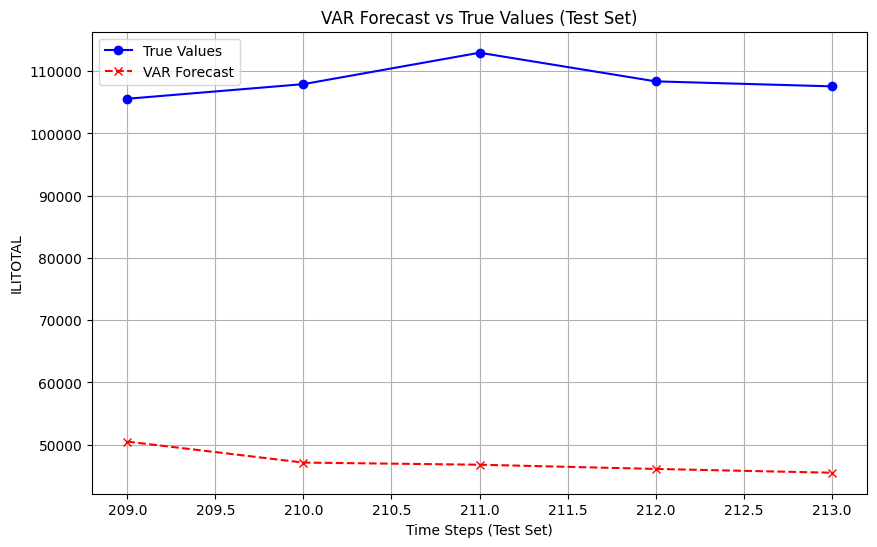

MSE: 1.5111
MAE: 1.2281
SMAPE: 79.5847%


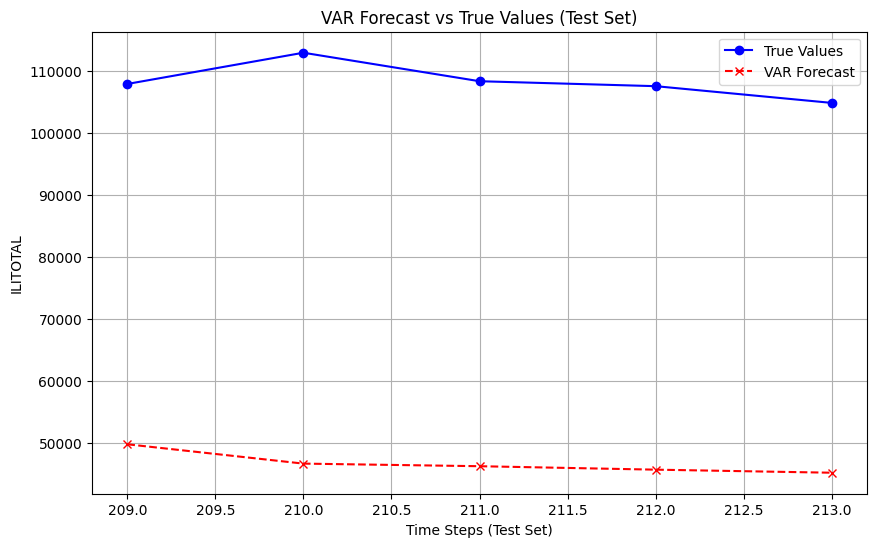

MSE: 1.4621
MAE: 1.2077
SMAPE: 78.4023%


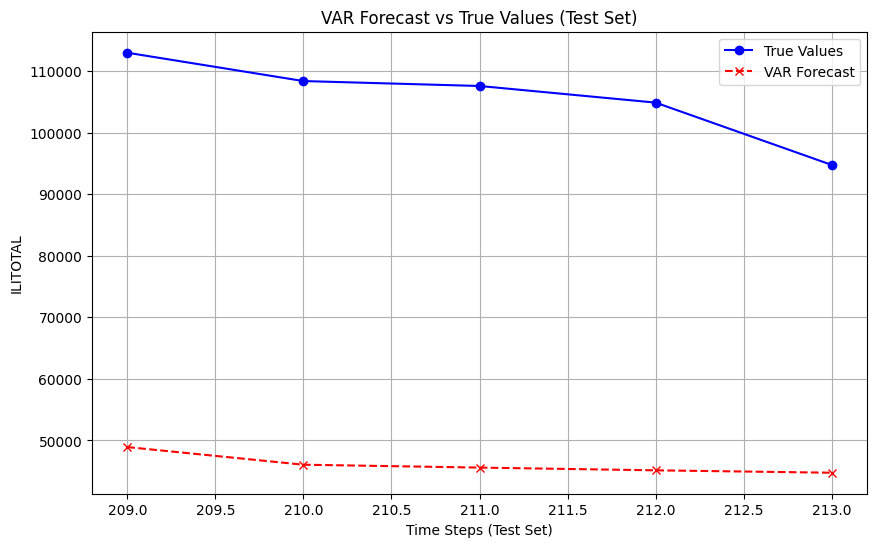

MSE: 1.3194
MAE: 1.1432
SMAPE: 74.5545%


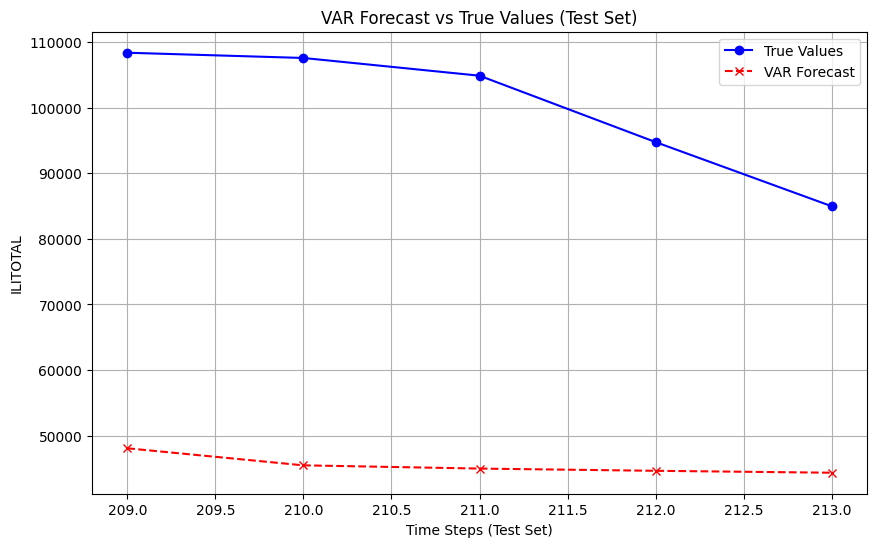

MSE: 1.1640
MAE: 1.0688
SMAPE: 70.0583%


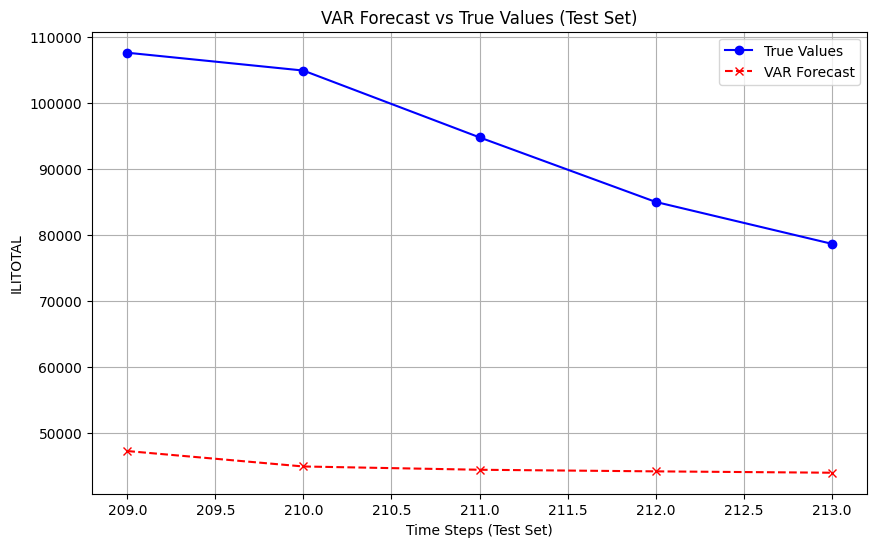

MSE: 0.9819
MAE: 0.9788
SMAPE: 64.5812%


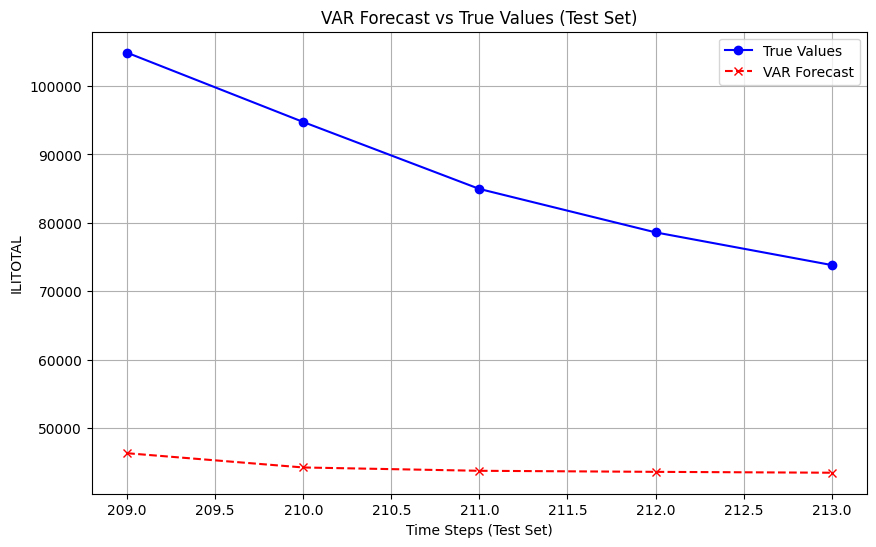

MSE: 0.7842
MAE: 0.8748
SMAPE: 58.1660%


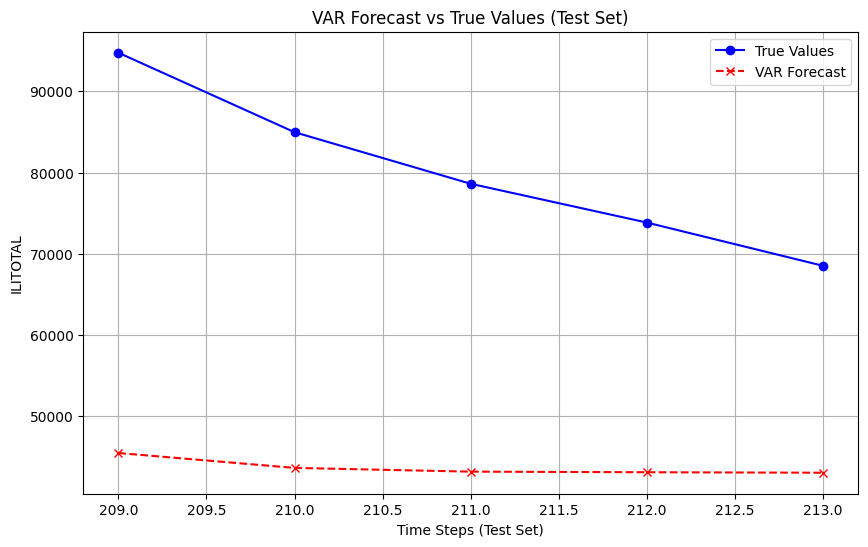

MSE: 0.6275
MAE: 0.7827
SMAPE: 52.3655%


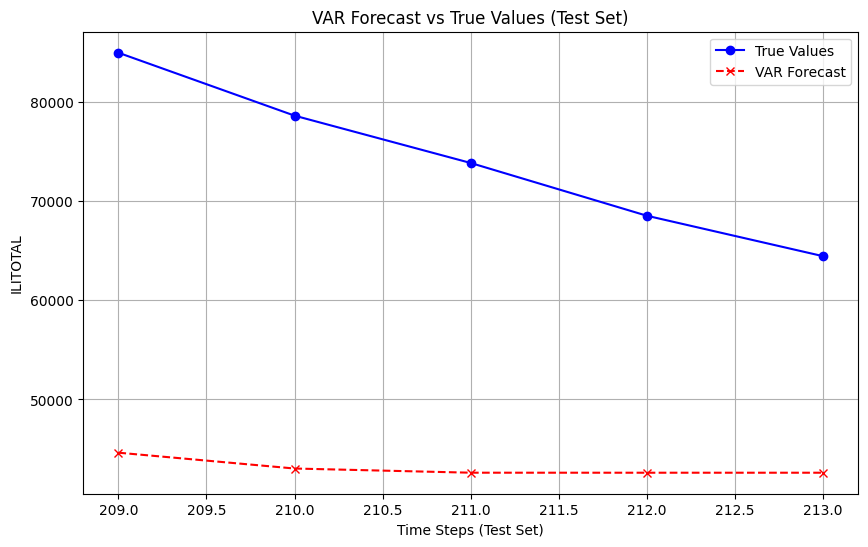

MSE: 0.4955
MAE: 0.6893
SMAPE: 46.3292%


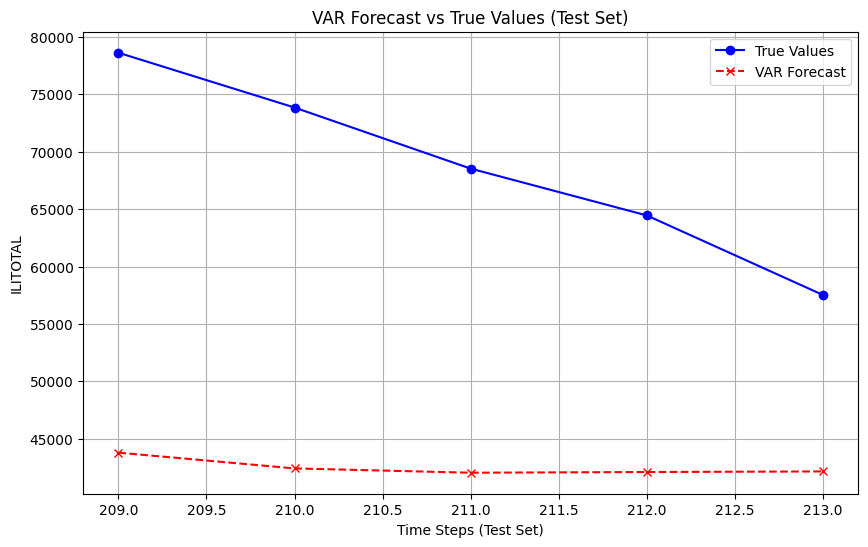

MSE: 0.3895
MAE: 0.6075
SMAPE: 40.9950%


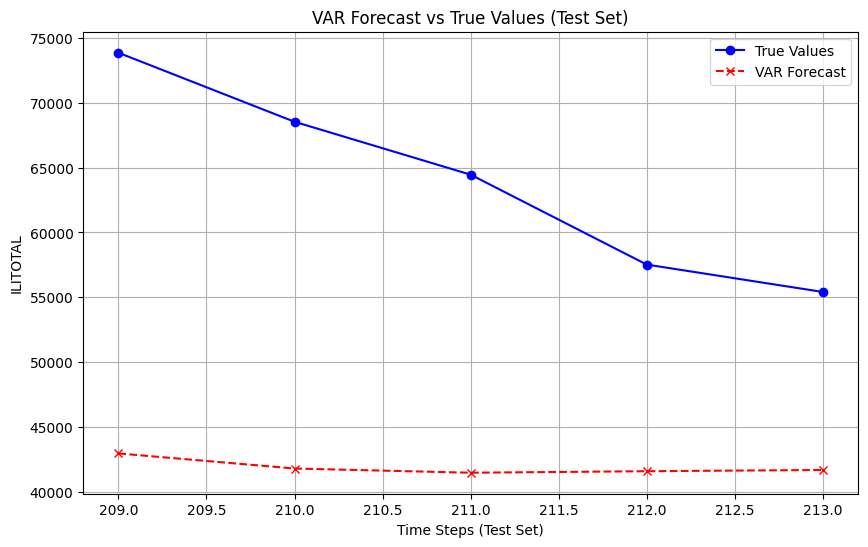

MSE: 0.3005
MAE: 0.5336
SMAPE: 36.1440%


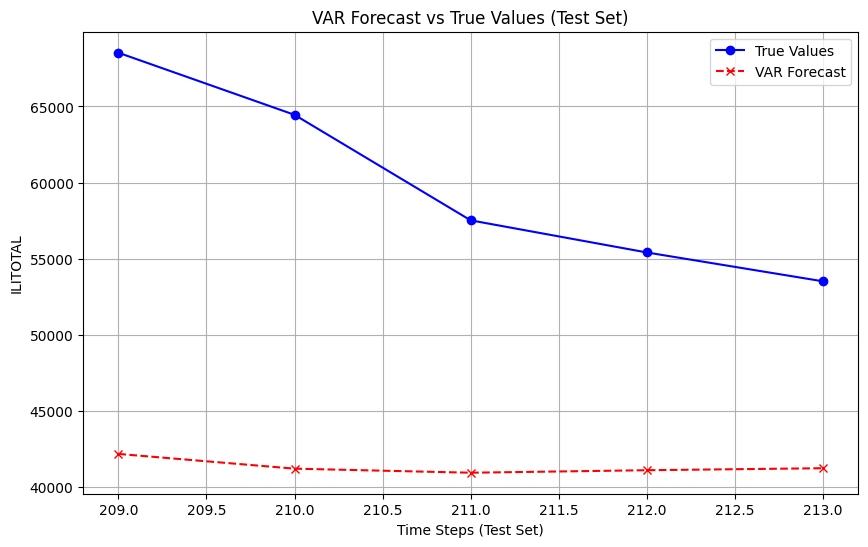

MSE: 0.2277
MAE: 0.4641
SMAPE: 31.5285%


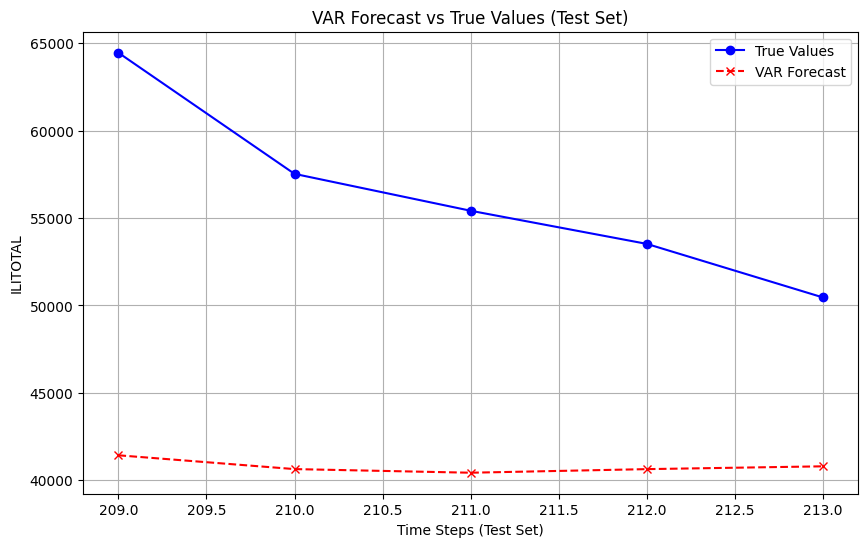

MSE: 0.1706
MAE: 0.4049
SMAPE: 27.5855%


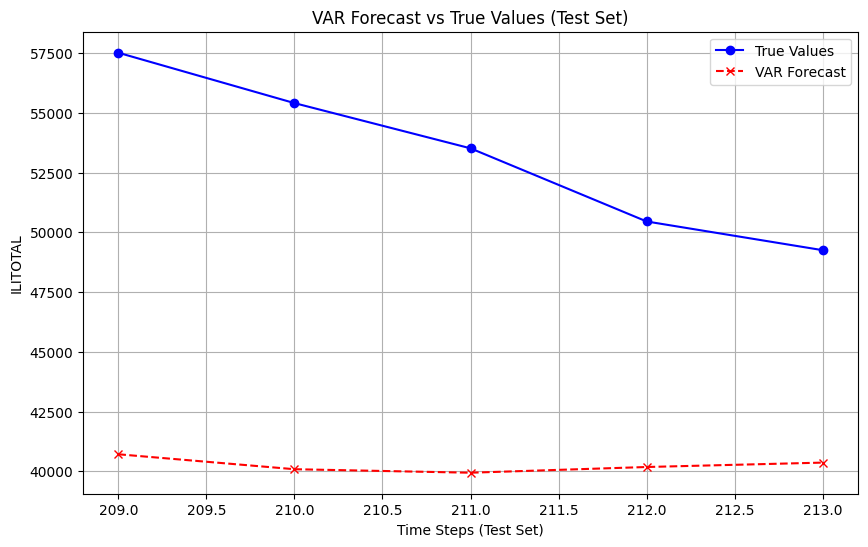

MSE: 0.1421
MAE: 0.3683
SMAPE: 25.1155%


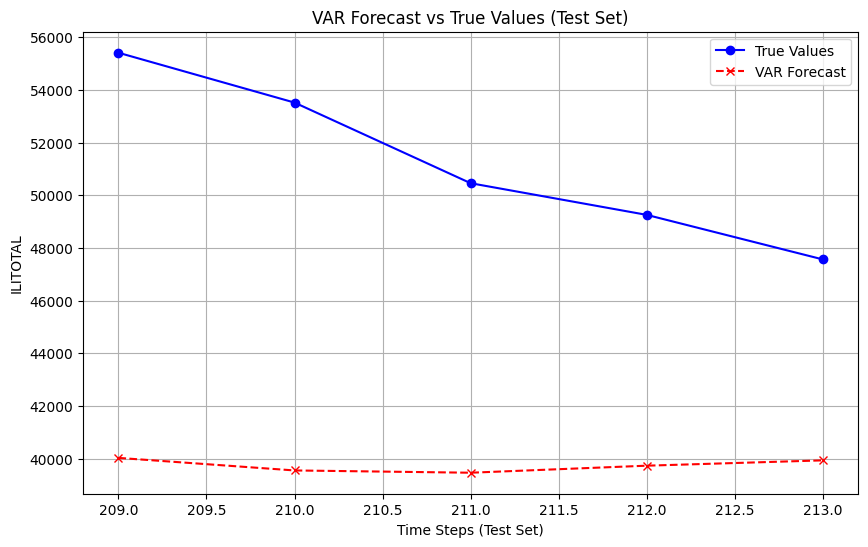

MSE: 0.1132
MAE: 0.3243
SMAPE: 22.1370%


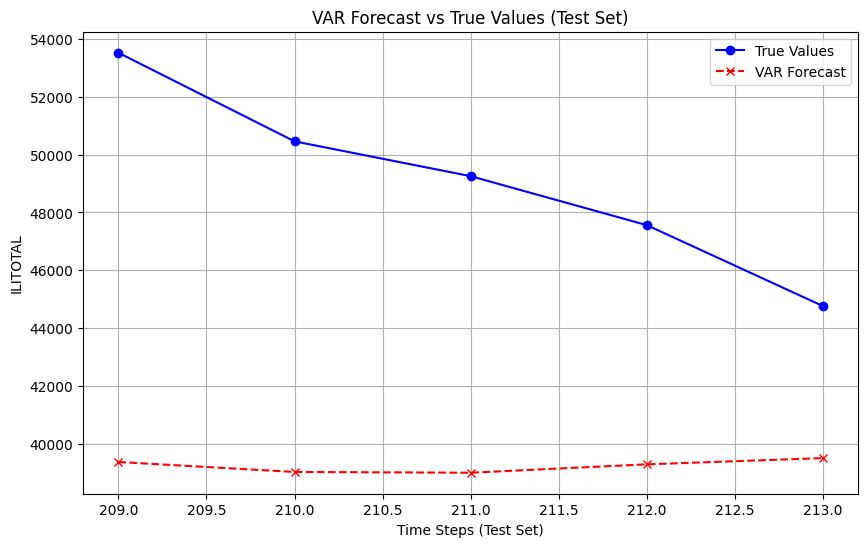

MSE: 0.0833
MAE: 0.2659
SMAPE: 18.1697%


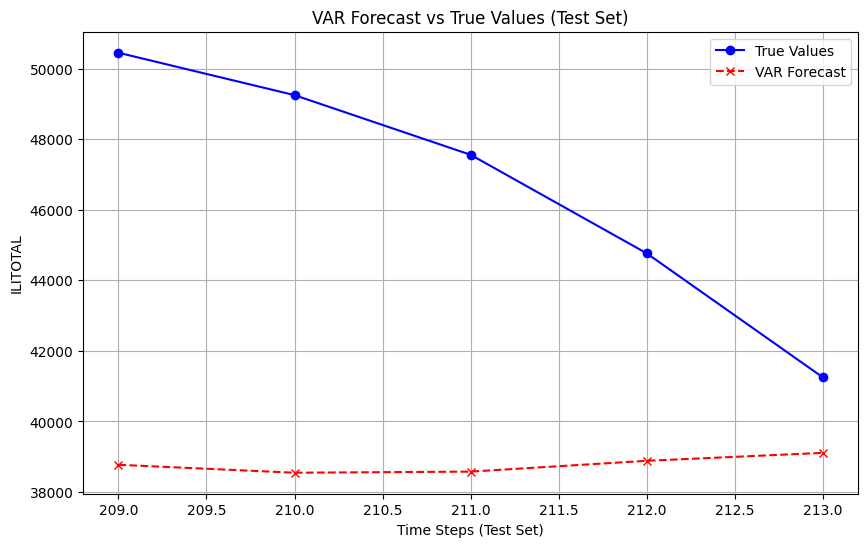

MSE: 0.0616
MAE: 0.2132
SMAPE: 14.5744%


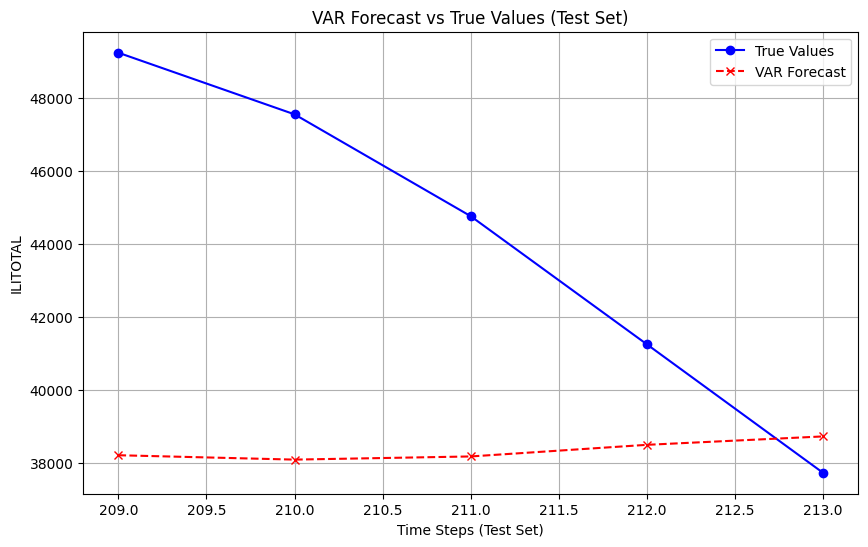

MSE: 0.0412
MAE: 0.1672
SMAPE: 11.4430%


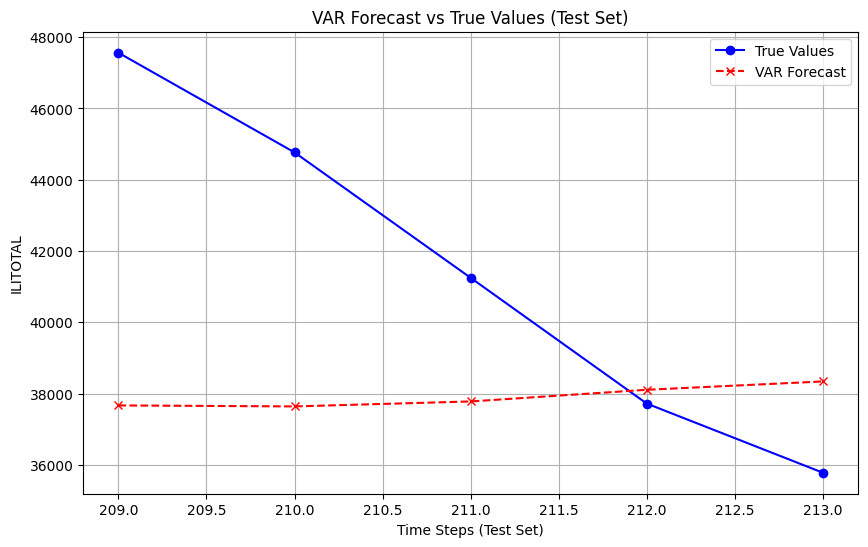

MSE: 0.0228
MAE: 0.1241
SMAPE: 8.5031%


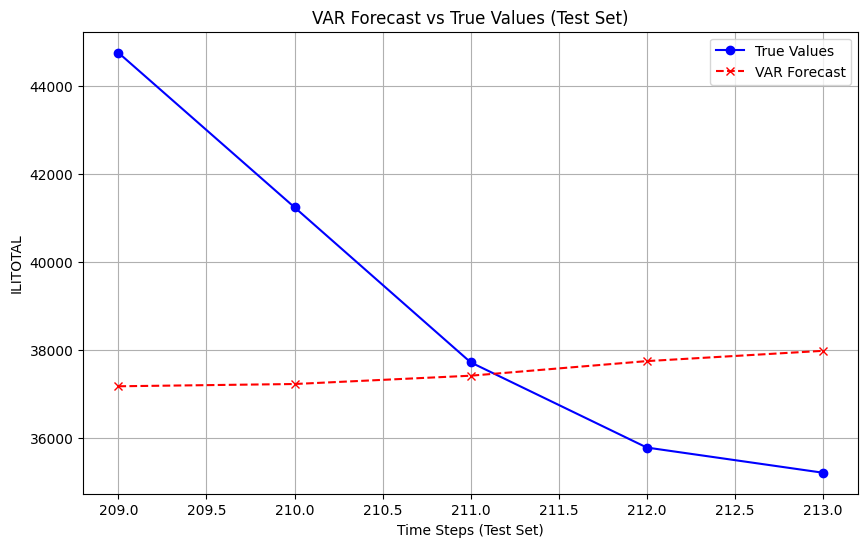

MSE: 0.0189
MAE: 0.1153
SMAPE: 7.8991%


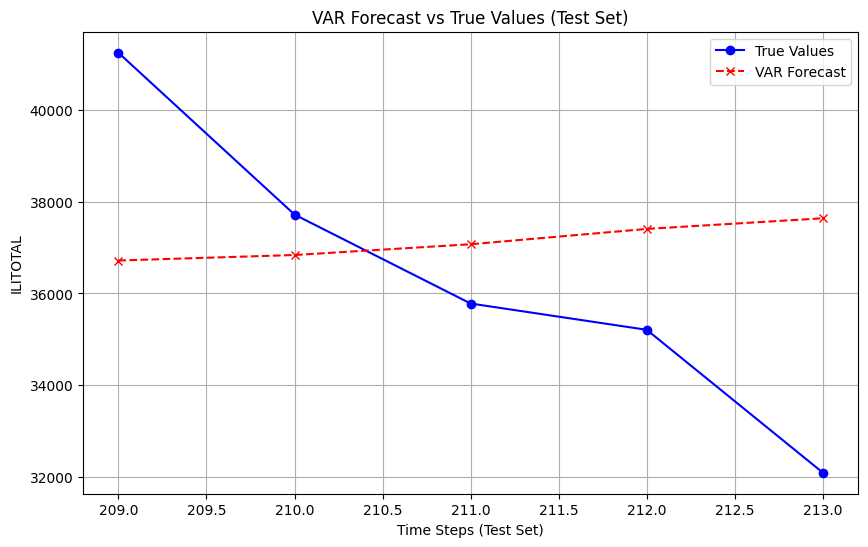

MSE: 0.0122
MAE: 0.0903
SMAPE: 6.1879%


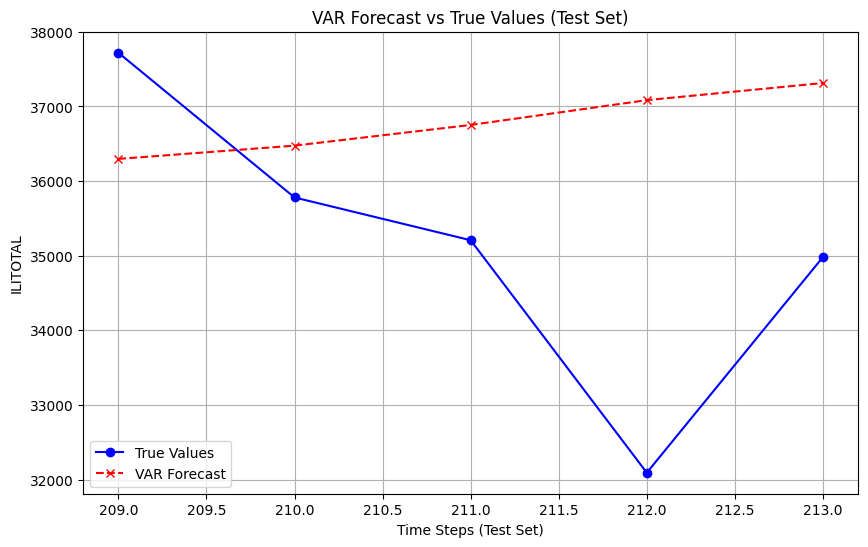

MSE: 0.0125
MAE: 0.0896
SMAPE: 6.1437%


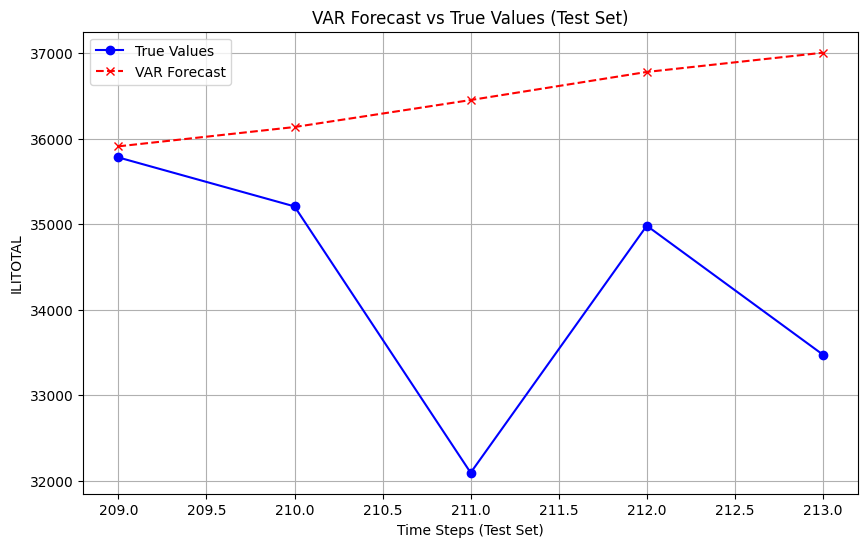

MSE: 0.0101
MAE: 0.0859
SMAPE: 5.8898%


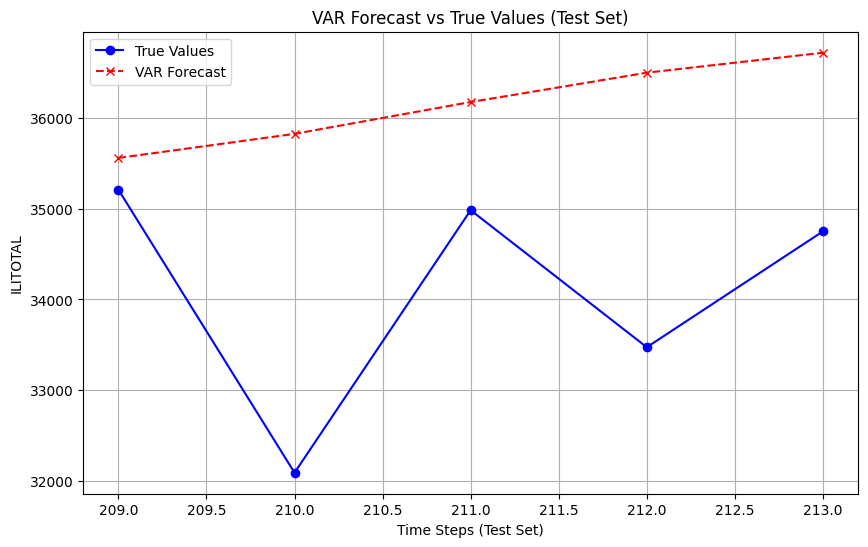

MSE: 0.0074
MAE: 0.0767
SMAPE: 5.2597%


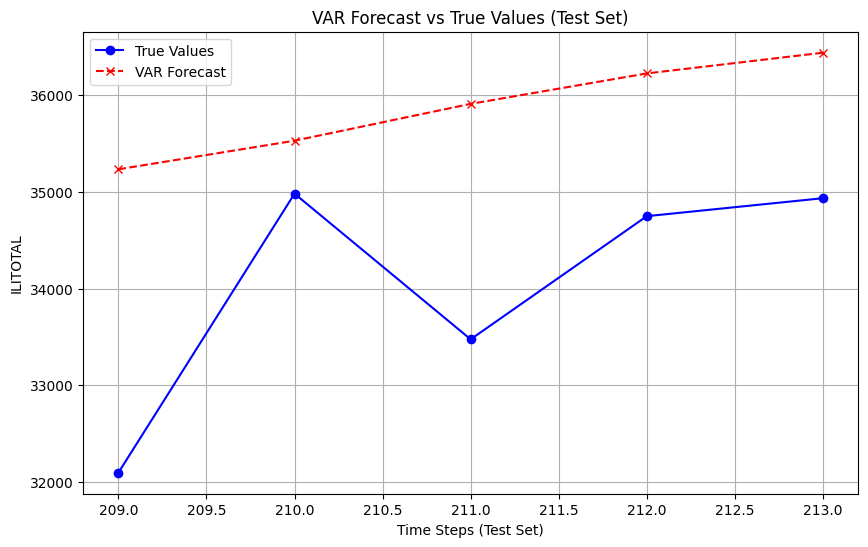

MSE: 0.0024
MAE: 0.0421
SMAPE: 2.8893%


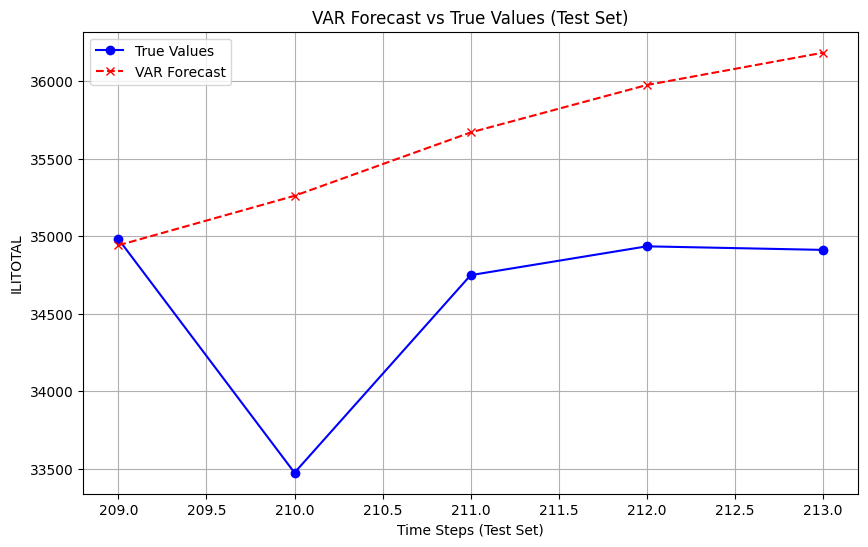

smape_value:  2.8892988580901147 horizon: 48
horizon: 0, mse: 0.008620076922727801, mse: 0.06492055775628293, smape: 4.450979669074698
horizon: 1, mse: 0.03376563958010816, mse: 0.14067981769412538, smape: 9.627182015612824
horizon: 2, mse: 0.036667715426914216, mse: 0.15366798350316324, smape: 10.51478702588981
horizon: 3, mse: 0.04139543600286319, mse: 0.1704934732268454, smape: 11.668302020725974
horizon: 4, mse: 0.054704780464066315, mse: 0.21206708776117109, smape: 14.510824685359086
horizon: 5, mse: 0.08380102526815536, mse: 0.2767208115998116, smape: 18.9117907542136
horizon: 6, mse: 0.13745679934612628, mse: 0.34841845516187514, smape: 23.746788843085593
horizon: 7, mse: 0.20383001511395774, mse: 0.43600458776208206, smape: 29.644282317321547
horizon: 8, mse: 0.324427833327476, mse: 0.5364844581051453, smape: 36.235099869503415
horizon: 9, mse: 0.46877753968405944, mse: 0.6517918992066264, smape: 43.768068580464835
horizon: 10, mse: 0.555778076584438, mse: 0.7279064327780154, s

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
    forecast = model.forecast( steps=horizon) #, exog=exogenous_series[-horizon:])
    return forecast[:, 0]  # Only return the forecast for ILITOTAL (endogenous variable)

    


# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series) - horizon, horizon))
    true_values = np.zeros((len(test_series) - horizon, horizon))

    for i in range(len(test_series) - horizon):

        model = VARMAX(endog=time_series[:split_idx + i], order=(1, 1))
        model_fitted = model.fit(maxlags=1)


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
    time_series = np.array(df[['ILITOTAL','NUM. OF PROVIDERS','OT','h','c']])

    time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 12  # Forecast horizon (steps ahead)

    for horizon in range(48,49):
        smape_value = evaluate_var(time_series,  horizon)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(48):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
    print(f'horizon: avg, mse: {np.mean(mse_global)}, mse: {np.mean(mae_global)}, smape: {np.mean(smape_global)}')


In [5]:
print(f'horizon: avg, mse: {np.mean(mse_global[horizon])}, mse: {np.mean(mae_global[horizon])}, smape: {np.mean(smape_global[horizon])}')


IndexError: list index out of range

In [2]:
import numpy as np
k = [5.957386274614439, 12.68410802756608,18.335589016740805, 23.54794369564718,28.031125492774216,31.54588704291091]
np.mean(k)

20.017006591708938

In [3]:
k = [5.957386274614439, 12.68410802756608,18.335589016740805, 23.54794369564718,28.031125492774216,31.54588704291091,35.3527108057025,39.2038512120013,42.45295017200866,45.289379165038845,47.60625055862604,49.41459804617169]
np.mean(k)


31.618481625816887

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.76655D-01    |proj g|=  1.47102D+00

At iterate    5    f= -1.00579D+00    |proj g|=  4.98051D-01

At iterate   10    f= -1.02214D+00    |proj g|=  2.02149D-01

At iterate   15    f= -1.03182D+00    |proj g|=  1.31067D-01

At iterate   20    f= -1.03661D+00    |proj g|=  1.45377D-01

At iterate   25    f= -1.04427D+00    |proj g|=  2.47220D-01

At iterate   30    f= -1.04937D+00    |proj g|=  6.32322D-02

At iterate   35    f= -1.05389D+00    |proj g|=  4.71319D-02

At iterate   40    f= -1.05779D+00    |proj g|=  5.62978D-02

At iterate   45    f= -1.06030D+00    |proj g|=  2.14163D-01

At iterate   50    f= -1.06307D+00    |proj g|=  3.92524D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.82313D-01    |proj g|=  1.45377D+00


 This problem is unconstrained.



At iterate    5    f= -1.01107D+00    |proj g|=  5.04304D-01

At iterate   10    f= -1.02668D+00    |proj g|=  1.92514D-01

At iterate   15    f= -1.03665D+00    |proj g|=  1.76096D-01

At iterate   20    f= -1.04104D+00    |proj g|=  2.07829D-01

At iterate   25    f= -1.04906D+00    |proj g|=  3.22988D-01

At iterate   30    f= -1.05382D+00    |proj g|=  5.78345D-02

At iterate   35    f= -1.05838D+00    |proj g|=  9.05320D-02

At iterate   40    f= -1.06234D+00    |proj g|=  7.04321D-02

At iterate   45    f= -1.06472D+00    |proj g|=  1.00393D-01

At iterate   50    f= -1.06758D+00    |proj g|=  7.05788D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.90465D-01    |proj g|=  1.43252D+00


 This problem is unconstrained.



At iterate    5    f= -1.01919D+00    |proj g|=  5.36399D-01

At iterate   10    f= -1.03439D+00    |proj g|=  2.09567D-01

At iterate   15    f= -1.04455D+00    |proj g|=  1.10832D-01

At iterate   20    f= -1.04948D+00    |proj g|=  1.16894D-01

At iterate   25    f= -1.05734D+00    |proj g|=  4.45541D-01

At iterate   30    f= -1.06218D+00    |proj g|=  8.20417D-02

At iterate   35    f= -1.06638D+00    |proj g|=  5.77062D-02

At iterate   40    f= -1.06951D+00    |proj g|=  5.00882D-02

At iterate   45    f= -1.07212D+00    |proj g|=  4.63415D-02

At iterate   50    f= -1.07531D+00    |proj g|=  6.17275D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00025D+00    |proj g|=  1.42041D+00


 This problem is unconstrained.



At iterate    5    f= -1.02857D+00    |proj g|=  5.31187D-01

At iterate   10    f= -1.04345D+00    |proj g|=  2.05299D-01

At iterate   15    f= -1.05347D+00    |proj g|=  1.11185D-01

At iterate   20    f= -1.05819D+00    |proj g|=  1.08558D-01

At iterate   25    f= -1.06712D+00    |proj g|=  3.04309D-01

At iterate   30    f= -1.07127D+00    |proj g|=  8.76238D-02

At iterate   35    f= -1.07592D+00    |proj g|=  6.80789D-02

At iterate   40    f= -1.07896D+00    |proj g|=  4.36568D-02

At iterate   45    f= -1.08182D+00    |proj g|=  6.98054D-02

At iterate   50    f= -1.08440D+00    |proj g|=  9.51849D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01006D+00    |proj g|=  1.41347D+00


 This problem is unconstrained.



At iterate    5    f= -1.03812D+00    |proj g|=  5.32910D-01

At iterate   10    f= -1.05277D+00    |proj g|=  2.05765D-01

At iterate   15    f= -1.06268D+00    |proj g|=  1.04391D-01

At iterate   20    f= -1.06736D+00    |proj g|=  1.05063D-01

At iterate   25    f= -1.07508D+00    |proj g|=  1.25782D-01

At iterate   30    f= -1.08022D+00    |proj g|=  1.98843D-01

At iterate   35    f= -1.08500D+00    |proj g|=  1.44653D-01

At iterate   40    f= -1.08877D+00    |proj g|=  1.20826D-01

At iterate   45    f= -1.09109D+00    |proj g|=  7.49707D-02

At iterate   50    f= -1.09349D+00    |proj g|=  5.54983D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01931D+00    |proj g|=  1.41750D+00


 This problem is unconstrained.



At iterate    5    f= -1.04729D+00    |proj g|=  5.25984D-01

At iterate   10    f= -1.06181D+00    |proj g|=  1.97998D-01

At iterate   15    f= -1.07133D+00    |proj g|=  1.02067D-01

At iterate   20    f= -1.07620D+00    |proj g|=  1.91384D-01

At iterate   25    f= -1.08402D+00    |proj g|=  1.06784D-01

At iterate   30    f= -1.08954D+00    |proj g|=  1.24707D-01

At iterate   35    f= -1.09262D+00    |proj g|=  9.98270D-02

At iterate   40    f= -1.09598D+00    |proj g|=  1.35569D-01

At iterate   45    f= -1.09915D+00    |proj g|=  6.62838D-02

At iterate   50    f= -1.10159D+00    |proj g|=  1.33677D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02655D+00    |proj g|=  1.40028D+00


 This problem is unconstrained.



At iterate    5    f= -1.05428D+00    |proj g|=  5.50316D-01

At iterate   10    f= -1.06873D+00    |proj g|=  2.10478D-01

At iterate   15    f= -1.07814D+00    |proj g|=  9.72468D-02

At iterate   20    f= -1.08243D+00    |proj g|=  1.52808D-01

At iterate   25    f= -1.09067D+00    |proj g|=  2.74045D-01

At iterate   30    f= -1.09525D+00    |proj g|=  1.91075D-01

At iterate   35    f= -1.09969D+00    |proj g|=  1.30370D-01

At iterate   40    f= -1.10317D+00    |proj g|=  7.50311D-02

At iterate   45    f= -1.10539D+00    |proj g|=  4.84209D-02

At iterate   50    f= -1.10829D+00    |proj g|=  4.16385D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.03621D+00    |proj g|=  1.40719D+00


 This problem is unconstrained.



At iterate    5    f= -1.06372D+00    |proj g|=  5.42677D-01

At iterate   10    f= -1.07808D+00    |proj g|=  2.04300D-01

At iterate   15    f= -1.08731D+00    |proj g|=  1.04380D-01

At iterate   20    f= -1.09097D+00    |proj g|=  1.22038D-01

At iterate   25    f= -1.09915D+00    |proj g|=  1.36514D-01

At iterate   30    f= -1.10347D+00    |proj g|=  3.43595D-01

At iterate   35    f= -1.10707D+00    |proj g|=  2.12494D-01

At iterate   40    f= -1.11078D+00    |proj g|=  9.60892D-02

At iterate   45    f= -1.11399D+00    |proj g|=  5.18124D-02

At iterate   50    f= -1.11694D+00    |proj g|=  3.12011D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.43009D-01    |proj g|=  1.37857D+00


 This problem is unconstrained.



At iterate    5    f= -9.72074D-01    |proj g|=  5.23360D-01

At iterate   10    f= -9.86327D-01    |proj g|=  1.98200D-01

At iterate   15    f= -9.96652D-01    |proj g|=  1.30009D-01

At iterate   20    f= -1.00025D+00    |proj g|=  1.14861D-01

At iterate   25    f= -1.00736D+00    |proj g|=  1.38209D-01

At iterate   30    f= -1.01269D+00    |proj g|=  1.40394D-01

At iterate   35    f= -1.01694D+00    |proj g|=  2.25447D-01

At iterate   40    f= -1.02095D+00    |proj g|=  5.65861D-02

At iterate   45    f= -1.02345D+00    |proj g|=  7.09610D-02

At iterate   50    f= -1.02689D+00    |proj g|=  6.37237D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.53133D-01    |proj g|=  1.27873D+00


 This problem is unconstrained.



At iterate    5    f= -9.80162D-01    |proj g|=  5.35450D-01

At iterate   10    f= -9.93400D-01    |proj g|=  1.97392D-01

At iterate   15    f= -1.00363D+00    |proj g|=  1.10733D-01

At iterate   20    f= -1.00726D+00    |proj g|=  1.75677D-01

At iterate   25    f= -1.01410D+00    |proj g|=  1.37747D-01

At iterate   30    f= -1.01949D+00    |proj g|=  1.89333D-01

At iterate   35    f= -1.02319D+00    |proj g|=  6.58413D-02

At iterate   40    f= -1.02681D+00    |proj g|=  5.63815D-02

At iterate   45    f= -1.02935D+00    |proj g|=  9.26068D-02

At iterate   50    f= -1.03296D+00    |proj g|=  7.80682D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.64581D-01    |proj g|=  1.23608D+00


 This problem is unconstrained.



At iterate    5    f= -9.93883D-01    |proj g|=  5.06010D-01

At iterate   10    f= -1.00640D+00    |proj g|=  3.59386D-01

At iterate   15    f= -1.01330D+00    |proj g|=  1.55360D-01

At iterate   20    f= -1.01687D+00    |proj g|=  1.48541D-01

At iterate   25    f= -1.02398D+00    |proj g|=  3.77688D-01

At iterate   30    f= -1.02894D+00    |proj g|=  6.45799D-02

At iterate   35    f= -1.03303D+00    |proj g|=  1.27429D-01

At iterate   40    f= -1.03653D+00    |proj g|=  1.05545D-01

At iterate   45    f= -1.03860D+00    |proj g|=  1.05353D-01

At iterate   50    f= -1.04136D+00    |proj g|=  1.28927D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.77228D-01    |proj g|=  1.21060D+00


 This problem is unconstrained.



At iterate    5    f= -1.00562D+00    |proj g|=  5.06157D-01

At iterate   10    f= -1.01773D+00    |proj g|=  3.38021D-01

At iterate   15    f= -1.02448D+00    |proj g|=  2.44852D-01

At iterate   20    f= -1.02921D+00    |proj g|=  1.14175D-01

At iterate   25    f= -1.03679D+00    |proj g|=  1.97080D-01

At iterate   30    f= -1.04013D+00    |proj g|=  6.54401D-02

At iterate   35    f= -1.04353D+00    |proj g|=  4.74728D-02

At iterate   40    f= -1.04730D+00    |proj g|=  5.07507D-02

At iterate   45    f= -1.04962D+00    |proj g|=  9.45067D-02

At iterate   50    f= -1.05264D+00    |proj g|=  1.06368D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88078D-01    |proj g|=  1.19916D+00


 This problem is unconstrained.



At iterate    5    f= -1.01640D+00    |proj g|=  5.11000D-01

At iterate   10    f= -1.02822D+00    |proj g|=  3.10945D-01

At iterate   15    f= -1.03419D+00    |proj g|=  4.82795D-01

At iterate   20    f= -1.03884D+00    |proj g|=  2.23058D-01

At iterate   25    f= -1.04584D+00    |proj g|=  2.26524D-01

At iterate   30    f= -1.04985D+00    |proj g|=  1.00730D-01

At iterate   35    f= -1.05456D+00    |proj g|=  9.06002D-02

At iterate   40    f= -1.05835D+00    |proj g|=  3.11048D-01

At iterate   45    f= -1.06124D+00    |proj g|=  1.52481D-01

At iterate   50    f= -1.06374D+00    |proj g|=  6.62132D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95515D-01    |proj g|=  1.20472D+00

At iterate    5    f= -1.02417D+00    |proj g|=  5.18585D-01

At iterate   10    f= -1.03594D+00    |proj g|=  2.72383D-01

At iterate   15    f= -1.04201D+00    |proj g|=  1.98858D-01

At iterate   20    f= -1.04595D+00    |proj g|=  4.31726D-01

At iterate   25    f= -1.05244D+00    |proj g|=  3.05042D-01

At iterate   30    f= -1.05704D+00    |proj g|=  5.79885D-02

At iterate   35    f= -1.06059D+00    |proj g|=  4.93312D-02

At iterate   40    f= -1.06433D+00    |proj g|=  7.66746D-02

At iterate   45    f= -1.06620D+00    |proj g|=  7.78430D-02

At iterate   50    f= -1.06915D+00    |proj g|=  2.15606D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00679D+00    |proj g|=  1.19883D+00


 This problem is unconstrained.



At iterate    5    f= -1.03494D+00    |proj g|=  5.15815D-01

At iterate   10    f= -1.04668D+00    |proj g|=  2.69203D-01

At iterate   15    f= -1.05288D+00    |proj g|=  3.53616D-01

At iterate   20    f= -1.05693D+00    |proj g|=  2.51509D-01

At iterate   25    f= -1.06371D+00    |proj g|=  4.39966D-01

At iterate   30    f= -1.06795D+00    |proj g|=  7.83821D-02

At iterate   35    f= -1.07185D+00    |proj g|=  4.71978D-02

At iterate   40    f= -1.07498D+00    |proj g|=  7.18774D-02

At iterate   45    f= -1.07734D+00    |proj g|=  7.93738D-02

At iterate   50    f= -1.08022D+00    |proj g|=  5.21264D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00412D+00    |proj g|=  1.10990D+00


 This problem is unconstrained.



At iterate    5    f= -1.02994D+00    |proj g|=  9.67469D-01

At iterate   10    f= -1.04139D+00    |proj g|=  3.35493D-01

At iterate   15    f= -1.04833D+00    |proj g|=  1.51130D-01

At iterate   20    f= -1.05228D+00    |proj g|=  1.16631D-01

At iterate   25    f= -1.05963D+00    |proj g|=  3.09587D-01

At iterate   30    f= -1.06408D+00    |proj g|=  7.07407D-02

At iterate   35    f= -1.06751D+00    |proj g|=  6.48925D-02

At iterate   40    f= -1.07088D+00    |proj g|=  1.20852D-01

At iterate   45    f= -1.07314D+00    |proj g|=  1.62295D-01

At iterate   50    f= -1.07513D+00    |proj g|=  1.42648D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.86011D-01    |proj g|=  1.16586D+00


 This problem is unconstrained.



At iterate    5    f= -1.01461D+00    |proj g|=  5.10604D-01

At iterate   10    f= -1.02605D+00    |proj g|=  2.60232D-01

At iterate   15    f= -1.03159D+00    |proj g|=  2.77239D-01

At iterate   20    f= -1.03543D+00    |proj g|=  2.55224D-01

At iterate   25    f= -1.04203D+00    |proj g|=  1.08026D-01

At iterate   30    f= -1.04593D+00    |proj g|=  1.38738D-01

At iterate   35    f= -1.04938D+00    |proj g|=  2.12099D-01

At iterate   40    f= -1.05217D+00    |proj g|=  5.52648D-02

At iterate   45    f= -1.05443D+00    |proj g|=  4.62429D-02

At iterate   50    f= -1.05658D+00    |proj g|=  3.25327D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95281D-01    |proj g|=  1.19203D+00


 This problem is unconstrained.



At iterate    5    f= -1.02385D+00    |proj g|=  5.06979D-01

At iterate   10    f= -1.03530D+00    |proj g|=  2.22020D-01

At iterate   15    f= -1.04146D+00    |proj g|=  1.14489D-01

At iterate   20    f= -1.04615D+00    |proj g|=  9.20658D-02

At iterate   25    f= -1.05316D+00    |proj g|=  7.19173D-02

At iterate   30    f= -1.05626D+00    |proj g|=  8.46495D-02

At iterate   35    f= -1.05955D+00    |proj g|=  6.27396D-02

At iterate   40    f= -1.06223D+00    |proj g|=  2.85328D-01

At iterate   45    f= -1.06482D+00    |proj g|=  1.07115D-01

At iterate   50    f= -1.06676D+00    |proj g|=  6.71102D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00360D+00    |proj g|=  1.14075D+00


 This problem is unconstrained.



At iterate    5    f= -1.03192D+00    |proj g|=  9.20514D-01

At iterate   10    f= -1.04268D+00    |proj g|=  3.36051D-01

At iterate   15    f= -1.05031D+00    |proj g|=  2.27612D-01

At iterate   20    f= -1.05483D+00    |proj g|=  1.59378D-01

At iterate   25    f= -1.06160D+00    |proj g|=  7.85176D-02

At iterate   30    f= -1.06487D+00    |proj g|=  9.22239D-02

At iterate   35    f= -1.06784D+00    |proj g|=  9.75212D-02

At iterate   40    f= -1.07052D+00    |proj g|=  8.45245D-02

At iterate   45    f= -1.07303D+00    |proj g|=  1.43132D-01

At iterate   50    f= -1.07477D+00    |proj g|=  8.24063D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01201D+00    |proj g|=  1.12924D+00

At iterate    5    f= -1.04074D+00    |proj g|=  7.54969D-01

At iterate   10    f= -1.05264D+00    |proj g|=  3.16191D-01

At iterate   15    f= -1.05865D+00    |proj g|=  1.66897D-01

At iterate   20    f= -1.06327D+00    |proj g|=  1.95698D-01

At iterate   25    f= -1.07008D+00    |proj g|=  1.36626D-01

At iterate   30    f= -1.07335D+00    |proj g|=  1.40648D-01

At iterate   35    f= -1.07617D+00    |proj g|=  8.42004D-02

At iterate   40    f= -1.07873D+00    |proj g|=  4.43391D-02

At iterate   45    f= -1.08069D+00    |proj g|=  8.48388D-02

At iterate   50    f= -1.08247D+00    |proj g|=  6.07518D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02028D+00    |proj g|=  1.09498D+00

At iterate    5    f= -1.04955D+00    |proj g|=  3.67632D-01

At iterate   10    f= -1.06133D+00    |proj g|=  4.21543D-01

At iterate   15    f= -1.06639D+00    |proj g|=  6.57597D-02

At iterate   20    f= -1.07078D+00    |proj g|=  1.01821D-01

At iterate   25    f= -1.07688D+00    |proj g|=  6.89869D-02

At iterate   30    f= -1.07923D+00    |proj g|=  8.96201D-02

At iterate   35    f= -1.08280D+00    |proj g|=  1.45284D-01

At iterate   40    f= -1.08536D+00    |proj g|=  1.35790D-01

At iterate   45    f= -1.08765D+00    |proj g|=  1.41675D-01

At iterate   50    f= -1.08944D+00    |proj g|=  6.06298D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01278D+00    |proj g|=  1.14671D+00

At iterate    5    f= -1.04115D+00    |proj g|=  5.14568D-01

At iterate   10    f= -1.05288D+00    |proj g|=  4.90486D-01

At iterate   15    f= -1.06015D+00    |proj g|=  1.45683D-01

At iterate   20    f= -1.06551D+00    |proj g|=  3.56931D-01

At iterate   25    f= -1.07094D+00    |proj g|=  7.32018D-02

At iterate   30    f= -1.07442D+00    |proj g|=  5.77055D-02

At iterate   35    f= -1.07753D+00    |proj g|=  3.99442D-02

At iterate   40    f= -1.07991D+00    |proj g|=  1.13594D-01

At iterate   45    f= -1.08205D+00    |proj g|=  3.01358D-02

At iterate   50    f= -1.08353D+00    |proj g|=  4.21234D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02038D+00    |proj g|=  1.19375D+00


 This problem is unconstrained.



At iterate    5    f= -1.04831D+00    |proj g|=  5.08659D-01

At iterate   10    f= -1.06082D+00    |proj g|=  2.85432D-01

At iterate   15    f= -1.06659D+00    |proj g|=  2.96579D-01

At iterate   20    f= -1.07045D+00    |proj g|=  2.69110D-01

At iterate   25    f= -1.07683D+00    |proj g|=  2.38835D-01

At iterate   30    f= -1.08031D+00    |proj g|=  1.43663D-01

At iterate   35    f= -1.08331D+00    |proj g|=  1.11617D-01

At iterate   40    f= -1.08575D+00    |proj g|=  4.84796D-02

At iterate   45    f= -1.08793D+00    |proj g|=  5.79921D-02

At iterate   50    f= -1.09011D+00    |proj g|=  5.72649D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02800D+00    |proj g|=  1.14544D+00


 This problem is unconstrained.



At iterate    5    f= -1.05564D+00    |proj g|=  5.02972D-01

At iterate   10    f= -1.06715D+00    |proj g|=  2.05599D-01

At iterate   15    f= -1.07351D+00    |proj g|=  7.73779D-02

At iterate   20    f= -1.07812D+00    |proj g|=  8.55729D-02

At iterate   25    f= -1.08219D+00    |proj g|=  1.82767D-01

At iterate   30    f= -1.08638D+00    |proj g|=  1.45341D-01

At iterate   35    f= -1.08941D+00    |proj g|=  8.44227D-02

At iterate   40    f= -1.09207D+00    |proj g|=  1.80615D-01

At iterate   45    f= -1.09479D+00    |proj g|=  7.61076D-02

At iterate   50    f= -1.09662D+00    |proj g|=  5.30888D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02929D+00    |proj g|=  1.14364D+00


 This problem is unconstrained.



At iterate    5    f= -1.05683D+00    |proj g|=  7.63547D-01

At iterate   10    f= -1.06807D+00    |proj g|=  5.22605D-01

At iterate   15    f= -1.07535D+00    |proj g|=  2.14631D-01

At iterate   20    f= -1.07989D+00    |proj g|=  8.89837D-02

At iterate   25    f= -1.08612D+00    |proj g|=  8.54038D-02

At iterate   30    f= -1.09094D+00    |proj g|=  4.89509D-02

At iterate   35    f= -1.09359D+00    |proj g|=  2.24473D-01

At iterate   40    f= -1.09567D+00    |proj g|=  3.17711D-01

At iterate   45    f= -1.09868D+00    |proj g|=  1.88181D-01

At iterate   50    f= -1.10037D+00    |proj g|=  1.07285D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.03961D+00    |proj g|=  1.14235D+00

At iterate    5    f= -1.06686D+00    |proj g|=  7.72145D-01

At iterate   10    f= -1.07813D+00    |proj g|=  4.85683D-01

At iterate   15    f= -1.08527D+00    |proj g|=  1.61346D-01

At iterate   20    f= -1.08975D+00    |proj g|=  8.73653D-02

At iterate   25    f= -1.09563D+00    |proj g|=  9.49455D-02

At iterate   30    f= -1.10023D+00    |proj g|=  1.28422D-01

At iterate   35    f= -1.10276D+00    |proj g|=  1.35056D-01

At iterate   40    f= -1.10540D+00    |proj g|=  8.11838D-02

At iterate   45    f= -1.10775D+00    |proj g|=  4.85419D-01

At iterate   50    f= -1.10967D+00    |proj g|=  1.51692D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.05028D+00    |proj g|=  1.12957D+00


 This problem is unconstrained.



At iterate    5    f= -1.07832D+00    |proj g|=  5.40868D-01

At iterate   10    f= -1.08907D+00    |proj g|=  5.32234D-01

At iterate   15    f= -1.09575D+00    |proj g|=  1.83752D-01

At iterate   20    f= -1.09972D+00    |proj g|=  8.66250D-02

At iterate   25    f= -1.10565D+00    |proj g|=  1.09505D-01

At iterate   30    f= -1.10961D+00    |proj g|=  7.06251D-02

At iterate   35    f= -1.11265D+00    |proj g|=  8.94870D-02

At iterate   40    f= -1.11499D+00    |proj g|=  6.49644D-02

At iterate   45    f= -1.11768D+00    |proj g|=  1.01186D-01

At iterate   50    f= -1.11979D+00    |proj g|=  7.76827D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.06038D+00    |proj g|=  1.12434D+00


 This problem is unconstrained.



At iterate    5    f= -1.08782D+00    |proj g|=  5.65310D-01

At iterate   10    f= -1.09857D+00    |proj g|=  5.51834D-01

At iterate   15    f= -1.10526D+00    |proj g|=  1.93607D-01

At iterate   20    f= -1.10923D+00    |proj g|=  9.18537D-02

At iterate   25    f= -1.11593D+00    |proj g|=  1.01402D-01

At iterate   30    f= -1.11985D+00    |proj g|=  6.20033D-02

At iterate   35    f= -1.12246D+00    |proj g|=  1.11185D-01

At iterate   40    f= -1.12486D+00    |proj g|=  1.00042D-01

At iterate   45    f= -1.12825D+00    |proj g|=  2.37318D-01

At iterate   50    f= -1.12965D+00    |proj g|=  1.99367D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.07119D+00    |proj g|=  1.12446D+00


 This problem is unconstrained.



At iterate    5    f= -1.09842D+00    |proj g|=  5.36621D-01

At iterate   10    f= -1.10916D+00    |proj g|=  5.54103D-01

At iterate   15    f= -1.11576D+00    |proj g|=  1.77054D-01

At iterate   20    f= -1.11969D+00    |proj g|=  8.84094D-02

At iterate   25    f= -1.12631D+00    |proj g|=  9.89580D-02

At iterate   30    f= -1.12987D+00    |proj g|=  6.42634D-02

At iterate   35    f= -1.13273D+00    |proj g|=  7.94456D-02

At iterate   40    f= -1.13547D+00    |proj g|=  1.43973D-01

At iterate   45    f= -1.13776D+00    |proj g|=  6.51866D-02

At iterate   50    f= -1.13966D+00    |proj g|=  3.54753D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.07872D+00    |proj g|=  1.15191D+00


 This problem is unconstrained.



At iterate    5    f= -1.10565D+00    |proj g|=  4.95377D-01

At iterate   10    f= -1.11801D+00    |proj g|=  2.71200D-01

At iterate   15    f= -1.12425D+00    |proj g|=  1.16961D-01

At iterate   20    f= -1.12869D+00    |proj g|=  6.27243D-02

At iterate   25    f= -1.13435D+00    |proj g|=  1.32255D-01

At iterate   30    f= -1.13792D+00    |proj g|=  7.94581D-02

At iterate   35    f= -1.14147D+00    |proj g|=  1.21267D-01

At iterate   40    f= -1.14378D+00    |proj g|=  8.14742D-02

At iterate   45    f= -1.14663D+00    |proj g|=  1.02280D-01

At iterate   50    f= -1.14810D+00    |proj g|=  1.45533D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08759D+00    |proj g|=  1.16001D+00


 This problem is unconstrained.



At iterate    5    f= -1.11411D+00    |proj g|=  5.92142D-01

At iterate   10    f= -1.12652D+00    |proj g|=  3.22502D-01

At iterate   15    f= -1.13300D+00    |proj g|=  1.52995D-01

At iterate   20    f= -1.13694D+00    |proj g|=  1.83232D-01

At iterate   25    f= -1.14244D+00    |proj g|=  2.97623D-01

At iterate   30    f= -1.14615D+00    |proj g|=  2.91530D-01

At iterate   35    f= -1.14902D+00    |proj g|=  1.74256D-01

At iterate   40    f= -1.15176D+00    |proj g|=  4.85378D-02

At iterate   45    f= -1.15472D+00    |proj g|=  9.88808D-02

At iterate   50    f= -1.15636D+00    |proj g|=  4.23551D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.09699D+00    |proj g|=  1.17316D+00


 This problem is unconstrained.



At iterate    5    f= -1.12296D+00    |proj g|=  7.81379D-01

At iterate   10    f= -1.13554D+00    |proj g|=  2.69710D-01

At iterate   15    f= -1.14230D+00    |proj g|=  1.52115D-01

At iterate   20    f= -1.14577D+00    |proj g|=  8.62411D-02

At iterate   25    f= -1.15221D+00    |proj g|=  3.25631D-01

At iterate   30    f= -1.15595D+00    |proj g|=  8.42341D-02

At iterate   35    f= -1.15890D+00    |proj g|=  1.52897D-01

At iterate   40    f= -1.16158D+00    |proj g|=  5.56277D-02

At iterate   45    f= -1.16404D+00    |proj g|=  3.93564D-02

At iterate   50    f= -1.16592D+00    |proj g|=  3.49736D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.10607D+00    |proj g|=  1.17191D+00


 This problem is unconstrained.



At iterate    5    f= -1.13174D+00    |proj g|=  7.97282D-01

At iterate   10    f= -1.14429D+00    |proj g|=  2.51581D-01

At iterate   15    f= -1.15085D+00    |proj g|=  2.51478D-01

At iterate   20    f= -1.15488D+00    |proj g|=  8.81709D-02

At iterate   25    f= -1.16135D+00    |proj g|=  9.56001D-02

At iterate   30    f= -1.16519D+00    |proj g|=  6.63987D-02

At iterate   35    f= -1.16759D+00    |proj g|=  1.27596D-01

At iterate   40    f= -1.17034D+00    |proj g|=  1.27227D-01

At iterate   45    f= -1.17247D+00    |proj g|=  7.37799D-02

At iterate   50    f= -1.17493D+00    |proj g|=  5.28083D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.11620D+00    |proj g|=  1.15876D+00


 This problem is unconstrained.



At iterate    5    f= -1.14170D+00    |proj g|=  7.74696D-01

At iterate   10    f= -1.15403D+00    |proj g|=  2.69909D-01

At iterate   15    f= -1.16066D+00    |proj g|=  1.32317D-01

At iterate   20    f= -1.16457D+00    |proj g|=  1.94571D-01

At iterate   25    f= -1.17110D+00    |proj g|=  8.52694D-02

At iterate   30    f= -1.17431D+00    |proj g|=  7.47568D-02

At iterate   35    f= -1.17672D+00    |proj g|=  1.36748D-01

At iterate   40    f= -1.17942D+00    |proj g|=  9.57024D-02

At iterate   45    f= -1.18176D+00    |proj g|=  1.00120D-01

At iterate   50    f= -1.18376D+00    |proj g|=  5.84108D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.12516D+00    |proj g|=  1.16986D+00


 This problem is unconstrained.



At iterate    5    f= -1.15043D+00    |proj g|=  7.72646D-01

At iterate   10    f= -1.16312D+00    |proj g|=  2.85365D-01

At iterate   15    f= -1.16933D+00    |proj g|=  3.03179D-01

At iterate   20    f= -1.17288D+00    |proj g|=  1.15336D-01

At iterate   25    f= -1.17972D+00    |proj g|=  1.32176D-01

At iterate   30    f= -1.18341D+00    |proj g|=  7.42465D-02

At iterate   35    f= -1.18593D+00    |proj g|=  1.32302D-01

At iterate   40    f= -1.18861D+00    |proj g|=  2.13272D-01

At iterate   45    f= -1.19061D+00    |proj g|=  7.17826D-02

At iterate   50    f= -1.19281D+00    |proj g|=  2.75054D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.13323D+00    |proj g|=  1.18430D+00


 This problem is unconstrained.



At iterate    5    f= -1.15886D+00    |proj g|=  4.84914D-01

At iterate   10    f= -1.17204D+00    |proj g|=  3.03399D-01

At iterate   15    f= -1.17760D+00    |proj g|=  1.58286D-01

At iterate   20    f= -1.18186D+00    |proj g|=  1.29524D-01

At iterate   25    f= -1.18729D+00    |proj g|=  2.70466D-01

At iterate   30    f= -1.19099D+00    |proj g|=  9.22534D-02

At iterate   35    f= -1.19368D+00    |proj g|=  6.59636D-02

At iterate   40    f= -1.19679D+00    |proj g|=  1.20144D-01

At iterate   45    f= -1.19882D+00    |proj g|=  1.15276D-01

At iterate   50    f= -1.20066D+00    |proj g|=  1.45026D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.14022D+00    |proj g|=  1.19267D+00


 This problem is unconstrained.



At iterate    5    f= -1.16583D+00    |proj g|=  4.77158D-01

At iterate   10    f= -1.17904D+00    |proj g|=  3.36764D-01

At iterate   15    f= -1.18486D+00    |proj g|=  1.12786D-01

At iterate   20    f= -1.18952D+00    |proj g|=  1.66137D-01

At iterate   25    f= -1.19546D+00    |proj g|=  1.36438D-01

At iterate   30    f= -1.19895D+00    |proj g|=  1.96606D-01

At iterate   35    f= -1.20206D+00    |proj g|=  6.30662D-02

At iterate   40    f= -1.20424D+00    |proj g|=  5.30307D-02

At iterate   45    f= -1.20650D+00    |proj g|=  8.43838D-02

At iterate   50    f= -1.20823D+00    |proj g|=  1.65432D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15029D+00    |proj g|=  1.18951D+00


 This problem is unconstrained.



At iterate    5    f= -1.17568D+00    |proj g|=  4.75831D-01

At iterate   10    f= -1.18906D+00    |proj g|=  3.04937D-01

At iterate   15    f= -1.19453D+00    |proj g|=  1.46348D-01

At iterate   20    f= -1.19874D+00    |proj g|=  1.26486D-01

At iterate   25    f= -1.20491D+00    |proj g|=  9.50337D-02

At iterate   30    f= -1.20774D+00    |proj g|=  9.19433D-02

At iterate   35    f= -1.21050D+00    |proj g|=  5.88590D-02

At iterate   40    f= -1.21341D+00    |proj g|=  1.12531D-01

At iterate   45    f= -1.21565D+00    |proj g|=  6.98232D-02

At iterate   50    f= -1.21761D+00    |proj g|=  4.87969D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15957D+00    |proj g|=  1.19686D+00

At iterate    5    f= -1.18477D+00    |proj g|=  4.72993D-01

At iterate   10    f= -1.19811D+00    |proj g|=  3.11958D-01

At iterate   15    f= -1.20364D+00    |proj g|=  1.51457D-01

At iterate   20    f= -1.20789D+00    |proj g|=  1.33028D-01

At iterate   25    f= -1.21349D+00    |proj g|=  1.64463D-01

At iterate   30    f= -1.21697D+00    |proj g|=  1.10185D-01

At iterate   35    f= -1.21967D+00    |proj g|=  6.19775D-02

At iterate   40    f= -1.22216D+00    |proj g|=  4.46359D-02

At iterate   45    f= -1.22431D+00    |proj g|=  4.55257D-02

At iterate   50    f= -1.22611D+00    |proj g|=  6.77744D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.16780D+00    |proj g|=  1.19237D+00


 This problem is unconstrained.



At iterate    5    f= -1.19283D+00    |proj g|=  4.64446D-01

At iterate   10    f= -1.20626D+00    |proj g|=  3.16015D-01

At iterate   15    f= -1.21168D+00    |proj g|=  1.27622D-01

At iterate   20    f= -1.21597D+00    |proj g|=  1.16681D-01

At iterate   25    f= -1.22281D+00    |proj g|=  1.01672D-01

At iterate   30    f= -1.22516D+00    |proj g|=  1.35021D-01

At iterate   35    f= -1.22789D+00    |proj g|=  1.33445D-01

At iterate   40    f= -1.23032D+00    |proj g|=  7.12887D-02

At iterate   45    f= -1.23303D+00    |proj g|=  4.13509D-02

At iterate   50    f= -1.23474D+00    |proj g|=  2.82302D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/optimizer.py:17: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: maxlags. After release 0.14, this will raise.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.17794D+00    |proj g|=  1.18956D+00


 This problem is unconstrained.



At iterate    5    f= -1.20264D+00    |proj g|=  4.62174D-01

At iterate   10    f= -1.21620D+00    |proj g|=  2.86274D-01

At iterate   15    f= -1.22134D+00    |proj g|=  1.53959D-01

At iterate   20    f= -1.22549D+00    |proj g|=  1.19140D-01

At iterate   25    f= -1.23135D+00    |proj g|=  1.40016D-01

At iterate   30    f= -1.23469D+00    |proj g|=  5.95628D-02

At iterate   35    f= -1.23748D+00    |proj g|=  6.59403D-02

At iterate   40    f= -1.24002D+00    |proj g|=  4.62270D-02

At iterate   45    f= -1.24213D+00    |proj g|=  7.21744D-02

At iterate   50    f= -1.24411D+00    |proj g|=  6.49107D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


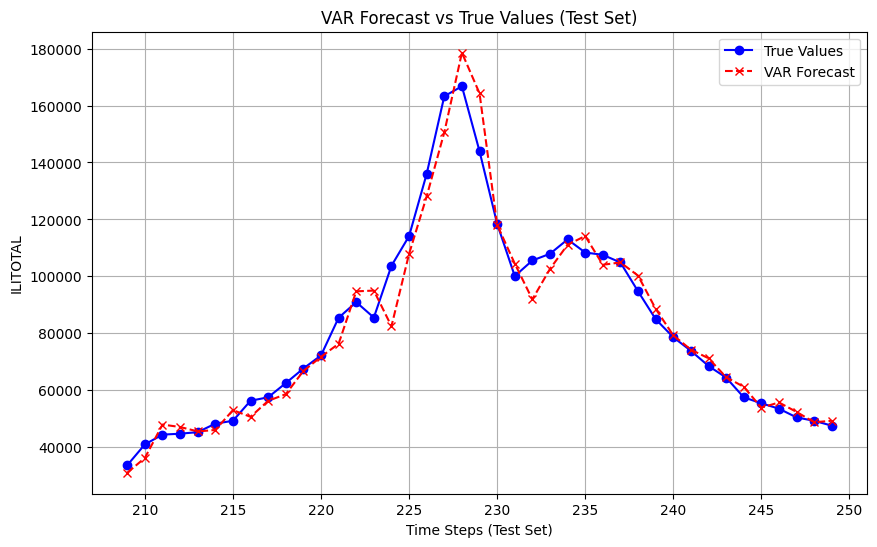

MSE: 0.0379
MAE: 0.1563
SMAPE: 10.6878%


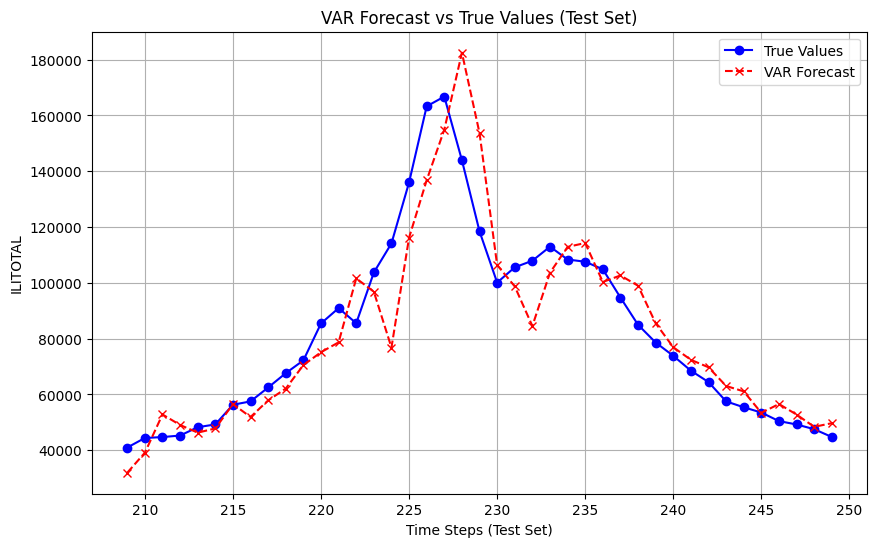

MSE: 0.0782
MAE: 0.2202
SMAPE: 15.0016%


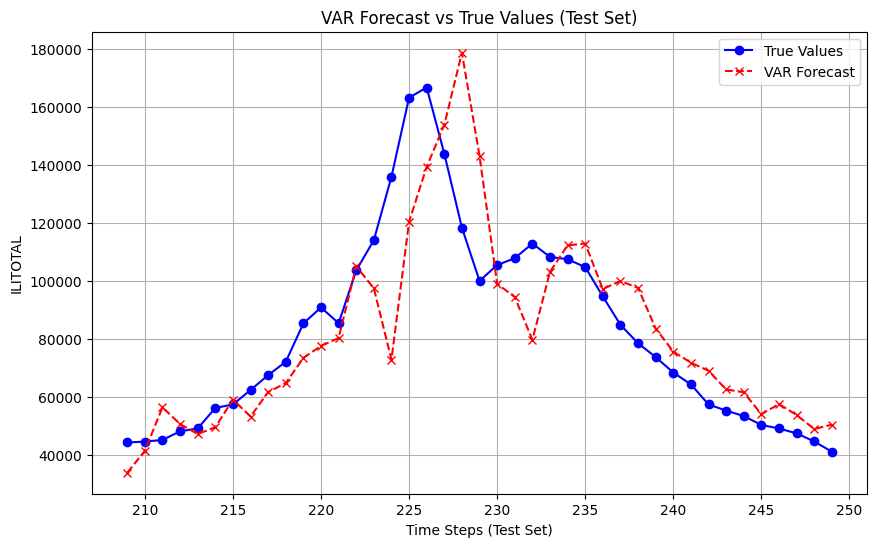

MSE: 0.1276
MAE: 0.2905
SMAPE: 19.7167%


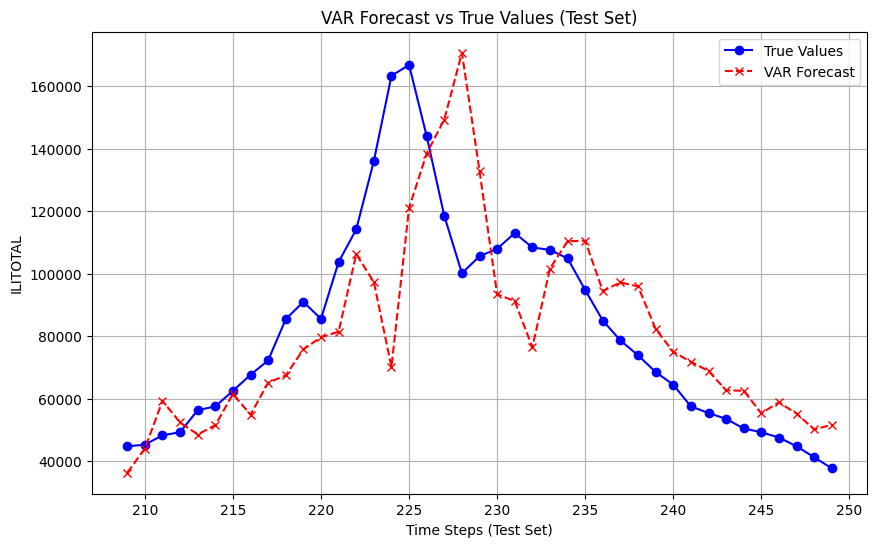

MSE: 0.1728
MAE: 0.3569
SMAPE: 24.1900%


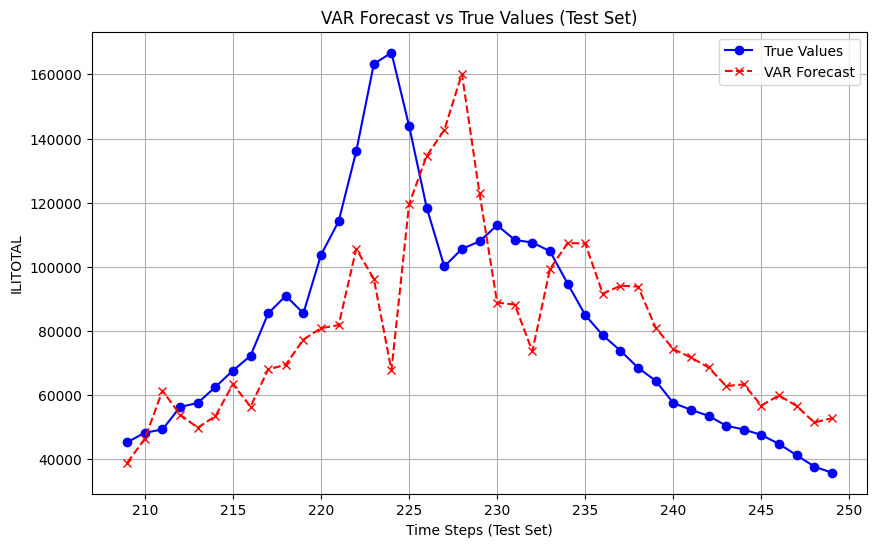

MSE: 0.2111
MAE: 0.4000
SMAPE: 27.0990%


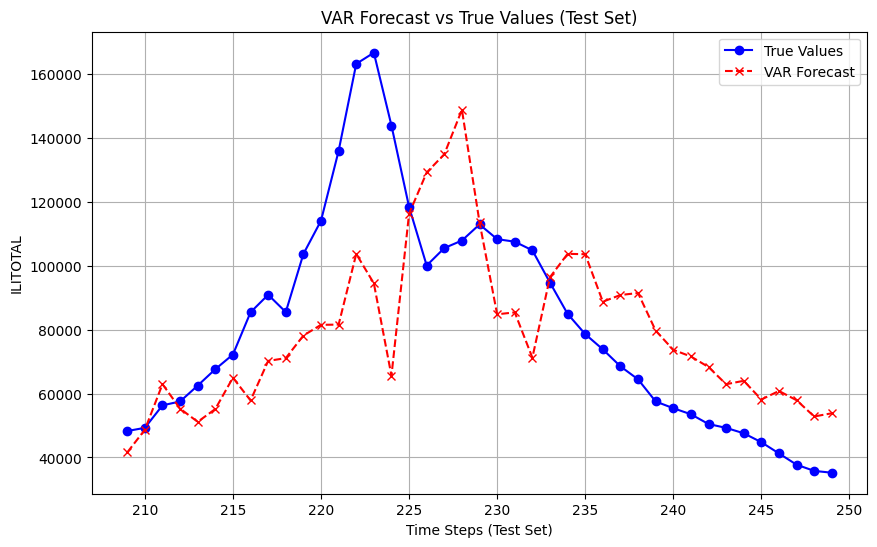

MSE: 0.2529
MAE: 0.4505
SMAPE: 30.4822%


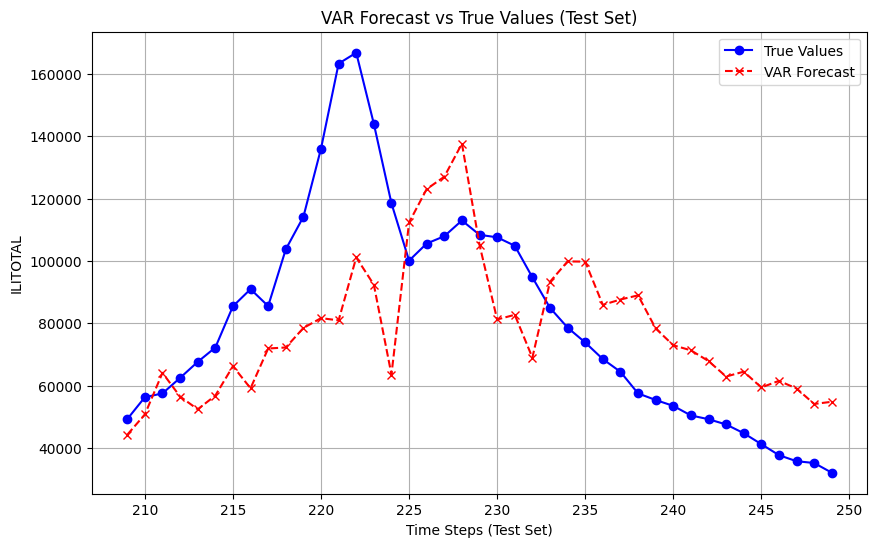

MSE: 0.2908
MAE: 0.4779
SMAPE: 32.2631%


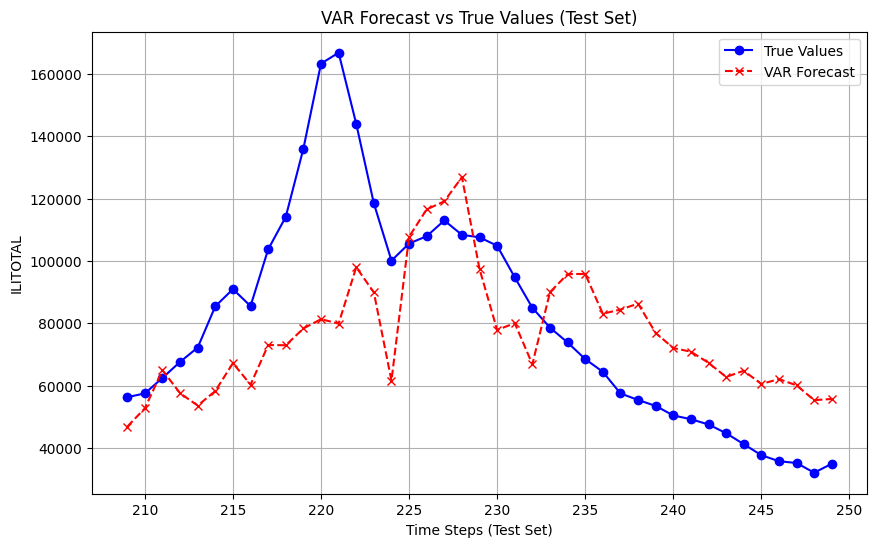

MSE: 0.3445
MAE: 0.5092
SMAPE: 34.2497%


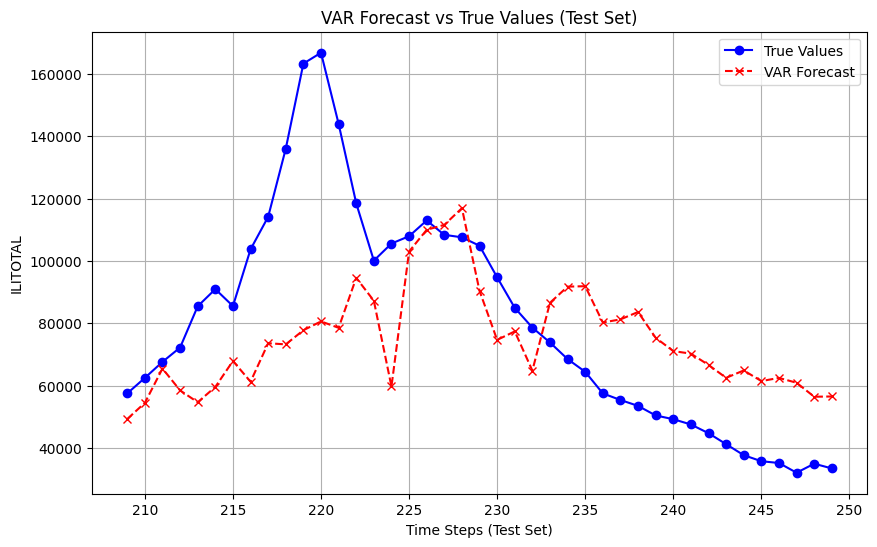

MSE: 0.3924
MAE: 0.5458
SMAPE: 36.6237%


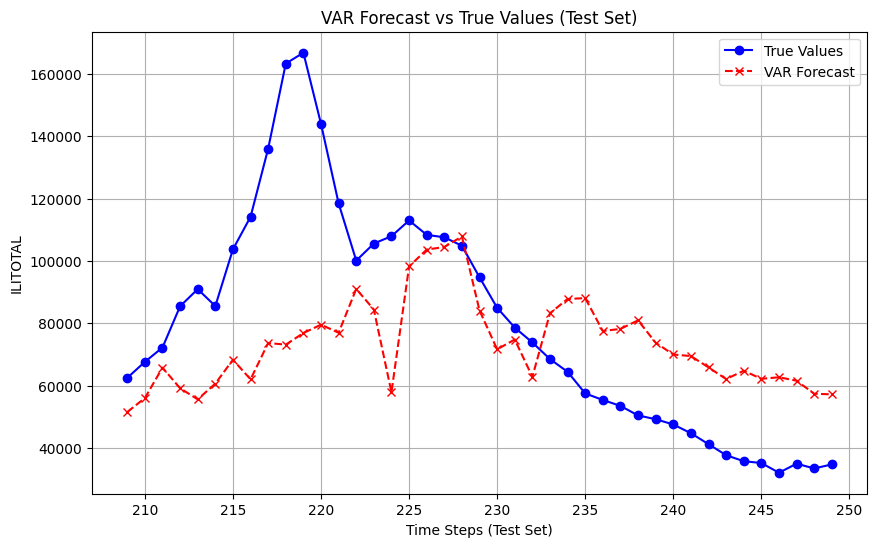

MSE: 0.4385
MAE: 0.5826
SMAPE: 39.0095%


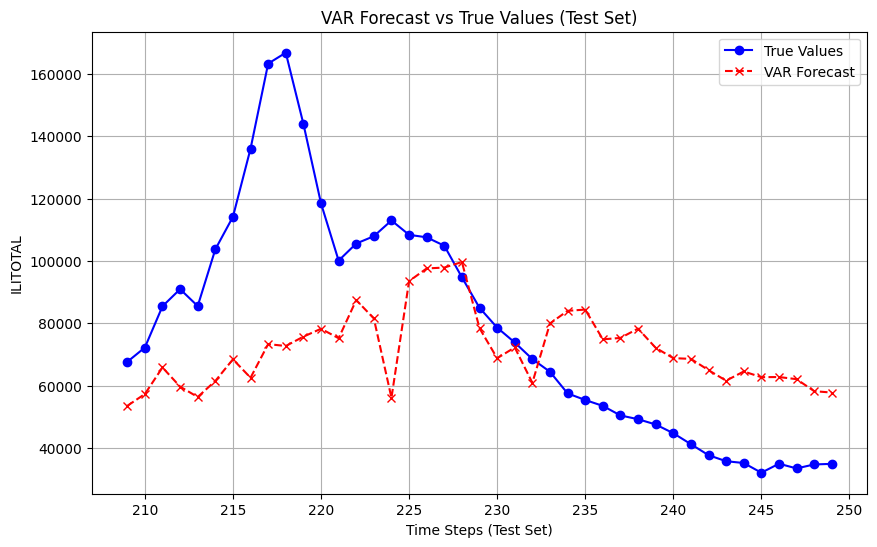

MSE: 0.4835
MAE: 0.6152
SMAPE: 41.1099%


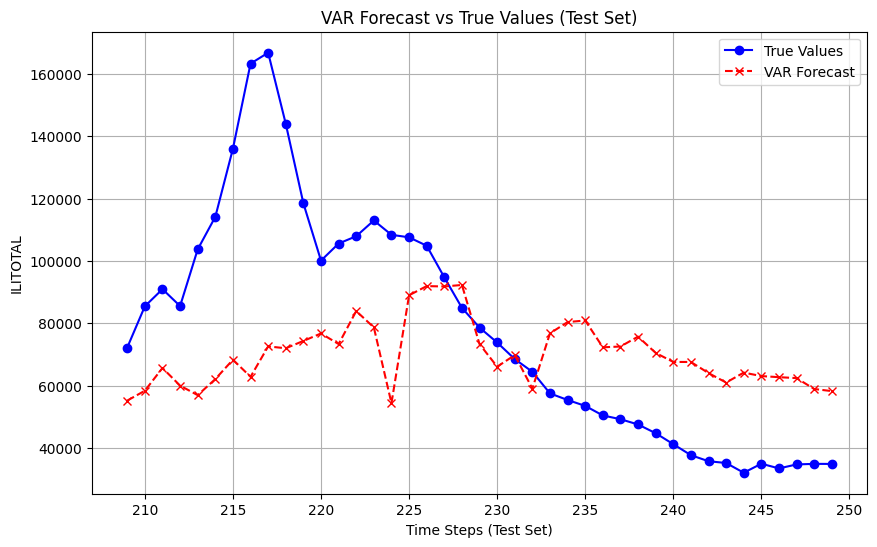

smape_value:  41.1099456965523 horizon: 12
horizon: 0, mse: 0.010915949884249224, mse: 0.08030695676898653, smape: 5.504571126842482
horizon: 1, mse: 0.0378576532890293, mse: 0.1562541034311105, smape: 10.687789414948384
horizon: 2, mse: 0.07824529029866784, mse: 0.2201827926286066, smape: 15.001640156829147
horizon: 3, mse: 0.12764911572568133, mse: 0.2905065599031592, smape: 19.71665063132347
horizon: 4, mse: 0.17276294895984406, mse: 0.3568802029926179, smape: 24.18999674452557
horizon: 5, mse: 0.21109273185191707, mse: 0.4000069376545779, smape: 27.099032322763062
horizon: 6, mse: 0.2529482382334281, mse: 0.4505051594219463, smape: 30.482193989736363
horizon: 7, mse: 0.29083448867748074, mse: 0.4778936066213118, smape: 32.26309469162519
horizon: 8, mse: 0.3444793146698182, mse: 0.50917035832369, smape: 34.24973506366694
horizon: 9, mse: 0.39241897409129994, mse: 0.5457594848818809, smape: 36.62374253796371
horizon: 10, mse: 0.43853091590409965, mse: 0.5825703755734583, smape: 39.00

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
    forecast = model.forecast( steps=horizon) #, exog=exogenous_series[-horizon:])
    return forecast[:, 0]  # Only return the forecast for ILITOTAL (endogenous variable)

    


# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series) - horizon, horizon))
    true_values = np.zeros((len(test_series) - horizon, horizon))

    for i in range(len(test_series) - horizon):

        model = VARMAX(endog=time_series[:split_idx + i], order=(2, 2))
        model_fitted = model.fit(maxlags=1)


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
    time_series = np.array(df[['ILITOTAL','NUM. OF PROVIDERS','OT','h','c']])

    time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 12  # Forecast horizon (steps ahead)

    for horizon in range(12,13):
        smape_value = evaluate_var(time_series,  horizon)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(12):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
        

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
    forecast = model.forecast( steps=horizon) #, exog=exogenous_series[-horizon:])
    return forecast[:, 0]  # Only return the forecast for ILITOTAL (endogenous variable)

    


# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series) - horizon, horizon))
    true_values = np.zeros((len(test_series) - horizon, horizon))

    for i in range(len(test_series) - horizon):

        model = VARMAX(endog=time_series[:split_idx + i], order=(2, 2))
        model_fitted = model.fit()


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
    time_series = np.array(df[['ILITOTAL','NUM. OF PROVIDERS','OT','h','c']])

    time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 12  # Forecast horizon (steps ahead)

    for horizon in range(12,13):
        smape_value = evaluate_var(time_series,  horizon)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(12):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
        

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.76655D-01    |proj g|=  1.47102D+00

At iterate    5    f= -1.00579D+00    |proj g|=  4.98051D-01

At iterate   10    f= -1.02214D+00    |proj g|=  2.02149D-01

At iterate   15    f= -1.03182D+00    |proj g|=  1.31067D-01

At iterate   20    f= -1.03661D+00    |proj g|=  1.45377D-01

At iterate   25    f= -1.04427D+00    |proj g|=  2.47220D-01

At iterate   30    f= -1.04937D+00    |proj g|=  6.32322D-02

At iterate   35    f= -1.05389D+00    |proj g|=  4.71319D-02

At iterate   40    f= -1.05779D+00    |proj g|=  5.62978D-02

At iterate   45    f= -1.06030D+00    |proj g|=  2.14163D-01

At iterate   50    f= -1.06307D+00    |proj g|=  3.92524D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.82313D-01    |proj g|=  1.45377D+00


 This problem is unconstrained.



At iterate    5    f= -1.01107D+00    |proj g|=  5.04304D-01

At iterate   10    f= -1.02668D+00    |proj g|=  1.92514D-01

At iterate   15    f= -1.03665D+00    |proj g|=  1.76096D-01

At iterate   20    f= -1.04104D+00    |proj g|=  2.07829D-01

At iterate   25    f= -1.04906D+00    |proj g|=  3.22988D-01

At iterate   30    f= -1.05382D+00    |proj g|=  5.78345D-02

At iterate   35    f= -1.05838D+00    |proj g|=  9.05320D-02

At iterate   40    f= -1.06234D+00    |proj g|=  7.04321D-02

At iterate   45    f= -1.06472D+00    |proj g|=  1.00393D-01

At iterate   50    f= -1.06758D+00    |proj g|=  7.05788D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.90465D-01    |proj g|=  1.43252D+00


 This problem is unconstrained.



At iterate    5    f= -1.01919D+00    |proj g|=  5.36399D-01

At iterate   10    f= -1.03439D+00    |proj g|=  2.09567D-01

At iterate   15    f= -1.04455D+00    |proj g|=  1.10832D-01

At iterate   20    f= -1.04948D+00    |proj g|=  1.16894D-01

At iterate   25    f= -1.05734D+00    |proj g|=  4.45541D-01

At iterate   30    f= -1.06218D+00    |proj g|=  8.20417D-02

At iterate   35    f= -1.06638D+00    |proj g|=  5.77062D-02

At iterate   40    f= -1.06951D+00    |proj g|=  5.00882D-02

At iterate   45    f= -1.07212D+00    |proj g|=  4.63415D-02

At iterate   50    f= -1.07531D+00    |proj g|=  6.17275D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00025D+00    |proj g|=  1.42041D+00


 This problem is unconstrained.



At iterate    5    f= -1.02857D+00    |proj g|=  5.31187D-01

At iterate   10    f= -1.04345D+00    |proj g|=  2.05299D-01

At iterate   15    f= -1.05347D+00    |proj g|=  1.11185D-01

At iterate   20    f= -1.05819D+00    |proj g|=  1.08558D-01

At iterate   25    f= -1.06712D+00    |proj g|=  3.04309D-01

At iterate   30    f= -1.07127D+00    |proj g|=  8.76238D-02

At iterate   35    f= -1.07592D+00    |proj g|=  6.80789D-02

At iterate   40    f= -1.07896D+00    |proj g|=  4.36568D-02

At iterate   45    f= -1.08182D+00    |proj g|=  6.98054D-02

At iterate   50    f= -1.08440D+00    |proj g|=  9.51849D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01006D+00    |proj g|=  1.41347D+00


 This problem is unconstrained.



At iterate    5    f= -1.03812D+00    |proj g|=  5.32910D-01

At iterate   10    f= -1.05277D+00    |proj g|=  2.05765D-01

At iterate   15    f= -1.06268D+00    |proj g|=  1.04391D-01

At iterate   20    f= -1.06736D+00    |proj g|=  1.05063D-01

At iterate   25    f= -1.07508D+00    |proj g|=  1.25782D-01

At iterate   30    f= -1.08022D+00    |proj g|=  1.98843D-01

At iterate   35    f= -1.08500D+00    |proj g|=  1.44653D-01

At iterate   40    f= -1.08877D+00    |proj g|=  1.20826D-01

At iterate   45    f= -1.09109D+00    |proj g|=  7.49707D-02

At iterate   50    f= -1.09349D+00    |proj g|=  5.54983D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01931D+00    |proj g|=  1.41750D+00


 This problem is unconstrained.



At iterate    5    f= -1.04729D+00    |proj g|=  5.25984D-01

At iterate   10    f= -1.06181D+00    |proj g|=  1.97998D-01

At iterate   15    f= -1.07133D+00    |proj g|=  1.02067D-01

At iterate   20    f= -1.07620D+00    |proj g|=  1.91384D-01

At iterate   25    f= -1.08402D+00    |proj g|=  1.06784D-01

At iterate   30    f= -1.08954D+00    |proj g|=  1.24707D-01

At iterate   35    f= -1.09262D+00    |proj g|=  9.98270D-02

At iterate   40    f= -1.09598D+00    |proj g|=  1.35569D-01

At iterate   45    f= -1.09915D+00    |proj g|=  6.62838D-02

At iterate   50    f= -1.10159D+00    |proj g|=  1.33677D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02655D+00    |proj g|=  1.40028D+00


 This problem is unconstrained.



At iterate    5    f= -1.05428D+00    |proj g|=  5.50316D-01

At iterate   10    f= -1.06873D+00    |proj g|=  2.10478D-01

At iterate   15    f= -1.07814D+00    |proj g|=  9.72468D-02

At iterate   20    f= -1.08243D+00    |proj g|=  1.52808D-01

At iterate   25    f= -1.09067D+00    |proj g|=  2.74045D-01

At iterate   30    f= -1.09525D+00    |proj g|=  1.91075D-01

At iterate   35    f= -1.09969D+00    |proj g|=  1.30370D-01

At iterate   40    f= -1.10317D+00    |proj g|=  7.50311D-02

At iterate   45    f= -1.10539D+00    |proj g|=  4.84209D-02

At iterate   50    f= -1.10829D+00    |proj g|=  4.16385D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.03621D+00    |proj g|=  1.40719D+00


 This problem is unconstrained.



At iterate    5    f= -1.06372D+00    |proj g|=  5.42677D-01

At iterate   10    f= -1.07808D+00    |proj g|=  2.04300D-01

At iterate   15    f= -1.08731D+00    |proj g|=  1.04380D-01

At iterate   20    f= -1.09097D+00    |proj g|=  1.22038D-01

At iterate   25    f= -1.09915D+00    |proj g|=  1.36514D-01

At iterate   30    f= -1.10347D+00    |proj g|=  3.43595D-01

At iterate   35    f= -1.10707D+00    |proj g|=  2.12494D-01

At iterate   40    f= -1.11078D+00    |proj g|=  9.60892D-02

At iterate   45    f= -1.11399D+00    |proj g|=  5.18124D-02

At iterate   50    f= -1.11694D+00    |proj g|=  3.12011D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.43009D-01    |proj g|=  1.37857D+00


 This problem is unconstrained.



At iterate    5    f= -9.72074D-01    |proj g|=  5.23360D-01

At iterate   10    f= -9.86327D-01    |proj g|=  1.98200D-01

At iterate   15    f= -9.96652D-01    |proj g|=  1.30009D-01

At iterate   20    f= -1.00025D+00    |proj g|=  1.14861D-01

At iterate   25    f= -1.00736D+00    |proj g|=  1.38209D-01

At iterate   30    f= -1.01269D+00    |proj g|=  1.40394D-01

At iterate   35    f= -1.01694D+00    |proj g|=  2.25447D-01

At iterate   40    f= -1.02095D+00    |proj g|=  5.65861D-02

At iterate   45    f= -1.02345D+00    |proj g|=  7.09610D-02

At iterate   50    f= -1.02689D+00    |proj g|=  6.37237D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.53133D-01    |proj g|=  1.27873D+00


 This problem is unconstrained.



At iterate    5    f= -9.80162D-01    |proj g|=  5.35450D-01

At iterate   10    f= -9.93400D-01    |proj g|=  1.97392D-01

At iterate   15    f= -1.00363D+00    |proj g|=  1.10733D-01

At iterate   20    f= -1.00726D+00    |proj g|=  1.75677D-01

At iterate   25    f= -1.01410D+00    |proj g|=  1.37747D-01

At iterate   30    f= -1.01949D+00    |proj g|=  1.89333D-01

At iterate   35    f= -1.02319D+00    |proj g|=  6.58413D-02

At iterate   40    f= -1.02681D+00    |proj g|=  5.63815D-02

At iterate   45    f= -1.02935D+00    |proj g|=  9.26068D-02

At iterate   50    f= -1.03296D+00    |proj g|=  7.80682D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.64581D-01    |proj g|=  1.23608D+00


 This problem is unconstrained.



At iterate    5    f= -9.93883D-01    |proj g|=  5.06010D-01

At iterate   10    f= -1.00640D+00    |proj g|=  3.59386D-01

At iterate   15    f= -1.01330D+00    |proj g|=  1.55360D-01

At iterate   20    f= -1.01687D+00    |proj g|=  1.48541D-01

At iterate   25    f= -1.02398D+00    |proj g|=  3.77688D-01

At iterate   30    f= -1.02894D+00    |proj g|=  6.45799D-02

At iterate   35    f= -1.03303D+00    |proj g|=  1.27429D-01

At iterate   40    f= -1.03653D+00    |proj g|=  1.05545D-01

At iterate   45    f= -1.03860D+00    |proj g|=  1.05353D-01

At iterate   50    f= -1.04136D+00    |proj g|=  1.28927D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.77228D-01    |proj g|=  1.21060D+00


 This problem is unconstrained.



At iterate    5    f= -1.00562D+00    |proj g|=  5.06157D-01

At iterate   10    f= -1.01773D+00    |proj g|=  3.38021D-01

At iterate   15    f= -1.02448D+00    |proj g|=  2.44852D-01

At iterate   20    f= -1.02921D+00    |proj g|=  1.14175D-01

At iterate   25    f= -1.03679D+00    |proj g|=  1.97080D-01

At iterate   30    f= -1.04013D+00    |proj g|=  6.54401D-02

At iterate   35    f= -1.04353D+00    |proj g|=  4.74728D-02

At iterate   40    f= -1.04730D+00    |proj g|=  5.07507D-02

At iterate   45    f= -1.04962D+00    |proj g|=  9.45067D-02

At iterate   50    f= -1.05264D+00    |proj g|=  1.06368D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88078D-01    |proj g|=  1.19916D+00


 This problem is unconstrained.



At iterate    5    f= -1.01640D+00    |proj g|=  5.11000D-01

At iterate   10    f= -1.02822D+00    |proj g|=  3.10945D-01

At iterate   15    f= -1.03419D+00    |proj g|=  4.82795D-01

At iterate   20    f= -1.03884D+00    |proj g|=  2.23058D-01

At iterate   25    f= -1.04584D+00    |proj g|=  2.26524D-01

At iterate   30    f= -1.04985D+00    |proj g|=  1.00730D-01

At iterate   35    f= -1.05456D+00    |proj g|=  9.06002D-02

At iterate   40    f= -1.05835D+00    |proj g|=  3.11048D-01

At iterate   45    f= -1.06124D+00    |proj g|=  1.52481D-01

At iterate   50    f= -1.06374D+00    |proj g|=  6.62132D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95515D-01    |proj g|=  1.20472D+00


 This problem is unconstrained.



At iterate    5    f= -1.02417D+00    |proj g|=  5.18585D-01

At iterate   10    f= -1.03594D+00    |proj g|=  2.72383D-01

At iterate   15    f= -1.04201D+00    |proj g|=  1.98858D-01

At iterate   20    f= -1.04595D+00    |proj g|=  4.31726D-01

At iterate   25    f= -1.05244D+00    |proj g|=  3.05042D-01

At iterate   30    f= -1.05704D+00    |proj g|=  5.79885D-02

At iterate   35    f= -1.06059D+00    |proj g|=  4.93312D-02

At iterate   40    f= -1.06433D+00    |proj g|=  7.66746D-02

At iterate   45    f= -1.06620D+00    |proj g|=  7.78430D-02

At iterate   50    f= -1.06915D+00    |proj g|=  2.15606D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00679D+00    |proj g|=  1.19883D+00


 This problem is unconstrained.



At iterate    5    f= -1.03494D+00    |proj g|=  5.15815D-01

At iterate   10    f= -1.04668D+00    |proj g|=  2.69203D-01

At iterate   15    f= -1.05288D+00    |proj g|=  3.53616D-01

At iterate   20    f= -1.05693D+00    |proj g|=  2.51509D-01

At iterate   25    f= -1.06371D+00    |proj g|=  4.39966D-01

At iterate   30    f= -1.06795D+00    |proj g|=  7.83821D-02

At iterate   35    f= -1.07185D+00    |proj g|=  4.71978D-02

At iterate   40    f= -1.07498D+00    |proj g|=  7.18774D-02

At iterate   45    f= -1.07734D+00    |proj g|=  7.93738D-02

At iterate   50    f= -1.08022D+00    |proj g|=  5.21264D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00412D+00    |proj g|=  1.10990D+00


 This problem is unconstrained.



At iterate    5    f= -1.02994D+00    |proj g|=  9.67469D-01

At iterate   10    f= -1.04139D+00    |proj g|=  3.35493D-01

At iterate   15    f= -1.04833D+00    |proj g|=  1.51130D-01

At iterate   20    f= -1.05228D+00    |proj g|=  1.16631D-01

At iterate   25    f= -1.05963D+00    |proj g|=  3.09587D-01

At iterate   30    f= -1.06408D+00    |proj g|=  7.07407D-02

At iterate   35    f= -1.06751D+00    |proj g|=  6.48925D-02

At iterate   40    f= -1.07088D+00    |proj g|=  1.20852D-01

At iterate   45    f= -1.07314D+00    |proj g|=  1.62295D-01

At iterate   50    f= -1.07513D+00    |proj g|=  1.42648D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.86011D-01    |proj g|=  1.16586D+00


 This problem is unconstrained.



At iterate    5    f= -1.01461D+00    |proj g|=  5.10604D-01

At iterate   10    f= -1.02605D+00    |proj g|=  2.60232D-01

At iterate   15    f= -1.03159D+00    |proj g|=  2.77239D-01

At iterate   20    f= -1.03543D+00    |proj g|=  2.55224D-01

At iterate   25    f= -1.04203D+00    |proj g|=  1.08026D-01

At iterate   30    f= -1.04593D+00    |proj g|=  1.38738D-01

At iterate   35    f= -1.04938D+00    |proj g|=  2.12099D-01

At iterate   40    f= -1.05217D+00    |proj g|=  5.52648D-02

At iterate   45    f= -1.05443D+00    |proj g|=  4.62429D-02

At iterate   50    f= -1.05658D+00    |proj g|=  3.25327D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95281D-01    |proj g|=  1.19203D+00


 This problem is unconstrained.



At iterate    5    f= -1.02385D+00    |proj g|=  5.06979D-01

At iterate   10    f= -1.03530D+00    |proj g|=  2.22020D-01

At iterate   15    f= -1.04146D+00    |proj g|=  1.14489D-01

At iterate   20    f= -1.04615D+00    |proj g|=  9.20658D-02

At iterate   25    f= -1.05316D+00    |proj g|=  7.19173D-02

At iterate   30    f= -1.05626D+00    |proj g|=  8.46495D-02

At iterate   35    f= -1.05955D+00    |proj g|=  6.27396D-02

At iterate   40    f= -1.06223D+00    |proj g|=  2.85328D-01

At iterate   45    f= -1.06482D+00    |proj g|=  1.07115D-01

At iterate   50    f= -1.06676D+00    |proj g|=  6.71102D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00360D+00    |proj g|=  1.14075D+00


 This problem is unconstrained.



At iterate    5    f= -1.03192D+00    |proj g|=  9.20514D-01

At iterate   10    f= -1.04268D+00    |proj g|=  3.36051D-01

At iterate   15    f= -1.05031D+00    |proj g|=  2.27612D-01

At iterate   20    f= -1.05483D+00    |proj g|=  1.59378D-01

At iterate   25    f= -1.06160D+00    |proj g|=  7.85176D-02

At iterate   30    f= -1.06487D+00    |proj g|=  9.22239D-02

At iterate   35    f= -1.06784D+00    |proj g|=  9.75212D-02

At iterate   40    f= -1.07052D+00    |proj g|=  8.45245D-02

At iterate   45    f= -1.07303D+00    |proj g|=  1.43132D-01

At iterate   50    f= -1.07477D+00    |proj g|=  8.24063D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01201D+00    |proj g|=  1.12924D+00


 This problem is unconstrained.



At iterate    5    f= -1.04074D+00    |proj g|=  7.54969D-01

At iterate   10    f= -1.05264D+00    |proj g|=  3.16191D-01

At iterate   15    f= -1.05865D+00    |proj g|=  1.66897D-01

At iterate   20    f= -1.06327D+00    |proj g|=  1.95698D-01

At iterate   25    f= -1.07008D+00    |proj g|=  1.36626D-01

At iterate   30    f= -1.07335D+00    |proj g|=  1.40648D-01

At iterate   35    f= -1.07617D+00    |proj g|=  8.42004D-02

At iterate   40    f= -1.07873D+00    |proj g|=  4.43391D-02

At iterate   45    f= -1.08069D+00    |proj g|=  8.48388D-02

At iterate   50    f= -1.08247D+00    |proj g|=  6.07518D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02028D+00    |proj g|=  1.09498D+00


 This problem is unconstrained.



At iterate    5    f= -1.04955D+00    |proj g|=  3.67632D-01

At iterate   10    f= -1.06133D+00    |proj g|=  4.21543D-01

At iterate   15    f= -1.06639D+00    |proj g|=  6.57597D-02

At iterate   20    f= -1.07078D+00    |proj g|=  1.01821D-01

At iterate   25    f= -1.07688D+00    |proj g|=  6.89869D-02

At iterate   30    f= -1.07923D+00    |proj g|=  8.96201D-02

At iterate   35    f= -1.08280D+00    |proj g|=  1.45284D-01

At iterate   40    f= -1.08536D+00    |proj g|=  1.35790D-01

At iterate   45    f= -1.08765D+00    |proj g|=  1.41675D-01

At iterate   50    f= -1.08944D+00    |proj g|=  6.06298D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01278D+00    |proj g|=  1.14671D+00


 This problem is unconstrained.



At iterate    5    f= -1.04115D+00    |proj g|=  5.14568D-01

At iterate   10    f= -1.05288D+00    |proj g|=  4.90486D-01

At iterate   15    f= -1.06015D+00    |proj g|=  1.45683D-01

At iterate   20    f= -1.06551D+00    |proj g|=  3.56931D-01

At iterate   25    f= -1.07094D+00    |proj g|=  7.32018D-02

At iterate   30    f= -1.07442D+00    |proj g|=  5.77055D-02

At iterate   35    f= -1.07753D+00    |proj g|=  3.99442D-02

At iterate   40    f= -1.07991D+00    |proj g|=  1.13594D-01

At iterate   45    f= -1.08205D+00    |proj g|=  3.01358D-02

At iterate   50    f= -1.08353D+00    |proj g|=  4.21234D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02038D+00    |proj g|=  1.19375D+00


 This problem is unconstrained.



At iterate    5    f= -1.04831D+00    |proj g|=  5.08659D-01

At iterate   10    f= -1.06082D+00    |proj g|=  2.85432D-01

At iterate   15    f= -1.06659D+00    |proj g|=  2.96579D-01

At iterate   20    f= -1.07045D+00    |proj g|=  2.69110D-01

At iterate   25    f= -1.07683D+00    |proj g|=  2.38835D-01

At iterate   30    f= -1.08031D+00    |proj g|=  1.43663D-01

At iterate   35    f= -1.08331D+00    |proj g|=  1.11617D-01

At iterate   40    f= -1.08575D+00    |proj g|=  4.84796D-02

At iterate   45    f= -1.08793D+00    |proj g|=  5.79921D-02

At iterate   50    f= -1.09011D+00    |proj g|=  5.72649D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02800D+00    |proj g|=  1.14544D+00


 This problem is unconstrained.



At iterate    5    f= -1.05564D+00    |proj g|=  5.02972D-01

At iterate   10    f= -1.06715D+00    |proj g|=  2.05599D-01

At iterate   15    f= -1.07351D+00    |proj g|=  7.73779D-02

At iterate   20    f= -1.07812D+00    |proj g|=  8.55729D-02

At iterate   25    f= -1.08219D+00    |proj g|=  1.82767D-01

At iterate   30    f= -1.08638D+00    |proj g|=  1.45341D-01

At iterate   35    f= -1.08941D+00    |proj g|=  8.44227D-02

At iterate   40    f= -1.09207D+00    |proj g|=  1.80615D-01

At iterate   45    f= -1.09479D+00    |proj g|=  7.61076D-02

At iterate   50    f= -1.09662D+00    |proj g|=  5.30888D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02929D+00    |proj g|=  1.14364D+00


 This problem is unconstrained.



At iterate    5    f= -1.05683D+00    |proj g|=  7.63547D-01

At iterate   10    f= -1.06807D+00    |proj g|=  5.22605D-01

At iterate   15    f= -1.07535D+00    |proj g|=  2.14631D-01

At iterate   20    f= -1.07989D+00    |proj g|=  8.89837D-02

At iterate   25    f= -1.08612D+00    |proj g|=  8.54038D-02

At iterate   30    f= -1.09094D+00    |proj g|=  4.89509D-02

At iterate   35    f= -1.09359D+00    |proj g|=  2.24473D-01

At iterate   40    f= -1.09567D+00    |proj g|=  3.17711D-01

At iterate   45    f= -1.09868D+00    |proj g|=  1.88181D-01

At iterate   50    f= -1.10037D+00    |proj g|=  1.07285D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.03961D+00    |proj g|=  1.14235D+00


 This problem is unconstrained.



At iterate    5    f= -1.06686D+00    |proj g|=  7.72145D-01

At iterate   10    f= -1.07813D+00    |proj g|=  4.85683D-01

At iterate   15    f= -1.08527D+00    |proj g|=  1.61346D-01

At iterate   20    f= -1.08975D+00    |proj g|=  8.73653D-02

At iterate   25    f= -1.09563D+00    |proj g|=  9.49455D-02

At iterate   30    f= -1.10023D+00    |proj g|=  1.28422D-01

At iterate   35    f= -1.10276D+00    |proj g|=  1.35056D-01

At iterate   40    f= -1.10540D+00    |proj g|=  8.11838D-02

At iterate   45    f= -1.10775D+00    |proj g|=  4.85419D-01

At iterate   50    f= -1.10967D+00    |proj g|=  1.51692D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.05028D+00    |proj g|=  1.12957D+00


 This problem is unconstrained.



At iterate    5    f= -1.07832D+00    |proj g|=  5.40868D-01

At iterate   10    f= -1.08907D+00    |proj g|=  5.32234D-01

At iterate   15    f= -1.09575D+00    |proj g|=  1.83752D-01

At iterate   20    f= -1.09972D+00    |proj g|=  8.66250D-02

At iterate   25    f= -1.10565D+00    |proj g|=  1.09505D-01

At iterate   30    f= -1.10961D+00    |proj g|=  7.06251D-02

At iterate   35    f= -1.11265D+00    |proj g|=  8.94870D-02

At iterate   40    f= -1.11499D+00    |proj g|=  6.49644D-02

At iterate   45    f= -1.11768D+00    |proj g|=  1.01186D-01

At iterate   50    f= -1.11979D+00    |proj g|=  7.76827D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.06038D+00    |proj g|=  1.12434D+00


 This problem is unconstrained.



At iterate    5    f= -1.08782D+00    |proj g|=  5.65310D-01

At iterate   10    f= -1.09857D+00    |proj g|=  5.51834D-01

At iterate   15    f= -1.10526D+00    |proj g|=  1.93607D-01

At iterate   20    f= -1.10923D+00    |proj g|=  9.18537D-02

At iterate   25    f= -1.11593D+00    |proj g|=  1.01402D-01

At iterate   30    f= -1.11985D+00    |proj g|=  6.20033D-02

At iterate   35    f= -1.12246D+00    |proj g|=  1.11185D-01

At iterate   40    f= -1.12486D+00    |proj g|=  1.00042D-01

At iterate   45    f= -1.12825D+00    |proj g|=  2.37318D-01

At iterate   50    f= -1.12965D+00    |proj g|=  1.99367D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.07119D+00    |proj g|=  1.12446D+00


 This problem is unconstrained.



At iterate    5    f= -1.09842D+00    |proj g|=  5.36621D-01

At iterate   10    f= -1.10916D+00    |proj g|=  5.54103D-01

At iterate   15    f= -1.11576D+00    |proj g|=  1.77054D-01

At iterate   20    f= -1.11969D+00    |proj g|=  8.84094D-02

At iterate   25    f= -1.12631D+00    |proj g|=  9.89580D-02

At iterate   30    f= -1.12987D+00    |proj g|=  6.42634D-02

At iterate   35    f= -1.13273D+00    |proj g|=  7.94456D-02

At iterate   40    f= -1.13547D+00    |proj g|=  1.43973D-01

At iterate   45    f= -1.13776D+00    |proj g|=  6.51866D-02

At iterate   50    f= -1.13966D+00    |proj g|=  3.54753D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.07872D+00    |proj g|=  1.15191D+00


 This problem is unconstrained.



At iterate    5    f= -1.10565D+00    |proj g|=  4.95377D-01

At iterate   10    f= -1.11801D+00    |proj g|=  2.71200D-01

At iterate   15    f= -1.12425D+00    |proj g|=  1.16961D-01

At iterate   20    f= -1.12869D+00    |proj g|=  6.27243D-02

At iterate   25    f= -1.13435D+00    |proj g|=  1.32255D-01

At iterate   30    f= -1.13792D+00    |proj g|=  7.94581D-02

At iterate   35    f= -1.14147D+00    |proj g|=  1.21267D-01

At iterate   40    f= -1.14378D+00    |proj g|=  8.14742D-02

At iterate   45    f= -1.14663D+00    |proj g|=  1.02280D-01

At iterate   50    f= -1.14810D+00    |proj g|=  1.45533D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08759D+00    |proj g|=  1.16001D+00


 This problem is unconstrained.



At iterate    5    f= -1.11411D+00    |proj g|=  5.92142D-01

At iterate   10    f= -1.12652D+00    |proj g|=  3.22502D-01

At iterate   15    f= -1.13300D+00    |proj g|=  1.52995D-01

At iterate   20    f= -1.13694D+00    |proj g|=  1.83232D-01

At iterate   25    f= -1.14244D+00    |proj g|=  2.97623D-01

At iterate   30    f= -1.14615D+00    |proj g|=  2.91530D-01

At iterate   35    f= -1.14902D+00    |proj g|=  1.74256D-01

At iterate   40    f= -1.15176D+00    |proj g|=  4.85378D-02

At iterate   45    f= -1.15472D+00    |proj g|=  9.88808D-02

At iterate   50    f= -1.15636D+00    |proj g|=  4.23551D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.09699D+00    |proj g|=  1.17316D+00


 This problem is unconstrained.



At iterate    5    f= -1.12296D+00    |proj g|=  7.81379D-01

At iterate   10    f= -1.13554D+00    |proj g|=  2.69710D-01

At iterate   15    f= -1.14230D+00    |proj g|=  1.52115D-01

At iterate   20    f= -1.14577D+00    |proj g|=  8.62411D-02

At iterate   25    f= -1.15221D+00    |proj g|=  3.25631D-01

At iterate   30    f= -1.15595D+00    |proj g|=  8.42341D-02

At iterate   35    f= -1.15890D+00    |proj g|=  1.52897D-01

At iterate   40    f= -1.16158D+00    |proj g|=  5.56277D-02

At iterate   45    f= -1.16404D+00    |proj g|=  3.93564D-02

At iterate   50    f= -1.16592D+00    |proj g|=  3.49736D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.10607D+00    |proj g|=  1.17191D+00


 This problem is unconstrained.



At iterate    5    f= -1.13174D+00    |proj g|=  7.97282D-01

At iterate   10    f= -1.14429D+00    |proj g|=  2.51581D-01

At iterate   15    f= -1.15085D+00    |proj g|=  2.51478D-01

At iterate   20    f= -1.15488D+00    |proj g|=  8.81709D-02

At iterate   25    f= -1.16135D+00    |proj g|=  9.56001D-02

At iterate   30    f= -1.16519D+00    |proj g|=  6.63987D-02

At iterate   35    f= -1.16759D+00    |proj g|=  1.27596D-01

At iterate   40    f= -1.17034D+00    |proj g|=  1.27227D-01

At iterate   45    f= -1.17247D+00    |proj g|=  7.37799D-02

At iterate   50    f= -1.17493D+00    |proj g|=  5.28083D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.11620D+00    |proj g|=  1.15876D+00


 This problem is unconstrained.



At iterate    5    f= -1.14170D+00    |proj g|=  7.74696D-01

At iterate   10    f= -1.15403D+00    |proj g|=  2.69909D-01

At iterate   15    f= -1.16066D+00    |proj g|=  1.32317D-01

At iterate   20    f= -1.16457D+00    |proj g|=  1.94571D-01

At iterate   25    f= -1.17110D+00    |proj g|=  8.52694D-02

At iterate   30    f= -1.17431D+00    |proj g|=  7.47568D-02

At iterate   35    f= -1.17672D+00    |proj g|=  1.36748D-01

At iterate   40    f= -1.17942D+00    |proj g|=  9.57024D-02

At iterate   45    f= -1.18176D+00    |proj g|=  1.00120D-01

At iterate   50    f= -1.18376D+00    |proj g|=  5.84108D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.12516D+00    |proj g|=  1.16986D+00


 This problem is unconstrained.



At iterate    5    f= -1.15043D+00    |proj g|=  7.72646D-01

At iterate   10    f= -1.16312D+00    |proj g|=  2.85365D-01

At iterate   15    f= -1.16933D+00    |proj g|=  3.03179D-01

At iterate   20    f= -1.17288D+00    |proj g|=  1.15336D-01

At iterate   25    f= -1.17972D+00    |proj g|=  1.32176D-01

At iterate   30    f= -1.18341D+00    |proj g|=  7.42465D-02

At iterate   35    f= -1.18593D+00    |proj g|=  1.32302D-01

At iterate   40    f= -1.18861D+00    |proj g|=  2.13272D-01

At iterate   45    f= -1.19061D+00    |proj g|=  7.17826D-02

At iterate   50    f= -1.19281D+00    |proj g|=  2.75054D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.13323D+00    |proj g|=  1.18430D+00


 This problem is unconstrained.



At iterate    5    f= -1.15886D+00    |proj g|=  4.84914D-01

At iterate   10    f= -1.17204D+00    |proj g|=  3.03399D-01

At iterate   15    f= -1.17760D+00    |proj g|=  1.58286D-01

At iterate   20    f= -1.18186D+00    |proj g|=  1.29524D-01

At iterate   25    f= -1.18729D+00    |proj g|=  2.70466D-01

At iterate   30    f= -1.19099D+00    |proj g|=  9.22534D-02

At iterate   35    f= -1.19368D+00    |proj g|=  6.59636D-02

At iterate   40    f= -1.19679D+00    |proj g|=  1.20144D-01

At iterate   45    f= -1.19882D+00    |proj g|=  1.15276D-01

At iterate   50    f= -1.20066D+00    |proj g|=  1.45026D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.14022D+00    |proj g|=  1.19267D+00


 This problem is unconstrained.



At iterate    5    f= -1.16583D+00    |proj g|=  4.77158D-01

At iterate   10    f= -1.17904D+00    |proj g|=  3.36764D-01

At iterate   15    f= -1.18486D+00    |proj g|=  1.12786D-01

At iterate   20    f= -1.18952D+00    |proj g|=  1.66137D-01

At iterate   25    f= -1.19546D+00    |proj g|=  1.36438D-01

At iterate   30    f= -1.19895D+00    |proj g|=  1.96606D-01

At iterate   35    f= -1.20206D+00    |proj g|=  6.30662D-02

At iterate   40    f= -1.20424D+00    |proj g|=  5.30307D-02

At iterate   45    f= -1.20650D+00    |proj g|=  8.43838D-02

At iterate   50    f= -1.20823D+00    |proj g|=  1.65432D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15029D+00    |proj g|=  1.18951D+00


 This problem is unconstrained.



At iterate    5    f= -1.17568D+00    |proj g|=  4.75831D-01

At iterate   10    f= -1.18906D+00    |proj g|=  3.04937D-01

At iterate   15    f= -1.19453D+00    |proj g|=  1.46348D-01

At iterate   20    f= -1.19874D+00    |proj g|=  1.26486D-01

At iterate   25    f= -1.20491D+00    |proj g|=  9.50337D-02

At iterate   30    f= -1.20774D+00    |proj g|=  9.19433D-02

At iterate   35    f= -1.21050D+00    |proj g|=  5.88590D-02

At iterate   40    f= -1.21341D+00    |proj g|=  1.12531D-01

At iterate   45    f= -1.21565D+00    |proj g|=  6.98232D-02

At iterate   50    f= -1.21761D+00    |proj g|=  4.87969D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15957D+00    |proj g|=  1.19686D+00


 This problem is unconstrained.



At iterate    5    f= -1.18477D+00    |proj g|=  4.72993D-01

At iterate   10    f= -1.19811D+00    |proj g|=  3.11958D-01

At iterate   15    f= -1.20364D+00    |proj g|=  1.51457D-01

At iterate   20    f= -1.20789D+00    |proj g|=  1.33028D-01

At iterate   25    f= -1.21349D+00    |proj g|=  1.64463D-01

At iterate   30    f= -1.21697D+00    |proj g|=  1.10185D-01

At iterate   35    f= -1.21967D+00    |proj g|=  6.19775D-02

At iterate   40    f= -1.22216D+00    |proj g|=  4.46359D-02

At iterate   45    f= -1.22431D+00    |proj g|=  4.55257D-02

At iterate   50    f= -1.22611D+00    |proj g|=  6.77744D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.16780D+00    |proj g|=  1.19237D+00


 This problem is unconstrained.



At iterate    5    f= -1.19283D+00    |proj g|=  4.64446D-01

At iterate   10    f= -1.20626D+00    |proj g|=  3.16015D-01

At iterate   15    f= -1.21168D+00    |proj g|=  1.27622D-01

At iterate   20    f= -1.21597D+00    |proj g|=  1.16681D-01

At iterate   25    f= -1.22281D+00    |proj g|=  1.01672D-01

At iterate   30    f= -1.22516D+00    |proj g|=  1.35021D-01

At iterate   35    f= -1.22789D+00    |proj g|=  1.33445D-01

At iterate   40    f= -1.23032D+00    |proj g|=  7.12887D-02

At iterate   45    f= -1.23303D+00    |proj g|=  4.13509D-02

At iterate   50    f= -1.23474D+00    |proj g|=  2.82302D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          120     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.17794D+00    |proj g|=  1.18956D+00


 This problem is unconstrained.



At iterate    5    f= -1.20264D+00    |proj g|=  4.62174D-01

At iterate   10    f= -1.21620D+00    |proj g|=  2.86274D-01

At iterate   15    f= -1.22134D+00    |proj g|=  1.53959D-01

At iterate   20    f= -1.22549D+00    |proj g|=  1.19140D-01

At iterate   25    f= -1.23135D+00    |proj g|=  1.40016D-01

At iterate   30    f= -1.23469D+00    |proj g|=  5.95628D-02

At iterate   35    f= -1.23748D+00    |proj g|=  6.59403D-02

At iterate   40    f= -1.24002D+00    |proj g|=  4.62270D-02

At iterate   45    f= -1.24213D+00    |proj g|=  7.21744D-02

At iterate   50    f= -1.24411D+00    |proj g|=  6.49107D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


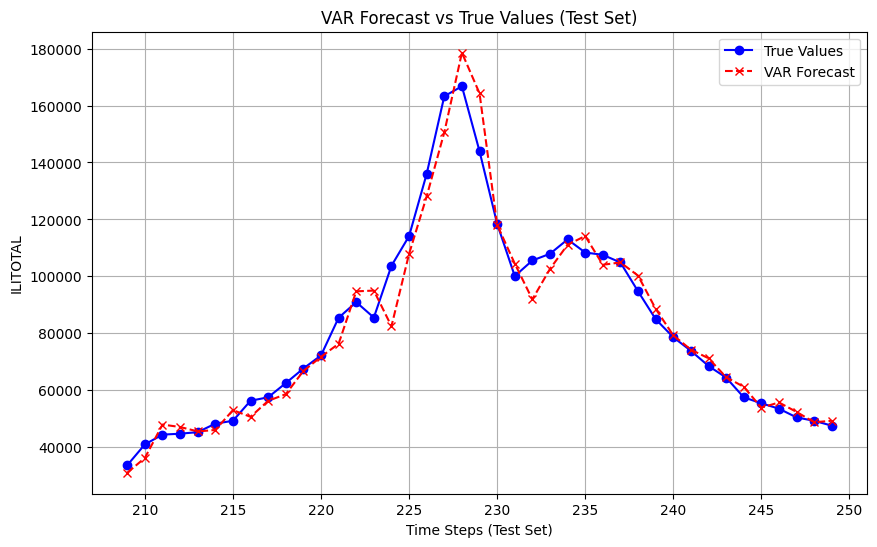

MSE: 0.0379
MAE: 0.1563
SMAPE: 10.6878%


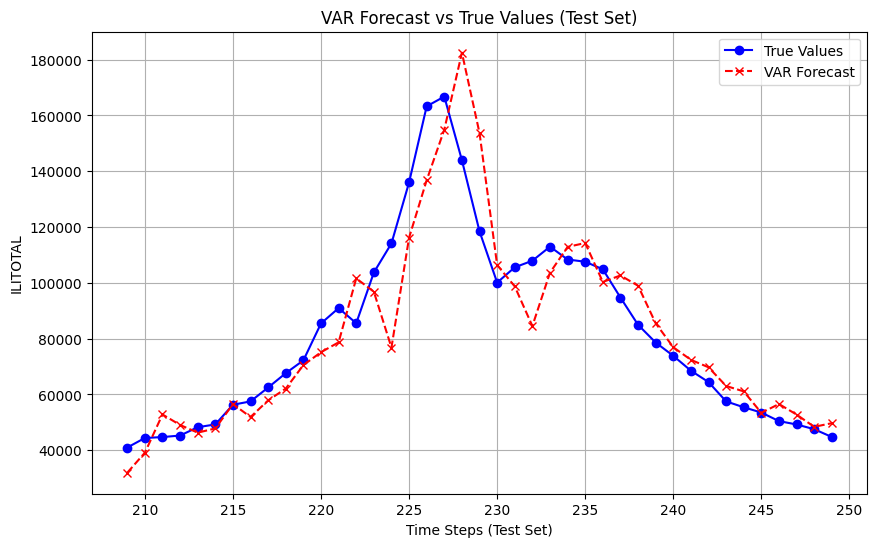

MSE: 0.0782
MAE: 0.2202
SMAPE: 15.0016%


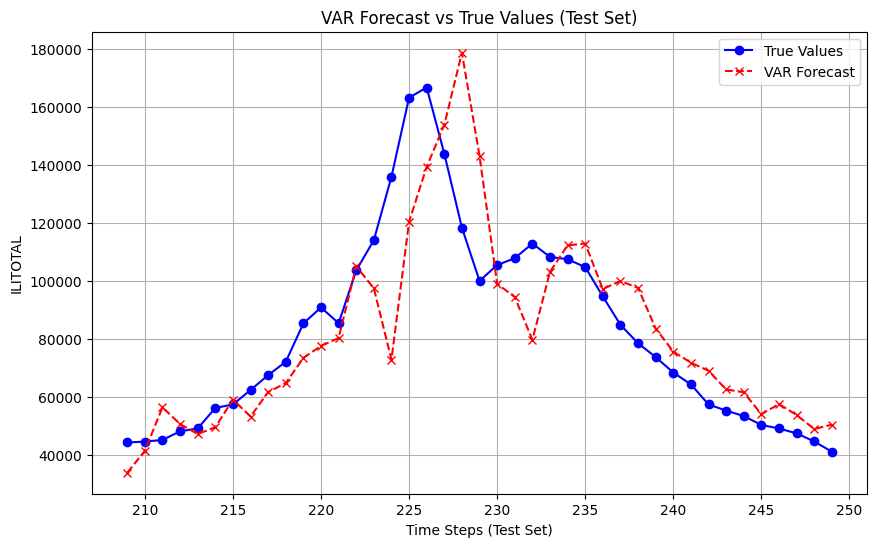

MSE: 0.1276
MAE: 0.2905
SMAPE: 19.7167%


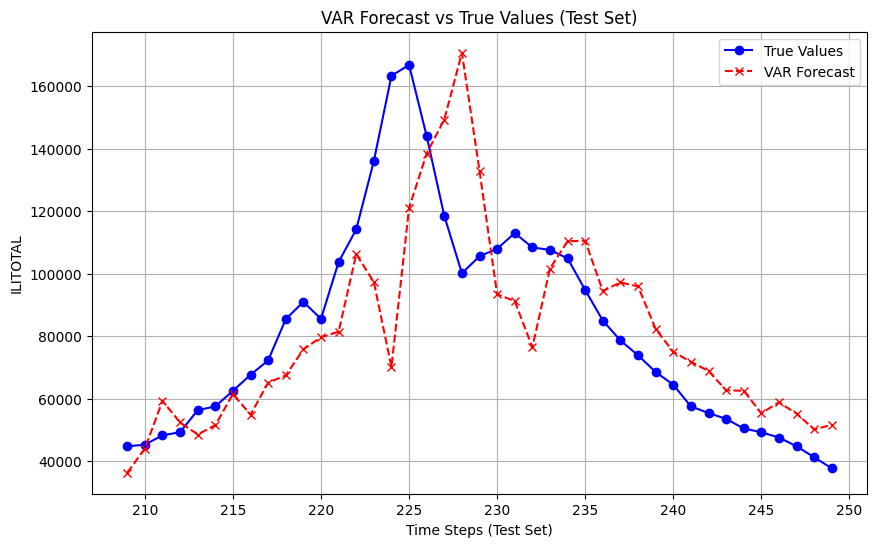

MSE: 0.1728
MAE: 0.3569
SMAPE: 24.1900%


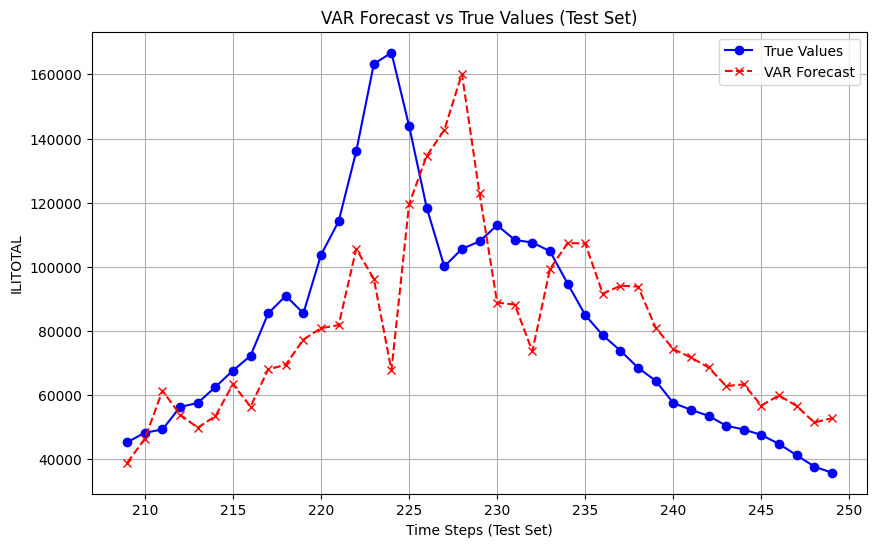

MSE: 0.2111
MAE: 0.4000
SMAPE: 27.0990%


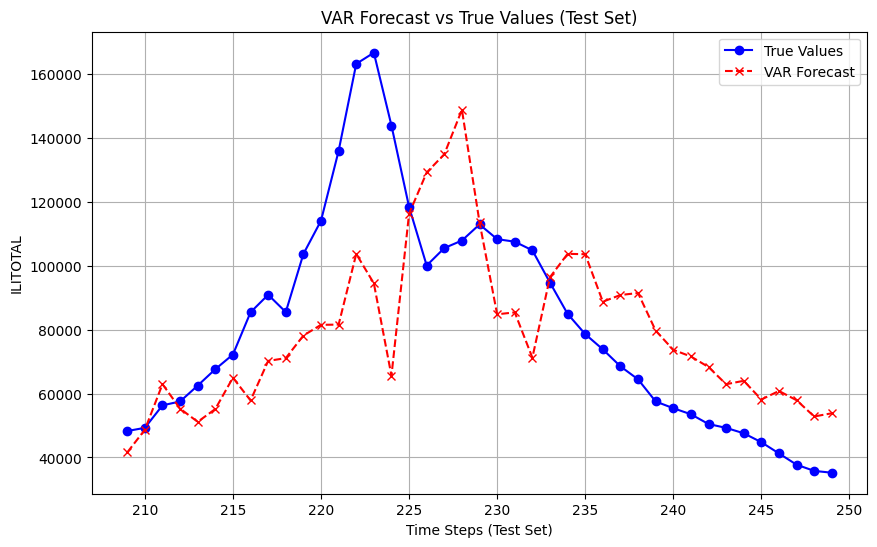

MSE: 0.2529
MAE: 0.4505
SMAPE: 30.4822%


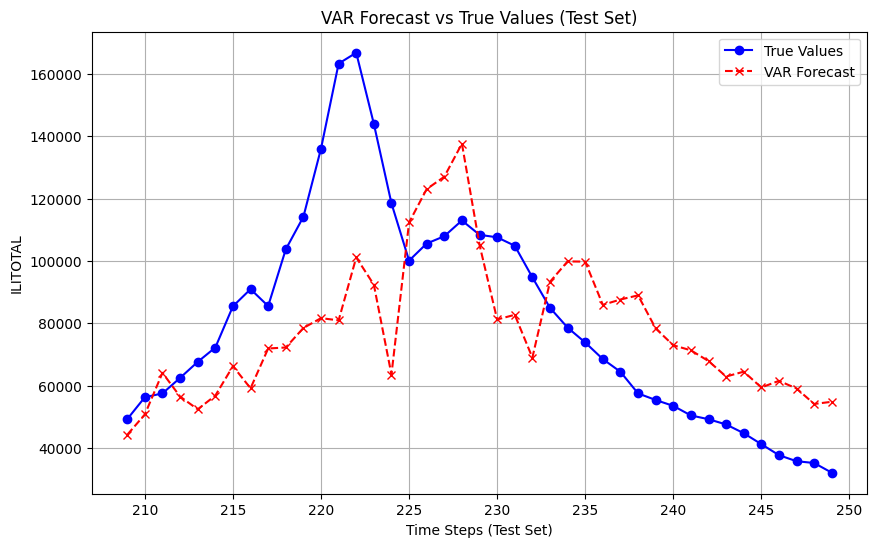

MSE: 0.2908
MAE: 0.4779
SMAPE: 32.2631%


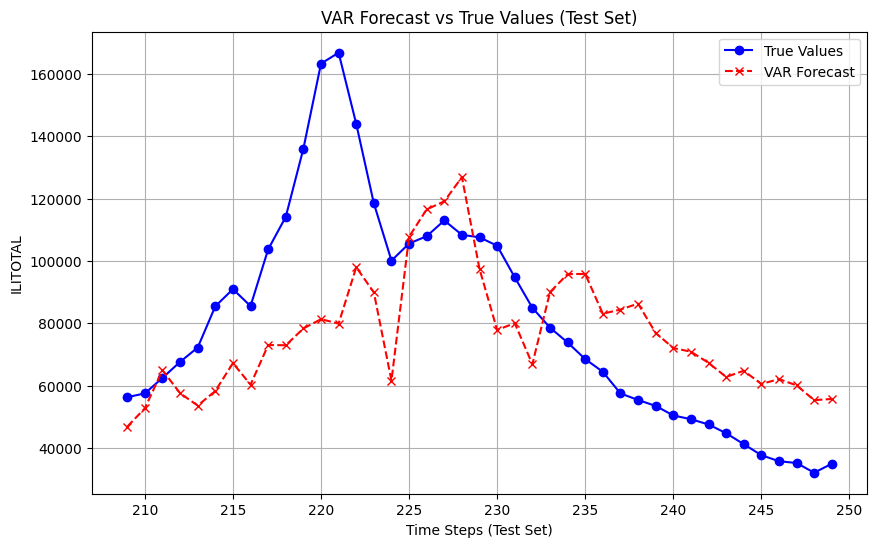

MSE: 0.3445
MAE: 0.5092
SMAPE: 34.2497%


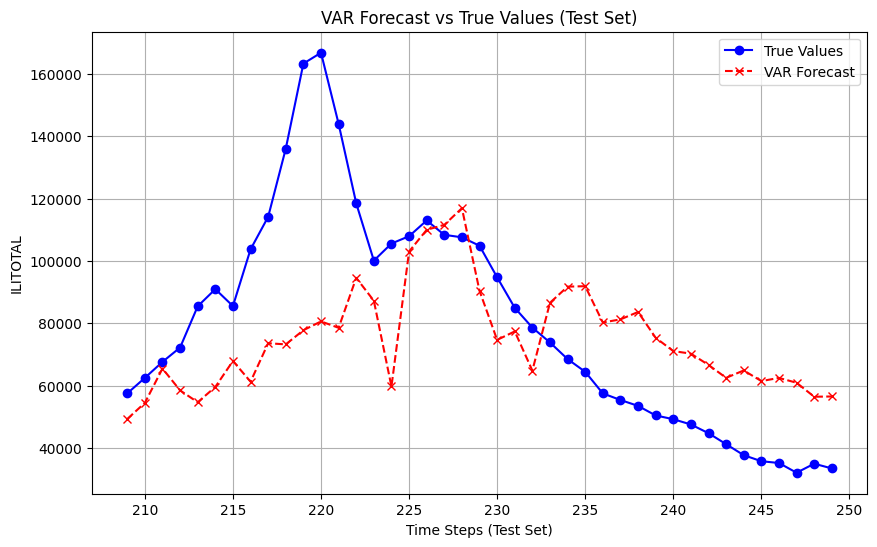

MSE: 0.3924
MAE: 0.5458
SMAPE: 36.6237%


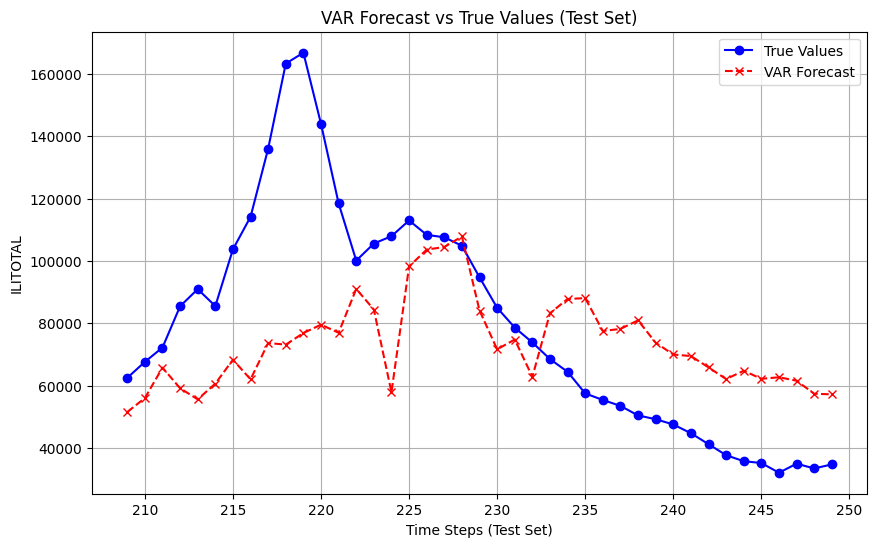

MSE: 0.4385
MAE: 0.5826
SMAPE: 39.0095%


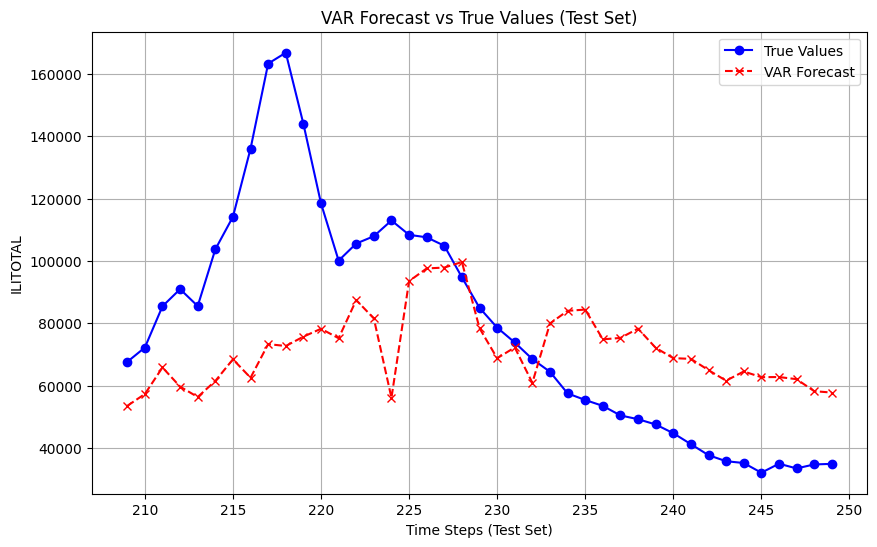

MSE: 0.4835
MAE: 0.6152
SMAPE: 41.1099%


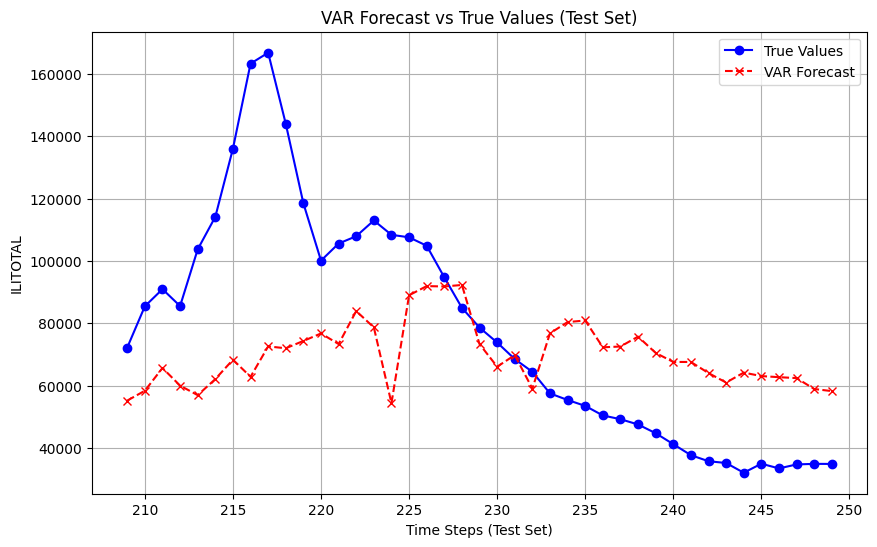

smape_value:  41.1099456965523 horizon: 12
horizon: 0, mse: 0.010915949884249224, mse: 0.08030695676898653, smape: 5.504571126842482
horizon: 1, mse: 0.0378576532890293, mse: 0.1562541034311105, smape: 10.687789414948384
horizon: 2, mse: 0.07824529029866784, mse: 0.2201827926286066, smape: 15.001640156829147
horizon: 3, mse: 0.12764911572568133, mse: 0.2905065599031592, smape: 19.71665063132347
horizon: 4, mse: 0.17276294895984406, mse: 0.3568802029926179, smape: 24.18999674452557
horizon: 5, mse: 0.21109273185191707, mse: 0.4000069376545779, smape: 27.099032322763062
horizon: 6, mse: 0.2529482382334281, mse: 0.4505051594219463, smape: 30.482193989736363
horizon: 7, mse: 0.29083448867748074, mse: 0.4778936066213118, smape: 32.26309469162519
horizon: 8, mse: 0.3444793146698182, mse: 0.50917035832369, smape: 34.24973506366694
horizon: 9, mse: 0.39241897409129994, mse: 0.5457594848818809, smape: 36.62374253796371
horizon: 10, mse: 0.43853091590409965, mse: 0.5825703755734583, smape: 39.00

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
    forecast = model.forecast( steps=horizon) #, exog=exogenous_series[-horizon:])
    return forecast[:, 0]  # Only return the forecast for ILITOTAL (endogenous variable)

    


# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series) - horizon, horizon))
    true_values = np.zeros((len(test_series) - horizon, horizon))

    for i in range(len(test_series) - horizon):

        model = VARMAX(endog=time_series[:split_idx + i], order=(2, 2))
        model_fitted = model.fit()


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
    time_series = np.array(df[['ILITOTAL','NUM. OF PROVIDERS','OT','h','c']])

    time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 12  # Forecast horizon (steps ahead)

    for horizon in range(12,13):
        smape_value = evaluate_var(time_series,  horizon)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(12):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
        

#### VARMAX

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.32396D+00    |proj g|=  1.26157D+00

At iterate    5    f= -1.39162D+00    |proj g|=  2.31871D-01

At iterate   10    f= -1.40442D+00    |proj g|=  2.74967D-01

At iterate   15    f= -1.41710D+00    |proj g|=  1.18925D-01

At iterate   20    f= -1.41924D+00    |proj g|=  1.98435D-01

At iterate   25    f= -1.42245D+00    |proj g|=  5.25713D-02

At iterate   30    f= -1.42476D+00    |proj g|=  8.71050D-02

At iterate   35    f= -1.42946D+00    |proj g|=  2.25924D-01

At iterate   40    f= -1.43289D+00    |proj g|=  1.27693D-01

At iterate   45    f= -1.43924D+00    |proj g|=  3.45235D-01


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



At iterate   50    f= -1.44285D+00    |proj g|=  9.49866D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   23     50     58      1     0     0   9.499D-02  -1.443D+00
  F =  -1.4428533015728580     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models 

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


MSE: 0.0060
MAE: 0.0556
SMAPE: 6.5202%


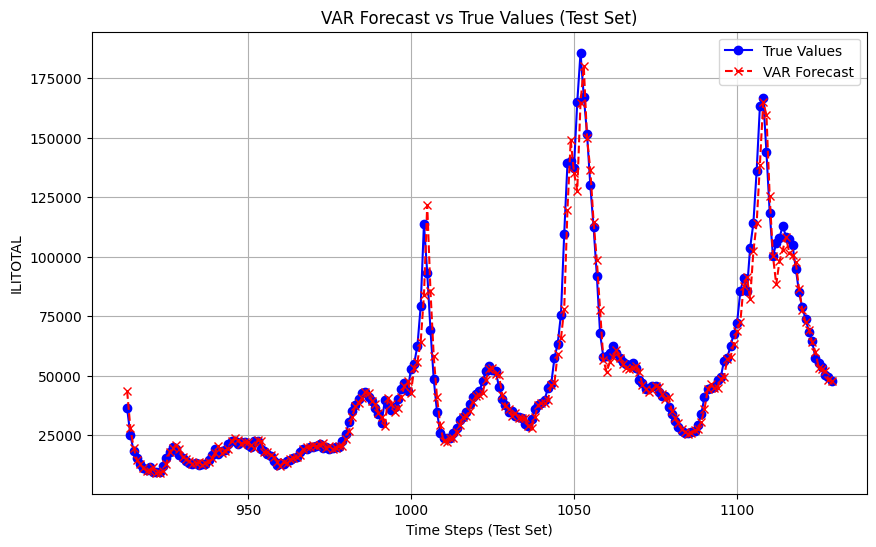

MSE: 0.0197
MAE: 0.1034
SMAPE: 12.0837%


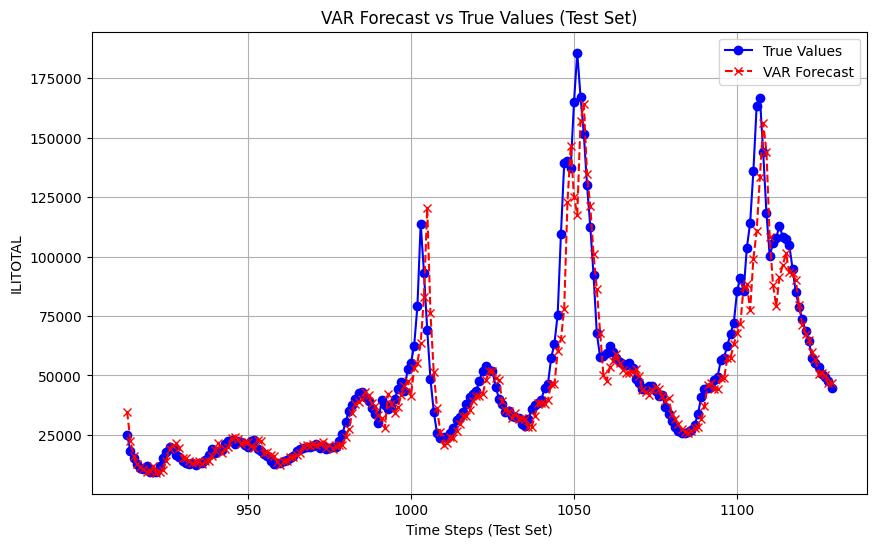

MSE: 0.0400
MAE: 0.1484
SMAPE: 17.2473%


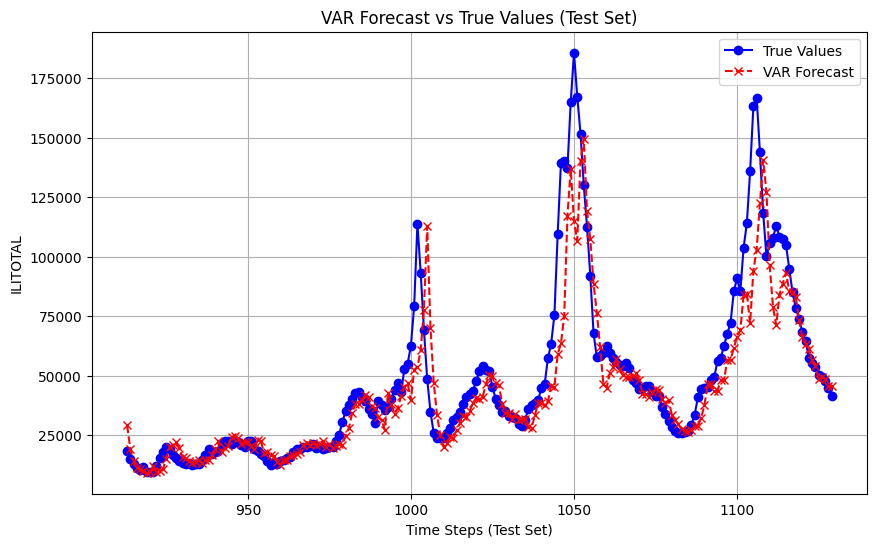

MSE: 0.0630
MAE: 0.1854
SMAPE: 21.4111%


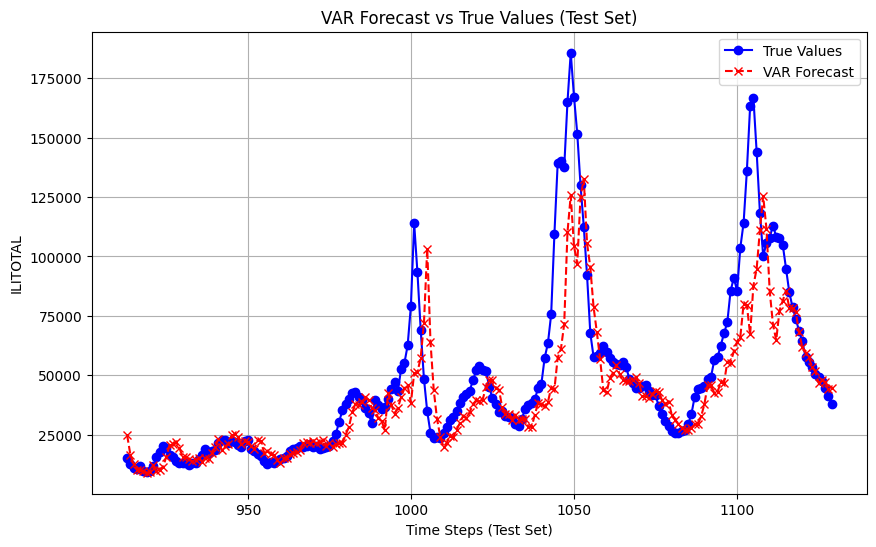

MSE: 0.0882
MAE: 0.2196
SMAPE: 25.1957%


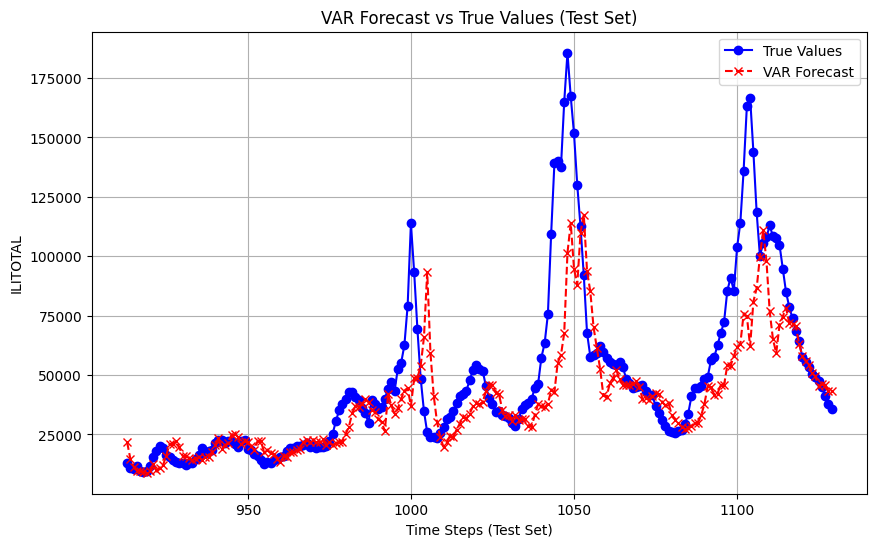

MSE: 0.1127
MAE: 0.2517
SMAPE: 28.7258%


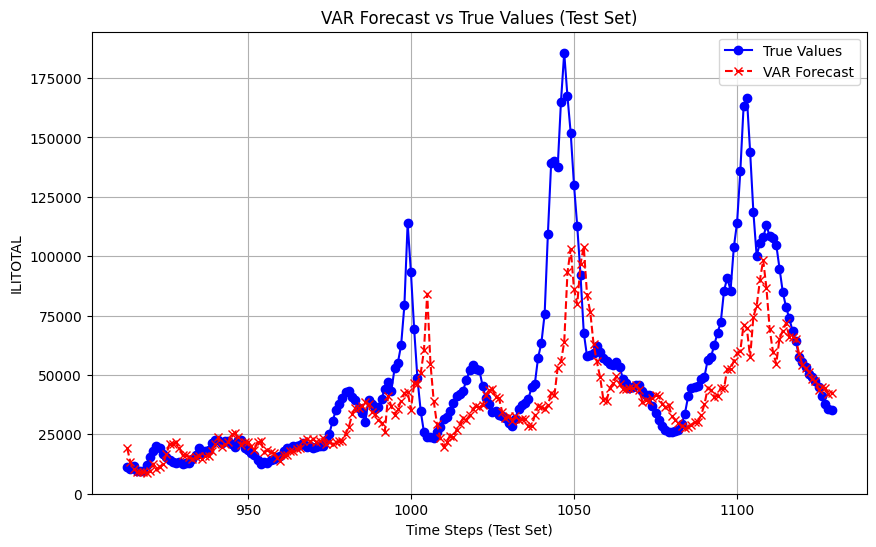

MSE: 0.1362
MAE: 0.2797
SMAPE: 31.7793%


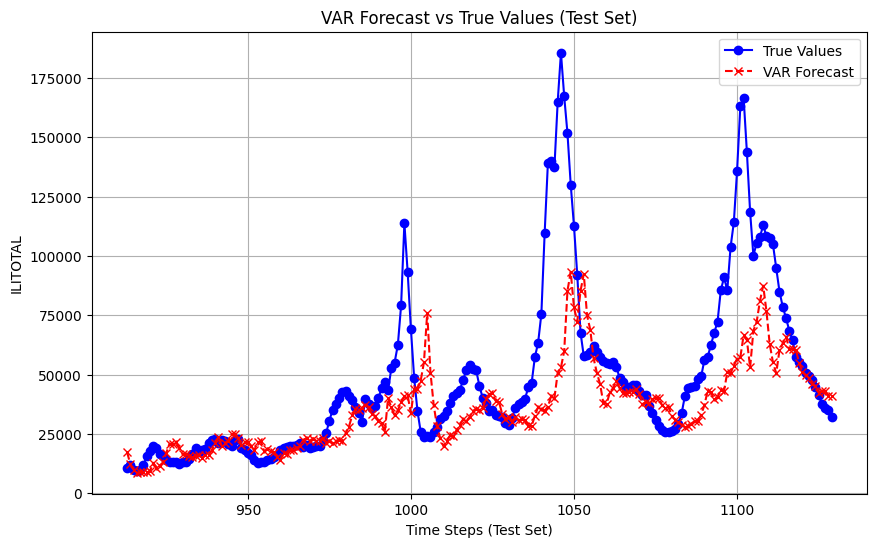

MSE: 0.1586
MAE: 0.3020
SMAPE: 34.1395%


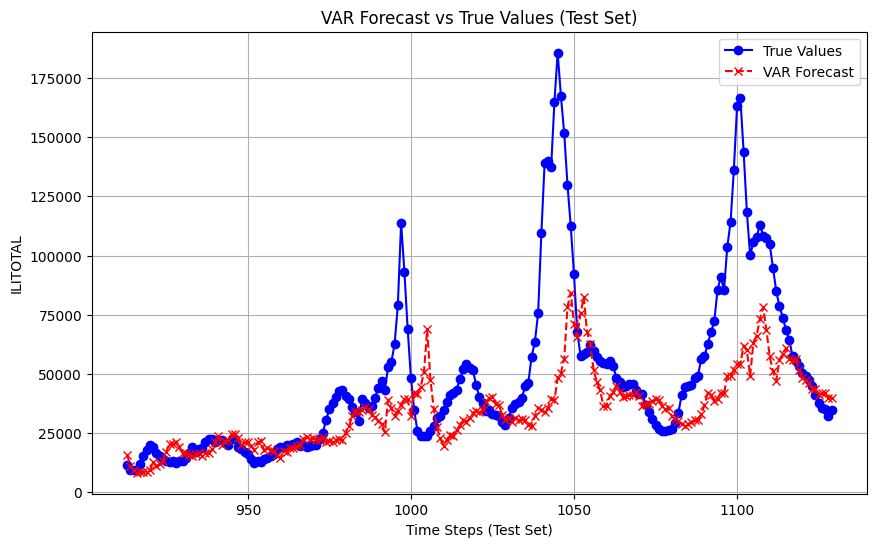

MSE: 0.1824
MAE: 0.3213
SMAPE: 36.1045%


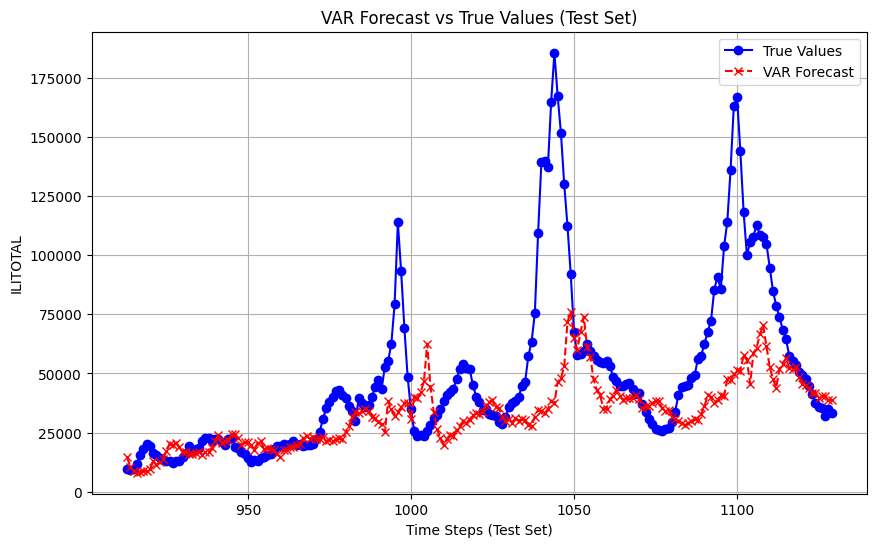

MSE: 0.2048
MAE: 0.3378
SMAPE: 37.7381%


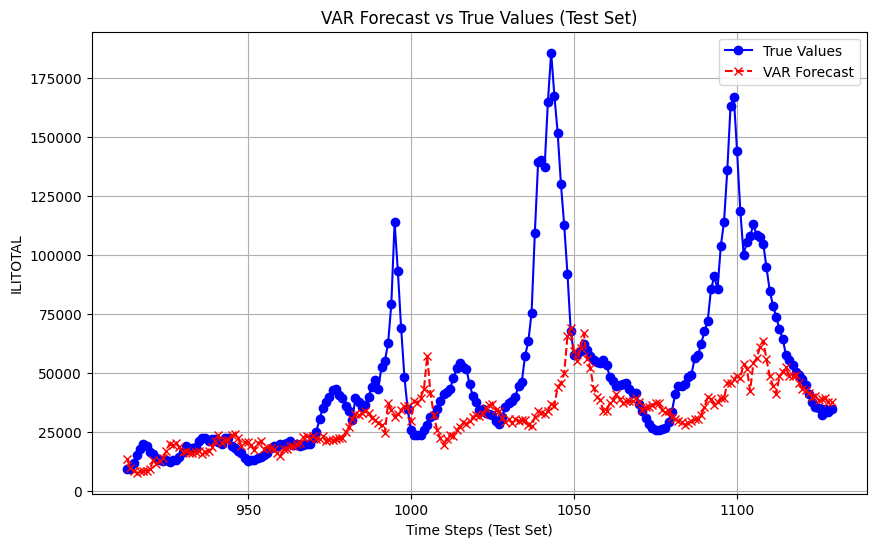

MSE: 0.2267
MAE: 0.3556
SMAPE: 39.5243%


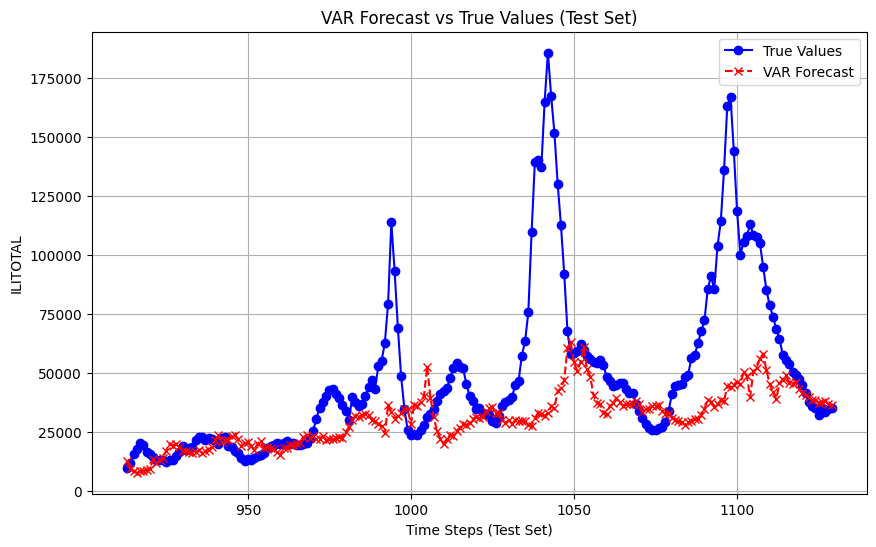

MSE: 0.2478
MAE: 0.3685
SMAPE: 40.7291%


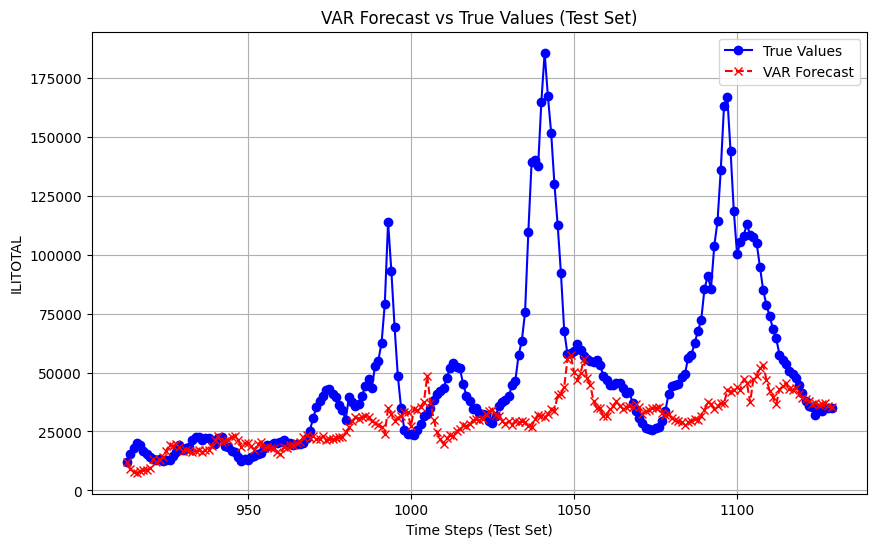

smape_value:  40.72910030551956 horizon: 12
horizon: 0, mse: 0.005988720859655871, mse: 0.055566585441984846, smape: 6.520163538213458
horizon: 1, mse: 0.019738512621647195, mse: 0.10339712595105854, smape: 12.083726387653053
horizon: 2, mse: 0.040045151696343824, mse: 0.1484162889211416, smape: 17.247328831537985
horizon: 3, mse: 0.06298353040985466, mse: 0.185410792872727, smape: 21.411106750634083
horizon: 4, mse: 0.08819880001734516, mse: 0.21961915160015263, smape: 25.195688119212683
horizon: 5, mse: 0.11271748397964727, mse: 0.25166022606885485, smape: 28.72576119743737
horizon: 6, mse: 0.13624765486889223, mse: 0.27970606526752384, smape: 31.779295493377745
horizon: 7, mse: 0.1585881072866792, mse: 0.3020205339904083, smape: 34.13951331106392
horizon: 8, mse: 0.1823853410501519, mse: 0.32131814783246915, smape: 36.104542061124874
horizon: 9, mse: 0.20476102019246809, mse: 0.33778306530021496, smape: 37.73809834842033
horizon: 10, mse: 0.22665088223261523, mse: 0.3555828024692171

In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
    updated_model = model.apply(train_series[horizon:,0:2], exog=train_series[:-horizon,2:])

    forecast = updated_model.forecast( steps=horizon, exog=train_series[-horizon:,2:]) #, exog=exogenous_series[-horizon:])
    return forecast[:, 0]  # Only return the forecast for ILITOTAL (endogenous variable)

    
# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series) - horizon, horizon))
    true_values = np.zeros((len(test_series) - horizon, horizon))

    for i in range(len(test_series) - horizon):
        if i == 0:
            model = VARMAX(endog=time_series[horizon:split_idx + i,0:2], order=(2, 2),exog=time_series[:split_idx + i-horizon,2:])
            model_fitted = model.fit()


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/illness/national_illness_24.csv')
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
    time_series = np.array(df[['ILITOTAL','OT','NUM. OF PROVIDERS']]) #,'h','c']])

    time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 12  # Forecast horizon (steps ahead)

    for horizon in range(12,13):
        smape_value = evaluate_var(time_series,  horizon)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(12):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
        

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.30130D-01    |proj g|=  1.51375D+00

At iterate    5    f= -6.93448D-01    |proj g|=  2.02298D-01

At iterate   10    f= -7.27690D-01    |proj g|=  2.84183D-01

At iterate   15    f= -7.55777D-01    |proj g|=  3.11936D-01

At iterate   20    f= -8.00583D-01    |proj g|=  5.84529D-01

At iterate   25    f= -8.31384D-01    |proj g|=  4.92718D-01

At iterate   30    f= -8.45227D-01    |proj g|=  2.18542D-01

At iterate   35    f= -8.50811D-01    |proj g|=  7.17165D-02

At iterate   40    f= -8.53483D-01    |proj g|=  1.37311D-01

At iterate   45    f= -8.56001D-01    |proj g|=  1.68124D-01


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id


At iterate   50    f= -8.58241D-01    |proj g|=  5.15599D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   23     50     58      1     0     0   5.156D-02  -8.582D-01
  F = -0.85824144581139783     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.26339D-01    |proj g|=  1.49147D+00

At iterate    5    f= -6.86083D-01    |proj g|=  1.63544D-01

At iterate   10    f= -7.16579D-01    |proj g|=  2.72570D-01

At iter

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.22451D-01    |proj g|=  1.27989D+00

At iterate    5    f= -6.72312D-01    |proj g|=  1.81360D-01

At iterate   10    f= -6.98202D-01    |proj g|=  1.37571D-01

At iterate   15    f= -7.13437D-01    |proj g|=  1.79610D-01

At iterate   20    f= -7.47215D-01    |proj g|=  4.49929D-01

At iterate   25    f= -7.70359D-01    |proj g|=  2.84538D-01

At iterate   30    f= -8.07960D-01    |proj g|=  3.49097D-01

At iterate   35    f= -8.22004D-01    |proj g|=  4.51138D-01

At iterate   40    f= -8.38000D-01    |proj g|=  1.82552D-01

At iterate   45    f= -8.40512D-01    |proj g|=  1.15637D-01

At iterate   50    f= -8.41848D-01    |proj g|=  3.24786D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.32154D-01    |proj g|=  1.24863D+00

At iterate    5    f= -6.81467D-01    |proj g|=  1.74691D-01

At iterate   10    f= -7.06480D-01    |proj g|=  1.56330D-01

At iterate   15    f= -7.20890D-01    |proj g|=  1.02905D-01

At iterate   20    f= -7.48731D-01    |proj g|=  3.47467D-01

At iterate   25    f= -7.72692D-01    |proj g|=  3.43446D-01

At iterate   30    f= -7.95193D-01    |proj g|=  3.02501D-01

At iterate   35    f= -8.08751D-01    |proj g|=  2.54261D-01

At iterate   40    f= -8.20030D-01    |proj g|=  3.48535D-01

At iterate   45    f= -8.24227D-01    |proj g|=  6.36199D-02

At iterate   50    f= -8.25534D-01    |proj g|=  4.29388D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.36979D-01    |proj g|=  1.34521D+00

At iterate    5    f= -6.87814D-01    |proj g|=  1.54398D-01

At iterate   10    f= -7.09956D-01    |proj g|=  1.57851D-01

At iterate   15    f= -7.26691D-01    |proj g|=  1.06066D-01

At iterate   20    f= -7.63246D-01    |proj g|=  6.08055D-01

At iterate   25    f= -7.92757D-01    |proj g|=  1.27448D+00

At iterate   30    f= -8.09976D-01    |proj g|=  4.36857D-01

At iterate   35    f= -8.17801D-01    |proj g|=  8.79370D-02

At iterate   40    f= -8.23072D-01    |proj g|=  7.09877D-02

At iterate   45    f= -8.24298D-01    |proj g|=  5.74310D-02

At iterate   50    f= -8.26322D-01    |proj g|=  3.33191D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.24495D-01    |proj g|=  1.26342D+00

At iterate    5    f= -6.72915D-01    |proj g|=  1.65598D-01

At iterate   10    f= -6.97677D-01    |proj g|=  1.49108D-01

At iterate   15    f= -7.07947D-01    |proj g|=  9.48986D-02

At iterate   20    f= -7.36336D-01    |proj g|=  3.96864D-01

At iterate   25    f= -7.60601D-01    |proj g|=  5.21986D-01

At iterate   30    f= -7.76688D-01    |proj g|=  3.24113D-01

At iterate   35    f= -7.85484D-01    |proj g|=  9.57168D-02

At iterate   40    f= -7.90675D-01    |proj g|=  6.18449D-02

At iterate   45    f= -7.92786D-01    |proj g|=  5.62114D-02

At iterate   50    f= -7.96116D-01    |proj g|=  1.05570D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.26270D-01    |proj g|=  1.28829D+00

At iterate    5    f= -6.75299D-01    |proj g|=  1.70348D-01

At iterate   10    f= -7.00815D-01    |proj g|=  1.61493D-01

At iterate   15    f= -7.10016D-01    |proj g|=  1.59083D-01

At iterate   20    f= -7.35155D-01    |proj g|=  2.87352D-01

At iterate   25    f= -7.60963D-01    |proj g|=  4.27152D-01

At iterate   30    f= -7.83777D-01    |proj g|=  5.64315D-01

At iterate   35    f= -7.96874D-01    |proj g|=  2.95563D-01

At iterate   40    f= -8.00391D-01    |proj g|=  2.11598D-01

At iterate   45    f= -8.03767D-01    |proj g|=  7.35726D-02

At iterate   50    f= -8.04600D-01    |proj g|=  9.30246D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.12491D-01    |proj g|=  1.04946D+00

At iterate    5    f= -6.57144D-01    |proj g|=  1.28851D-01

At iterate   10    f= -6.82169D-01    |proj g|=  1.35828D-01

At iterate   15    f= -6.91288D-01    |proj g|=  1.07524D-01

At iterate   20    f= -7.13207D-01    |proj g|=  7.15819D-01

At iterate   25    f= -7.34933D-01    |proj g|=  9.60238D-01

At iterate   30    f= -7.65208D-01    |proj g|=  8.14036D-01

At iterate   35    f= -7.78559D-01    |proj g|=  3.63160D-01

At iterate   40    f= -7.84106D-01    |proj g|=  2.60989D-01

At iterate   45    f= -7.89328D-01    |proj g|=  2.77552D-01

At iterate   50    f= -7.93855D-01    |proj g|=  7.62020D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.22929D-01    |proj g|=  1.05276D+00

At iterate    5    f= -6.67715D-01    |proj g|=  1.29122D-01

At iterate   10    f= -6.91563D-01    |proj g|=  1.57709D-01

At iterate   15    f= -7.00718D-01    |proj g|=  8.87819D-02

At iterate   20    f= -7.22290D-01    |proj g|=  4.93650D-01

At iterate   25    f= -7.44930D-01    |proj g|=  5.16456D-01

At iterate   30    f= -7.66783D-01    |proj g|=  1.39343D+00

At iterate   35    f= -7.81737D-01    |proj g|=  1.69672D-01

At iterate   40    f= -7.86626D-01    |proj g|=  3.63141D-01

At iterate   45    f= -7.93036D-01    |proj g|=  6.25694D-01

At iterate   50    f= -7.96286D-01    |proj g|=  1.48548D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.31164D-01    |proj g|=  1.12338D+00

At iterate    5    f= -6.76566D-01    |proj g|=  1.27543D-01

At iterate   10    f= -7.00318D-01    |proj g|=  2.39631D-01

At iterate   15    f= -7.08482D-01    |proj g|=  9.06666D-02

At iterate   20    f= -7.25461D-01    |proj g|=  8.79578D-01

At iterate   25    f= -7.50201D-01    |proj g|=  1.45634D-01

At iterate   30    f= -7.81049D-01    |proj g|=  2.24482D-01

At iterate   35    f= -7.94192D-01    |proj g|=  1.32043D-01

At iterate   40    f= -8.00138D-01    |proj g|=  2.87158D-01

At iterate   45    f= -8.06597D-01    |proj g|=  2.54463D-01


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id


At iterate   50    f= -8.08363D-01    |proj g|=  1.39755D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   23     50     59      1     0     0   1.398D-01  -8.084D-01
  F = -0.80836279800314959     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.42154D-01    |proj g|=  1.12359D+00

At iterate    5    f= -6.87402D-01    |proj g|=  1.26194D-01

At iterate   10    f= -7.09930D-01    |proj g|=  2.63503D-01

At iter

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.53569D-01    |proj g|=  1.13139D+00

At iterate    5    f= -6.98314D-01    |proj g|=  1.25799D-01

At iterate   10    f= -7.20116D-01    |proj g|=  2.52882D-01

At iterate   15    f= -7.29839D-01    |proj g|=  8.82300D-02

At iterate   20    f= -7.47496D-01    |proj g|=  6.04022D-01

At iterate   25    f= -7.71960D-01    |proj g|=  2.86846D-01

At iterate   30    f= -7.98691D-01    |proj g|=  8.42697D-01

At iterate   35    f= -8.16887D-01    |proj g|=  2.39239D-01

At iterate   40    f= -8.20249D-01    |proj g|=  2.09666D-01

At iterate   45    f= -8.27170D-01    |proj g|=  3.18061D-01


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id


At iterate   50    f= -8.28553D-01    |proj g|=  3.06974D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   23     50     63      1     0     0   3.070D-01  -8.286D-01
  F = -0.82855275087596347     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.63588D-01    |proj g|=  1.13132D+00

At iterate    5    f= -7.07984D-01    |proj g|=  1.26403D-01

At iterate   10    f= -7.29468D-01    |proj g|=  2.21208D-01

At iter

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id


At iterate   50    f= -8.37274D-01    |proj g|=  1.40573D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   23     50     57      1     0     0   1.406D-01  -8.373D-01
  F = -0.83727363035421354     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.71722D-01    |proj g|=  1.13449D+00

At iterate    5    f= -7.15989D-01    |proj g|=  1.19440D-01

At iterate   10    f= -7.38428D-01    |proj g|=  1.91496D-01

At iter

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.79585D-01    |proj g|=  1.14733D+00

At iterate    5    f= -7.23720D-01    |proj g|=  1.33683D-01

At iterate   10    f= -7.47461D-01    |proj g|=  1.89297D-01

At iterate   15    f= -7.56840D-01    |proj g|=  1.24292D-01

At iterate   20    f= -7.89190D-01    |proj g|=  3.02123D-01

At iterate   25    f= -8.01268D-01    |proj g|=  4.96417D-01

At iterate   30    f= -8.27716D-01    |proj g|=  5.38435D-01

At iterate   35    f= -8.43685D-01    |proj g|=  1.12046D-01

At iterate   40    f= -8.47346D-01    |proj g|=  3.13101D-01

At iterate   45    f= -8.50924D-01    |proj g|=  1.73444D-01


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id


At iterate   50    f= -8.53413D-01    |proj g|=  4.62776D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   23     50     61      1     0     0   4.628D-01  -8.534D-01
  F = -0.85341291016425758     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.89920D-01    |proj g|=  1.16930D+00

At iterate    5    f= -7.34183D-01    |proj g|=  1.18191D-01

At iterate   10    f= -7.53892D-01    |proj g|=  1.61143D-01

At iter

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.86978D-01    |proj g|=  1.20894D+00

At iterate    5    f= -7.31625D-01    |proj g|=  1.31601D-01

At iterate   10    f= -7.55286D-01    |proj g|=  1.36176D-01

At iterate   15    f= -7.65546D-01    |proj g|=  1.09416D-01

At iterate   20    f= -8.03344D-01    |proj g|=  1.87704D-01

At iterate   25    f= -8.24691D-01    |proj g|=  1.82089D-01

At iterate   30    f= -8.53234D-01    |proj g|=  3.02675D-01

At iterate   35    f= -8.55700D-01    |proj g|=  8.77168D-02

At iterate   40    f= -8.59397D-01    |proj g|=  1.49202D-01

At iterate   45    f= -8.61891D-01    |proj g|=  4.89232D-02


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id


At iterate   50    f= -8.66635D-01    |proj g|=  5.66895D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   23     50     57      1     0     0   5.669D-01  -8.666D-01
  F = -0.86663462058143781     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           23     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.96687D-01    |proj g|=  1.21102D+00

At iterate    5    f= -7.41228D-01    |proj g|=  1.17392D-01

At iterate   10    f= -7.62064D-01    |proj g|=  1.28855D-01

At iter

/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to id

MSE: 0.0428
MAE: 0.1464
SMAPE: 54.8004%


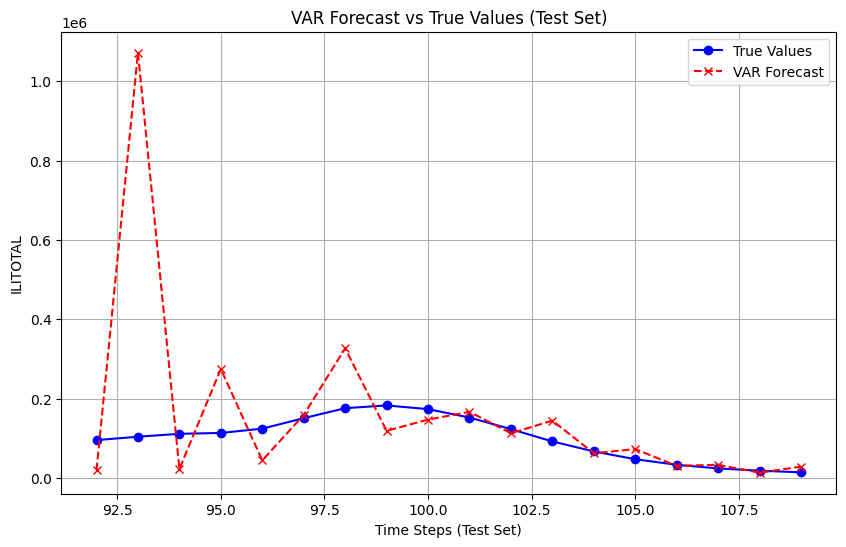

MSE: 0.0179
MAE: 0.1121
SMAPE: 46.0220%


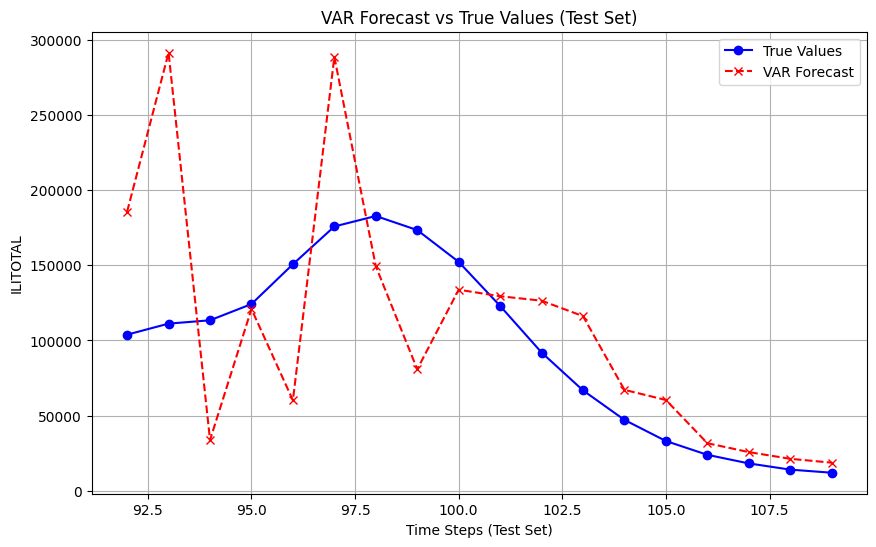

MSE: 0.0286
MAE: 0.1317
SMAPE: 52.1444%


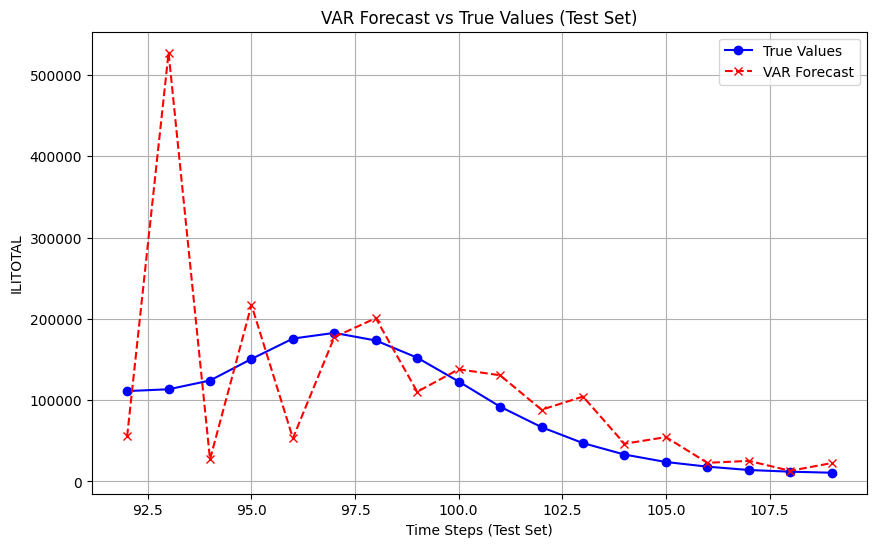

MSE: 0.0293
MAE: 0.1417
SMAPE: 56.6125%


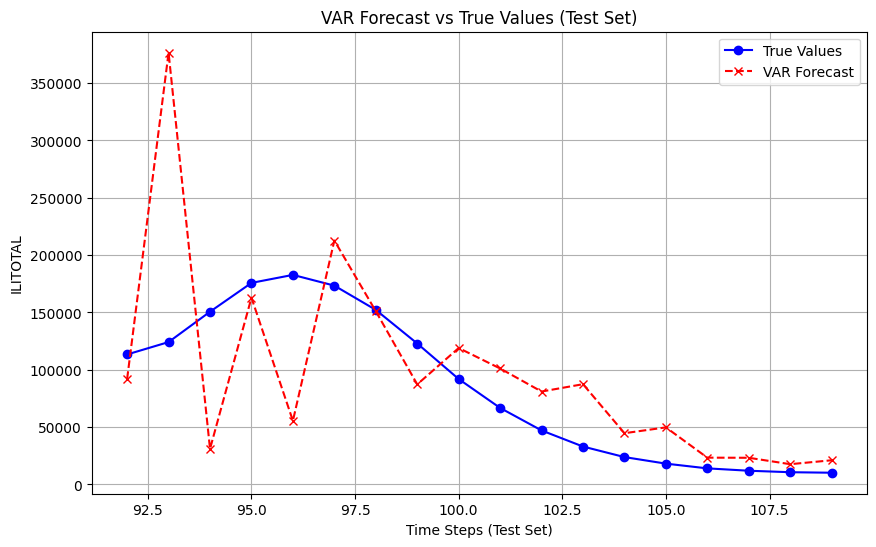

MSE: 0.0387
MAE: 0.1646
SMAPE: 64.6599%


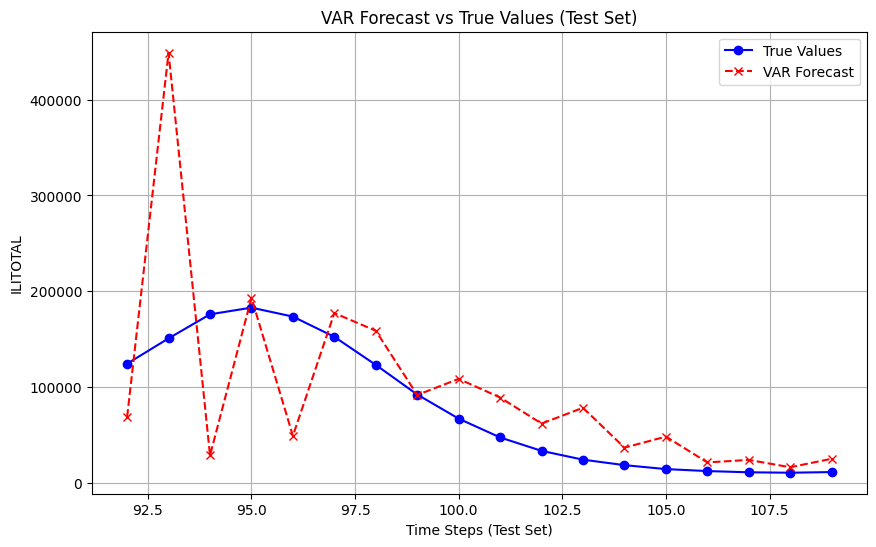

MSE: 0.0448
MAE: 0.1872
SMAPE: 73.4144%


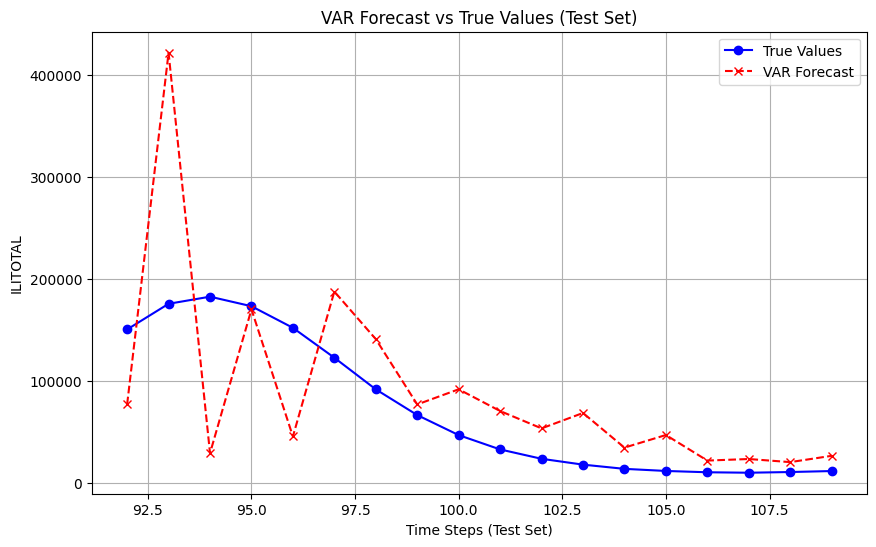

smape_value:  73.41444582195251 horizon: 6
horizon: 0, mse: 0.04276737146702669, mse: 0.1464192949146916, smape: 54.80044386622844
horizon: 1, mse: 0.01790361954674809, mse: 0.11210759353620997, smape: 46.02198517305696
horizon: 2, mse: 0.028554170207159637, mse: 0.13168341047686677, smape: 52.144376475960065
horizon: 3, mse: 0.02933768981474236, mse: 0.14170910801196235, smape: 56.61250772441888
horizon: 4, mse: 0.038670666191966505, mse: 0.16464747714382036, smape: 64.65989695985787
horizon: 5, mse: 0.04479468655740985, mse: 0.18717444248952841, smape: 73.41444582195251


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
    updated_model = model.apply(train_series[horizon:,0:2], exog=train_series[:-horizon,2:])

    forecast = updated_model.forecast( steps=horizon, exog=train_series[-horizon:,2:]) #, exog=exogenous_series[-horizon:])
    return forecast[:, 0]  # Only return the forecast for ILITOTAL (endogenous variable)

    
# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series) - horizon, horizon))
    true_values = np.zeros((len(test_series) - horizon, horizon))

    for i in range(len(test_series) - horizon):
#         if i == 0:
        model = VARMAX(endog=time_series[horizon:split_idx + i,0:2], order=(2, 2),exog=time_series[:split_idx + i-horizon,2:])
        model_fitted = model.fit()


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/rag_data/data/covid_till14May22.csv')
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
#     time_series = np.array(df[['OT','icu_patients','hosp_patients','new_tests','people_vaccinated','people_fully_vaccinated','new_deaths']]) #,'h','c']])
    time_series = np.array(df[['icu_patients','new_deaths','hosp_patients']]) #,'h','c']])

    time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 6  # Forecast horizon (steps ahead)

    for horizon in range(6,7):
        smape_value = evaluate_var(time_series,  horizon)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(6):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
        

In [16]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.varmax import VARMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
    updated_model = model.apply(train_series[horizon:,0:2], exog=train_series[:-horizon,2:])

    forecast = updated_model.forecast( steps=horizon, exog=train_series[-horizon:,2:]) #, exog=exogenous_series[-horizon:])
    return forecast[:, 0]  # Only return the forecast for ILITOTAL (endogenous variable)

    
# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series) - horizon, horizon))
    true_values = np.zeros((len(test_series) - horizon, horizon))

    for i in range(len(test_series) - horizon):
#         if i == 0:
        model = VARMAX(endog=time_series[horizon:split_idx + i,0:2], order=(2, 2),exog=time_series[:split_idx + i-horizon,2:])
        model_fitted = model.fit()


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

        trues = np.expm1(trues)
        preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/rag_data/data/covid_till14May22.csv')
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
#     time_series = np.array(df[['OT','icu_patients','hosp_patients','new_tests','people_vaccinated','people_fully_vaccinated','new_deaths']]) #,'h','c']])
    time_series = np.array(df[['icu_patients','new_deaths','hosp_patients']]) #,'h','c']])

    time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 6  # Forecast horizon (steps ahead)

    for horizon in range(6,7):
        smape_value = evaluate_var(time_series,  horizon)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(6):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
        

ValueError: exog and exog_oos cannot be used when the model does not contains exogenous regressors.

In [27]:
data.shape
116*0.2

23.200000000000003

Horizon 1: MSE=0.0941, MAE=0.2473, SMAPE=13.07%


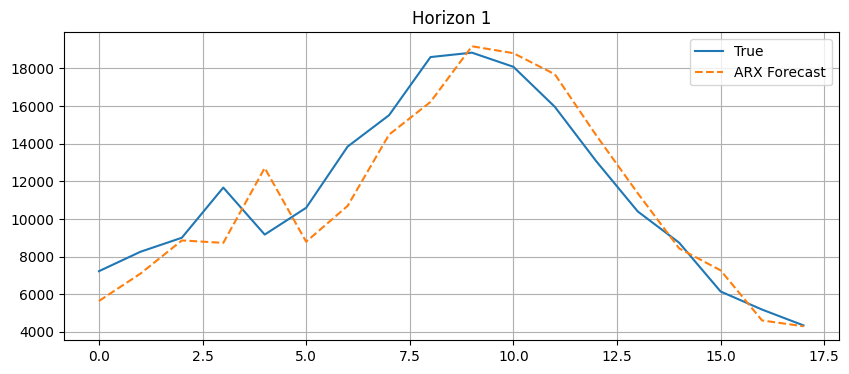

Horizon 2: MSE=0.2362, MAE=0.4087, SMAPE=21.35%


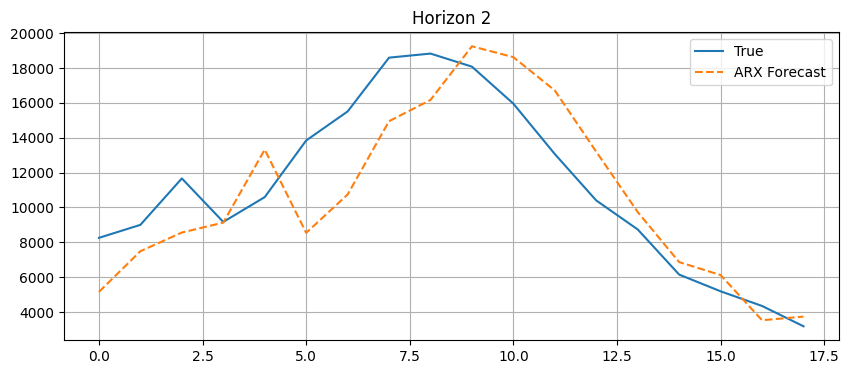

Horizon 3: MSE=0.4375, MAE=0.5126, SMAPE=25.71%


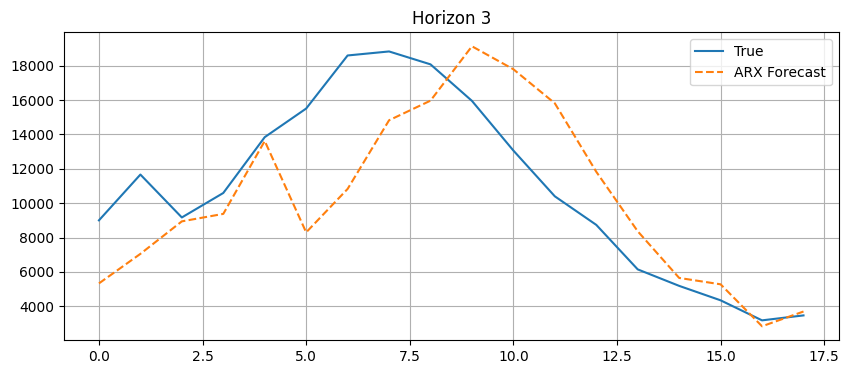

Horizon 4: MSE=0.7023, MAE=0.6639, SMAPE=36.25%


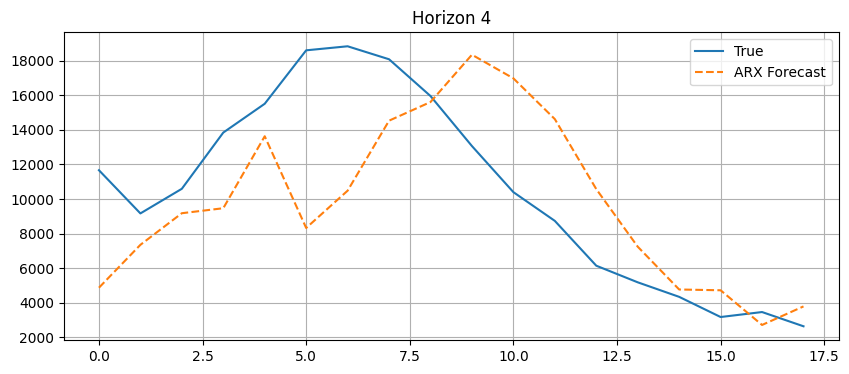

Horizon 5: MSE=0.8394, MAE=0.7658, SMAPE=43.35%


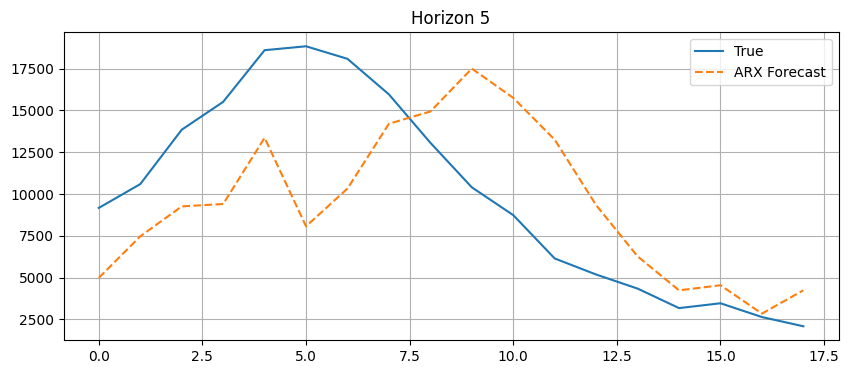

Horizon 6: MSE=1.0269, MAE=0.8741, SMAPE=52.68%


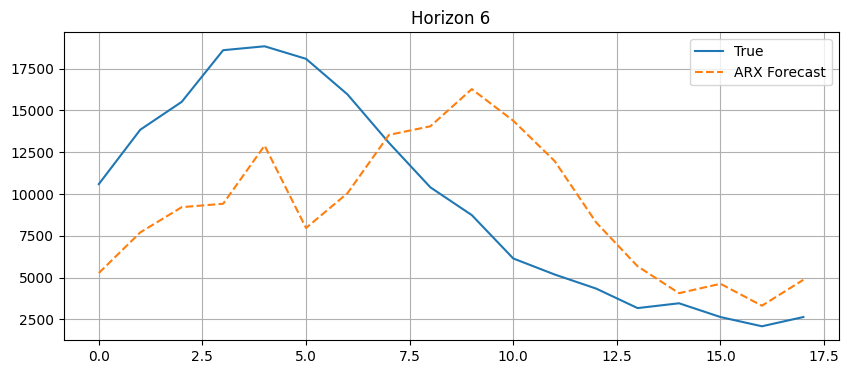

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg

# --- Utility: SMAPE metric ---
def smape(true, pred):
    return 100 * np.mean(2 * np.abs(pred - true) / (np.abs(true) + np.abs(pred)))

# --- Load and preprocess data ---
df = pd.read_csv("./../dataset/rag_data/data/covid_till14May22.csv")  # replace with actual file path
data = df[['new_deaths','icu_patients']]  # endogenous + exogenous

# data = np.log1p(data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

endog = data_scaled[:, 0]             # ICU patients (target)
exog = data_scaled[:, 1:]             # Exogenous variables
horizon = 6

# --- Split data ---
split = int(0.8 * len(endog))
train_y, test_y = endog[:split], endog[split:]
train_x, test_x = exog[:split], exog[split:]

# --- Rolling forecast with ARX ---
mse_global, mae_global, smape_global = [], [], []
predictions, truths = [], []

for i in range(len(test_y) - horizon):
    y_train_i = np.concatenate([train_y, test_y[:i]])
    x_train_i = np.vstack([train_x, test_x[:i]])

    model = AutoReg(endog=y_train_i, lags=6) #, exog=x_train_i)
    model_fit = model.fit()

    x_forecast = x_train_i #exog[split+i-9:split+i] #test_x[i-92:i] #[i:i + horizon]
    
        # Provide future exogenous variables for forecasting
    x_oos = test_x[i:i + horizon]
    pred = model_fit.predict(
        start=len(y_train_i),
        end=len(y_train_i) + horizon - 1,
#         exog_oos=x_oos,
#         exog=x_forecast
    )
    
    
#     pred = model_fit.predict(start=len(y_train_i), end=len(y_train_i) + horizon - 1, exog=x_forecast)
    true = test_y[i:i + horizon]

    predictions.append(pred)
    truths.append(true)

predictions = np.array(predictions)
truths = np.array(truths)

# --- Evaluate for each horizon ---
for h in range(horizon):
    trues = truths[:, h].reshape(-1, 1)
    preds = predictions[:, h].reshape(-1, 1)

    mse = mean_squared_error(trues, preds)
    mae = mean_absolute_error(trues, preds)

    # Inverse transform for SMAPE
    trues_full = np.hstack([trues, np.zeros((len(trues), 1))])
    preds_full = np.hstack([preds, np.zeros((len(preds), 1))])
#     trues_inv = np.expm1(scaler.inverse_transform(trues_full))[:, 0]
#     preds_inv = np.expm1(scaler.inverse_transform(preds_full))[:, 0]

    trues_inv = (scaler.inverse_transform(trues_full))[:, 0]
    preds_inv = (scaler.inverse_transform(preds_full))[:, 0]
    
    smape_val = smape(trues_inv, preds_inv)

    mse_global.append(mse)
    mae_global.append(mae)
    smape_global.append(smape_val)

    print(f"Horizon {h+1}: MSE={mse:.4f}, MAE={mae:.4f}, SMAPE={smape_val:.2f}%")

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(trues_inv, label="True")
    plt.plot(preds_inv, label="ARX Forecast", linestyle="--")
    plt.title(f"Horizon {h+1}")
    plt.legend()
    plt.grid()
    plt.show()


In [ ]:
'./../dataset/rag_data/data/covid_till14May22.csv'

(116, 8)


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packag

MSE: 0.5564
MAE: 0.5786
SMAPE: 22.2718%


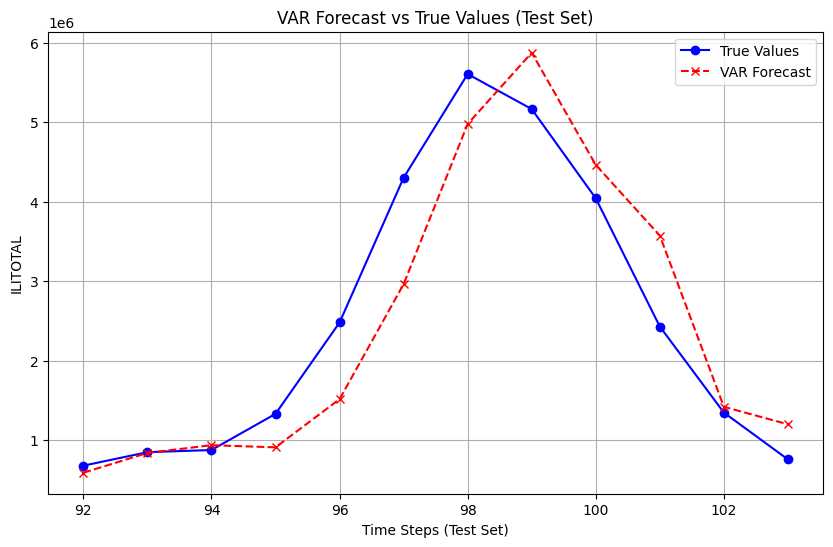

MSE: 2.9179
MAE: 1.3500
SMAPE: 51.4447%


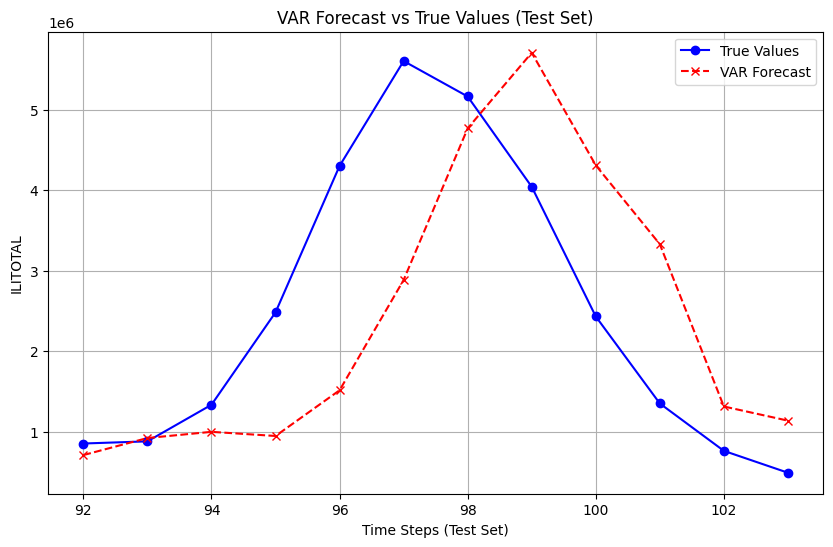

MSE: 6.0568
MAE: 1.9677
SMAPE: 73.8349%


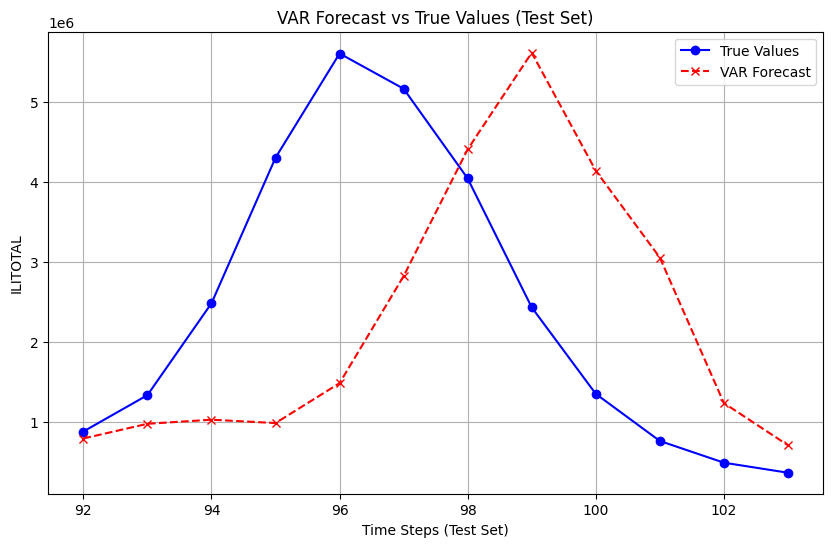

MSE: 8.7064
MAE: 2.4702
SMAPE: 98.4556%


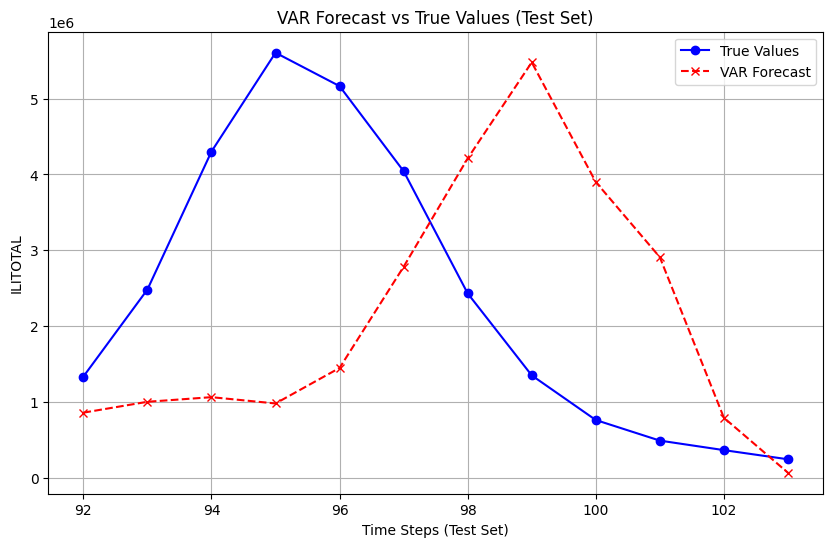

MSE: 10.3745
MAE: 2.7536
SMAPE: 117.5243%


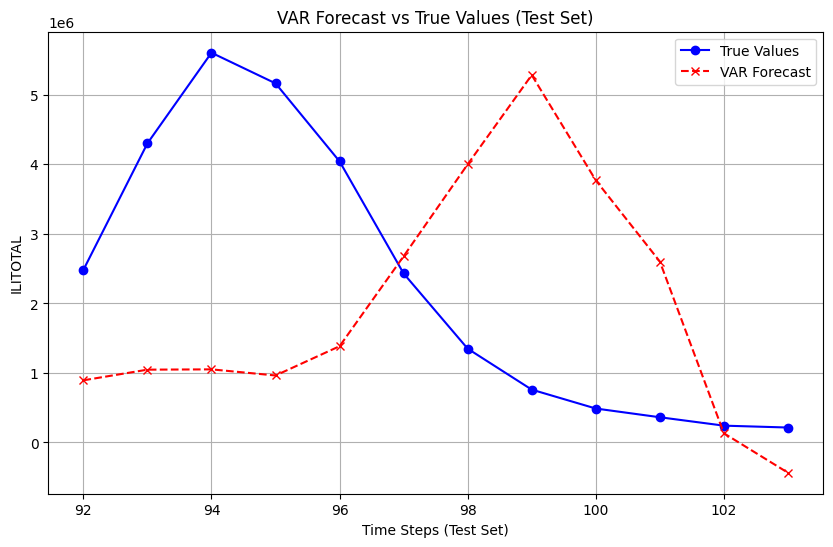

MSE: 10.9277
MAE: 2.9103
SMAPE: 139.1784%


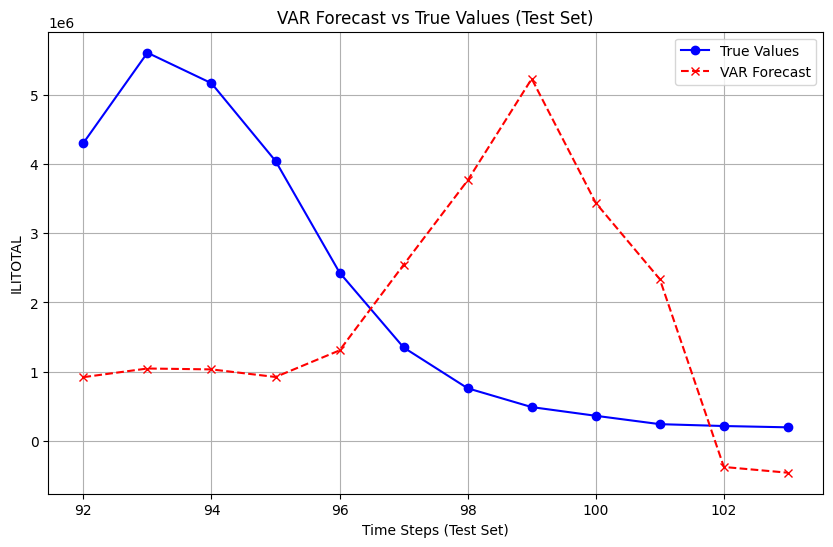

MSE: 10.1148
MAE: 2.6601
SMAPE: 138.7596%


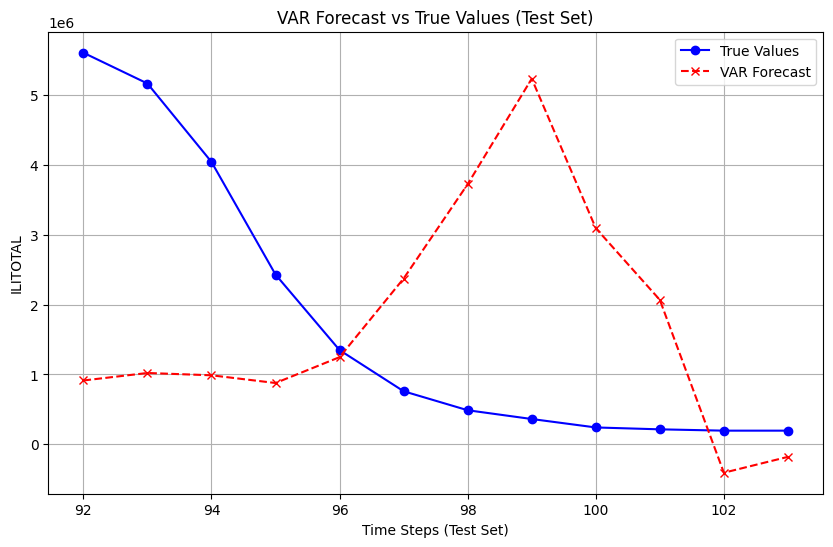

MSE: 8.0313
MAE: 2.2239
SMAPE: 122.5393%


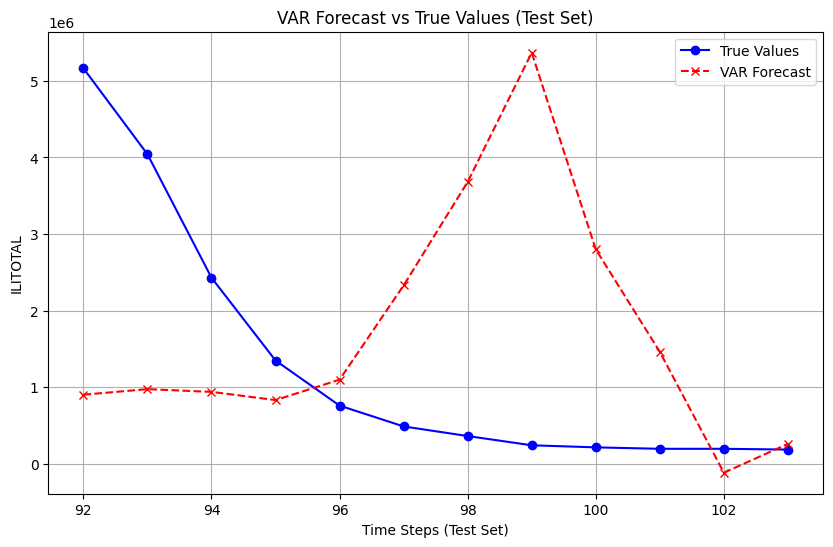

MSE: 6.1522
MAE: 1.7921
SMAPE: 105.7607%


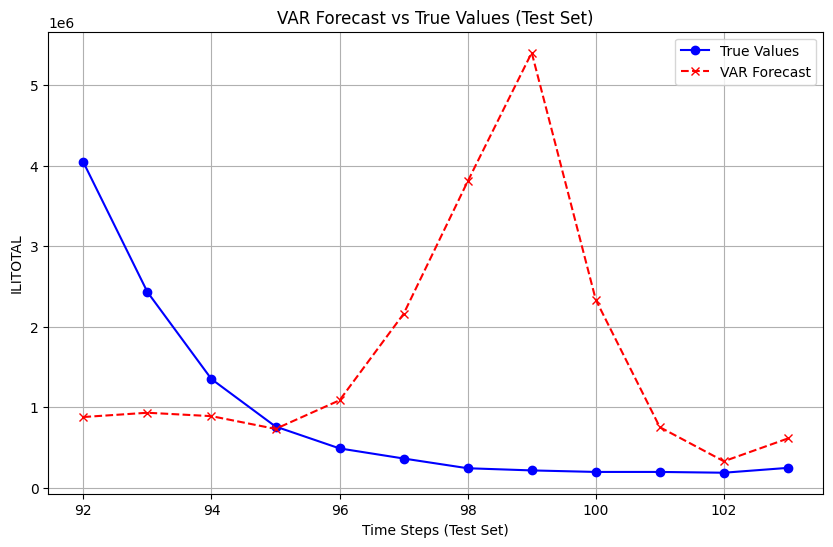

MSE: 4.3836
MAE: 1.4147
SMAPE: 94.9830%


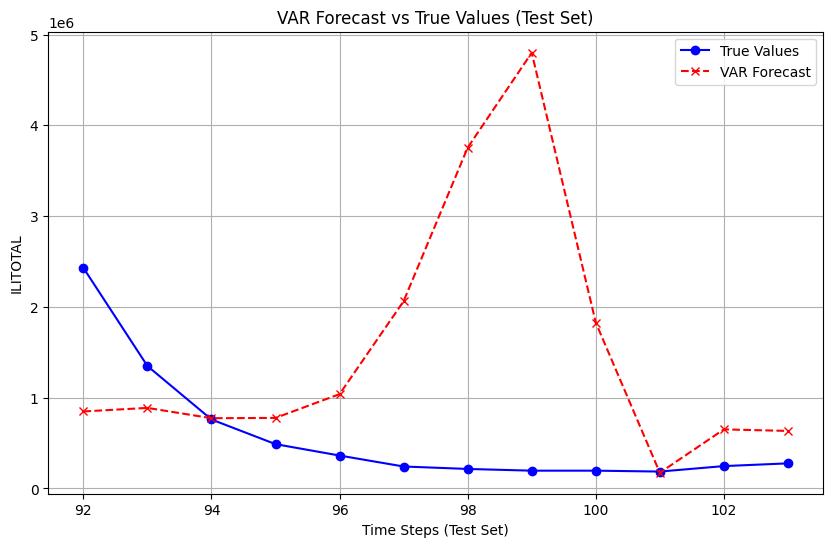

MSE: 2.6899
MAE: 1.1321
SMAPE: 102.9919%


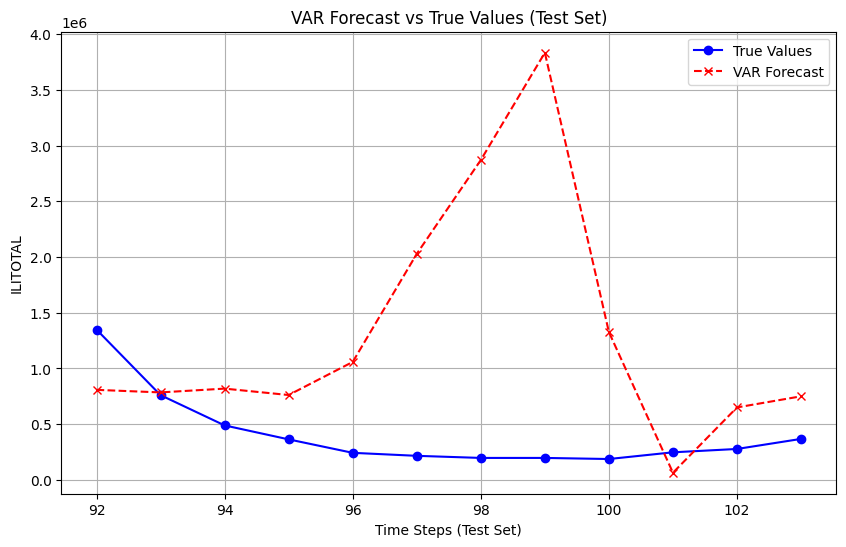

MSE: 1.6998
MAE: 0.9483
SMAPE: 96.3817%


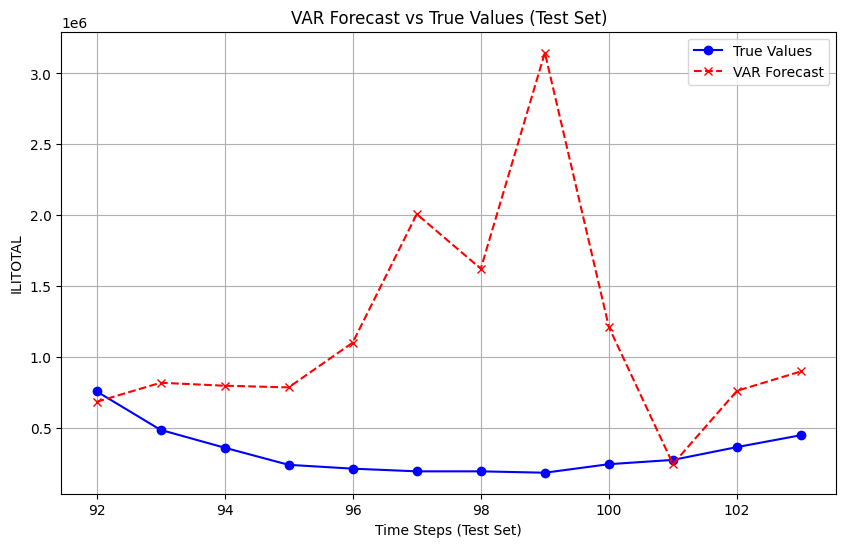

smape_value:  96.38167116419237 horizon: 12
horizon: 0, mse: 0.5563817559533243, mse: 0.5786221437381299, smape: 22.271781376484288
horizon: 1, mse: 2.9179212292990453, mse: 1.349952425441879, smape: 51.44469867123785
horizon: 2, mse: 6.056795411730653, mse: 1.9677143997800173, smape: 73.83486570677914
horizon: 3, mse: 8.706391530657454, mse: 2.4702295816736575, smape: 98.45562380303883
horizon: 4, mse: 10.374506825350462, mse: 2.7536113118465764, smape: 117.52434723719772
horizon: 5, mse: 10.927715702608708, mse: 2.9102912386777327, smape: 139.17841522485787
horizon: mean , mse: 6.050946893572661, mse: 1.850138454320905, smape: 97.01049494452246


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
#     updated_model = model.apply(train_series[horizon:,0:1])#, exog=train_series[:-horizon,1:])
    forecast = model.forecast( steps=horizon,exog=train_series[-horizon:,1:]) #, exog=exogenous_series[-horizon:])
    return forecast  # Only return the forecast for ILITOTAL (endogenous variable)

    


# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon, order, seasonal_order):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series)-horizon, horizon))
    true_values = np.zeros((len(test_series)-horizon, horizon))

    for i in range(len(test_series) - horizon):
        if i >-1:
            model = SARIMAX(endog=time_series[horizon:split_idx + i,0:1], exog=time_series[:split_idx + i-horizon,1:], order=order, seasonal_order=seasonal_order)
            model_fitted = model.fit(disp=False)


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

#         trues = np.expm1(trues)
#         preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/rag_data/data/covid_till14May22.csv')
    print(df.shape)
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
    time_series = np.array(df[['OT','icu_patients','hosp_patients','new_tests','people_vaccinated','people_fully_vaccinated','new_deaths']])

    #time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 6  # Forecast horizon (steps ahead)
    
    p=1
    d=0
    q=1
    P=1
    D=0
    Q=1
    S=9
    
#     for p in range(1,5):
#         for q in range(1,5)
    
    order = (p,d,q)
    seasonal_order = (P,D,Q,S)  # seasonality (s=12)
    
    for horizon in range(12,13):
        smape_value = evaluate_var(time_series,  horizon, order, seasonal_order)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(6):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
    print(f'horizon: mean , mse: {np.mean(mse_global)}, mse: {np.mean(mae_global)}, smape: {np.mean(smape_global)}')
        

#### SARIMAX

(262, 6)


/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/apps/eb/Anaconda3/2022.10/lib/python3.9/site-packag

MSE: 0.0540
MAE: 0.1658
SMAPE: 6.7197%


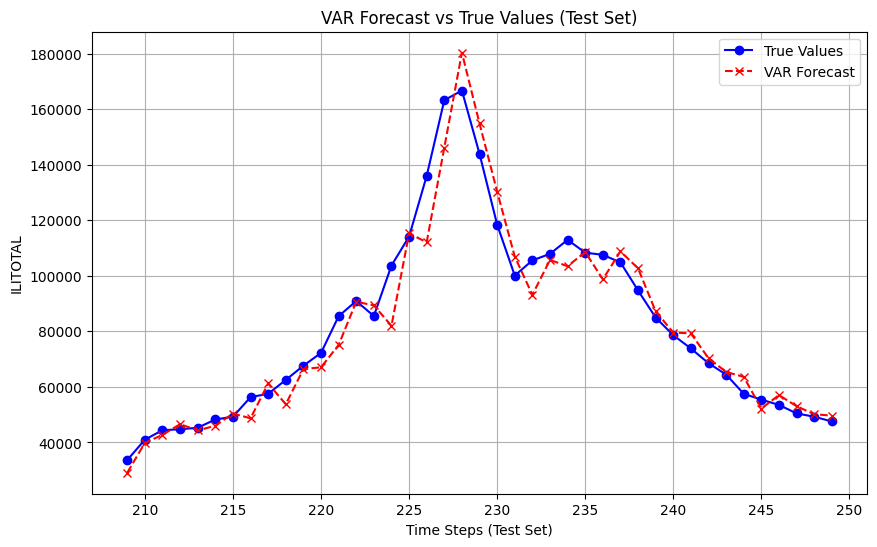

MSE: 0.2130
MAE: 0.3424
SMAPE: 13.4801%


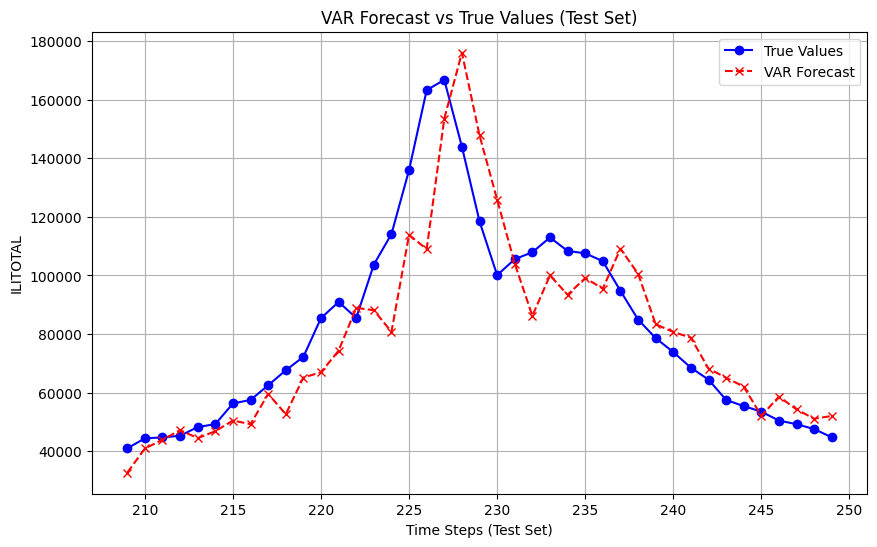

MSE: 0.4061
MAE: 0.4843
SMAPE: 19.3409%


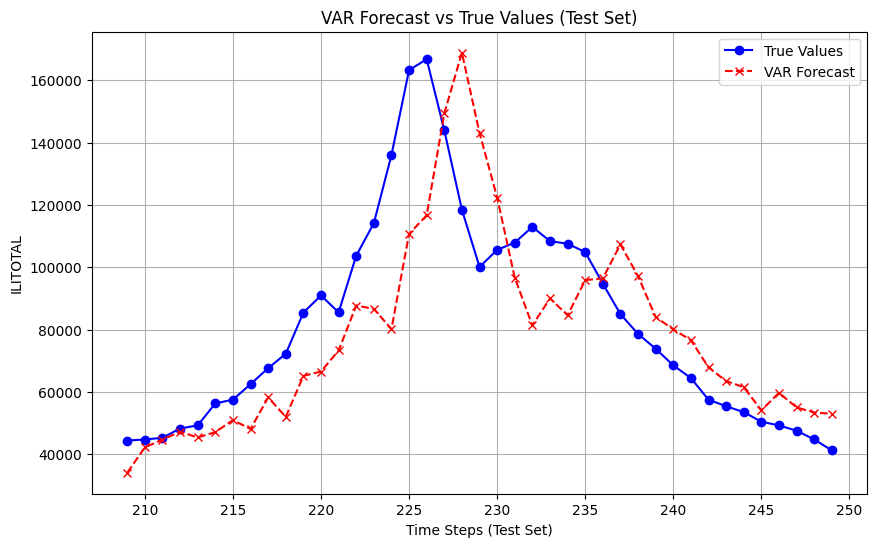

MSE: 0.6071
MAE: 0.6123
SMAPE: 25.1318%


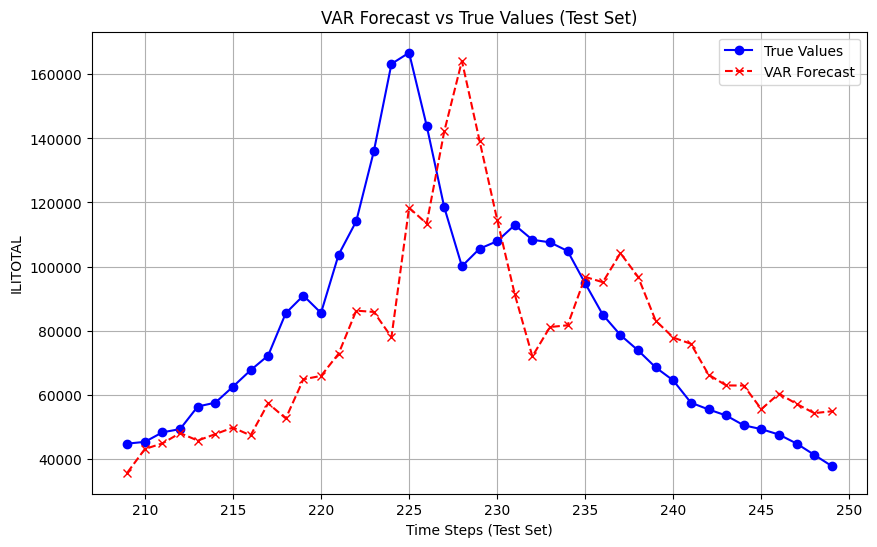

MSE: 0.7453
MAE: 0.7004
SMAPE: 29.8318%


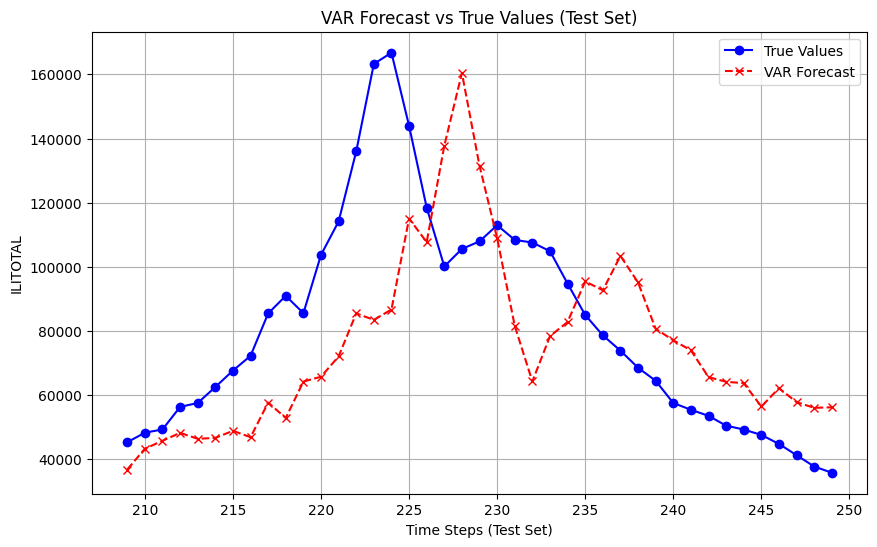

MSE: 0.8400
MAE: 0.7532
SMAPE: 33.2942%


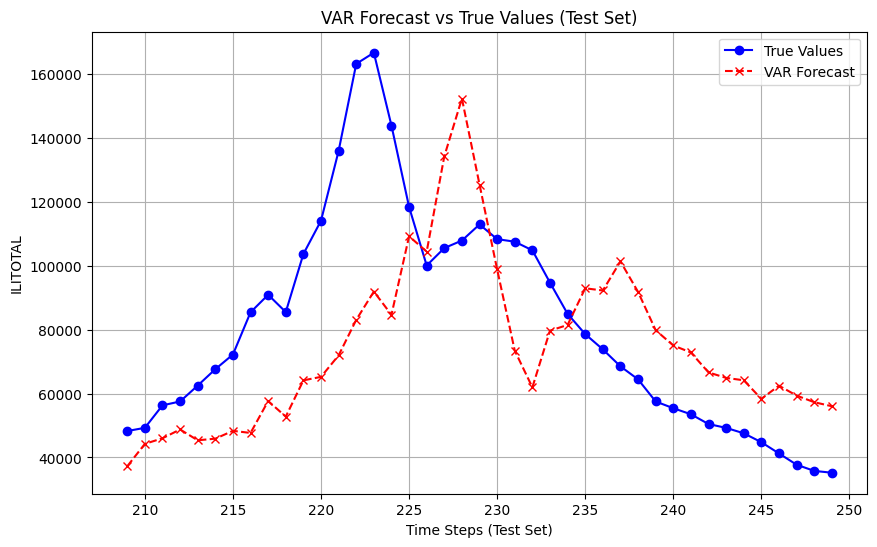

MSE: 0.9443
MAE: 0.7991
SMAPE: 36.3971%


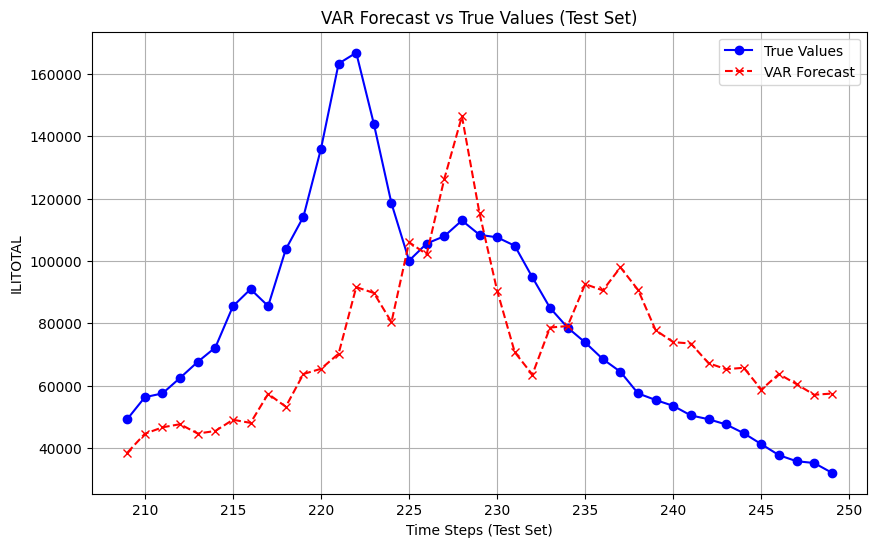

MSE: 1.0491
MAE: 0.8349
SMAPE: 38.9504%


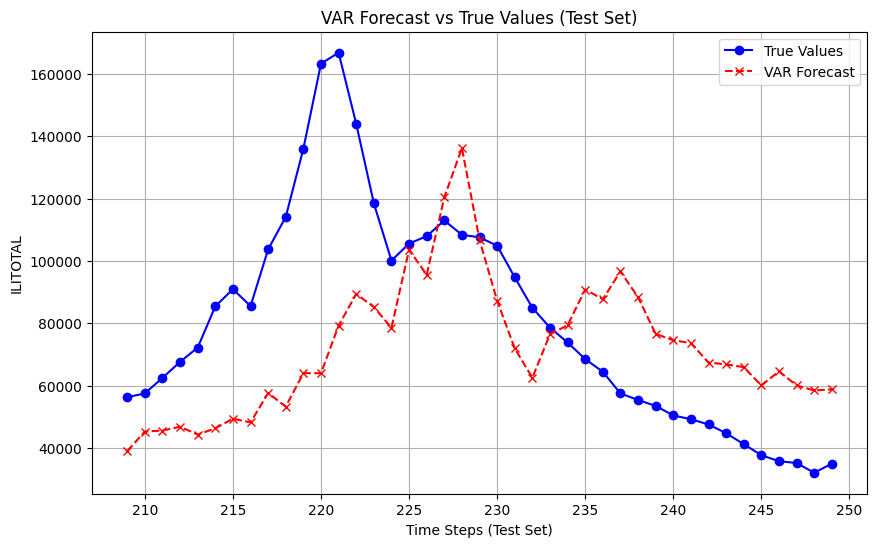

MSE: 1.1784
MAE: 0.8842
SMAPE: 41.7211%


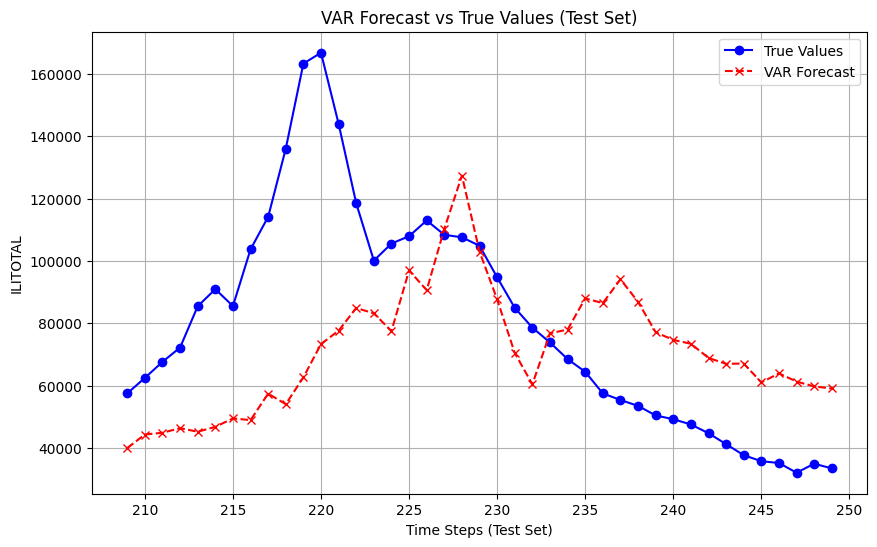

MSE: 1.2892
MAE: 0.9331
SMAPE: 44.1653%


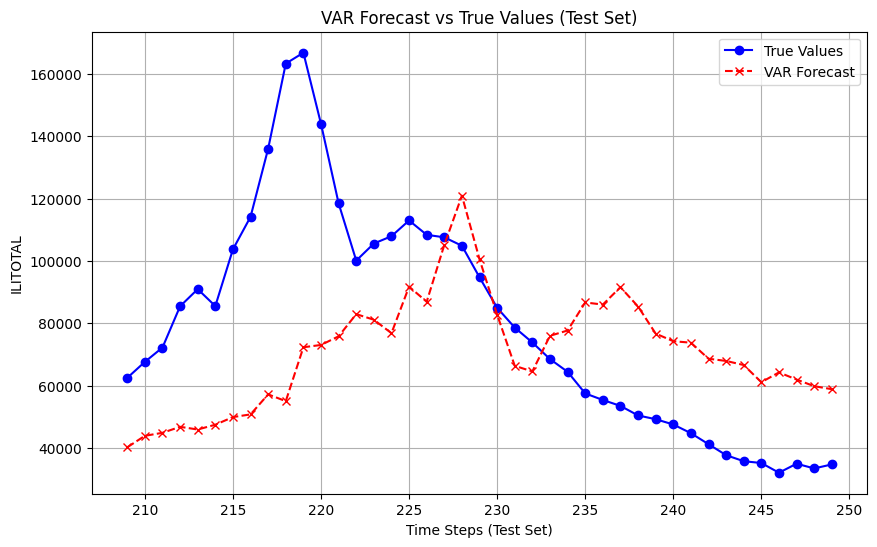

MSE: 1.3823
MAE: 0.9761
SMAPE: 46.1414%


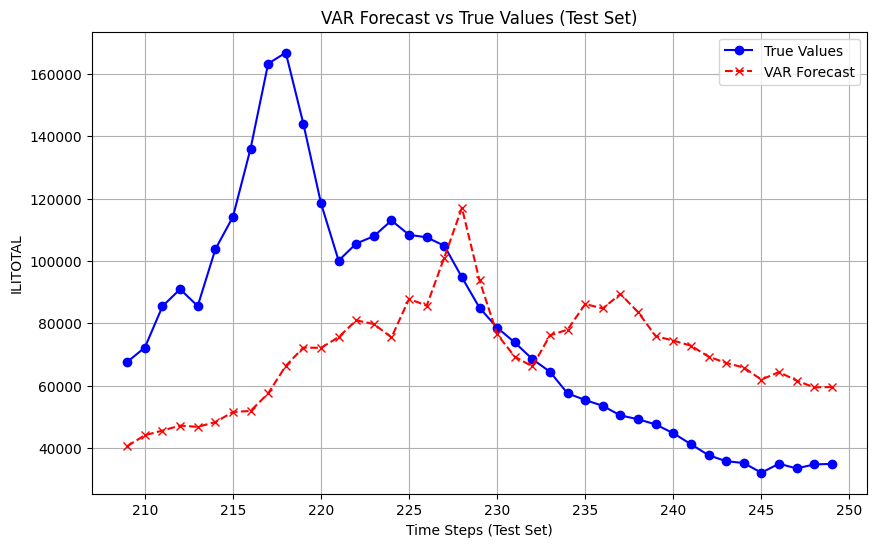

MSE: 1.4667
MAE: 1.0153
SMAPE: 48.0542%


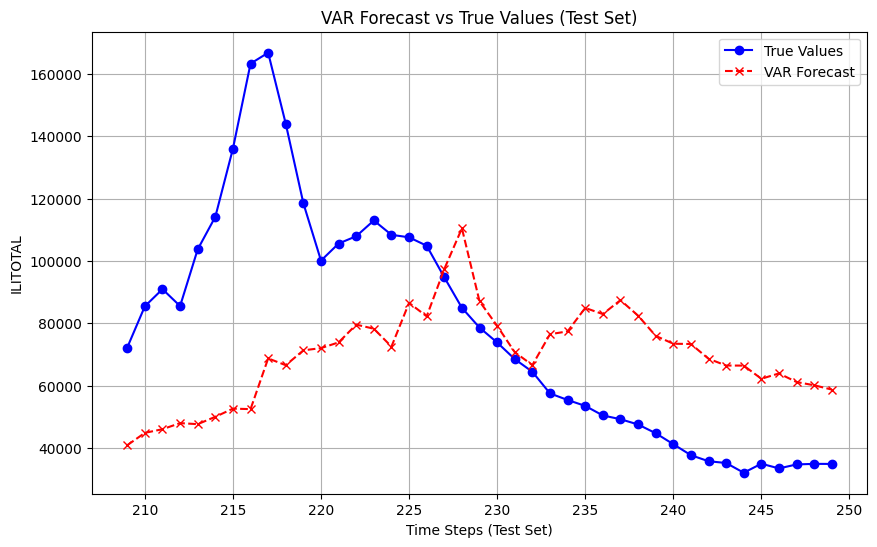

smape_value:  48.05423169766657 horizon: 12
horizon: 0, mse: 0.05397959356522273, mse: 0.16577753432350265, smape: 6.71965085838922
horizon: 1, mse: 0.2129704566076, mse: 0.34235205577532973, smape: 13.48013195605447
horizon: 2, mse: 0.4060538815678624, mse: 0.4842537106009383, smape: 19.34093603237749
horizon: 3, mse: 0.6070820323393842, mse: 0.6123203320352433, smape: 25.13178896229824
horizon: 4, mse: 0.7453254360628451, mse: 0.700371539868143, smape: 29.831773144046654
horizon: 5, mse: 0.840011373535218, mse: 0.7532087827945871, smape: 33.29417055576372
horizon: 6, mse: 0.944266221754743, mse: 0.7991132695634228, smape: 36.397082455162185
horizon: 7, mse: 1.049145976241285, mse: 0.834929260563831, smape: 38.950399487030325
horizon: 8, mse: 1.1783674414753327, mse: 0.8841763081728831, smape: 41.72105220350039
horizon: 9, mse: 1.2891779824953924, mse: 0.9331161478033096, smape: 44.16531676213067
horizon: 10, mse: 1.3823497857913691, mse: 0.9760767141185089, smape: 46.14137289329997
h

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
scaler = StandardScaler()

mse_global = []
mae_global = []
smape_global = []

# Define function for SMAPE calculation
def smape(true_values, predicted_values):
    return 100 * np.mean(2 * np.abs(predicted_values - true_values) / (np.abs(predicted_values) + np.abs(true_values)))

# Define VAR forecasting function
def var_forecast(train_series,  horizon, model):
    """
    Inputs:
        train_series (array-like): The training part of the time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The number of steps to forecast.
        model (VARResults): The fitted VAR model.
    Outputs:
        forecast (array-like): The forecasted values for the given horizon.
    """
    # print("data now:", train_series[-model.k_ar:])
#     updated_model = model.apply(train_series[horizon:,0:1])#, exog=train_series[:-horizon,1:])
    forecast = model.forecast( steps=horizon,exog=train_series[-horizon:,1:]) #, exog=exogenous_series[-horizon:])
    return forecast  # Only return the forecast for ILITOTAL (endogenous variable)

    


# Define function to evaluate VAR model with rolling window
def evaluate_var(time_series,  horizon, order, seasonal_order):
    """
    Inputs:
        time_series (array-like): The full input time series data (endogenous variable).
        exogenous_series (array-like): The exogenous variable data.
        horizon (int): The individual forecast horizon (steps ahead).
    Outputs:
        Plots of estimated vs true values on the entire test set, and prints MSE, MAE, and SMAPE.
    """
    # Split the time series into training (80%) and test sets
    split_idx = int(0.8 * len(time_series))
    train_series = time_series[:split_idx]
    test_series = time_series[split_idx:]
    # print("train_series shape:", train_series.shape)
    # print("test_series shape:", test_series.shape)
    # Rolling window predictions
    predictions = np.zeros((len(test_series)-horizon, horizon))
    true_values = np.zeros((len(test_series)-horizon, horizon))

    for i in range(len(test_series) - horizon):
        if i >-1:
            model = SARIMAX(endog=time_series[horizon:split_idx + i,0:1], exog=time_series[:split_idx + i-horizon,1:], order=order, seasonal_order=seasonal_order)
            model_fitted = model.fit(disp=False)


        # print("train_series shape now:", time_series[:split_idx + i].shape)

        # Forecast for the given horizon using test exogenous values
        forecast = var_forecast(time_series[:split_idx + i], horizon, model_fitted)
        # print(forecast)
        predictions[i,:] = np.array(forecast)  # Take the final step forecast
        true_values[i,:] = np.array(test_series[i:i + horizon,0])

    # Convert to arrays for metric calculation
    predictions = np.array(predictions)
    true_values = np.array(true_values)

    
#     scaler.fit(train_series)
    
    for h in range(horizon):
        trues = true_values[:,h]
        preds = predictions[:,h]

        # true_values = true_values[:,0]
        # print(true_values.shape)
        # print(predictions)
        # Compute metrics
        trues = trues.reshape((len(trues),1))
        preds = preds.reshape((len(preds),1))

        mse = mean_squared_error(trues, preds)
        mae = mean_absolute_error(trues, preds)
        
#         print("true_values.shape:", trues.shape)
#         print(np.zeros((len(trues),2)).shape)
        trues = np.hstack((trues,np.zeros((len(trues),train_series.shape[1]-1)) ))
        preds = np.hstack((preds,np.zeros((len(preds),train_series.shape[1]-1)) ))


        
        trues = scaler.inverse_transform(trues)
        preds = scaler.inverse_transform(preds)
        trues = trues[:,0]
        preds = preds[:,0]

#         trues = np.expm1(trues)
#         preds = np.expm1(preds)

        smape_value = smape(trues, preds)

        mse_global.append(mse); mae_global.append(mae); smape_global.append(smape_value);
                
        
        # Print evaluation metrics
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"SMAPE: {smape_value:.4f}%")

        # Plot true vs forecasted values for the test set
        plt.figure(figsize=(10, 6))
        plt.plot(range(split_idx , len(time_series) - horizon), trues, label='True Values', color='blue', marker='o', linestyle='-')
        plt.plot(range(split_idx , len(time_series) - horizon), preds, label='VAR Forecast', color='red', linestyle='--', marker='x')
        plt.title(f'VAR Forecast vs True Values (Test Set)')
        plt.xlabel('Time Steps (Test Set)')
        plt.ylabel('ILITOTAL')
        plt.legend()
        plt.grid(True)
        plt.show()
    return smape_value

# Example usage
if __name__ == "__main__":
    # Example time series (you can replace this with your actual data)
#     df = pd.read_csv('national_illness_24.csv')
    
    df = pd.read_csv('./../dataset/illness/national_illness_24_4.csv')
    print(df.shape)
#     time_series = np.array(df['ILITOTAL'])
    
    # time_series = np.array(df[['ILITOTAL', 'OT']])  # Endogenous variable
    time_series = np.array(df[['ILITOTAL','OT','NUM. OF PROVIDERS','h','c']])

    #time_series = np.log1p(time_series)
    scaler.fit(time_series)
    time_series = scaler.transform(time_series)
    horizon = 12  # Forecast horizon (steps ahead)
    
    p=1
    d=0
    q=1
    P=1
    D=0
    Q=1
    S=9
    
#     for p in range(1,5):
#         for q in range(1,5)
    
    order = (p,d,q)
    seasonal_order = (P,D,Q,S)  # seasonality (s=12)
    
    for horizon in range(12,13):
        smape_value = evaluate_var(time_series,  horizon, order, seasonal_order)
        print("smape_value: ", smape_value,"horizon:",horizon)

    for horizon in range(12):
        print(f'horizon: {horizon}, mse: {mse_global[horizon]}, mse: {mae_global[horizon]}, smape: {smape_global[horizon]}')
    print(f'horizon: mean , mse: {np.mean(mse_global)}, mse: {np.mean(mae_global)}, smape: {np.mean(smape_global)}')
        

In [33]:
0.3*262

78.6